In [2]:
import sys
print(sys.path)
sys.path.insert(0, '/eos/user/a/arouyer/.local/lib/python3.9/site-packages')

import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print("Python version")
print (sys.version)
print("Version info.")
print (sys.version_info)

['/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/itk', '/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/python', '/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib', '', '/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc8-opt/lib/python39.zip', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc8-opt/lib/python3.9', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc8-opt/lib/python3.9/lib-dynload', '/eos/user/a/arouyer/.local/lib/python3.9/site-packages', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages', '/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/IPython/extensions', '/scratch/arouyer/.ipython']
The scikit-learn version is 1.2.0.
Python version

In [3]:
import awkward as ak
import glob
import numpy as np
import uproot as uproot
import matplotlib
import matplotlib.colors
import matplotlib.pyplot as plt
from matplotlib import cm
import networkx as nx
import pandas as pd

import torch
from torch import nn
import torch.nn.functional as F
from torch_geometric.loader import DataLoader
import torch_geometric as pyg
from sklearn.manifold import TSNE
from sklearn import metrics
import tqdm

from sklearn.metrics import DetCurveDisplay, RocCurveDisplay, PrecisionRecallDisplay
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import class_likelihood_ratios, precision_recall_fscore_support


%matplotlib inline
from matplotlib import rc
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'

In [4]:
def list_flatten(my_list):
    return [item for sublist in my_list for item in sublist]

def reco_to_sim_score_evaluation(dataset, predictions, thr, numevents=1000, PU=False):
    
    reco_sim_scores_list, best_sim_matches_list, pred_cluster_energies_list, truth_cluster_energies_list = [], [], [], []
    cand_sim_scores_list, cand_best_sim_matches_list, cand_energies_list = [], [], []
    
    for ev in tqdm(range(numevents)):
        event = dataset[ev]
        E = event.x[:, 16]
        cluster_labels_candidate = event.candidate_match
        truth_cluster_labels = event.best_simTs_match
        num_truth_clusters = int(max(truth_cluster_labels)+1)

        truth_clusters = [[] for i in range(num_truth_clusters)]
        for t, l in enumerate(truth_cluster_labels):
            truth_clusters[int(l)].append(t)
            
        clusters_candidate = [[] for i in range(int(max(cluster_labels_candidate))+1)]
        for ts, cand in enumerate(cluster_labels_candidate):
            clusters_candidate[int(cand)].append(ts)
            
        truth_cluster_energies = []
        for t_cluster in truth_clusters:
            clusterE = 0
            for t in t_cluster:
                clusterE += E[t].item()
            truth_cluster_energies.append(clusterE)
        
        predicted_clusters, _ = find_connected_components(event, predictions[ev], edge_index=None, thr=thr, PU=PU)
        
        reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(predicted_clusters, truth_cluster_labels, truth_cluster_energies, E.tolist())
        cand_sim_scores, cand_best_sim_matches, cand_energies = scores_reco_to_sim(clusters_candidate,  truth_cluster_labels, truth_cluster_energies, E.tolist())
        
#         print(f"RECO-SIM scores : {reco_sim_scores}")
#         print(f"Best SIM matches : {best_sim_matches}")

#         print(f"Predicted cluster energies (GeV) : {pred_cluster_energies}")
#         print(f"Truth cluster energies (GeV) : {truth_cluster_energies}\n")

        reco_sim_scores_list.append(reco_sim_scores)
        best_sim_matches_list.append(best_sim_matches)
        pred_cluster_energies_list.append(pred_cluster_energies)
        truth_cluster_energies_list.append(truth_cluster_energies)
        cand_sim_scores_list.append(cand_sim_scores)
        cand_best_sim_matches_list.append(cand_best_sim_matches)
        cand_energies_list.append(cand_energies)
        
    return reco_sim_scores_list, best_sim_matches_list, pred_cluster_energies_list, truth_cluster_energies_list, cand_sim_scores_list, cand_best_sim_matches_list, cand_energies_list

In [5]:
# a function to determine which supertrackster each trackster belongs to given the prediction score
from collections import defaultdict

def find_connected_components(event, predictions, edge_index=None, thr=0.9, PU=False):
    """
    if PU is false, it doesn't assign each -1 to a separate cluster
    """
    components = []
    predicted_cluster_ids = np.array([-1 for i in range(event.x.shape[0])])
    
    graph = defaultdict(set)
    i = 0
    # only for nodes that are connected with an edge, normally would also have to add nodes that are not connected to anything
    if edge_index == None:
        edge_index = event.edge_index.cpu().numpy().T
    else:
        edge_index = edge_index.cpu().numpy().T
    for u, v in edge_index:
        if predictions[i] >= thr:
            graph[u].add(v)
            graph[v].add(u)
        i += 1
    
    j = 0
    for component in connected_components(graph):
        c = list(set(component))
        components.append(c)
        predicted_cluster_ids[c] = j
        j += 1
        
    #print(components)
    #print(predicted_cluster_ids)
    if not PU:
        unassigned = np.where(predicted_cluster_ids == -1)[0]
        #print(unassigned)
        max_cl_id = np.max(predicted_cluster_ids)
        predicted_cluster_ids[unassigned] = range(max_cl_id+1, max_cl_id+unassigned.shape[0]+1) 
        for un_id in unassigned:
            components.append([un_id])
    #print(components)
    #print(predicted_cluster_ids)
    #print("----")
    return components, predicted_cluster_ids

def connected_components(neighbors):
    seen = set()
    def component(node):
        nodes = set([node])
        while nodes:
            node = nodes.pop()
            seen.add(node)
            nodes |= neighbors[node] - seen
            yield node
    for node in neighbors:
        if node not in seen:
            yield component(node)
            
            
def plot_pred_distr(lab, pred, decision_th = 0.6):

    #pred = pred.cpu().detach().numpy()
    #targets = targets.cpu().detach().numpy()

    lab = np.array(lab)

    fig = plt.figure(figsize=(14, 4))
    fig.suptitle('Distributions of the labels', size=18)

    ax1 = fig.add_subplot(141)
    ax1.set_title('Prediction distribution')
    ax1.hist(pred, bins=20)

    ax2 = fig.add_subplot(142)
    ax2.hist(lab, bins=20)
    ax2.set_title('True Edge Labels')
    thresholded = (np.array(pred) > decision_th).astype(int)

    ax3 = fig.add_subplot(143)
    ax3.set_title(f'Predicted Edge Labels for thr: {decision_th}')
    ax3.hist(thresholded, bins=20)
    
    correct_pos = thresholded == lab
    correct_pos &= thresholded == 1
    correct_pos = sum(correct_pos)
    
    correct_neg = thresholded == lab
    correct_neg &= thresholded == 0
    correct_neg = sum(correct_neg)
    
    incorrect_pos = thresholded != lab
    incorrect_pos &= thresholded == 1
    incorrect_pos = sum(incorrect_pos)
    
    incorrect_neg = thresholded != lab
    incorrect_neg &= thresholded == 0
    incorrect_neg = sum(incorrect_neg)
    
    ax4 = fig.add_subplot(144)
    
    width = 0.1
    x = np.arange(2)
    ax4.bar(x-0.05, [correct_neg, incorrect_neg], width, label='Negative')
    ax4.bar(x+0.05, [incorrect_pos, correct_pos], width, label='Positive')
    ax4.legend()

    print(f"Edge labels: number of positive: {lab.sum()}")
    print(f"Predictions: number of positive: {thresholded.sum()}")

    plt.tight_layout()
    plt.show()
    
    
def plot_roc(lab, pred):
    fpr, tpr, _ = roc_curve(lab, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color="darkorange", label="ROC curve (area = %0.2f)" % roc_auc)
    plt.plot([0, 1], [0, 1], color="navy", linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic")
    plt.legend(loc="lower right")
    plt.show()
    
def plot_tsne(event, predicted_cluster_ids, embs, energy, feature_type='', energy_factor=10):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

    unique_supertr = np.array(np.unique(predicted_cluster_ids), dtype=np.int32)
    supertr_idxs = [np.where(predicted_cluster_ids == idx) for idx in unique_supertr]

    dict_emb = {unigue_idx : (embs[supertr_idx], energy[supertr_idx]) for unigue_idx, supertr_idx in zip(unique_supertr, supertr_idxs)}


    for key, (e, en) in dict_emb.items():
        if key == -1:
            ax1.scatter(e[:, 0], e[:, 1], s=energy_factor*en, alpha=0.5, label=key) # edgecolors='k')
        else:
            ax1.scatter(e[:, 0], e[:, 1], s=energy_factor*en, alpha=0.8, label=key) # edgecolors='k')

    ax1.set_title(f"T-SNE visualization of {feature_type} ({embs.shape[0]} tracksters).\nPredicted SuperTracksters ({unique_supertr.shape[0]})", size=18)

    ####################################

    unique_supertr = np.array(event.best_simTs_match.cpu().unique(), dtype=np.int32)
    supertr_idxs = [np.where(event.best_simTs_match.cpu() == idx) for idx in unique_supertr]

    dict_emb = {unigue_idx : (embs[supertr_idx], energy[supertr_idx]) for unigue_idx, supertr_idx in zip(unique_supertr, supertr_idxs)}


    for key, (e, en) in dict_emb.items():
        if key == -1:
            ax2.scatter(e[:, 0], e[:, 1], s=energy_factor*en, alpha=0.5, label=key) # edgecolors='k')
        else:
            ax2.scatter(e[:, 0], e[:, 1], s=energy_factor*en, alpha=0.8, label=key) #, edgecolors='k')

    #plt.legend(bbox_to_anchor=(1, 0.5), loc='upper left')

    ax2.set_title(f"T-SNE visualization of {feature_type} ({embs.shape[0]} tracksters).\nTrue SuperTracksters ({unique_supertr.shape[0]})", size=18)

    plt.show()

In [6]:
from matplotlib.lines import Line2D   

def plotTrackster2D(fig, ax2, y, z, match, plot_missed=True, plot_only_true=False, energy=None,
                    indexes=None, edges=None, edges_t=None, proj=None, plot_all_initial_edges=False, all_edges=None):
    fs = 16
    
    if not plot_only_true and not plot_all_initial_edges:
        for ind in edges:
            if(ind not in edges_t):
                if len(ind) == 0:
                    continue
                idx0, idx1 = ind[0], ind[1]
                ax2.plot([y[idx0], y[idx1]], [z[idx0], z[idx1]], 'red', lw = 0.5, label = "Wrong Edges", zorder=0, alpha=0.5)
            else:
                if len(ind) == 0:
                    continue
                idx0, idx1 = ind[0], ind[1]
                ax2.plot([y[idx0], y[idx1]], [z[idx0], z[idx1]], 'black', lw = 0.5, label = "Correct Edges", zorder=0, alpha=0.5)
        if plot_missed:
            for t_ind in edges_t:
                if(t_ind not in edges):
                    if len(t_ind) == 0:
                        continue
                    idx0, idx1 = t_ind[0], t_ind[1]
                    ax2.plot([y[idx0], y[idx1]], [z[idx0], z[idx1]], 'blue', lw = 0.5, label = "Missed Edges", zorder=0, alpha=0.5)
    elif plot_all_initial_edges:
        for t_ind in all_edges:
            if len(t_ind) == 0:
                continue
            idx0, idx1 = t_ind[0], t_ind[1]
            ax2.plot([y[idx0], y[idx1]], [z[idx0], z[idx1]], 'black', lw = 0.5, label = "Initial Edges", zorder=0, alpha=0.5)
    else:
        for t_ind in edges_t:
            if len(t_ind) == 0:
                continue
            idx0, idx1 = t_ind[0], t_ind[1]
            ax2.plot([y[idx0], y[idx1]], [z[idx0], z[idx1]], 'black', lw = 0.5, label = "True Edges", zorder=0, alpha=0.5)
    
        
            
    simTr = np.unique(match)
    colors = cm.rainbow(np.linspace(0, 1, len(simTr)))

    for y_t, z_t, e_t, m_t in zip(y, z, energy, match):
        ax2.scatter(y_t, z_t, s=e_t*10, alpha=0.7, zorder=1, c=colors[int(m_t)].reshape(1,-1), edgecolors='k', linewidth=1)

    ax2.tick_params(axis='x', labelsize=fs)
    ax2.tick_params(axis='y', labelsize=fs)
    ax2.set_xlabel(proj[0] + " (cm)", fontsize = fs)
    ax2.set_ylabel(proj[1] + " (cm)", fontsize = fs) 

def plotTrackster3D(fig, ax, x, y, z, match, plot_missed=True, plot_only_true=False, energy=None, indexes=None, edges=None, edges_t = None,
                    label='Trackster Energy (GeV)', plot_all_initial_edges=False, all_edges=None):
    fs = 15
    missed, correct, wrong = 0, 0, 0
    
    ax.set_xlabel('Z (cm)', fontsize = fs)
    ax.set_ylabel('X (cm)', fontsize = fs)
    ax.set_zlabel('Y (cm)', fontsize = fs)
    
    if not plot_only_true and not plot_all_initial_edges:

        for ind in edges:

            if len(ind) == 0: continue
            idx0, idx1 = ind[0], ind[1]

            if(ind not in edges_t):
                wrong += 1
                ax.plot([x[idx0], x[idx1]], [y[idx0], y[idx1]], [z[idx0], z[idx1]],
                    'red', lw = 0.5, label = "Wrong Edges", alpha=0.5)
            else:
                correct += 1
                ax.plot([x[idx0], x[idx1]], [y[idx0], y[idx1]], [z[idx0], z[idx1]],
                    'black', lw = 0.5, label = "Correct Edges", alpha=0.5)

        if plot_missed:
            for t_ind in edges_t:
                if(t_ind not in edges):
                    missed += 1

                    if len(t_ind) == 0: continue
                    idx0, idx1 = t_ind[0], t_ind[1]

                    ax.plot([x[idx0], x[idx1]], [y[idx0] ,y[idx1]], [z[idx0] ,z[idx1]],
                        'blue', lw = 0.5, label = "Missed Edges", alpha=0.5)
    elif plot_all_initial_edges:
        for t_ind in all_edges:
            
            if len(t_ind) == 0: continue
            idx0, idx1 = t_ind[0], t_ind[1]
            
            ax.plot([x[idx0] ,x[idx1]], [y[idx0] ,y[idx1]], [z[idx0] ,z[idx1]],
                'black', lw = 0.5, label = "Initial Edges", alpha=0.7)
    else:
        for t_ind in edges_t:
            
            if len(t_ind) == 0: continue
            idx0, idx1 = t_ind[0], t_ind[1]
            
            ax.plot([x[idx0] ,x[idx1]], [y[idx0] ,y[idx1]], [z[idx0] ,z[idx1]],
                'black', lw = 0.5, label = "True Edges", alpha=0.7)
            
    simTr = np.unique(match)
    colors = cm.rainbow(np.linspace(0, 1, len(simTr)))

    for x_t, y_t, z_t, e_t, m_t in zip(x, y, z, energy, match):
        ax.scatter(x_t, y_t, z_t, s=e_t*10, alpha=0.7, zorder=1, edgecolors='k', linewidth=1, c=colors[int(m_t)].reshape(1,-1))
        
        
    if not plot_only_true and plot_missed and not plot_all_initial_edges:
        print(f"Edges:\tCorrect num: {correct}, Wrong num: {wrong}, Missed num: {missed}")
    elif plot_all_initial_edges:
        init_edge_num = len(all_edges)
        pred_edge_num = len(edges)
        print(f"Edges:\tInitial num: {init_edge_num} Removed by NN: {init_edge_num - pred_edge_num}")
    else:
        print(f"Edges:\tTrue num: {len(edges_t)}")
    ax.tick_params(axis='x', labelsize=fs)
    ax.tick_params(axis='y', labelsize=fs)
    ax.tick_params(axis='z', labelsize=fs)

def plotTrackster(x, y, z, t_match, predicted_match=None, plot_missed=True,
                  plot_only_true=False, energy=None, indexes=None, edges=None, edges_t=None, plot_all_initial_edges=False, all_edges=None):
    
    if predicted_match is None or plot_only_true or plot_all_initial_edges:
        fig = plt.figure(figsize=(12,12))
        ax = fig.add_subplot(221, projection='3d')
        ax2 = fig.add_subplot(222)
        ax3 = fig.add_subplot(223)
        ax4 = fig.add_subplot(224)
    else:
        fig = plt.figure(figsize=(30,25)) 
        ax = fig.add_subplot(441, projection='3d')
        ax2 = fig.add_subplot(442)
        ax3 = fig.add_subplot(443)
        ax4 = fig.add_subplot(444)       
    
    plotTrackster3D(fig, ax, x, y, z, t_match, 
                    plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, 
                    plot_all_initial_edges=plot_all_initial_edges, all_edges=all_edges)
    ## XY
    plotTrackster2D(fig, ax2, y, z, t_match, 
                    plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["X", "Y"],
                    plot_all_initial_edges=plot_all_initial_edges,  all_edges=all_edges)
    ## XZ
    plotTrackster2D(fig, ax3, y, x, t_match, 
                    plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["X", "Z"], 
                    plot_all_initial_edges=plot_all_initial_edges, all_edges=all_edges)
    ## YZ
    plotTrackster2D(fig, ax4, z, x, t_match, 
                    plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["Y", "Z"],
                    plot_all_initial_edges=plot_all_initial_edges,  all_edges=all_edges)

    # Add legend lines
    if not plot_only_true and not plot_all_initial_edges:
        custom_lines = [Line2D([0], [0], color='red', lw = 4), Line2D([0], [0], color='black', lw=4),
                       Line2D([0], [0], color='blue', lw=4)]
        ax.legend(custom_lines, ['Wrong Edges', 'Correct Edges', "Missed Edges"], fontsize=15)
    elif plot_all_initial_edges:
        custom_lines = [Line2D([0], [0], color='black', lw=4)]
        ax.legend(custom_lines, ['Initial Edges'], fontsize=15)
    else:
        custom_lines = [Line2D([0], [0], color='black', lw=4)]
        ax.legend(custom_lines, ['True Edges'], fontsize=15)
            
    if predicted_match is not None and not plot_only_true and not plot_all_initial_edges:
        ax = fig.add_subplot(445, projection='3d')
        ax2 = fig.add_subplot(446)
        ax3 = fig.add_subplot(447)
        ax4 = fig.add_subplot(448)
        
        plotTrackster3D(fig, ax, x, y, z, predicted_match, 
                        plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t)
        ## XY
        plotTrackster2D(fig, ax2, y, z, predicted_match, 
                        plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["X", "Y"])
        ## XZ
        plotTrackster2D(fig, ax3, y, x, predicted_match, 
                        plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["X", "Z"])
        ## YZ
        plotTrackster2D(fig, ax4, z, x, predicted_match, 
                        plot_missed, plot_only_true, energy=energy, edges=edges, edges_t=edges_t, proj=["Y", "Z"])

        # Add legend lines
        if not plot_only_true:
            custom_lines = [Line2D([0], [0], color='red', lw = 4), Line2D([0], [0], color='black', lw=4),
                           Line2D([0], [0], color='blue', lw=4)]
            ax.legend(custom_lines, ['Wrong Edges', 'Correct Edges', "Missed Edges"], fontsize=15)
        else:
            custom_lines = [Line2D([0], [0], color='black', lw=4)]
            ax.legend(custom_lines, ['True Edges'], fontsize=15)
        
    plt.tight_layout()
    plt.show()


In [7]:
# Validation score between every "super trackster" and simtrackster a trackster is "in" it's best matched simtrackster
# Calculated as intersection / union; 1 = perfect match 
# Intersection = sum(Energy of tracksters common)
# for every "super trackster" consider only the best score

    
#@jit
def scores_reco_to_sim(predicted_clusters, truth_cluster_labels, truth_cluster_energies, E):
    num_truth_clusters = int(max(truth_cluster_labels)+1)
    pred_cluster_energies = []
    reco_sim_scores = []
    best_sim_matches = []
    
    for pred_cluster in predicted_clusters:
        # for each predicted cluster, one score for every truth cluster
        scores_cluster = np.zeros(num_truth_clusters) # [0 for i in range(num_truth_clusters)]
        clusterE = 0
        for trackster in pred_cluster:
            truth_label = int(truth_cluster_labels[trackster])
            scores_cluster[truth_label] += E[trackster]
            clusterE += E[trackster]
        pred_cluster_energies.append(clusterE)
        
        for cluster in range(num_truth_clusters):
            scores_cluster[cluster] /= (pred_cluster_energies[-1] + truth_cluster_energies[cluster] - scores_cluster[cluster])
        reco_sim_scores.append(np.max(scores_cluster))
        best_sim_matches.append(np.argmax(scores_cluster))
        
    return reco_sim_scores, best_sim_matches, pred_cluster_energies

In [8]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, f1_score, balanced_accuracy_score
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
import numpy as np
import pickle
import argparse
import mplhep as hep
import importlib.util

#plt.style.use(hep.style.CMS)
"""Testing of the trained models."""


def get_model_prediction(model, testLoader, prepare_network_input_data=None, 
                         device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    """
    Gets model predictions on test edges.
    model: the trained network.
    testLoader: DataLoader of already pre-processed data.
    """
    
    model.to(device)
    predictions, truth = [], []
    
    for sample in tqdm(testLoader, desc="Getting model predictions"):
        sample = sample.to(device)
        
        if prepare_network_input_data is not None:
            inputs = prepare_network_input_data(sample.x, sample.edge_index)
        else:
            inputs = (sample.x, sample.edge_index)
            
        link_pred, emb = model(*inputs)
        predictions.append(link_pred.cpu().detach().numpy())
        truth.append(sample.edge_label.cpu().detach().numpy())
    return truth, predictions

def evaluate_clusters(dataset, predictions=None, thr=None, geometric=False, numevents=1000, PU=False):
    """
    Calculates homogenity, completeness, v-measure, adjusted random index and mutual info of the clustering.
    Predictions are the list of lists containing network scores for edges.
    """
    hom, compl, vmeas, randind, mutinfo = [], [], [], [], []
    
    for i in tqdm(range(numevents)):
        event = dataset[i]
        if not geometric:
            components, predicted_cluster_ids = find_connected_components(event, predictions[i], edge_index=None, thr=thr, PU=PU)
        else:
            predicted_cluster_ids = event.candidate_match.cpu().detach().numpy()
            
        t_match = event.best_simTs_match.cpu().detach().numpy()
        
        hom.append(metrics.homogeneity_score(t_match, predicted_cluster_ids))
        compl.append(metrics.completeness_score(t_match, predicted_cluster_ids))
        vmeas.append(metrics.v_measure_score(t_match, predicted_cluster_ids))
        randind.append(metrics.adjusted_rand_score(t_match, predicted_cluster_ids))
        mutinfo.append(metrics.adjusted_mutual_info_score(t_match, predicted_cluster_ids))
    
    return hom, compl, vmeas, randind, mutinfo

def classification_thresholds_plot(scores, ground_truth, threshold_step=0.05, output_folder=None, epoch=None):
    """
    Plots and saves the figure of the dependancy of th eaccuracy, True Positive rate (TPR) and 
    True Negative rate (TNR) on the value of the classification threshold.
    """    
    thresholds = np.arange(0, 1 + threshold_step, threshold_step)
    ACC, TNR, TPR, F1 = [], [], [], []
    for threshold in thresholds:
        
        prediction = scores > threshold
        
        TN, FP, FN, TP = confusion_matrix(ground_truth, prediction).ravel()
        ACC.append((TP+TN)/(TN + FP + FN + TP))
        TNR.append(TN/(TN+FP))
        TPR.append(TP/(TP+FN))
        F1.append(f1_score(ground_truth, prediction))
    
    # Saving the figure of the classification threshold plot
    fig = plt.figure(figsize=(10,8))
    plt.plot(thresholds, ACC, 'go-', label='ACC', linewidth=2)
    plt.plot(thresholds, TNR, 'bo-', label='TNR', linewidth=2)
    plt.plot(thresholds, TPR, 'ro-', label='TPR', linewidth=2)
    plt.plot(thresholds, F1, 'mo-', label='F1', linewidth=2)
    plt.xlabel("Threshold", fontsize=18)
    plt.title("Accuracy / TPR / TNR / F1 based on the classification threshold value", fontsize=18)
    plt.legend()
    
    if output_folder is not None:
        f_name = f"classification_thresholds_epoch_{epoch}.png" if epoch is not None else "classification_thresholds.png"
        plt.savefig(f"{output_folder}/{f_name}")
        plt.show()
       
    return TNR, TPR, thresholds

def get_best_threshold(TNR, TPR, thresholds, epsilon = 0.02, default=0.65):
    # Find the threshold for which TNR and TPR intersect

    for i in range(len(thresholds)-1):
        if abs(TNR[i] - TPR[i]) < epsilon:
            return round(thresholds[i], 3)
    
        if TNR[i] - TPR[i] < 0 and TNR[i+1] - TPR[i+1] >= epsilon:
            return round(0.5*(thresholds[i] + thresholds[i+1]), 3)
    print("Chosen a default threshold...")
    return default

# def test(truth, scores, classification_threshold = 0.7, output_folder=None, epoch=None):
#     """
#     Evaluates graph model on test edges.
#     model: the trained network.
#     testLoader: DataLoader of already pre-processed data.
#     """
    
#     results = {}        
#     predictions = scores > classification_threshold       
    
#     cf_matrix = confusion_matrix(truth, predictions)
#     print(f"Confusion matrix:\n{cf_matrix}\n")
#     TN, FP, FN, TP = cf_matrix.ravel()
#     print(f"TN: {TN} \t FN: {FN} \t TP: {TP} \t FP: {FP}")
#     results["F1"] = f1_score(truth, predictions)
#     results["BA"] = balanced_accuracy_score(truth, predictions)
    
#     # Sensitivity, hit rate, recall, or true positive rate
#     results["TPR"] = TP/(TP+FN)
#     # Specificity or true negative rate
#     results["TNR"] = TN/(TN+FP) 
#     # Precision or positive predictive value
#     results["PPV"] = TP/(TP+FP)
#     # Negative predictive value
#     results["NPV"] = TN/(TN+FN)
#     # Fall out or false positive rate
#     results["FPR"] = FP/(FP+TN)
#     # False negative rate
#     results["FNR"] = FN/(TP+FN)
#     # False discovery rate
#     results["FDR"] = FP/(TP+FP)
    
#     tot = TN + FP + FN + TP
#     ACC = (TP+TN)/tot
#     # normalized to total edges in test dataset
#     print(f"Confusion matrix scaled:\n{cf_matrix/tot}\n")
#     print(f"Accuracy: {ACC*100:.4f} %")
#     print(f"Precision: {results['PPV']*100:.4f} %")
#     print(f"Negative predictive value: {results['NPV']*100:.4f} % ")
#     print(f"Recall: Correctly classifying {results['TPR']*100:.4f} % of positive edges")
#     print(f"True negative rate: Correctly classifying {results['TNR']*100:.4f} % of all negative edges")
#     print(f"F1 score: {results['F1']}")
#     print(f"Balanced accuracy: {results['BA']}")
    
#     # plot confusion matrix
#     fig, px = plt.subplots(figsize=(5, 5))
#     plt.set_cmap("viridis")
#     px.set_xlabel("Predicted")
#     px.set_ylabel("True")
#     cax = px.matshow(cf_matrix/tot)
#     fig.colorbar(cax)
#     plt.title(f"(ACC: {ACC:.4f}, TPR: {results['TPR']:.4f}, TNR: {results['TNR']:.4f})\n Threshold: {classification_threshold}",
#               fontsize=14)
    
#     results["TN"], results["FP"], results["FN"], results["TP"] = TN, FP, FN, TP
#     results["ACC"] = ACC
#     results["cf_matrix"] = cf_matrix
#     # Scores output by the neural network without classification
#     results["scores"] = scores
#     results["prediction"] = predictions
#     results["ground_truth"] = truth
#     results["classification_threshold"] = classification_threshold
    
#     if output_folder is not None:
#         f_name = f"confusion_matrix_epoch_{epoch}.png" if epoch is not None else "confusion_matrix_epoch.png"
#         plt.savefig(f"{output_folder}/{f_name}")
        
#         pkl_name = f"test_results_{epoch}.pkl" if epoch is not None else "test_results.pkl"
#         with open(f'{output_folder}/{pkl_name}','wb') as f:
#             pickle.dump(results, f)
#     plt.show()
#     #------------------------
    
#     # plot normalized confusion matrix
#     fig, px = plt.subplots(figsize=(5, 5))
#     plt.set_cmap("viridis")
#     px.set_xlabel("Predicted")
#     px.set_ylabel("True")
#     div = cf_matrix.sum(axis=1).reshape((-1,1))
#     cax = px.matshow(cf_matrix/div)
#     fig.colorbar(cax)
#     plt.title(f"(ACC: {ACC:.4f}, TPR: {results['TPR']:.4f}, TNR: {results['TNR']:.4f})\n Threshold: {classification_threshold}",
#               fontsize=14)
    
#     if output_folder is not None:
#         f_name = f"confusion_matrix_normalized_epoch_{epoch}.png" if epoch is not None else "confusion_matrix_epoch.png"
#         plt.savefig(f"{output_folder}/{f_name}")
#     plt.show()
#     #----------------------------------
            
#     fpr, tpr, _ = roc_curve(truth, scores)
#     results["ROC_AUC"] = auc(fpr, tpr)
#     plt.figure(figsize=(8,8))
#     plt.plot(fpr, tpr, color="darkorange", lw=2, label="ROC curve (area = %0.2f)" % results["ROC_AUC"])
#     plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel("False Positive Rate", fontsize=18)
#     plt.ylabel("True Positive Rate", fontsize=18)
#     plt.title("Receiver operating characteristic", fontsize=24)
#     plt.legend(loc="lower right")
    
#     if output_folder is not None:
#         roc_name = f"roc_{epoch}.png" if epoch is not None else "roc.png"
#         plt.savefig(f"{output_folder}/{roc_name}")
#     plt.show()
            
#     return results    

def test(truth, scores, classification_threshold = 0.7, output_folder=None, epoch=None):
    
    results = {}
    print(scores)
    predictions = scores > classification_threshold    
    sample_weight = compute_sample_weight(class_weight='balanced', y=truth)
    
    cf_matrix = confusion_matrix(truth, predictions)
    print(f"Confusion matrix:\n{cf_matrix}\n")
    
    cf_matrix_w_norm = confusion_matrix(truth, predictions, sample_weight=sample_weight, normalize='all')
    print(f"Confusion matrix weighted:\n{cf_matrix_w_norm}\n")
    
    TN, FP, FN, TP = cf_matrix.ravel()
    print(f"TN: {TN} \t FN: {FN} \t TP: {TP} \t FP: {FP}")
    results["F1"] = f1_score(truth, predictions)
    results["BA"] = balanced_accuracy_score(truth, predictions)
    
    # Sensitivity, hit rate, recall, or true positive rate
    results["TPR"] = TP/(TP+FN)
    # Specificity or true negative rate
    results["TNR"] = TN/(TN+FP) 
    # Precision or positive predictive value
    results["PPV"] = TP/(TP+FP)
    # Negative predictive value
    results["NPV"] = TN/(TN+FN)
    # Fall out or false positive rate
    results["FPR"] = FP/(FP+TN)
    # False negative rate
    results["FNR"] = FN/(TP+FN)
    # False discovery rate
    results["FDR"] = FP/(TP+FP)
    
    tot = TN + FP + FN + TP
    ACC = (TP+TN)/tot
    # normalized to total edges in test dataset
    print(f"Confusion matrix scaled:\n{cf_matrix/tot}\n")
    print(f"Accuracy: {ACC:.4f}")
    print(f"Precision: {results['PPV']:.4f}")
    print(f"Negative predictive value: {results['NPV']:.4f}")
    print(f"Recall: Correctly classifying {results['TPR']*100:.4f} % of positive edges")
    print(f"True negative rate: Correctly classifying {results['TNR']*100:.4f} % of all negative edges")
    print(f"F1 score: {results['F1']:.4f}")
    
    prec_w, rec_w, fscore_w, _ = precision_recall_fscore_support(truth, predictions, sample_weight=sample_weight)
    print(prec_w, rec_w, fscore_w)
    print(f"Balanced accuracy: {results['BA']:.4f}")
    print(f"Precision weighted: {prec_w}")
    print(f"Recall weighted: {rec_w}")
    print(f"F1 score weighted: {fscore_w}")
    
    # computes the positive and negative likelihood ratios (LR+, LR-) to assess the predictive 
    # power of a binary classifier. As we will see, these metrics are independent of the proportion between
    #classes in the test set, which makes
    #them very useful when the available data for a study has a different class proportion than the target application.
    pos_lr, neg_lr = class_likelihood_ratios(truth, predictions, raise_warning=False)
    print(f"positive_likelihood_ratio: {pos_lr}, negative_likelihood_ratio: {neg_lr}")

    max_el = max(np.amax(cf_matrix/tot), np.amax(cf_matrix_w_norm))
    
    # plot confusion matrix
    fig, px = plt.subplots(1, 2, figsize=(8, 4))
    plt.set_cmap("viridis")
    px[0].set_xlabel("Predicted")
    px[0].set_ylabel("True")
    cax = px[0].matshow(cf_matrix/tot)
    
    px[0].set_title(f"(ACC: {ACC:.4f}, TPR: {results['TPR']:.4f}, TNR: {results['TNR']:.4f})\nThreshold: {classification_threshold}",
              fontsize=14)

    px[1].set_xlabel("Predicted")
    px[1].set_ylabel("True")
    cax = px[1].matshow(cf_matrix_w_norm)
    px[1].set_title(f"(BA: {results['BA']:.4f}, TPR: {results['TPR']:.4f}, TNR: {results['TNR']:.4f})\n Threshold: {classification_threshold}",
              fontsize=14)
    #fig.colorbar(cax)
    
    results["TN"], results["FP"], results["FN"], results["TP"] = TN, FP, FN, TP
    results["ACC"] = ACC
    results["cf_matrix"] = cf_matrix
    # Scores output by the neural network without classification
    results["scores"] = scores
    results["prediction"] = predictions
    results["ground_truth"] = truth
    results["classification_threshold"] = classification_threshold
    
    if output_folder is not None:
        f_name = f"confusion_matrix_epoch_{epoch}.png" if epoch is not None else "confusion_matrix_epoch.png"
        plt.savefig(f"{output_folder}/{f_name}")
        
        pkl_name = f"test_results_{epoch}.pkl" if epoch is not None else "test_results.pkl"
        with open(f'{output_folder}/{pkl_name}','wb') as f:
            pickle.dump(results, f)
    plt.show()
    #----------------------------------
            
    fpr, tpr, _ = roc_curve(truth, scores)
    results["ROC_AUC"] = auc(fpr, tpr)
    plt.figure(figsize=(6,4))
    plt.plot(fpr, tpr, color="darkorange", lw=2, label="ROC curve (area = %0.2f)" % results["ROC_AUC"])
    plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate", fontsize=18)
    plt.ylabel("True Positive Rate", fontsize=18)
    plt.title("Receiver operating characteristic", fontsize=24)
    plt.legend(loc="lower right")
    
    if output_folder is not None:
        roc_name = f"roc_{epoch}.png" if epoch is not None else "roc.png"
        plt.savefig(f"{output_folder}/{roc_name}")
    plt.show()
            
    return results   

def getAccuracy(y_true, y_prob, classification_threshold):
    # TODO: make this a vector function
    assert y_true.ndim == 1 and y_true.size() == y_prob.size()
    y_prob = y_prob > classification_threshold
    return (y_true == y_prob).sum().item() / y_true.size(0)

def load_model_for_testing(modelFolder):
    
    modelPath = f"{modelFolder}/model.pt"
    model_architecture_file = f"{modelFolder}/architecture.py"
    
    # Loading the model file
    print(">>> Loading model from the provided path...")
    spec = importlib.util.spec_from_file_location("model", model_architecture_file)
    model_lib = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(model_lib)
    model = model_lib.TracksterLinkingNet()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    checkpoint = torch.load(modelPath, map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])
    print(f"Model epoch: {checkpoint['epoch']}")
    print(">>> Model Loaded.")
    prepare_network_input_data = None
    try:
        prepare_network_input_data = model_lib.prepare_network_input_data
    except Exception as ex:
        print(ex)
    return model, prepare_network_input_data

def plotLoss(model_base_folder):
    plt.style.use(hep.style.CMS)
    #plt.style.use('seaborn-whitegrid')
    train_loss_path = model_base_folder + "/loss/train_loss_history.pkl"
    val_loss_path = model_base_folder + "/loss/val_loss_history.pkl"
    
    with open(train_loss_path, 'rb') as f:
        train_loss = pickle.load(f)
    with open(val_loss_path, 'rb') as f:
        val_loss = pickle.load(f)
        
    fig = plt.figure(figsize=(10, 8))
    plt.style.use('seaborn-whitegrid')
    plt.plot(range(1, len(train_loss)+1), train_loss, label='train', linewidth=2)
    plt.plot(range(1, len(val_loss)+1), val_loss, label='val', linewidth=2)
    plt.ylabel("Loss", fontsize=22)
    plt.xlabel("Epochs", fontsize=22)
    plt.title("Training and Validation Loss", fontsize=24)
    plt.legend()
    plt.show()
    #plt.savefig(f"{model_base_folder}/loss/losses.png")
    
    
def truth_pairs(data_list, ev, thr):
    data_ev = prepare_test_data(data_list, ev)
    truth_edge_index = data_ev.edge_index
    truth_edge_label = data_ev.edge_label > thr
    truth_nodes_features = data_ev.x
    
    src_edge_index_true = truth_edge_index[0][truth_edge_label]
    dest_edge_index_true = truth_edge_index[1][truth_edge_label]
    edge_scores_Ereco = data_ev.edge_score_Ereco[truth_edge_label]

    index_tuple = []
    for i in range(len(src_edge_index_true)):
        index_tuple.append([src_edge_index_true[i].item(), dest_edge_index_true[i].item()])
    return truth_nodes_features, index_tuple, edge_scores_Ereco

def prediction_pairs(model, data_list, ev, thr, prepare_network_input_data=None, return_net_out=False, device=False, edge_features=False):
    data_ev = prepare_test_data(data_list, ev)
    if prepare_network_input_data is not None:
        if edge_features:
            if data_ev.edge_index.shape[1] != data_ev.edge_features.shape[0]:
                print("ERROR: edge index shape is different from edge features shape")
                return 0
            inputs = prepare_network_input_data(data_ev.x, data_ev.edge_index, data_ev.edge_features,
                                            device='cuda:0' if next(model.parameters()).is_cuda else 'cpu')
            
        else:
            inputs = prepare_network_input_data(data_ev.x, data_ev.edge_index, 
                                            device='cuda:0' if next(model.parameters()).is_cuda else 'cpu')
    else:
        inputs = (data_ev.x, data_ev.edge_index)
        
    if device:
        out, emb = model(*inputs, device='cuda:0' if next(model.parameters()).is_cuda else 'cpu')
    else: 
        out, emb = model(*inputs)
    edge_index = data_ev.edge_index
    truth_edge_label = out > thr
    node_features = data_ev.x
    
    src_edge_index_true = edge_index[0][truth_edge_label]
    dest_edge_index_true = edge_index[1][truth_edge_label]
    edge_scores_Ereco = data_ev.edge_score_Ereco[truth_edge_label]
    
    index_tuple = []
    for i in range(len(src_edge_index_true)):
        index_tuple.append([src_edge_index_true[i].item(), dest_edge_index_true[i].item()])

    if return_net_out:
        return node_features, index_tuple, edge_scores_Ereco, out
    
    return node_features, index_tuple, edge_scores_Ereco

def connectivity_matrix(model, data_list, ev, thr, similarity=True, prepare_network_input_data=None):
    data_ev = prepare_test_data(data_list, ev)
    
    if prepare_network_input_data is not None:
        inputs = prepare_network_input_data(data_ev.x, data_ev.edge_index, 
                                            device='cuda:0' if next(model.parameters()).is_cuda else 'cpu')
    else:
        inputs = data_ev.x, data_ev.edge_index
    out, emb = model(*inputs)
    N = data_ev.num_nodes
    mat = np.zeros([N, N])
    truth_mat = np.zeros([N, N])
    for indx, src in enumerate(data_ev.edge_index[0]):
        dest = data_ev.edge_index[1][indx]
        mat[src][dest] = out[indx]
        mat[dest][src] = out[indx]
        truth_mat[src][dest] = data_ev.edge_label[indx]
        truth_mat[dest][src] = data_ev.edge_label[indx]
        
    if similarity == False:
        mat = mat > thr
    return mat, truth_mat


def plot_prediction_distribution(model, test_dl, threshold=0.7):
    for sample in test_dl:
        sample = sample.to(device)
        pred, emb = model(sample.x, sample.edge_index)
        targets = sample.edge_label
        break
    
    pred = pred.cpu().detach().numpy()
    targets = targets.cpu().detach().numpy()
    fig, axs = plt.subplots(3, figsize=(5, 8))
    fig.suptitle('Distributions of the labels')
    axs[0].set_title('Prediction distribution')
    axs[0].hist(pred, bins=20)
    axs[1].hist(targets, bins=20)
    axs[1].set_title('True Edge Labels')
    thresholded = (np.array(pred) > thr).astype(int)

    axs[2].set_title(f'Predicted Edge Labels for thr: {thr}')
    axs[2].hist(thresholded, bins=20)

    print(f"Edge labels: number of positive: {targets.sum()}")
    print(f"Predictions: number of positive: {thresholded.sum()}")

    plt.tight_layout()
    # hep.cms.text('Preliminary')
    plt.show()

def get_truth_labels(data_list, ev):
    """list of indices of best matched simts to all ts in an event"""
    x_best_simts = data_list[ev][5]
    return x_best_simts
 
def get_cand_labels(data_list, ev):
    """candidates containing the trackster"""
    cand_match = data_list[ev][6]
    return cand_match

In [9]:
# Training

import os
import numpy as np
from pyrsistent import l
import matplotlib.pyplot as plt
import pickle

import torch
from torch import nn
import torch.nn.functional as F
import torch_geometric.transforms as T
from torch_geometric.nn import EdgeConv
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch_geometric.utils as Utils
from tqdm import tqdm

import mplhep as hep
import glob
import argparse
import importlib.util


"""
Training of the networks for trackster linking.
"""


GPU_index = 0
print(f"Torch version: {torch.__version__}")
print("Device {}".format(torch.cuda.get_device_name()))
use_cuda = torch.cuda.is_available()
device = torch.device(f'cuda:{GPU_index}' if use_cuda else 'cpu')
if use_cuda:
    print('>>> CUDNN VERSION:', torch.backends.cudnn.version())
    print('>>> Number CUDA Devices:', torch.cuda.device_count())
    print('>>> CUDA Device Name:', torch.cuda.get_device_name(GPU_index))
    print('>>> CUDA Device Total Memory [GB]:', torch.cuda.get_device_properties(GPU_index).total_memory/1e9)

  
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=0.4):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha

    def forward(self, predictions, targets):        
        """Binary focal loss, mean.

        Per https://discuss.pytorch.org/t/is-this-a-correct-implementation-for-focal-loss-in-pytorch/43327/5 with
        improvements for alpha.
        :param bce_loss: Binary Cross Entropy loss, a torch tensor.
        :param targets: a torch tensor containing the ground truth, 0s and 1s.
        :param gamma: focal loss power parameter, a float scalar.
        :param alpha: weight of the class indicated by 1, a float scalar.
        """
        bce_loss = F.binary_cross_entropy(predictions, targets)
        p_t = torch.exp(-bce_loss)
        alpha_tensor = (1 - self.alpha) + targets * (2 * self.alpha - 1)  
        # alpha if target = 1 and 1 - alpha if target = 0
        f_loss = alpha_tensor * (1 - p_t) ** self.gamma * bce_loss
        return f_loss.mean()
    
def get_unique_run(models_path):
    """
    Prepare the output folder run id.
    """
    previous_runs = os.listdir(models_path)
    if len(previous_runs) == 0:
        run_number = 1
    else:
        run_number = max([int(s.split('run_')[1]) for s in previous_runs]) + 1
    return run_number

def train_val(model, trainLoader, valLoader, optimizer, loss_function, epochs, outputModelPath,
              scheduler=None, with_scores=False, update_every=1, save_checkpoint_every=1):
    """
    Performs training and validation of the network for a required number of epochs.
    """    
    outputModelCheckpointPath = outputModelPath + "/checkpoints/"
    outputLossFunctionPath = outputModelPath + "/loss/"
    outputTrainingPlotsPath = outputModelPath + "/trainingPlots/"
    
    # Create directories for saving the models/checkpoints if not exist
    mkdir_p(outputModelPath)
    mkdir_p(outputModelCheckpointPath)
    mkdir_p(outputLossFunctionPath)
    mkdir_p(outputTrainingPlotsPath)
    
    train_loss_history = []
    val_loss_history = []

    print(f"Model output directory: {outputModelPath}")
    print(f"Saving checkpoints every {save_checkpoint_every} epochs.")
    
    print(">>> Model training started.")
    model.to(device)
    
    for epoch in range(epochs):
        batchloss = []
        train_true_seg, train_pred_seg, scores_seg = [], [], []
        b = 0
        num_samples = len(trainLoader)
        optimizer.zero_grad()
                
        # Training ----------------------------------------------------
        model.train()
        for sample in tqdm(trainLoader, desc=f'Training epoch {epoch+1}'):
            sample.to(device)
            
            num_tracksters, feat_dim = sample.x.shape
            if num_tracksters <= 1:
                continue
        
            inputs = prepare_network_input_data(sample.x, sample.edge_index)
            out, emb = model(*inputs)
            if not with_scores:
                loss = loss_function(out, sample.edge_label.to(torch.float32))
            else:
                loss = loss_function(out, sample.edge_score_Ereco)
            batchloss.append(loss.item())
            loss.backward()
            
            if (b+1) % update_every == 0 or (b+1) == num_samples:
                optimizer.step()
                optimizer.zero_grad()
            
            b += 1
            
            seg_np = sample.edge_label.cpu().numpy()
            scores = sample.edge_score_Ereco.cpu().numpy()
            pred_np = out.detach().cpu().numpy()

            train_true_seg.append(seg_np.reshape(-1))
            train_pred_seg.append(pred_np.reshape(-1))
            scores_seg.append(scores.reshape(-1))

        train_true_cls = np.concatenate(train_true_seg)
        train_pred_cls = np.concatenate(train_pred_seg)
        scores_cls = np.concatenate(scores_seg)
        
        plot_prediction_distribution_standard_and_log(train_pred_cls, train_true_cls,
                                                      epoch=epoch+1, thr = 0.65, scores=scores_cls,
                                                      folder=outputTrainingPlotsPath)

        train_loss = np.mean(batchloss)
        
        if hasattr(model, 'writer'):
            model.writer.add_scalar("Loss/train", train_loss, epoch)
            model.writer.flush()
            
        train_loss_history.append(train_loss)
        # End Training ----------------------------------------------------
            
        # Validation ------------------------------------------------------
        val_true_seg, val_pred_seg = [], []
        
        with torch.set_grad_enabled(False):
            batchloss = []
            model.eval()
            for sample in tqdm(valLoader, desc=f'Validation epoch {epoch+1}'):
                sample.to(device)
                
                num_tracksters, feat_dim = sample.x.shape
                if num_tracksters <= 1:
                    continue
                
                inputs = prepare_network_input_data(sample.x, sample.edge_index)
                out, emb = model(*inputs)
                if not with_scores:
                    val_loss = loss_function(out, sample.edge_label.to(torch.float32))
                else:
                    val_loss = loss_function(out, sample.edge_score_Ereco)
                
                batchloss.append(val_loss.item())
                
                seg_np = sample.edge_label.cpu().numpy()
                pred_np = out.detach().cpu().numpy()

                val_true_seg.append(seg_np.reshape(-1))
                val_pred_seg.append(pred_np.reshape(-1))

        val_true_cls = np.concatenate(val_true_seg)
        val_pred_cls = np.concatenate(val_pred_seg)        
                
        print("Testing model on validation data...")
        TNR, TPR, thresholds = classification_thresholds_plot(val_pred_cls, val_true_cls, threshold_step=0.05,
                                       output_folder=outputTrainingPlotsPath, epoch=epoch+1)
        classification_threshold = get_best_threshold(TNR, TPR, thresholds)
        print(f"Chosen classification threshold is: {classification_threshold}")
        
        plot_prediction_distribution_standard_and_log(val_pred_cls, val_true_cls,
                                                      epoch=epoch+1, thr = classification_threshold,
                                                     folder=outputTrainingPlotsPath, val=True)
        
        test_results = test(val_true_cls, val_pred_cls, classification_threshold=classification_threshold,
                            output_folder=outputTrainingPlotsPath, epoch=epoch+1)

        val_loss = np.mean(batchloss)
        
        if hasattr(model, 'writer'):
            model.writer.add_scalar("Loss/val", val_loss, epoch)
            model.writer.flush()
        val_loss_history.append(val_loss)
        # End Validation ----------------------------------------------------
        
        # Save checkpoint every 'save_checkpoint_every' epochs
        if(epoch != 0 and epoch != epochs-1 and (epoch+1) % save_checkpoint_every == 0):
            print("Saving a model checkpoint.")
            torch.save({
                        'epoch': epoch+1,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'loss': train_loss_history,
                        }, outputModelCheckpointPath + f"/epoch_{epoch+1}_val_loss{val_loss:.6f}.pt")
        
        if scheduler is not None:
            scheduler.step(val_loss_history[-1])
            for param_group in optimizer.param_groups:
                print(f"lr: {param_group['lr']}")
            
        print(f"epoch {epoch+1}: Train loss: {train_loss_history[-1]} \t Val loss: {val_loss_history[-1]}")
        
        # Save the updated picture and pkl files of the losses 
        save_loss(train_loss_history, val_loss_history, outputLossFunctionPath)

    # Save the final model
    print(f">>> Training finished. Saving model to {outputModelPath + '/model.pt'}")
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': train_loss_history,
                }, outputModelPath + "/model.pt")
    
    if hasattr(model, 'writer'):
        model.writer.close()
        
    return train_loss_history, val_loss_history

def save_loss(train_loss_history, val_loss_history, outputLossFunctionPath):
    # Saving the figure of the training and validation loss
    fig = plt.figure(figsize=(10, 8))
    #plt.style.use('seaborn-whitegrid')
    epochs = len(train_loss_history)
    plt.plot(range(1, epochs+1), train_loss_history, label='train', linewidth=2)
    plt.plot(range(1, epochs+1), val_loss_history, label='val', linewidth=2)
    plt.ylabel("Loss", fontsize=22)
    plt.xlabel("Epochs", fontsize=22)
    plt.title("Training and Validation Loss", fontsize=24)
    plt.legend()
    plt.savefig(f"{outputLossFunctionPath}/losses.png")
    plt.show()
    
    # Save the train and validation loss histories to pkl files
    with open(outputLossFunctionPath + 'train_loss_history.pkl','wb') as f:
        pickle.dump(train_loss_history, f)

    with open(outputLossFunctionPath + 'val_loss_history.pkl','wb') as f:
        pickle.dump(val_loss_history, f)

def print_training_dataset_statistics(trainDataset):
    print(f"Number of events in training dataset: {len(trainDataset)}")
    num_nodes, num_edges, num_neg, num_pos = 0, 0, 0, 0
    for ev in trainDataset:
        num_nodes += ev.num_nodes
        num_edges += len(ev.edge_label)
        num_pos += (ev.edge_label == 1).sum()
        num_neg += (ev.edge_label == 0).sum()
    print(f"Number of nodes: {num_nodes}")
    print(f"Number of edges: {num_edges}")
    print(f"Number of positive edges: {num_pos}")
    print(f"Number of negative edges: {num_neg}")


def plot_prediction_distribution_standard_and_log(pred, targets, epoch=None, thr = 0.65, scores=None, folder=None, val=False):
    
    fig = plt.figure(figsize=(10,9))
    #plt.style.use('seaborn-whitegrid')

    fig.suptitle(f'Distributions of the labels (Epoch: {epoch})')
    
    num_plots = 4 if scores is not None else 3
    
    # Predictions in linear and log scales
    ax1 = fig.add_subplot(num_plots,2,1)
    ax1.set_title('Prediction distribution')
    ax1.hist(pred, bins=30)
    
    ax2 = fig.add_subplot(num_plots,2,2)
    ax2.set_title('Prediction distribution Log')
    ax2.hist(pred, bins=30)
    ax2.set_yscale('log')
    #------------------------
    
    # Truth labels in linear and log scales
    ax3 = fig.add_subplot(num_plots,2,3)
    ax3.hist(targets, bins=30)
    ax3.set_title('True Edge Labels')
    thresholded = (np.array(pred) > thr).astype(int)
    
    ax4 = fig.add_subplot(num_plots,2,4)
    ax4.hist(targets, bins=30)
    ax4.set_title('True Edge Labels Log')
    ax4.set_yscale('log')
    #------------------------

    # Thresholded labels in linear and log scales
    ax5 = fig.add_subplot(num_plots,2,5)
    ax5.set_title(f'Predicted Edge Labels for thr: {thr}')
    ax5.hist(thresholded, bins=30)
    
    ax6 = fig.add_subplot(num_plots,2,6)
    ax6.set_title(f'Predicted Edge Labels Log for thr: {thr}')
    ax6.hist(thresholded, bins=30)
    ax6.set_yscale('log')
    #------------------------
    
    if scores is not None:
        ax7 = fig.add_subplot(num_plots,2,7)
        ax7.set_title('Edge Scores')
        ax7.hist(scores, bins=30)
        
        ax8 = fig.add_subplot(num_plots,2,8)
        ax8.set_title('Edge Scores Log')
        ax8.hist(scores, bins=30)
        ax8.set_yscale('log')

    print(f"Edge labels: number of positive: {targets.sum()}")
    print(f"Predictions: number of positive: {thresholded.sum()}")

    plt.xlim([0, 1])
    plt.tight_layout()
    if folder is not None:
        name = f"plot_train_prediction_distribution_epoch_{epoch}.png" if val else f"plot_val_prediction_distribution_epoch_{epoch}.png"
        plt.savefig(f'{folder}/{name}', bbox_inches='tight')
    plt.show()

Torch version: 1.11.0a0+gitbc2c6ed
Device Tesla T4
>>> CUDNN VERSION: 8101
>>> Number CUDA Devices: 1
>>> CUDA Device Name: Tesla T4
>>> CUDA Device Total Memory [GB]: 15.843721216


In [10]:
import argparse
import os.path as osp

import numpy as np
from sklearn.preprocessing import StandardScaler
import pickle
import awkward as ak
import networkx as nx

import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

from numba import jit
import os, errno
import uproot as uproot
import glob
import time
import sys
from tqdm import tqdm

def loadData(path, num_files = -1):
    """
    Loads pickle files of the graph data for network training.
    """
    f_edges_label = glob.glob(f"{path}*edges_labels.pkl")
    f_edges_features = glob.glob(f"{path}*edges_features.pkl")
    f_edges_scores_Ecp = glob.glob(f"{path}*edges_scores_1.pkl")
    f_edges_scores_Ereco = glob.glob(f"{path}*edges_scores_2.pkl")
    f_edges = glob.glob(f"{path}*edges.pkl" )
    f_nodes_features = glob.glob(f"{path}*node_features.pkl")
    f_best_simTs_match = glob.glob(f"{path}*_best_simTs_match.pkl")
    f_candidate_match = glob.glob(f"{path}*_candidate_match.pkl")
    
    edges_label, edges_scores_Ecp, edges_scores_Ereco, edges, nodes_features, best_simTs_match, candidate_match, edges_features = [], [], [], [], [], [], [], []
    n = len(f_edges_label) if num_files == -1 else num_files

    for i_f, _ in enumerate(tqdm(f_edges_label)):
        
        # Load the data
        if (i_f <= n):
            f = f_edges_label[i_f]
            with open(f, 'rb') as fb:
                edges_label.append(pickle.load(fb))
                
            f = f_edges_features[i_f]
            with open(f, 'rb') as fb:
                edges_features.append(pickle.load(fb))
                
            f = f_edges_scores_Ecp[i_f]
            with open(f, 'rb') as fb:
                edges_scores_Ecp.append(pickle.load(fb))
                
            f = f_edges_scores_Ereco[i_f]
            with open(f, 'rb') as fb:
                edges_scores_Ereco.append(pickle.load(fb))
                
            f = f_edges[i_f]
            with open(f, 'rb') as fb:
                edges.append(pickle.load(fb))
                
            f = f_nodes_features[i_f]
            with open(f, 'rb') as fb:
                nodes_features.append(pickle.load(fb))
                
            f = f_best_simTs_match[i_f]
            with open(f, 'rb') as fb:
                best_simTs_match.append(pickle.load(fb))
                
            f = f_candidate_match[i_f]
            with open(f, 'rb') as fb:
                candidate_match.append(pickle.load(fb))
                
        else:
            break
            
    return edges_label, edges_scores_Ecp, edges_scores_Ereco, edges, nodes_features, best_simTs_match, candidate_match, edges_features

@jit
def findNearestNeighbour(i, barycenters_x, barycenters_y, barycenters_z):
    # find nn, dist to nn for trackster i
    pos_i = np.array([barycenters_x[i], barycenters_y[i], barycenters_z[i]])
    d_least = 1000.
    for k in range(len(barycenters_x)):
        if k == i:
            continue
        pos_k = np.array([barycenters_x[k], barycenters_y[k], barycenters_z[k]])
        del_pos = pos_k - pos_i
        d = np.sqrt(del_pos[0]**2 + del_pos[1]**2 + del_pos[2]**2)
        if d < d_least:
            d_least = d
            i_least = k
    return i_least, d_least

def mkdir_p(mypath):
    '''Function to create a new directory, if it not already exist.
       Args:
           mypath : directory path
    '''
    from errno import EEXIST
    from os import makedirs, path
    try:
        makedirs(mypath)
    except OSError as exc:
        if not (exc.errno == EEXIST and path.isdir(mypath)):
            raise
            
def calculate_dist(lcs_i, lcs_j):
    # calculates distances between every pair of lcs in 2 tracksters
    dists = []
    for x_i, y_i, z_i in lcs_i:
        for x_j, y_j, z_j in lcs_j:
            dists.append(np.sqrt((x_i - x_j)**2 + (y_i - y_j)**2 + (z_i - z_j)**2))
    return dists


                
def set_small_to_zero(a, eps=1e-8):
    a[np.abs(a) < eps] = 0
    return a
                

            
def standardize_data(x_np):
    # WRONG at this point, look at the new features 
    
    mean, std = [], []
    
    # Barycenter coordinates x,y,z: 0,1,2
    # eVector0_x/y/z: 3,4,5
    # EV1/EV2/EV3: 6,7,8
    # sigmaPCA1/2/3: 9,10,11
    
    scaler = StandardScaler()
    
    x_full = x_np[:, :11]
    scaler.fit(x_full)
    x_norm = scaler.transform(x_full)
    mean.append(scaler.mean_)
    std.append(scaler.scale_)
    #print(f"Standardization constants \t mean: {scaler.mean_} \t var: {scaler.scale_}")
    
    # for the unnormalized features
    rest_num = x_np.shape[1] - 12
    assert rest_num == 3
    
    mean.append(np.zeros(rest_num)) 
    std.append(np.ones(rest_num))

    # Concatenate the normalized data
    x_norm = np.concatenate((x_norm, x_np[:, 12:]), axis=1)
    return x_norm, np.concatenate(mean, axis=-1), np.concatenate(std, axis=-1)
    
def prepare_test_data(data_list, ev):
    """
    Function to prepare (and possibly standardize) the test data
    """
    x_np, edge_label, edge_index, edge_score_Ecp, edge_score_Ereco, best_simTs_match, cand_match, edge_features = data_list[ev]
    #x_norm, mean, std = standardize_data(x_np)

    # Create torch vectors from the numpy arrays
    x = torch.from_numpy(x_np)
    x = torch.nan_to_num(x, nan=0.0)
    
    edge_label = torch.from_numpy(edge_label)
    edge_score_Ecp = torch.from_numpy(edge_score_Ecp)
    edge_score_Ereco = torch.from_numpy(edge_score_Ereco)
    best_simTs_match = torch.from_numpy(best_simTs_match)
    cand_match = torch.from_numpy(cand_match)
    edge_index = torch.from_numpy(edge_index)
    edge_features = torch.from_numpy(edge_features)
    
    data = Data(x=x, num_nodes=torch.tensor(x.shape[0]), edge_index=edge_index, edge_label=edge_label,
               edge_score_Ecp=edge_score_Ecp, edge_score_Ereco=edge_score_Ereco, best_simTs_match=best_simTs_match,
               candidate_match=cand_match, edge_features=edge_features)
    return data
            
def flatten_lists(el, es1, es2, ed, nd, bs, cm, ef):
    edge_label, edge_score_Ecp, edge_score_Ereco, edge_data, node_data, best_simTs_match, candidate_match, edge_features = [], [], [], [], [], [], [], []
    for i, X in enumerate(nd):
        for ev in range(len(X)):
                  
            if len(ed[i][ev]) == 0:
                print(f"Event {i}:{ev} has NO edges. Skipping.")
                continue # skip events with no edges
            elif X[ev].shape[1] <= 1:
                print(f"Event {i}:{ev} has {X[ev].shape[1]} nodes. Skipping.")
                continue
            else:
                edge_data.append(ed[i][ev])
                edge_label.append(el[i][ev])
                node_data.append(X[ev])
                edge_score_Ecp.append(es1[i][ev])
                edge_score_Ereco.append(es2[i][ev])
                best_simTs_match.append(bs[i][ev])
                candidate_match.append(cm[i][ev])
                edge_features.append(ef[i][ev])
                
    return edge_label, edge_score_Ecp, edge_score_Ereco, edge_data, node_data, best_simTs_match, candidate_match, edge_features

# Double Pions 0 PU

In [65]:
# Load the dataset
dataset_location = "/eos/user/j/jejarosl/SWAN_projects/closeByDoublePion_dataset_TICL_graph_33_properties"

print(">>> Loading datasets...")
trainDataset = torch.load(f"{dataset_location}/dataTraining.pt")
valDataset = torch.load(f"{dataset_location}/dataVal.pt")
testList = torch.load(f"{dataset_location}/dataTest.pt")

testDataset = []

for ev in range(len(testList)):
    data = prepare_test_data(testList, ev)
    testDataset.append(data)
print(">>> Loaded.")

>>> Loading datasets...
>>> Loaded.


In [66]:
# Imbalance in training
train_edges_total, train_edges_true, train_edges_false, num_nodes = 0, 0, 0, 0
num_ev =  len(trainDataset)
print(f"Number of events in training dataset: {num_ev}")

for tr_data in trainDataset:
    num_nodes += tr_data.num_nodes
    train_edges_total += len(tr_data.edge_index[0])
    train_edges_true += tr_data.edge_label.sum().numpy()
    train_edges_false += (1 - tr_data.edge_label).sum().numpy()
        
print(f"Number of nodes: {num_nodes}")
print(f"Total edges in training : {train_edges_total}")
print(f"True edges : {train_edges_true} - {train_edges_true/train_edges_total*100}%")
print(f"False edges : {train_edges_false} - {train_edges_false/train_edges_total*100}%")
print(f"Mean number of edges per event: {train_edges_total/num_ev}")

alpha = round(1 - train_edges_true/train_edges_total, 3)
print(f"Setting focal loss alpha to: {alpha}")

Number of events in training dataset: 12079
Number of nodes: 340988
Total edges in training : 2680896
True edges : 2083322 - 77.70991489412495%
False edges : 597574 - 22.29008510587505%
Mean number of edges per event: 221.94684990479345
Setting focal loss alpha to: 0.223


Most of the edges in the Double Pion 0 Pu dataset are correct;
As of now we have 33 features per trackster (not all of them have to be used during training):
* 0 - barycenter x
* 1 - barycenter y
* 2 - barycenter z
* 3 - trackster_barycenter_eta
* 4 - trackster_barycenter_phi
* 5 - eVector0_x
* 6 - eVector0_y
* 7 - eVector0_z
* 8 - EV1
* 9 - EV2
* 10 - EV3
* 11 - sigmaPCA1
* 12 - sigmaPCA2
* 13 - sigmaPCA3
* 14 - trackster_sizes (num of LCs per trackster)
* 15 - number_of_hits_per_trackster
* 16 - raw_energy
* 17 - raw_em_energy
* 18 - photon probability
* 19 - electron probability
* 20 - muon probability
* 21 - neutral_pion probability
* 22 - charged_hadron probability
* 23 - neutral_hadron probability
* 24 - z_min (minimum z of constituent LCs)
* 25 - z_max (maximum z of constituent LCs)
* 26 - trackster length from minimum to maximum element
* 27 - inner node degrees
* 28 - full degree centrality
* 29 - clustering coefficients
* 30 - full_num_clusters_per_event
* 31 - full_num_tracksters_per_event
* 32 - time

Edge features:
* 1 - energy_difference
* 2 - delta_z
* 3 - min_dist
* 4 - max_dist
* 5 - avg_dist
* 6 - delta_r
* 7 - spatial_comp
* 8 - time_comp

In [13]:
trainDataset[1]

Data(x=[15, 33], edge_index=[2, 52], num_nodes=15, edge_label=[52], edge_score_Ecp=[52], edge_score_Ereco=[52], best_simTs_match=[15], candidate_match=[15], edge_features=[52, 8])

# GNN models & tuning

In [14]:
# CUDA Setup
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")

#device = "cpu"

print(f"Using device: {device}")

Using device: cuda


In [67]:
def weight_init(m):
    if isinstance(m, torch.nn.Conv2d) or isinstance(m, torch.nn.Linear):
        #print("found")
        torch.nn.init.xavier_uniform_(m.weight)
        if m.bias is not None: 
            #print("found bias")
            m.bias.data.fill_(0.)

In [68]:
def train(model, opt, loader, epoch, device="cuda", edge_features=False,Contrastive = False):

    epoch_loss = 0
    model.train()
    for sample in tqdm(loader, desc=f"Training epoch {epoch}"):
        # reset optimizer and enable training mode
        opt.zero_grad()

        # move data to the device
        sample = sample.to(device)

        # get the prediction tensor
        if edge_features:
            if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
                continue
            data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        else:
            data = prepare_network_input_data(sample.x, sample.edge_index, device=device)
        z, emb,edg_emb = model(*data, device)    

        # compute the loss
        if Contrastive:  
            loss = loss_obj(edg_emb,sample.edge_label.float())
        else:
            loss = loss_obj(z, sample.edge_label.float())

        epoch_loss += loss

        # back-propagate and update the weight
        loss.backward()
        opt.step()

    return float(epoch_loss)

@torch.no_grad()
def test_simple(model, data, device="cuda", edge_features=False):
    total = 0
    correct = 0
    model.eval()
    for sample in tqdm(data, desc="Testing"):
        sample = sample.to(device)
        if edge_features:
            if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
                continue
            data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        else:
            data = prepare_network_input_data(sample.x, sample.edge_index, device=device)
        z, emb = model(*data, device) 
        prediction = (z > 0.5).type(torch.int)
        total += len(prediction) 
        correct += sum(prediction == sample.edge_label.type(torch.int))
    return (correct / total)

In [17]:
def train_reg(model, opt, loader, epoch, device="cuda", edge_features=False,reg = None):

    epoch_loss = 0
    model.train()
    for sample in tqdm(loader, desc=f"Training epoch {epoch}"):
        # reset optimizer and enable training mode
        opt.zero_grad()

        # move data to the device
        sample = sample.to(device)

        # get the prediction tensor
        if edge_features:
            if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
                continue
            data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        else:
            data = prepare_network_input_data(sample.x, sample.edge_index, device=device)
        z, emb,_ = model(*data, device)    

        # compute the loss
        if reg == None:
            loss = loss_obj(z, sample.edge_label.float())
        if reg == "L1":
            loss = loss_obj(z, sample.edge_label.float())
            l1_lambda = .001
            l1_norm = sum(torch.linalg.norm(p,1) for p in model.parameters())
            loss = loss +l1_lambda*l1_norm
        if reg == "L2":
            loss = loss_obj(z, sample.edge_label.float())
            l2_lambda = .001
            l2_norm = sum(torch.linalg.norm(p,1) for p in model.parameters())
            loss = loss +l2_lambda*l2_norm
        epoch_loss += loss
        

        # back-propagate and update the weight
        loss.backward()
        opt.step()

    return float(epoch_loss)


In [69]:
train_dl = DataLoader(trainDataset, batch_size=1, shuffle=True)
val_dl = DataLoader(valDataset, batch_size=1, shuffle=True)

In [19]:
# GNN Model 0
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR
from torch_geometric.loader import DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_curve, auc, f1_score, fbeta_score
from torch.utils.tensorboard import SummaryWriter


def prepare_network_input_data(X, edge_index, edge_features=None, device=None):
    X = torch.nan_to_num(X, nan=0.0)    
    A_unsq, trackster_index_unsq = _get_adj_matrix(X, edge_index, device)
    
    if edge_features is not None:
        edge_features = torch.nan_to_num(edge_features, nan=0.0)
        return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float(), A_unsq, trackster_index_unsq, torch.unsqueeze(edge_features, dim=0).float()
    
    return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float(), A_unsq, trackster_index_unsq

def _get_adj_matrix(X, edge_index, device=None):
    """
    Calculates adjacency matrix and trackster index for the EdgeConv.
    """
    if device is not None:
        device = torch.device(device)
    else:
        use_cuda = torch.cuda.is_available()
        device = torch.device(f'cuda:0' if use_cuda else 'cpu')

    N = X.shape[0]
    E = edge_index.shape[1]
    
    S = torch.zeros(E, N, dtype=float, device=device)
    D = torch.zeros(E, N, dtype=float, device=device)

    for i, (s, d) in enumerate(edge_index.T):
        D[i, d] = 1.
        S[i, s] = 1.

    SRC = torch.cat((torch.eye(N, device=device), S, D), dim=0)
    DST = torch.cat((torch.eye(N, device=device), D, S), dim=0)
        
    return torch.unsqueeze(SRC, dim=0).float(), torch.unsqueeze(DST, dim=0).float()

def _get_graph_feature_from_adj(x, A, trackster_index):
    """
    Create a dynamic graph based on the neigbourhood.
    """        
    out_features = torch.cat((torch.matmul(trackster_index, x), torch.matmul(A-trackster_index, x)), dim=1)
    return out_features


class EdgeConvBlock(nn.Module):
    """EdgeConv layer.
    .. math::
       x_i^{(l+1)} = \max_{j \in \mathcal{N}(i)} \mathrm{ReLU}(
       \Theta \cdot (x_j^{(l)} - x_i^{(l)}) + \Phi \cdot x_i^{(l)})
    where :math:`\mathcal{N}(i)` is the neighbor of :math:`i`.
    Parameters
    ----------
    in_feat : int
        Input feature size.
    out_feat : int
        Output feature size.
    """

    def __init__(self, in_feat, out_feats, activation=True, dropout=0.2, weighted_aggr=False):
        super(EdgeConvBlock, self).__init__()
        self.activation = activation
        self.num_layers = len(out_feats)
        self.get_graph_feature = _get_graph_feature_from_adj
        self.weighted_aggr = weighted_aggr
        
        self.drop = nn.Dropout(dropout)

        self.convs = nn.ModuleList()
        for i in range(self.num_layers):
            self.convs.append(nn.Linear(2 * in_feat if i == 0 else out_feats[i - 1], out_feats[i]))

        self.acts = nn.ModuleList()
        for i in range(self.num_layers):
            self.acts.append(nn.ReLU())

        if in_feat == out_feats[-1]:
            self.sc = None
        else:
            self.sc = nn.Linear(in_feat, out_feats[-1])

        if activation:
            self.sc_act = nn.ReLU()

    def forward(self, features, Adj, trackster_index, alpha=None):

        x = self.get_graph_feature(features, Adj, trackster_index)

        i = 0
        for conv, act in zip(self.convs, self.acts):
            
            x = conv(x)  # (N, C', P, K)
            if self.activation:
                x = act(x)
            if i == 0:
                x = self.drop(x)
            i += 1

        # Do aggregation
        if self.weighted_aggr and alpha is not None:
            N = features.shape[0]
            alpha_vec = torch.cat((torch.ones(N, device=device).float(), torch.squeeze(alpha)), dim=0)
            
            # TODO: shape problem
            #print("N ", N)
            #print("x shape ", x.shape)
            #print("alpha shape ", alpha_vec.shape)
            #print("dot product shape ", torch.mul(alpha_vec, x.T).T)
            #print("tr idx transp ", trackster_index.transpose(0, 1))
            x = torch.matmul(trackster_index.transpose(0, 1), torch.mul(alpha_vec, x.T).T)
        else:
            x = torch.matmul(trackster_index.transpose(0, 1), x)
        
        # Skip connection:
        if self.sc:
            sc = self.sc(features)  # (N, C_out, P)
        else:
            sc = features
        out = self.sc_act(sc + x)  # (N, C_out, P)

        return out
    
    
class GNN_TracksterLinkingNet(nn.Module):
    # hidden_dim=64
    def __init__(self, input_dim=33, hidden_dim=256, output_dim=1, niters=4, dropout=0.2, normalize_stop=30,
                 reconstruction_volume=(3 - 1.5)*2*47*2, both_way_edge_emb=False, edge_feature_dim=0,
                 edge_hidden_dim=0, weighted_aggr=False):
        super(GNN_TracksterLinkingNet, self).__init__()
        
        self.writer = SummaryWriter(f"tensorboard_runs/gnn_model_no_geometric")
        
        self.niters = niters
        self.input_dim = input_dim
        self.normalize_stop = normalize_stop
        self.reconstruction_volume = reconstruction_volume
        self.both_way_edge_emb = both_way_edge_emb
        self.edge_feature_dim = edge_feature_dim
        self.weighted_aggr = weighted_aggr
        
        # Feature transformation to latent space
        self.inputnetwork = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU()
        )
        
        # Edge Feature transformation to latent space
        self.edge_inputnetwork = nn.Sequential(
            nn.Linear(edge_feature_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU()
        )
        
        self.attention_direct = nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()
        )
        
        self.attention_reverse = nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()
        )
        
        # EdgeConv
        self.graphconvs = nn.ModuleList()
        for i in range(niters):
            self.graphconvs.append(EdgeConvBlock(in_feat=hidden_dim, 
                                                 out_feats=[2*hidden_dim, hidden_dim], dropout=dropout,
                                                 weighted_aggr=weighted_aggr))
        
        # Edge features from node embeddings for classification
        self.edgenetwork = nn.Sequential(
            nn.Linear(2 * hidden_dim + edge_feature_dim + edge_hidden_dim, hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )
        
    
    def forward(self, X, edge_index, Adj, trackster_index, edge_features=None, device="cuda"):
        
        X = torch.squeeze(X, dim=0)
        X = X[:, :self.input_dim]
        X_norm = torch.zeros_like(X)
        
        #print("num edges: ", edge_index.shape)
        #print("num nodes: ", X.shape)
        
        stop = self.normalize_stop
        epsilon = 10e-5 * torch.ones(X[:, :stop].shape, device=device)
        std = X[:, :stop].std(dim=0, unbiased=False) + epsilon
        X_norm[:, :stop] = (X[:, :stop] - X[:, :stop].mean(dim=0)) / std
            
        if self.input_dim > self.normalize_stop:
            # Normalizing total number of LCs and trackster -> turning it to density
        
            X_norm[:, stop] = X[:, stop] / (1000 * self.reconstruction_volume)
            X_norm[:, stop+1] = X[:, stop+1] / (100 * self.reconstruction_volume)
            
        if self.input_dim == 33:
            # normalize across existent entries and set the rest to -1
            valid_time_idx = X[:, -1] > -99
            invalid_time_idx = X[:, -1] <= -99
            valid_time_X = X[valid_time_idx]
            
            epsilon_time = 10e-5 * torch.ones(valid_time_X[:, -1].shape, device=device)
            std_time = valid_time_X[:, -1].std(dim=0, unbiased=False) + epsilon_time
            
            normalized_time = (valid_time_X[:, -1] - valid_time_X[:, -1].mean(dim=0)) / std_time
            
            X_norm[valid_time_idx, -1] = normalized_time
            X_norm[invalid_time_idx, -1] = -10 
            
        alpha = None
        # Standirdize `edge_features` if present
        if self.edge_feature_dim != 0:
            if edge_features is not None:
                edge_features = torch.squeeze(edge_features, dim=0)
                edge_features_norm = torch.zeros_like(edge_features)
                epsilon = 10e-5 * torch.ones(edge_features.shape, device=device)
                std = edge_features.std(dim=0, unbiased=False) + epsilon
                edge_features_norm = (edge_features - edge_features.mean(dim=0)) / std
                # TODO: time normalization should be different!!!
                edge_features_NN = self.edge_inputnetwork(edge_features_norm)
                
                if self.weighted_aggr:
                    #print('edge features NN', edge_features_NN.shape)
                    alpha_dir = self.attention_direct(edge_features_NN)
                    alpha_rev = self.attention_reverse(edge_features_NN)
                    alpha = torch.cat([alpha_dir, alpha_rev], dim=0)
                    #print('alpha', alpha.shape)
            else:
                print("ERROR: Edge features not provided!")
                return 100, 100
        
        
        edge_index = torch.squeeze(edge_index, dim=0).long()
        Adj = torch.squeeze(Adj, dim=0)
        trackster_index = torch.squeeze(trackster_index, dim=0)
        
        # Feature transformation to latent space
        node_emb = self.inputnetwork(X_norm)

        # Niters x EdgeConv block
        for graphconv in self.graphconvs:
            node_emb = graphconv(node_emb, Adj, trackster_index, alpha=alpha)
            
        src, dst = edge_index
        
        if self.edge_feature_dim != 0:
            #print(node_emb[src].shape, node_emb[dst].shape, edge_features_norm.shape)
            edge_emb = torch.cat([node_emb[src], node_emb[dst], edge_features_NN, edge_features_norm], dim=-1)
        else:
            edge_emb = torch.cat([node_emb[src], node_emb[dst]], dim=-1)
            
        pred = self.edgenetwork(edge_emb).squeeze(-1)
        
        if self.both_way_edge_emb:
            edge_emb_reversed = torch.cat([node_emb[dst], node_emb[src]], dim=-1)
            pred_reversed = self.edgenetwork(edge_emb_reversed).squeeze(-1) 
            #pred = (pred+pred_reversed)/2
            pred = torch.min(pred, pred_reversed)
            
        return pred, node_emb,edge_emb


# def prepare_network_input_data(X, edge_index, edge_features=None, device=None):
#     X = torch.nan_to_num(X, nan=0.0)
#     if edge_features is not None:
#         edge_features = torch.nan_to_num(edge_features, nan=0.0)
#         return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float(), torch.unsqueeze(edge_features, dim=0).float()
#     return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float()
    
# class GNN_TracksterLinkingNet(nn.Module):
#     def __init__(self, input_dim=33, hidden_dim=256, output_dim=1, dropout=0.2, normalize_stop=30,
#                  reconstruction_volume=(3 - 1.5)*2*47*2, both_way_edge_emb=False, edge_feature_dim=0):
#         super(GNN_TracksterLinkingNet, self).__init__()
        
#         self.input_dim = input_dim
#         self.normalize_stop = normalize_stop
#         self.reconstruction_volume = reconstruction_volume
#         self.both_way_edge_emb = both_way_edge_emb
#         self.edge_feature_dim = edge_feature_dim
        
#         # Feature transformation to latent space
#         self.inputnetwork = nn.Sequential(
#             nn.Linear(input_dim, hidden_dim),
#             nn.LeakyReLU(), #nn.ReLU()
#             nn.Dropout(dropout),
#             nn.Linear(hidden_dim, hidden_dim),
#             nn.LeakyReLU()
#         )
                
#         # Edge features from node embeddings for classification
#         self.edgenetwork = nn.Sequential(
#             nn.Linear(2*hidden_dim + edge_feature_dim, hidden_dim),
#             nn.LeakyReLU(),
#             nn.Linear(hidden_dim, hidden_dim//2),
#             nn.LeakyReLU(),
#             nn.Linear(hidden_dim//2, output_dim),
#             nn.Dropout(p=dropout),
#             nn.Sigmoid()
#         )
        
    
#     def forward(self, X, edge_index, edge_features=None, device="cuda"):
        
#         X = torch.squeeze(X, dim=0)
#         X = X[:, :self.input_dim]
#         X_norm = torch.zeros_like(X)
        
#         stop = self.normalize_stop
#         epsilon = 10e-5 * torch.ones(X[:, :stop].shape, device=device)
#         std = X[:, :stop].std(dim=0, unbiased=False) + epsilon
#         X_norm[:, :stop] = (X[:, :stop] - X[:, :stop].mean(dim=0)) / std
            
#         if self.input_dim > self.normalize_stop:
#             # Normalizing total number of LCs and trackster -> turning it to density
        
#             X_norm[:, stop] = X[:, stop] / (1000 * self.reconstruction_volume)
#             X_norm[:, stop+1] = X[:, stop+1] / (100 * self.reconstruction_volume)
            
#         if self.input_dim == 33:
#             # normalize across existent entries and set the rest to -1
#             valid_time_idx = X[:, -1] > -99
#             invalid_time_idx = X[:, -1] <= -99
#             valid_time_X = X[valid_time_idx]
            
#             epsilon_time = 10e-5 * torch.ones(valid_time_X[:, -1].shape, device=device)
#             std_time = valid_time_X[:, -1].std(dim=0, unbiased=False) + epsilon_time
            
#             normalized_time = (valid_time_X[:, -1] - valid_time_X[:, -1].mean(dim=0)) / std_time
            
#             X_norm[valid_time_idx, -1] = normalized_time
#             X_norm[invalid_time_idx, -1] = -10 
            
#         # Standirdize `edge_features` if present
#         if self.edge_feature_dim != 0:
#             if edge_features is not None:
#                 edge_features = torch.squeeze(edge_features, dim=0)
#                 edge_features_norm = torch.zeros_like(edge_features)
#                 epsilon = 10e-5 * torch.ones(edge_features.shape, device=device)
#                 std = edge_features.std(dim=0, unbiased=False) + epsilon
#                 edge_features_norm = (edge_features - edge_features.mean(dim=0)) / std
#                 # TODO: time normalization should be different!!!
#             else:
#                 print("ERROR: Edge features not provided!")
#                 return 100, 100
           
            
#         # Feature transformation to latent space
#         node_emb = self.inputnetwork(X_norm)
        
#         src, dst = torch.squeeze(edge_index, dim=0).long()
        
        
#         if self.edge_feature_dim != 0:
#             #print(node_emb[src].shape, node_emb[dst].shape, edge_features_norm.shape)
#             edge_emb = torch.cat([node_emb[src], node_emb[dst], edge_features_norm], dim=-1)
#         else:
#             edge_emb = torch.cat([node_emb[src], node_emb[dst]], dim=-1)
            
#         pred = self.edgenetwork(edge_emb).squeeze(-1)
        
#         if self.both_way_edge_emb:
#             edge_emb_reversed = torch.cat([node_emb[dst], node_emb[src]], dim=-1)
#             pred_reversed = self.edgenetwork(edge_emb_reversed).squeeze(-1) 
#             #pred = (pred+pred_reversed)/2
#             pred = torch.min(pred, pred_reversed)
        
#         return pred, node_emb

In [82]:
# GNN Model 0
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR
from torch_geometric.loader import DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_curve, auc, f1_score, fbeta_score
from torch.utils.tensorboard import SummaryWriter


def prepare_network_input_data(X, edge_index, edge_features=None, device=None):
    X = torch.nan_to_num(X, nan=0.0)    
    A_unsq, trackster_index_unsq = _get_adj_matrix(X, edge_index, device)
    
    if edge_features is not None:
        edge_features = torch.nan_to_num(edge_features, nan=0.0)
        return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float(), A_unsq, trackster_index_unsq, torch.unsqueeze(edge_features, dim=0).float()
    
    return torch.unsqueeze(X, dim=0), torch.unsqueeze(edge_index, dim=0).float(), A_unsq, trackster_index_unsq

def _get_adj_matrix(X, edge_index, device=None):
    """
    Calculates adjacency matrix and trackster index for the EdgeConv.
    """
    if device is not None:
        device = torch.device(device)
    else:
        use_cuda = torch.cuda.is_available()
        device = torch.device(f'cuda:0' if use_cuda else 'cpu')

    N = X.shape[0]
    E = edge_index.shape[1]
    
    S = torch.zeros(E, N, dtype=float, device=device)
    D = torch.zeros(E, N, dtype=float, device=device)

    for i, (s, d) in enumerate(edge_index.T):
        D[i, d] = 1.
        S[i, s] = 1.

    SRC = torch.cat((torch.eye(N, device=device), S, D), dim=0)
    DST = torch.cat((torch.eye(N, device=device), D, S), dim=0)
        
    return torch.unsqueeze(SRC, dim=0).float(), torch.unsqueeze(DST, dim=0).float()

def _get_graph_feature_from_adj(x, A, trackster_index):
    """
    Create a dynamic graph based on the neigbourhood.
    """        
    out_features = torch.cat((torch.matmul(trackster_index, x), torch.matmul(A-trackster_index, x)), dim=1)
    return out_features


class EdgeConvBlock(nn.Module):
    """EdgeConv layer.
    .. math::
       x_i^{(l+1)} = \max_{j \in \mathcal{N}(i)} \mathrm{ReLU}(
       \Theta \cdot (x_j^{(l)} - x_i^{(l)}) + \Phi \cdot x_i^{(l)})
    where :math:`\mathcal{N}(i)` is the neighbor of :math:`i`.
    Parameters
    ----------
    in_feat : int
        Input feature size.
    out_feat : int
        Output feature size.
    """

    def __init__(self, in_feat, out_feats, activation=True, dropout=0.2, weighted_aggr=False):
        super(EdgeConvBlock, self).__init__()
        self.activation = activation
        self.num_layers = len(out_feats)
        self.get_graph_feature = _get_graph_feature_from_adj
        self.weighted_aggr = weighted_aggr
    
        self.drop = nn.Dropout(dropout)

        self.convs = nn.ModuleList()
        for i in range(self.num_layers):
            self.convs.append(nn.Linear(2 * in_feat if i == 0 else out_feats[i - 1], out_feats[i]))

        self.acts = nn.ModuleList()
        for i in range(self.num_layers):
            self.acts.append(nn.ReLU())

        if in_feat == out_feats[-1]:
            self.sc = None
        else:
            self.sc = nn.Linear(in_feat, out_feats[-1])

        if activation:
            self.sc_act = nn.ReLU()

    def forward(self, features, Adj, trackster_index, alpha=None):

        x = self.get_graph_feature(features, Adj, trackster_index)

        i = 0
        for conv, act in zip(self.convs, self.acts):
            
            x = conv(x)  # (N, C', P, K)
            if self.activation:
                x = act(x)
            if i == 0:
                x = self.drop(x)
            i += 1

        # Do aggregation
        if self.weighted_aggr and alpha is not None:
            N = features.shape[0]
            alpha_vec = torch.cat((torch.ones(N, device=device).float(), torch.squeeze(alpha)), dim=0)
            
            # TODO: shape problem
            #print("N ", N)
            #print("x shape ", x.shape)
            #print("alpha shape ", alpha_vec.shape)
            #print("dot product shape ", torch.mul(alpha_vec, x.T).T)
            #print("tr idx transp ", trackster_index.transpose(0, 1))
            x = torch.matmul(trackster_index.transpose(0, 1), torch.mul(alpha_vec, x.T).T)
        else:
            x = torch.matmul(trackster_index.transpose(0, 1), x)
        
        # Skip connection:
        if self.sc:
            sc = self.sc(features)  # (N, C_out, P)
        else:
            sc = features
        out = self.sc_act(sc + x)  # (N, C_out, P)

        return out
    
    
class GNN_TracksterLinkingNet_multi(nn.Module):
    # hidden_dim=64
    def __init__(self, input_dim=33, hidden_dim=256, output_dim=1, niters=4, dropout=0.2, normalize_stop=30,
                 reconstruction_volume=(3 - 1.5)*2*47*2, both_way_edge_emb=False, edge_feature_dim=0,
                 edge_hidden_dim=0, weighted_aggr=False,multi_head = 0):
        super(GNN_TracksterLinkingNet_multi, self).__init__()
        
        self.writer = SummaryWriter(f"tensorboard_runs/gnn_model_no_geometric")
        
        self.niters = niters
        self.input_dim = input_dim
        self.normalize_stop = normalize_stop
        self.reconstruction_volume = reconstruction_volume
        self.both_way_edge_emb = both_way_edge_emb
        self.edge_feature_dim = edge_feature_dim
        self.weighted_aggr = weighted_aggr
        self.multi_head = multi_head
    
        # Feature transformation to latent space
        self.inputnetwork = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU()
        )
        
        # Edge Feature transformation to latent space
        self.edge_inputnetwork = nn.Sequential(
            nn.Linear(edge_feature_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU()
        )
        
        self.attention_direct = nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()
        )
        
        self.attention_reverse = nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()
        )
        #multi-head attentions
        self.multi_head_list_dir = nn.ModuleList()
        self.multi_head_list_rev = nn.ModuleList()
        for i in range(multi_head):
            self.multi_head_list_dir.append(nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()))
        
            self.multi_head_list_rev.append(nn.Sequential(
            nn.Linear(edge_hidden_dim, edge_hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(edge_hidden_dim, 1),
            nn.Sigmoid()
        ))
        # EdgeConv
        self.graphconvs = nn.ModuleList()
        for i in range(niters):
            self.graphconvs.append(EdgeConvBlock(in_feat=hidden_dim, 
                                                 out_feats=[2*hidden_dim, hidden_dim], dropout=dropout,
                                                 weighted_aggr=weighted_aggr))
        
        # Edge features from node embeddings for classification
        self.edgenetwork = nn.Sequential(
            nn.Linear(2 * hidden_dim + edge_feature_dim + edge_hidden_dim, hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )
        
    
    def forward(self, X, edge_index, Adj, trackster_index, edge_features=None, device="cuda"):
        
        X = torch.squeeze(X, dim=0)
        X = X[:, :self.input_dim]
        X_norm = torch.zeros_like(X)
        
        #print("num edges: ", edge_index.shape)
        #print("num nodes: ", X.shape)
        
        stop = self.normalize_stop
        epsilon = 10e-5 * torch.ones(X[:, :stop].shape, device=device)
        std = X[:, :stop].std(dim=0, unbiased=False) + epsilon
        X_norm[:, :stop] = (X[:, :stop] - X[:, :stop].mean(dim=0)) / std
            
        if self.input_dim > self.normalize_stop:
            # Normalizing total number of LCs and trackster -> turning it to density
        
            X_norm[:, stop] = X[:, stop] / (1000 * self.reconstruction_volume)
            X_norm[:, stop+1] = X[:, stop+1] / (100 * self.reconstruction_volume)
            
        if self.input_dim == 33:
            # normalize across existent entries and set the rest to -1
            valid_time_idx = X[:, -1] > -99
            invalid_time_idx = X[:, -1] <= -99
            valid_time_X = X[valid_time_idx]
            
            epsilon_time = 10e-5 * torch.ones(valid_time_X[:, -1].shape, device=device)
            std_time = valid_time_X[:, -1].std(dim=0, unbiased=False) + epsilon_time
            
            normalized_time = (valid_time_X[:, -1] - valid_time_X[:, -1].mean(dim=0)) / std_time
            
            X_norm[valid_time_idx, -1] = normalized_time
            X_norm[invalid_time_idx, -1] = -10 
            
        alpha = None
        # Standirdize `edge_features` if present
        if self.edge_feature_dim != 0:
            if edge_features is not None:
                edge_features = torch.squeeze(edge_features, dim=0)
                edge_features_norm = torch.zeros_like(edge_features)
                epsilon = 10e-5 * torch.ones(edge_features.shape, device=device)
                std = edge_features.std(dim=0, unbiased=False) + epsilon
                edge_features_norm = (edge_features - edge_features.mean(dim=0)) / std
                # TODO: time normalization should be different!!!
                edge_features_NN = self.edge_inputnetwork(edge_features_norm)
                
                if self.weighted_aggr:
                    #print('edge features NN', edge_features_NN.shape)
                    if self.multi_head !=0:
                        alpha_dir = []
                        alpha_rev = []
                        for dir_heads,rev_heads in zip(self.multi_head_list_dir,self.multi_head_list_rev):
                            alpha_dir.append(dir_heads(edge_features_NN))
                            alpha_rev.append(rev_heads(edge_features_NN))
                        alpha_dir = torch.div(torch.sum(torch.stack(alpha_dir, dim=0),dim=0),self.multi_head)
                        alpha_rev = torch.div(torch.sum(torch.stack(alpha_rev, dim=0),dim=0),self.multi_head)
                        alpha = torch.cat([alpha_dir,alpha_rev],dim = 0)
                        #
                        #
                        #
                    else:
                        alpha_dir = self.attention_direct(edge_features_NN)
                        alpha_rev = self.attention_reverse(edge_features_NN)
                        alpha = torch.cat([alpha_dir, alpha_rev], dim=0)
                
                    #print('alpha', alpha.shape)
            else:
                print("ERROR: Edge features not provided!")
                return 100, 100
        
        
        edge_index = torch.squeeze(edge_index, dim=0).long()
        Adj = torch.squeeze(Adj, dim=0)
        trackster_index = torch.squeeze(trackster_index, dim=0)
        
        # Feature transformation to latent space
        node_emb = self.inputnetwork(X_norm)

        # Niters x EdgeConv block
        for graphconv in self.graphconvs:
            node_emb = graphconv(node_emb, Adj, trackster_index, alpha=alpha)
            
        src, dst = edge_index
        
        if self.edge_feature_dim != 0:
            #print(node_emb[src].shape, node_emb[dst].shape, edge_features_norm.shape)
            edge_emb = torch.cat([node_emb[src], node_emb[dst], edge_features_NN, edge_features_norm], dim=-1)
        else:
            edge_emb = torch.cat([node_emb[src], node_emb[dst]], dim=-1)
            
        pred = self.edgenetwork(edge_emb).squeeze(-1)
        
        if self.both_way_edge_emb:
            edge_emb_reversed = torch.cat([node_emb[dst], node_emb[src]], dim=-1)
            pred_reversed = self.edgenetwork(edge_emb_reversed).squeeze(-1) 
            #pred = (pred+pred_reversed)/2
            pred = torch.min(pred, pred_reversed)
            
        return pred, node_emb,edge_emb


In [63]:
from torch.optim.lr_scheduler import CosineAnnealingLR

In [83]:
model = GNN_TracksterLinkingNet_multi(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=64, weighted_aggr=True,multi_head = 3)
                               #dropout=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)
#scheduler = CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)
loss_obj = torch.nn.BCELoss()
#model.apply(weight_init)

Training epoch 1: 100%|██████████| 12079/12079 [07:12<00:00, 27.90it/s]


Epoch: 1, train loss: 3885.8601
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_1_loss_3885.8601.pt
Epoch: 1, val loss: 0.3308


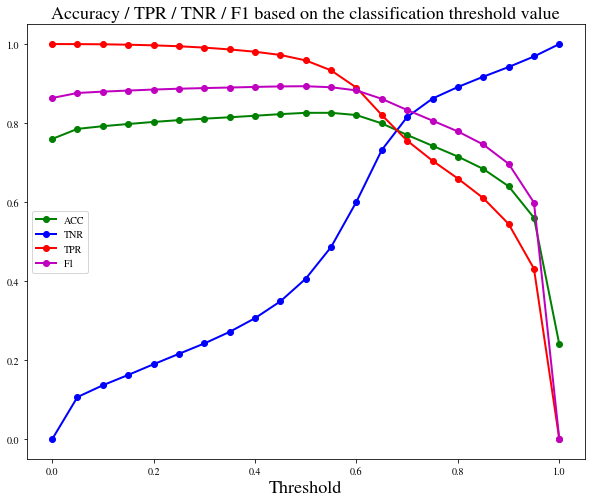

Chosen classification threshold is: 0.675
Edge labels: number of positive: 214167
Predictions: number of positive: 183116


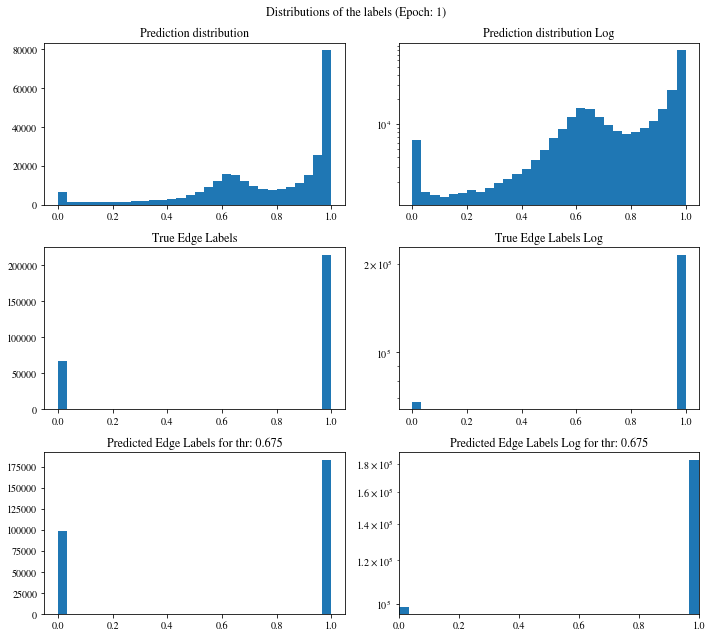

[0.98685259 0.99229228 0.96892333 ... 0.98771054 0.99101233 0.7859863 ]
Confusion matrix:
[[ 52820  14880]
 [ 45931 168236]]

Confusion matrix weighted:
[[0.3901034  0.1098966 ]
 [0.10723174 0.39276826]]

TN: 52820 	 FN: 45931 	 TP: 168236 	 FP: 14880
Confusion matrix scaled:
[[0.18739335 0.05279086]
 [0.16295274 0.59686306]]

Accuracy: 0.7843
Precision: 0.9187
Negative predictive value: 0.5349
Recall: Correctly classifying 78.5537 % of positive edges
True negative rate: Correctly classifying 78.0207 % of all negative edges
F1 score: 0.8469
[0.78438736 0.78137202] [0.78020679 0.78553652] [0.78229149 0.78344874]
Balanced accuracy: 0.7829
Precision weighted: [0.78438736 0.78137202]
Recall weighted: [0.78020679 0.78553652]
F1 score weighted: [0.78229149 0.78344874]
positive_likelihood_ratio: 3.5739800028427218, negative_likelihood_ratio: 0.2748803021147349


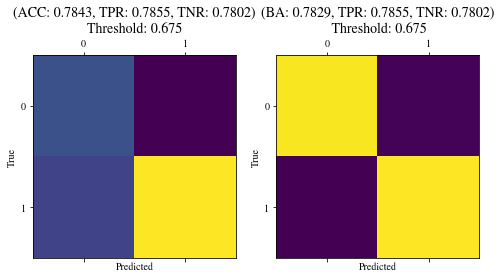

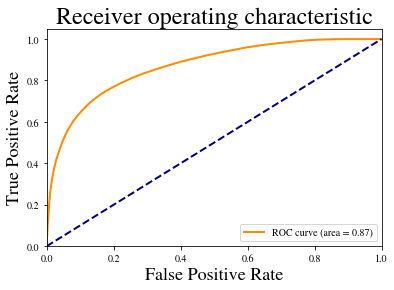

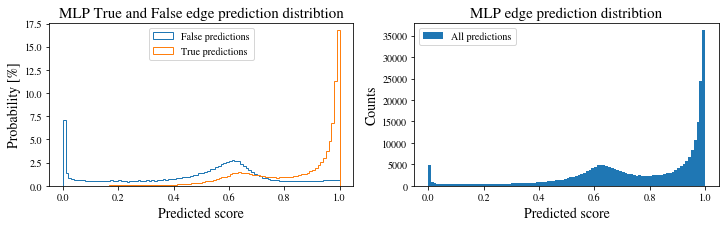

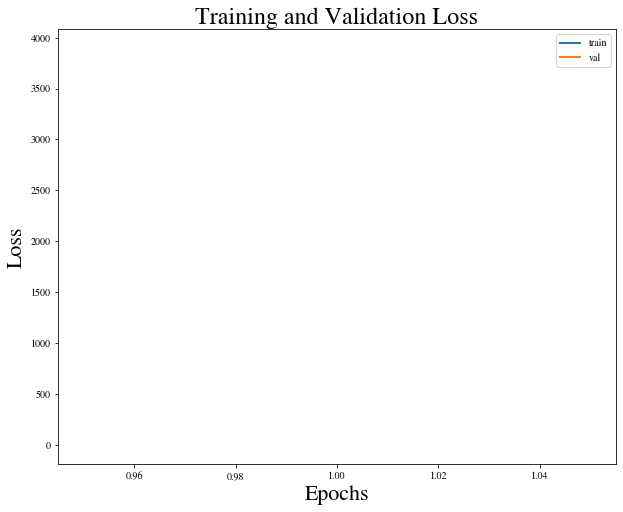

Training epoch 2: 100%|██████████| 12079/12079 [07:21<00:00, 27.36it/s]


Epoch: 2, train loss: 3273.9128
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_2_loss_3273.9128.pt
Epoch: 2, val loss: 0.2944


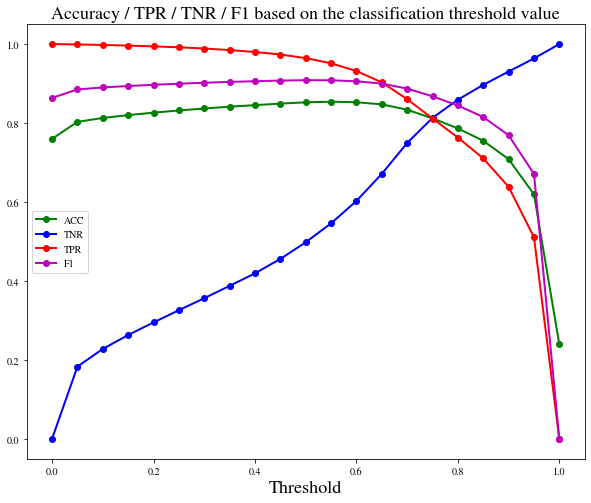

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 186474


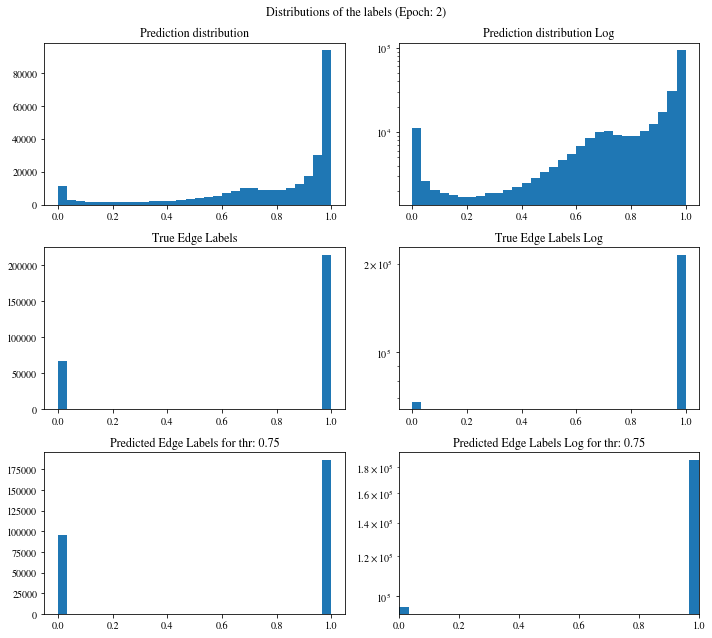

[0.99976772 0.99970204 0.99983859 ... 0.72554439 0.54566205 0.74374944]
Confusion matrix:
[[ 55060  12640]
 [ 40333 173834]]

Confusion matrix weighted:
[[0.40664697 0.09335303]
 [0.0941625  0.4058375 ]]

TN: 55060 	 FN: 40333 	 TP: 173834 	 FP: 12640
Confusion matrix scaled:
[[0.19534036 0.04484384]
 [0.14309231 0.61672349]]

Accuracy: 0.8121
Precision: 0.9322
Negative predictive value: 0.5772
Recall: Correctly classifying 81.1675 % of positive edges
True negative rate: Correctly classifying 81.3294 % of all negative edges
F1 score: 0.8678
[0.8119794  0.81299119] [0.81329394 0.811675  ] [0.81263614 0.81233256]
Balanced accuracy: 0.8125
Precision weighted: [0.8119794  0.81299119]
Recall weighted: [0.81329394 0.811675  ]
F1 score weighted: [0.81263614 0.81233256]
positive_likelihood_ratio: 4.347341581244448, negative_likelihood_ratio: 0.23155834386251678


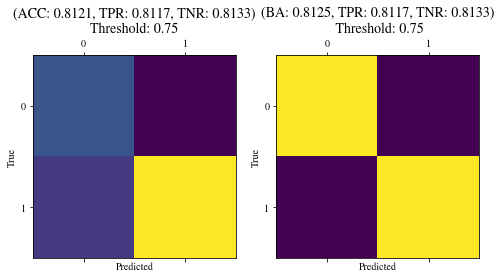

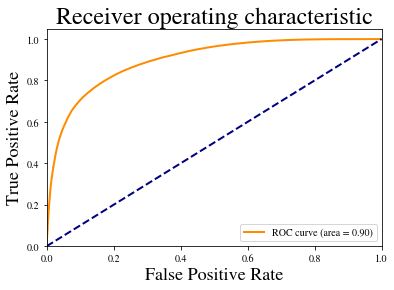

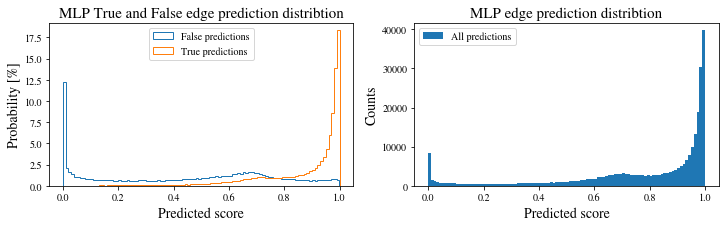

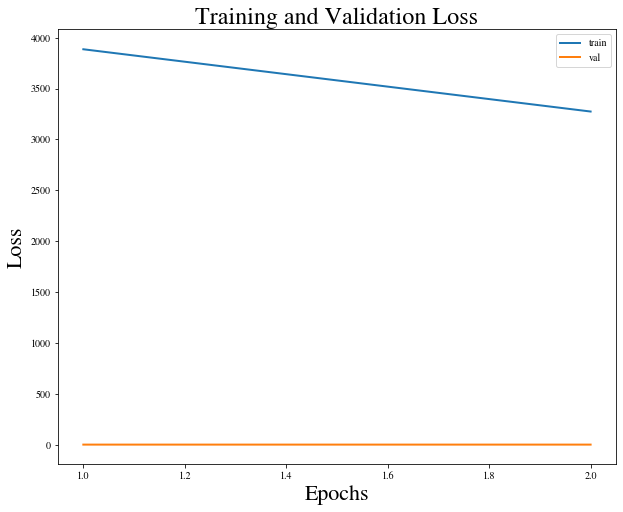

Training epoch 3: 100%|██████████| 12079/12079 [07:14<00:00, 27.82it/s]


Epoch: 3, train loss: 3050.0144
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_3_loss_3050.0144.pt
Epoch: 3, val loss: 0.2809


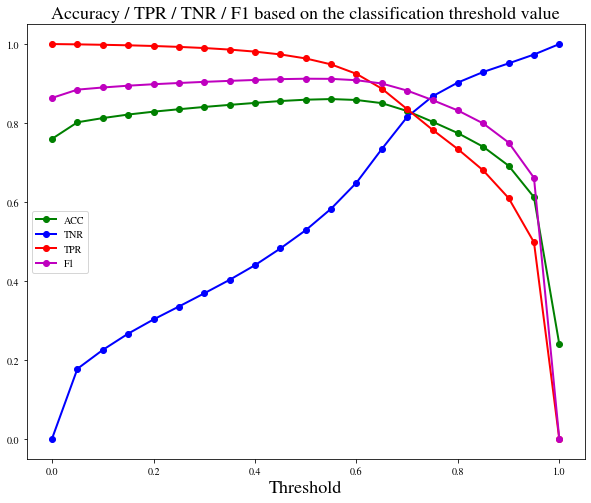

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 191399


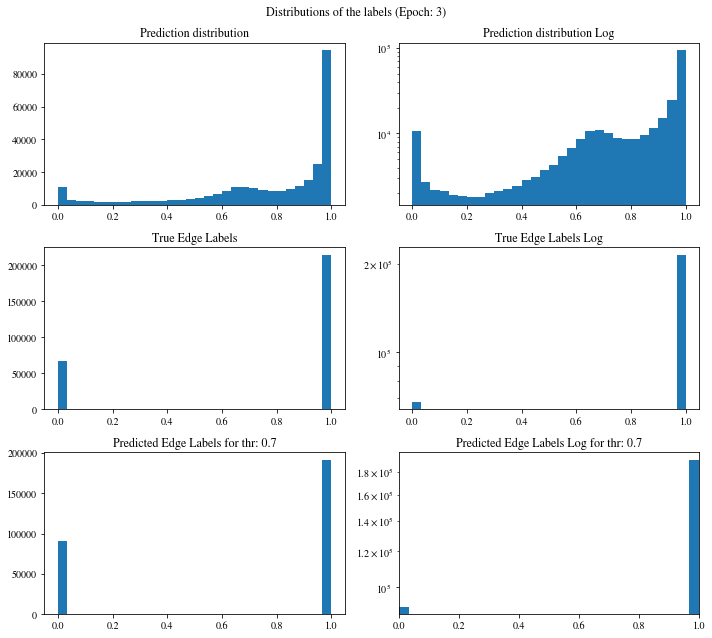

[0.99479055 0.98498267 0.96058643 ... 0.81197506 0.82750905 0.85172653]
Confusion matrix:
[[ 55209  12491]
 [ 35259 178908]]

Confusion matrix weighted:
[[0.40774742 0.09225258]
 [0.0823166  0.4176834 ]]

TN: 55209 	 FN: 35259 	 TP: 178908 	 FP: 12491
Confusion matrix scaled:
[[0.19586897 0.04431523]
 [0.12509091 0.63472489]]

Accuracy: 0.8306
Precision: 0.9347
Negative predictive value: 0.6103
Recall: Correctly classifying 83.5367 % of positive edges
True negative rate: Correctly classifying 81.5495 % of all negative edges
F1 score: 0.8823
[0.83202888 0.81908987] [0.81549483 0.83536679] [0.82367889 0.82714826]
Balanced accuracy: 0.8254
Precision weighted: [0.83202888 0.81908987]
Recall weighted: [0.81549483 0.83536679]
F1 score weighted: [0.82367889 0.82714826]
positive_likelihood_ratio: 4.527606428618408, negative_likelihood_ratio: 0.20188136173680868


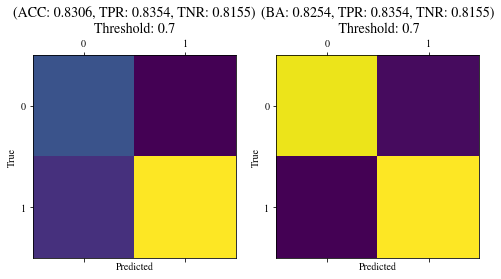

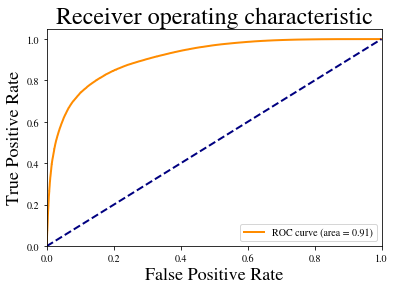

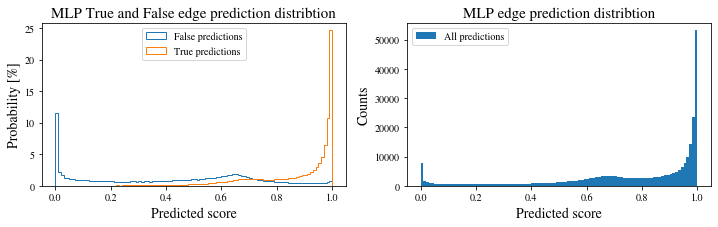

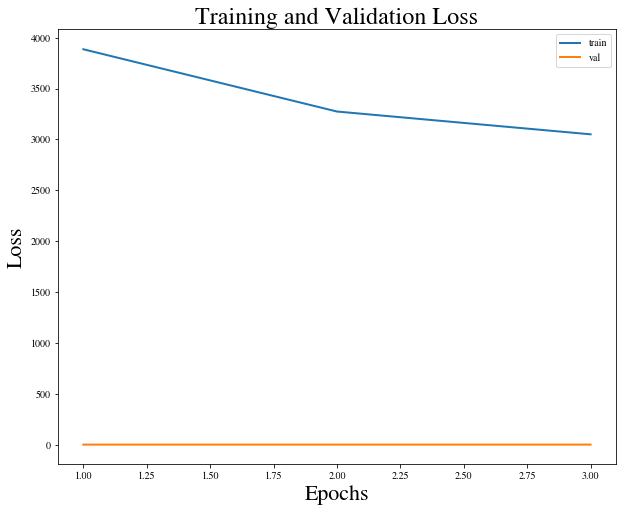

Training epoch 4: 100%|██████████| 12079/12079 [08:01<00:00, 25.09it/s]


Epoch: 4, train loss: 2958.4883
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_4_loss_2958.4883.pt
Epoch: 4, val loss: 0.2865


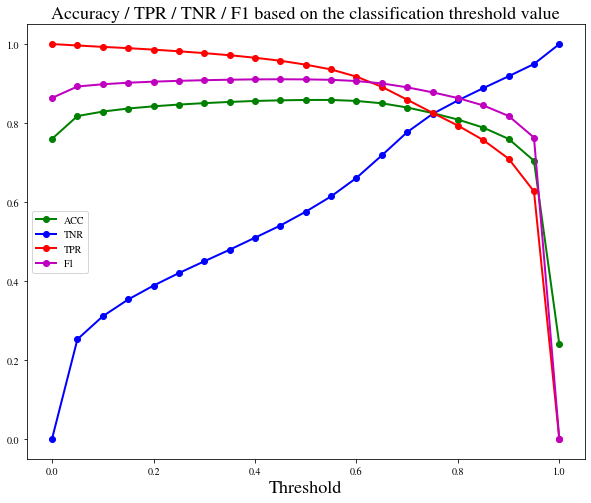

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 188899


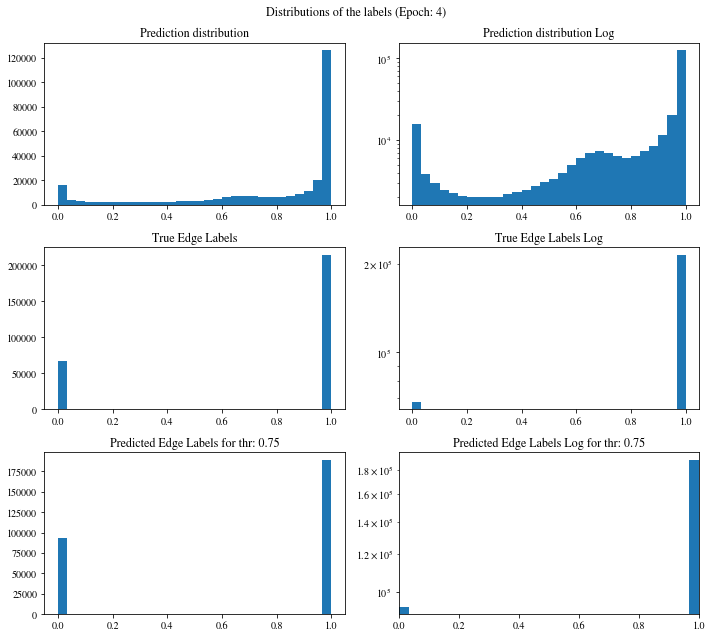

[0.9386735  0.91823667 0.98154092 ... 0.9675414  0.91380697 0.76450294]
Confusion matrix:
[[ 55729  11971]
 [ 37239 176928]]

Confusion matrix weighted:
[[0.41158789 0.08841211]
 [0.08693916 0.41306084]]

TN: 55729 	 FN: 37239 	 TP: 176928 	 FP: 11971
Confusion matrix scaled:
[[0.19771382 0.04247038]
 [0.1321155  0.6277003 ]]

Accuracy: 0.8254
Precision: 0.9366
Negative predictive value: 0.5994
Recall: Correctly classifying 82.6122 % of positive edges
True negative rate: Correctly classifying 82.3176 % of all negative edges
F1 score: 0.8779
[0.82560793 0.82369515] [0.82317578 0.82612167] [0.82439006 0.82490663]
Balanced accuracy: 0.8246
Precision weighted: [0.82560793 0.82369515]
Recall weighted: [0.82317578 0.82612167]
F1 score weighted: [0.82439006 0.82490663]
positive_likelihood_ratio: 4.671993747738988, negative_likelihood_ratio: 0.2112286753004106


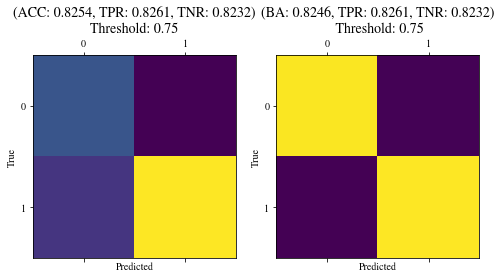

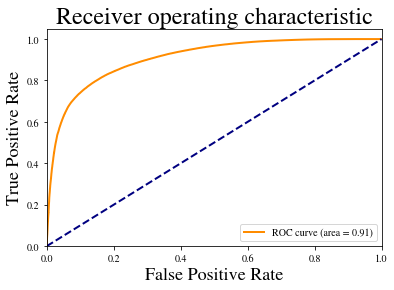

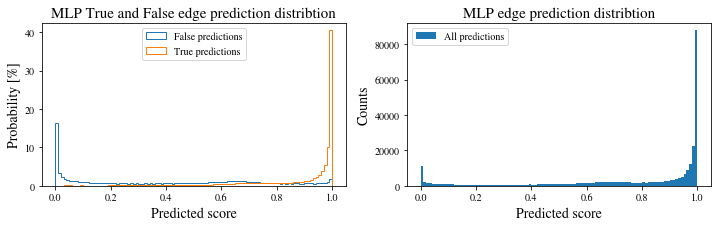

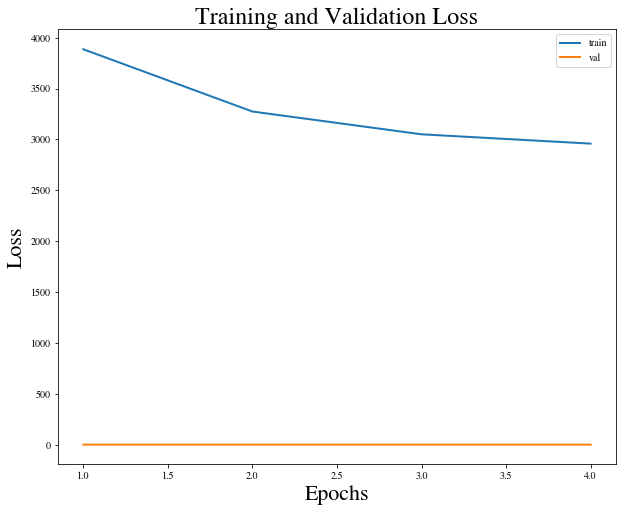

Training epoch 5: 100%|██████████| 12079/12079 [17:05<00:00, 11.77it/s] 


Epoch: 5, train loss: 2888.8276
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_5_loss_2888.8276.pt
Epoch: 5, val loss: 0.2783


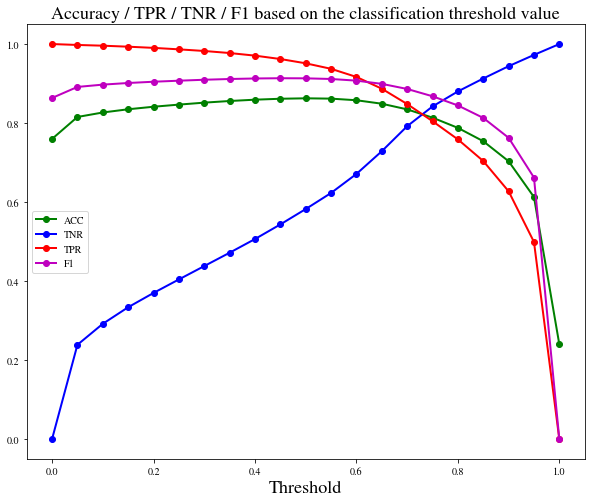

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 189304


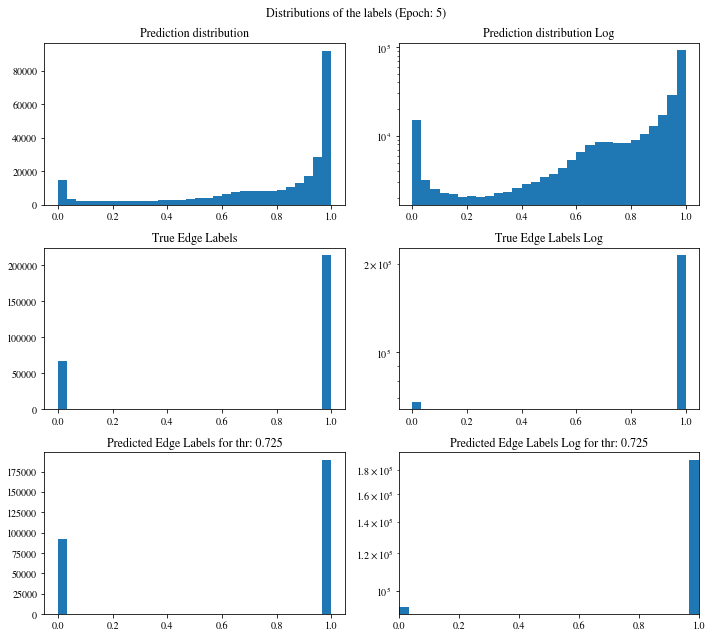

[0.95425981 0.94750732 0.87987846 ... 0.99013025 0.99493378 0.97585797]
Confusion matrix:
[[ 55492  12208]
 [ 37071 177096]]

Confusion matrix weighted:
[[0.40983752 0.09016248]
 [0.08654695 0.41345305]]

TN: 55492 	 FN: 37071 	 TP: 177096 	 FP: 12208
Confusion matrix scaled:
[[0.19687299 0.04331121]
 [0.13151948 0.62829632]]

Accuracy: 0.8252
Precision: 0.9355
Negative predictive value: 0.5995
Recall: Correctly classifying 82.6906 % of positive edges
True negative rate: Correctly classifying 81.9675 % of all negative edges
F1 score: 0.8779
[0.82564534 0.82096962] [0.81967504 0.82690611] [0.82264935 0.82392717]
Balanced accuracy: 0.8233
Precision weighted: [0.82564534 0.82096962]
Recall weighted: [0.81967504 0.82690611]
F1 score weighted: [0.82264935 0.82392717]
positive_likelihood_ratio: 4.585644116565348, negative_likelihood_ratio: 0.21117380207904263


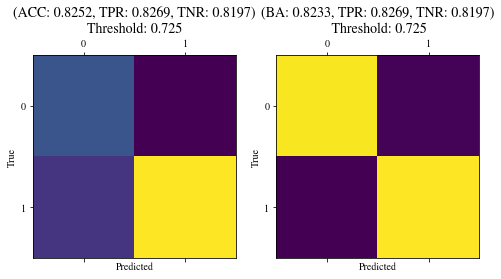

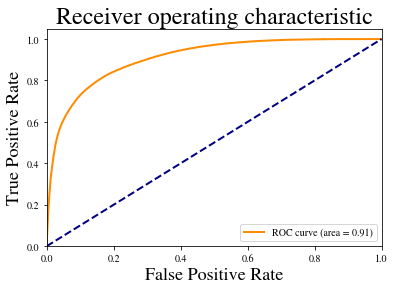

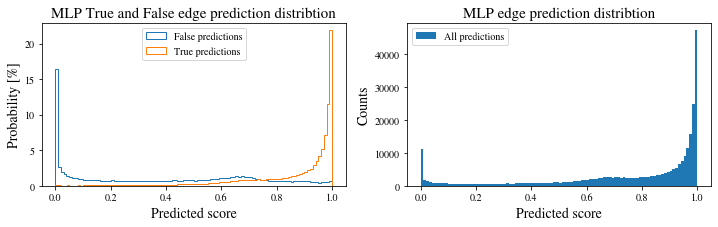

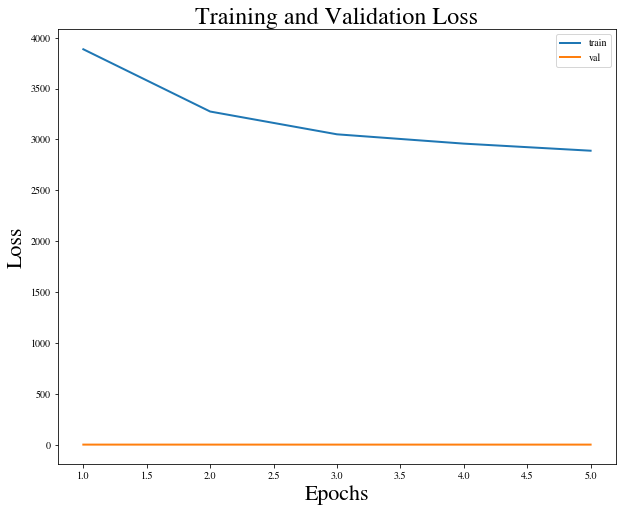

Training epoch 6: 100%|██████████| 12079/12079 [12:17<00:00, 16.38it/s] 


Epoch: 6, train loss: 2830.5020
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_6_loss_2830.5020.pt
Epoch: 6, val loss: 0.2764


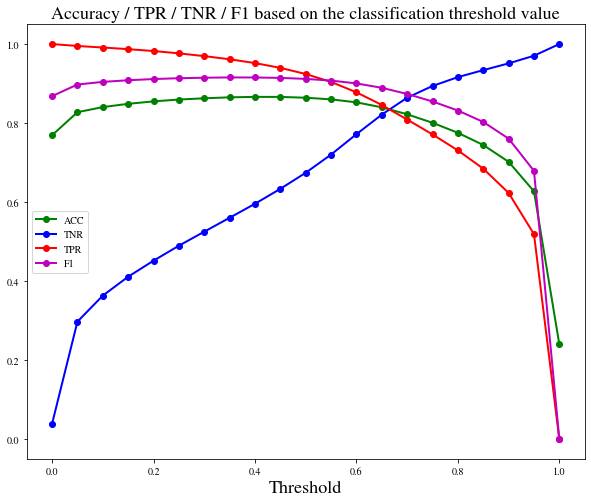

Chosen classification threshold is: 0.675
Edge labels: number of positive: 214167
Predictions: number of positive: 187873


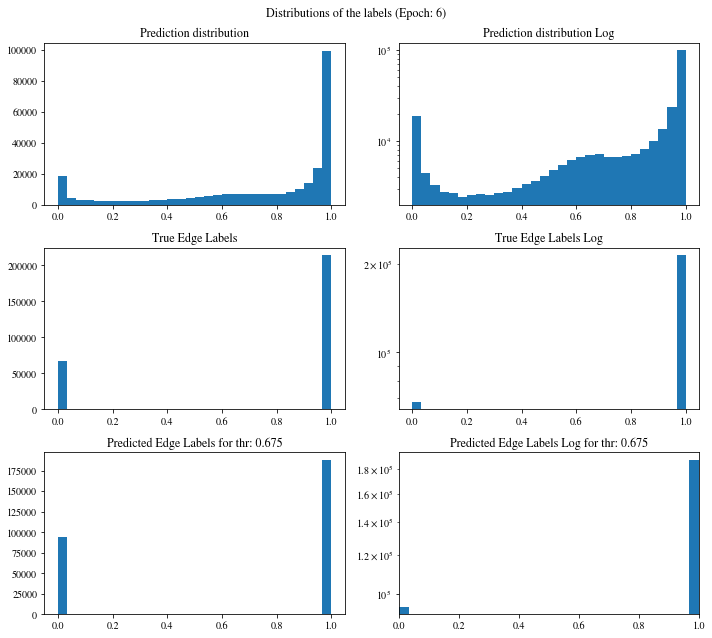

[0.91415566 0.91208035 0.97116625 ... 0.60963178 0.64836848 0.63174707]
Confusion matrix:
[[ 57150  10550]
 [ 36844 177323]]

Confusion matrix weighted:
[[0.42208272 0.07791728]
 [0.08601699 0.41398301]]

TN: 57150 	 FN: 36844 	 TP: 177323 	 FP: 10550
Confusion matrix scaled:
[[0.2027552  0.037429  ]
 [0.13071413 0.62910167]]

Accuracy: 0.8319
Precision: 0.9438
Negative predictive value: 0.6080
Recall: Correctly classifying 82.7966 % of positive edges
True negative rate: Correctly classifying 84.4165 % of all negative edges
F1 score: 0.8821
[0.83070845 0.84159944] [0.84416544 0.82796603] [0.83738288 0.83472707]
Balanced accuracy: 0.8361
Precision weighted: [0.83070845 0.84159944]
Recall weighted: [0.84416544 0.82796603]
F1 score weighted: [0.83738288 0.83472707]
positive_likelihood_ratio: 5.313109004252495, negative_likelihood_ratio: 0.2037917761178684


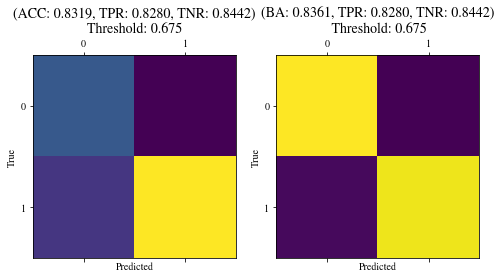

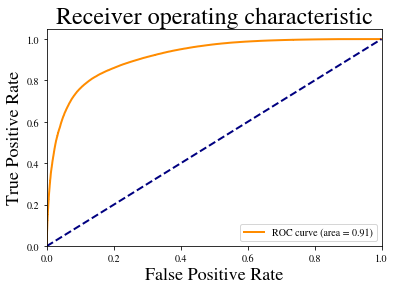

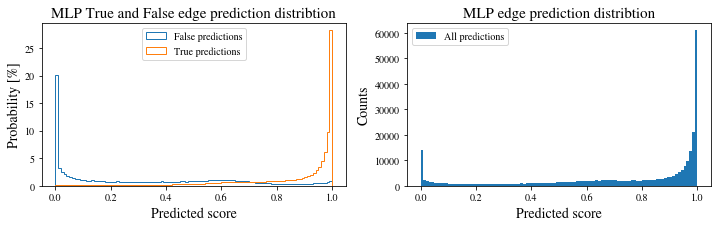

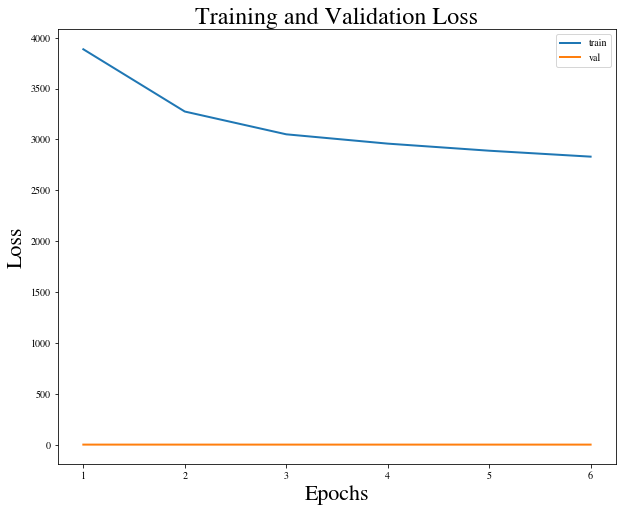

Training epoch 7: 100%|██████████| 12079/12079 [07:28<00:00, 26.90it/s]


Epoch: 7, train loss: 2770.8777
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_7_loss_2770.8777.pt
Epoch: 7, val loss: 0.2667


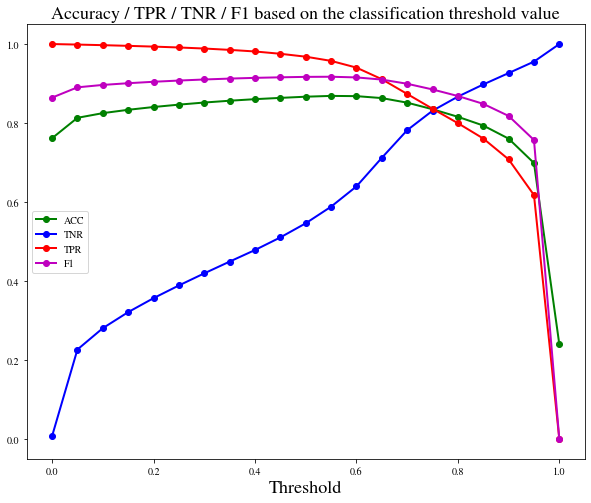

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190540


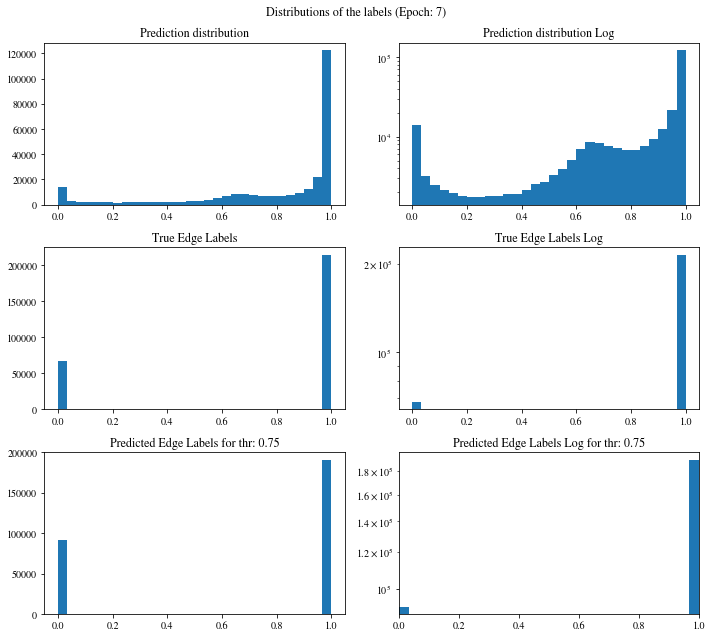

[0.99984312 0.99938226 0.99598432 ... 0.65865129 0.06279955 0.24959415]
Confusion matrix:
[[ 56280  11420]
 [ 35047 179120]]

Confusion matrix weighted:
[[0.41565731 0.08434269]
 [0.08182166 0.41817834]]

TN: 56280 	 FN: 35047 	 TP: 179120 	 FP: 11420
Confusion matrix scaled:
[[0.19966864 0.04051556]
 [0.12433878 0.63547702]]

Accuracy: 0.8351
Precision: 0.9401
Negative predictive value: 0.6162
Recall: Correctly classifying 83.6357 % of positive edges
True negative rate: Correctly classifying 83.1315 % of all negative edges
F1 score: 0.8852
[0.8355274  0.83216088] [0.83131462 0.83635667] [0.83341569 0.8342535 ]
Balanced accuracy: 0.8338
Precision weighted: [0.8355274  0.83216088]
Recall weighted: [0.83131462 0.83635667]
F1 score weighted: [0.83341569 0.8342535 ]
positive_likelihood_ratio: 4.958086417937417, negative_likelihood_ratio: 0.19684884696436916


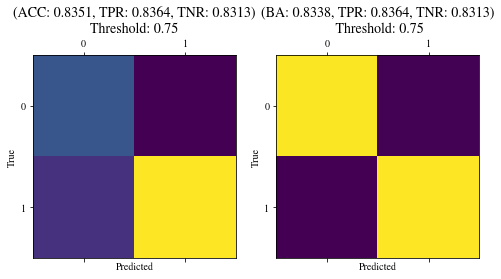

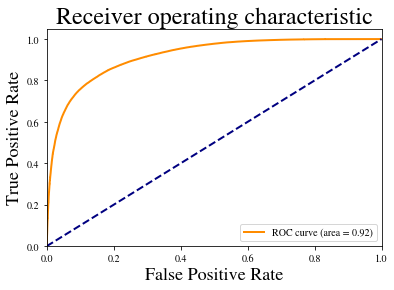

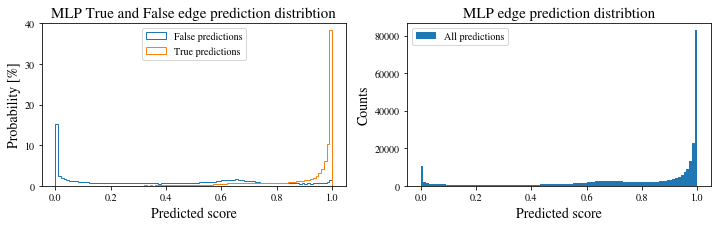

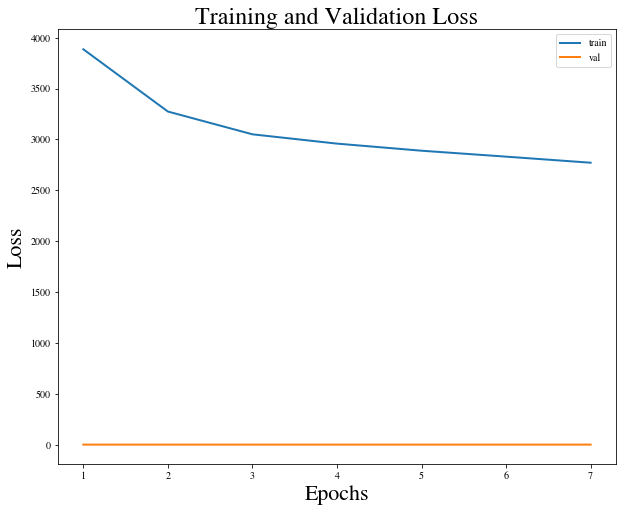

Training epoch 8: 100%|██████████| 12079/12079 [07:30<00:00, 26.84it/s]


Epoch: 8, train loss: 2733.9583
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_8_loss_2733.9583.pt
Epoch: 8, val loss: 0.2645


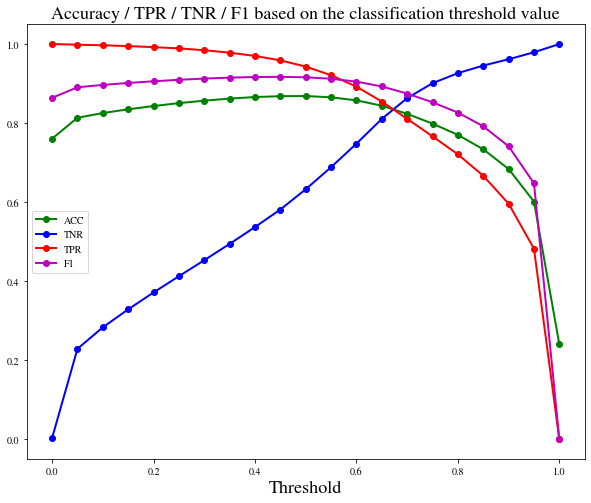

Chosen classification threshold is: 0.675
Edge labels: number of positive: 214167
Predictions: number of positive: 189441


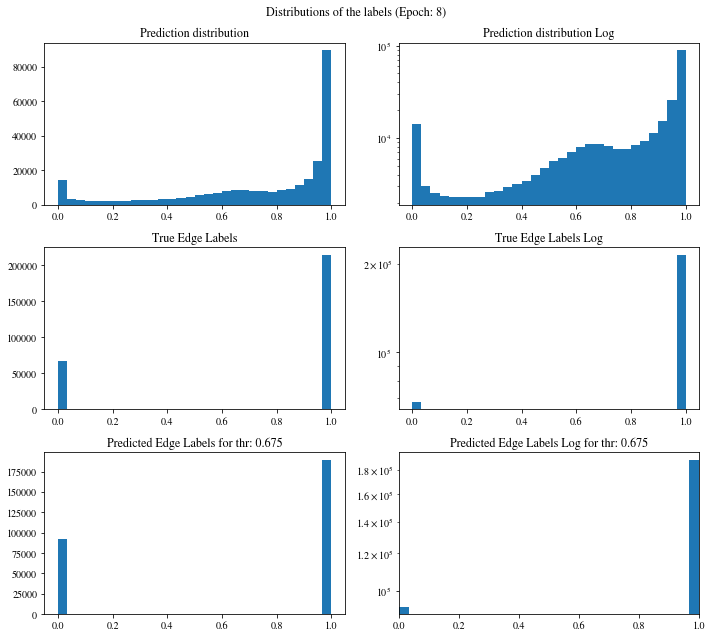

[0.99847549 0.99975926 0.999708   ... 0.91445297 0.84338707 0.89175695]
Confusion matrix:
[[ 56744  10956]
 [ 35682 178485]]

Confusion matrix weighted:
[[0.41908419 0.08091581]
 [0.08330415 0.41669585]]

TN: 56744 	 FN: 35682 	 TP: 178485 	 FP: 10956
Confusion matrix scaled:
[[0.2013148  0.0388694 ]
 [0.12659162 0.63322418]]

Accuracy: 0.8345
Precision: 0.9422
Negative predictive value: 0.6139
Recall: Correctly classifying 83.3392 % of positive edges
True negative rate: Correctly classifying 83.8168 % of all negative edges
F1 score: 0.8844
[0.83418375 0.83739166] [0.83816839 0.8333917 ] [0.83617132 0.83538689]
Balanced accuracy: 0.8358
Precision weighted: [0.83418375 0.83739166]
Recall weighted: [0.83816839 0.8333917 ]
F1 score weighted: [0.83617132 0.83538689]
positive_likelihood_ratio: 5.149746077253049, negative_likelihood_ratio: 0.19877664559452274


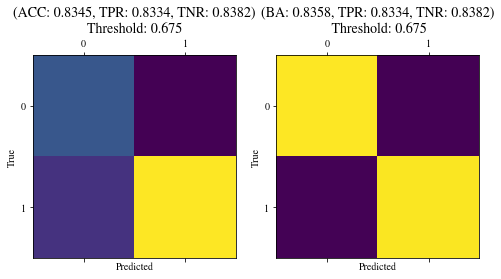

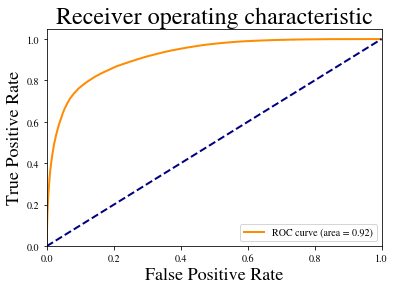

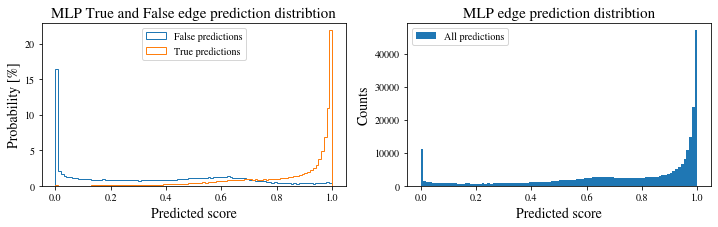

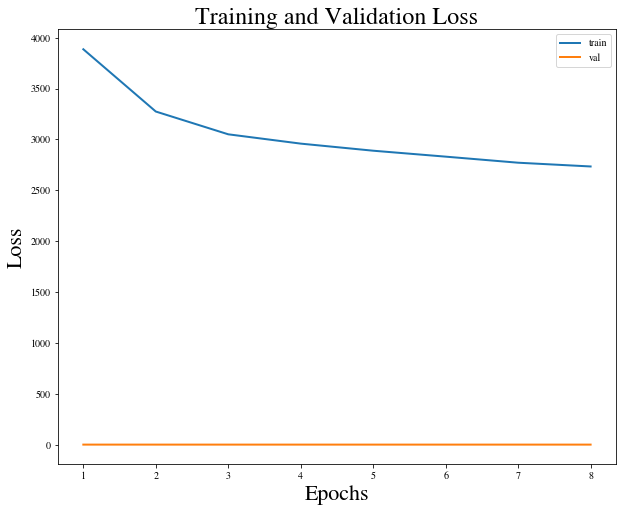

Training epoch 9: 100%|██████████| 12079/12079 [07:36<00:00, 26.45it/s]


Epoch: 9, train loss: 2717.8977
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_9_loss_2717.8977.pt
Epoch: 9, val loss: 0.2666


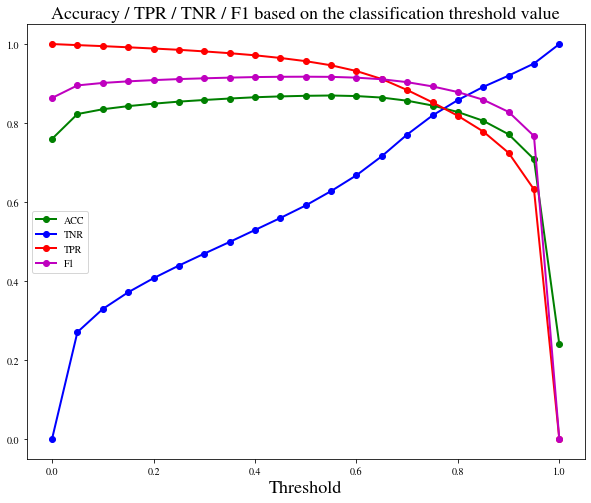

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 189872


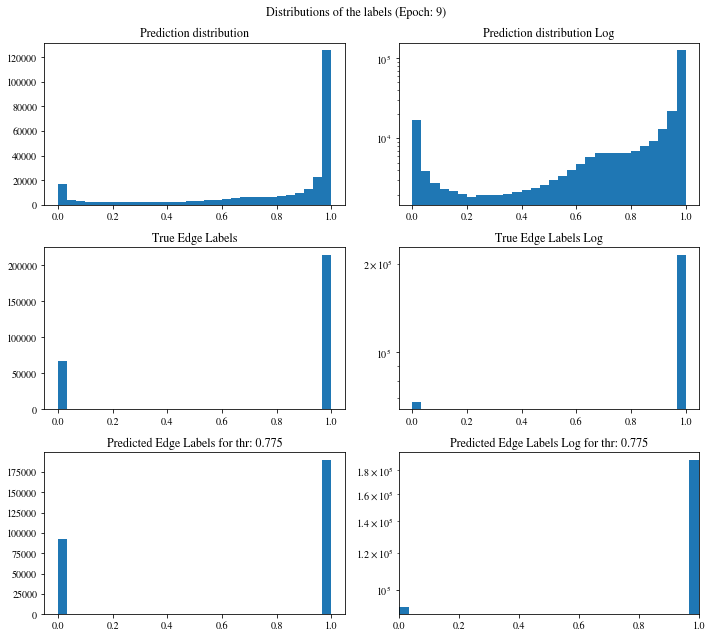

[0.17452961 0.82067013 0.02051658 ... 0.96702999 0.99159652 0.99075258]
Confusion matrix:
[[ 56876  10824]
 [ 35119 179048]]

Confusion matrix weighted:
[[0.42005908 0.07994092]
 [0.08198976 0.41801024]]

TN: 56876 	 FN: 35119 	 TP: 179048 	 FP: 10824
Confusion matrix scaled:
[[0.20178311 0.03840109]
 [0.12459422 0.63522158]]

Accuracy: 0.8370
Precision: 0.9430
Negative predictive value: 0.6183
Recall: Correctly classifying 83.6020 % of positive edges
True negative rate: Correctly classifying 84.0118 % of all negative edges
F1 score: 0.8863
[0.83668968 0.83946033] [0.84011817 0.83602049] [0.83840042 0.83773688]
Balanced accuracy: 0.8381
Precision weighted: [0.83668968 0.83946033]
Recall weighted: [0.84011817 0.83602049]
F1 score weighted: [0.83840042 0.83773688]
positive_likelihood_ratio: 5.228989937537985, negative_likelihood_ratio: 0.1951862457994382


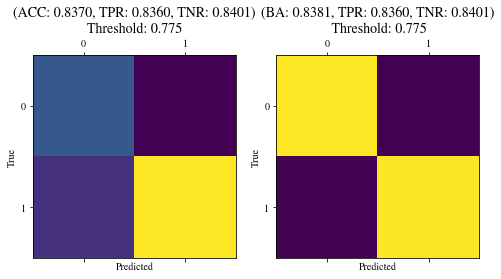

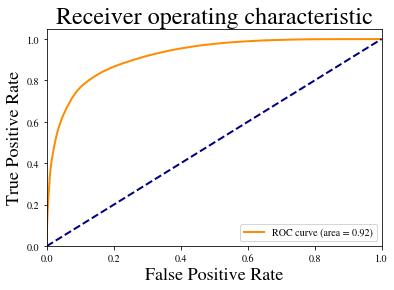

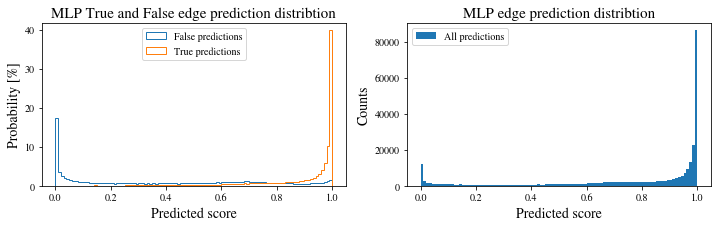

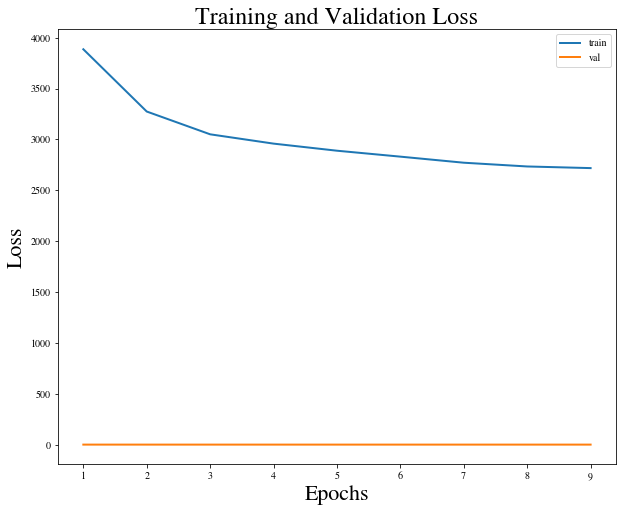

Training epoch 10: 100%|██████████| 12079/12079 [07:29<00:00, 26.85it/s]


Epoch: 10, train loss: 2685.3228
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_10_loss_2685.3228.pt
Epoch: 10, val loss: 0.2562


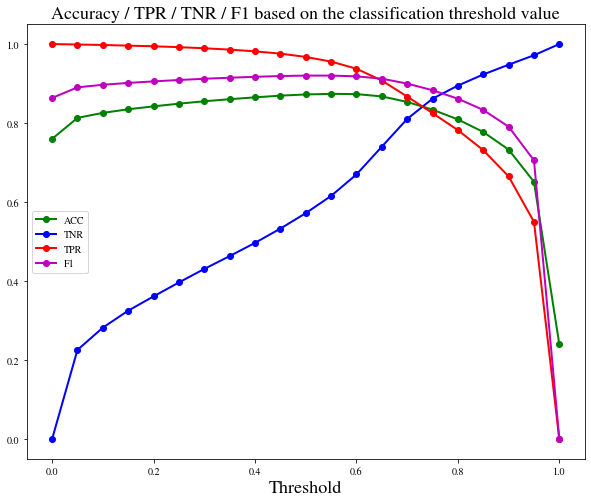

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 192191


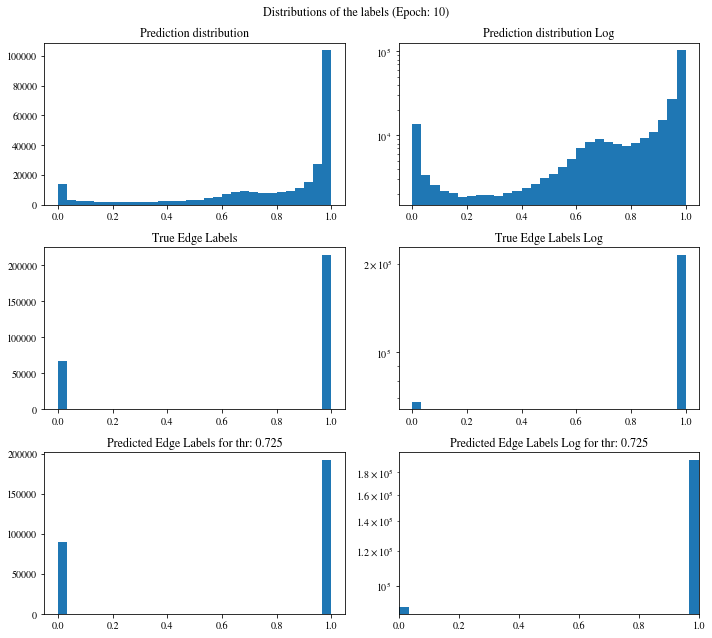

[0.95299006 0.30323803 0.07468026 ... 0.97694427 0.98137164 0.98648179]
Confusion matrix:
[[ 56771  10929]
 [ 32905 181262]]

Confusion matrix weighted:
[[0.4192836  0.0807164 ]
 [0.07682089 0.42317911]]

TN: 56771 	 FN: 32905 	 TP: 181262 	 FP: 10929
Confusion matrix scaled:
[[0.20141059 0.03877361]
 [0.11673946 0.64307634]]

Accuracy: 0.8445
Precision: 0.9431
Negative predictive value: 0.6331
Recall: Correctly classifying 84.6358 % of positive edges
True negative rate: Correctly classifying 83.8567 % of all negative edges
F1 score: 0.8921
[0.84515179 0.83981521] [0.83856721 0.84635822] [0.84184662 0.84307402]
Balanced accuracy: 0.8425
Precision weighted: [0.84515179 0.83981521]
Recall weighted: [0.83856721 0.84635822]
F1 score weighted: [0.84184662 0.84307402]
positive_likelihood_ratio: 5.242789935825441, negative_likelihood_ratio: 0.1832194041211842


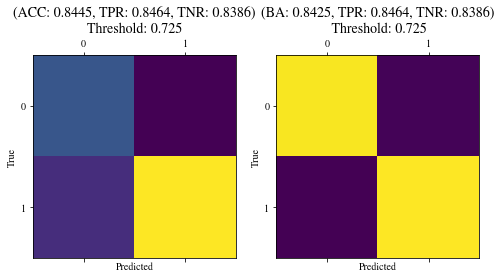

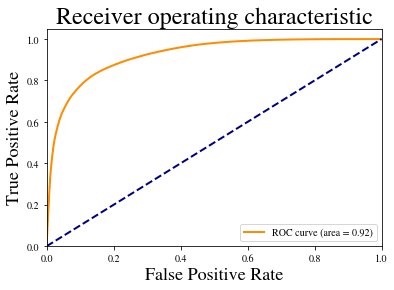

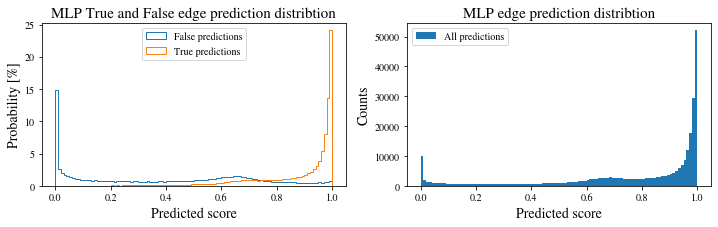

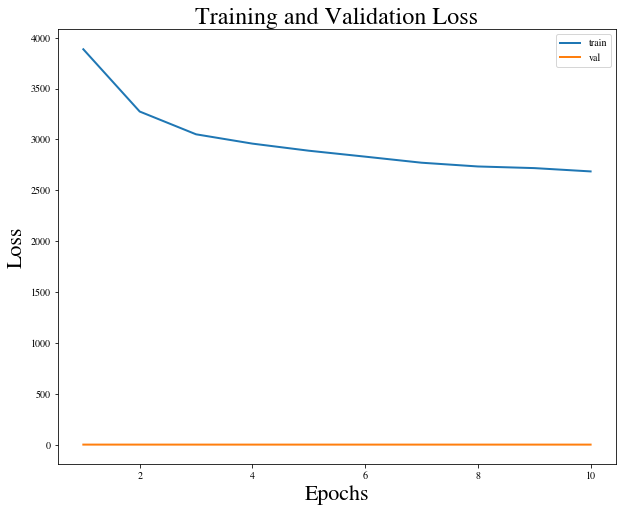

Training epoch 11: 100%|██████████| 12079/12079 [07:34<00:00, 26.60it/s]


Epoch: 11, train loss: 2670.0442
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_11_loss_2670.0442.pt
Epoch: 11, val loss: 0.2522


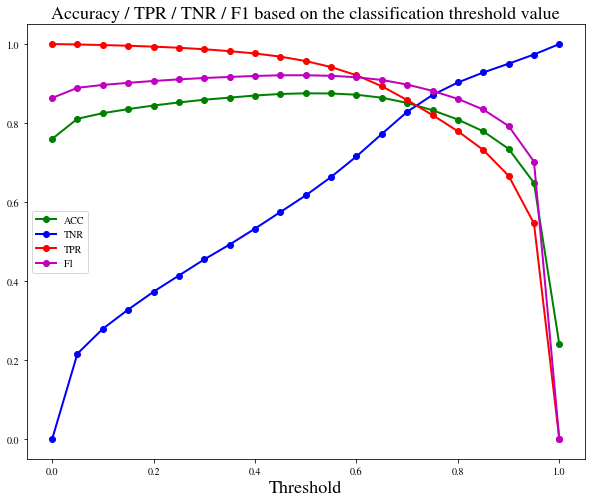

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 189926


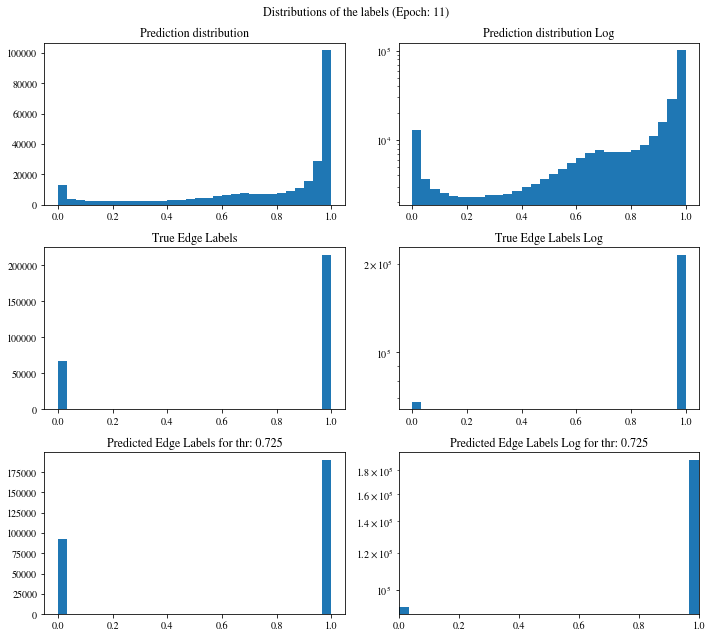

[0.99689889 0.99743491 0.99641234 ... 0.90500128 0.91382962 0.82404643]
Confusion matrix:
[[ 57590  10110]
 [ 34351 179816]]

Confusion matrix weighted:
[[0.42533235 0.07466765]
 [0.08019676 0.41980324]]

TN: 57590 	 FN: 34351 	 TP: 179816 	 FP: 10110
Confusion matrix scaled:
[[0.20431622 0.03586798]
 [0.12186953 0.63794627]]

Accuracy: 0.8423
Precision: 0.9468
Negative predictive value: 0.6264
Recall: Correctly classifying 83.9606 % of positive edges
True negative rate: Correctly classifying 85.0665 % of all negative edges
F1 score: 0.8900
[0.84136074 0.84899485] [0.8506647  0.83960648] [0.84598714 0.84427456]
Balanced accuracy: 0.8451
Precision weighted: [0.84136074 0.84899485]
Recall weighted: [0.8506647  0.83960648]
F1 score weighted: [0.84598714 0.84427456]
positive_likelihood_ratio: 5.622290640871291, negative_likelihood_ratio: 0.18855081821134315


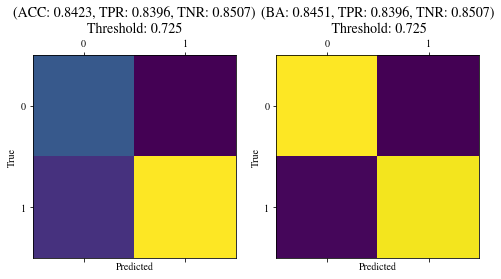

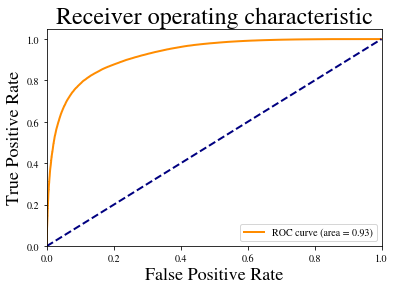

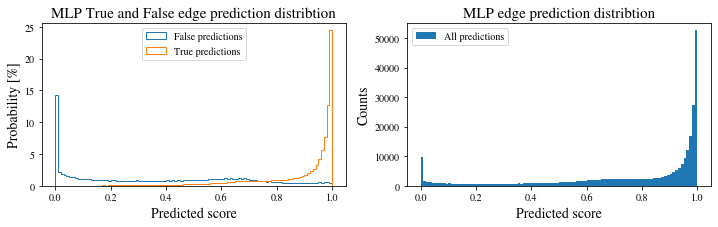

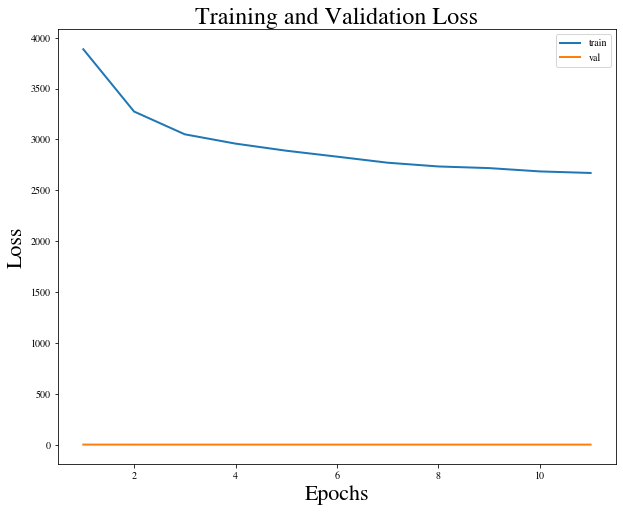

Training epoch 12:  61%|██████▏   | 7424/12079 [04:34<02:44, 28.30it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 14:  97%|█████████▋| 11747/12079 [07:18<00:12, 26.76it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 15: 100%|██████████| 12079/12079 [07:35<00:00, 26.53it/s]


Epoch: 15, train loss: 2584.5142
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_15_loss_2584.5142.pt
Epoch: 15, val loss: 0.2594


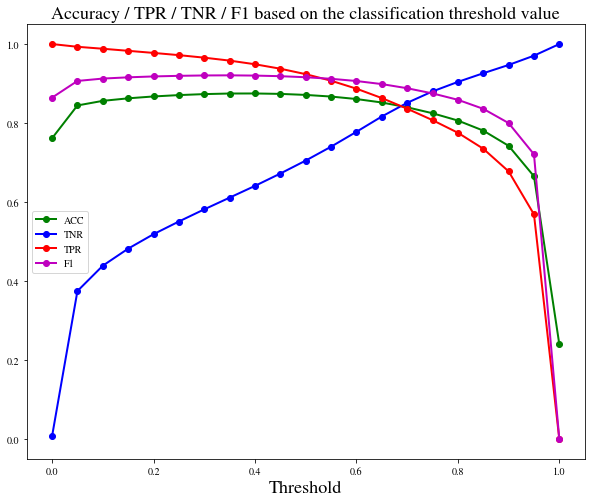

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 189214


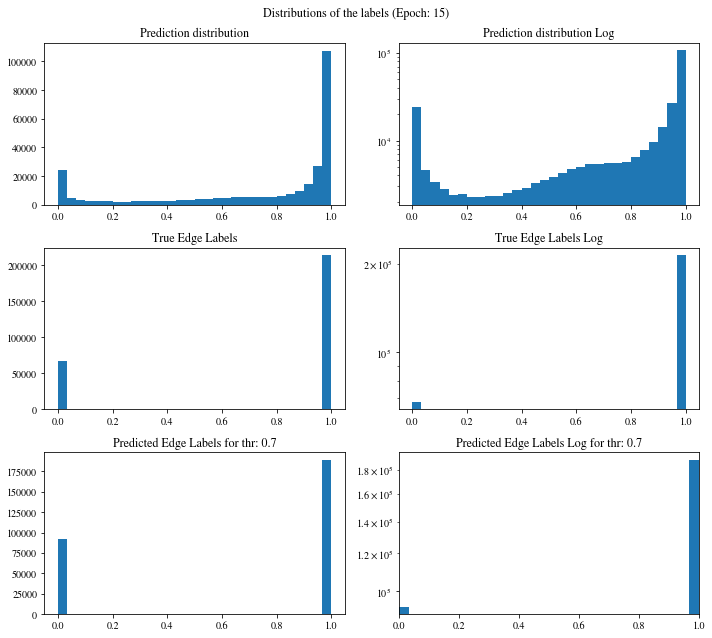

[0.84603721 0.83188933 0.88879412 ... 0.68710929 0.41374749 0.57951289]
Confusion matrix:
[[ 57633  10067]
 [ 35020 179147]]

Confusion matrix weighted:
[[0.42564993 0.07435007]
 [0.08175863 0.41824137]]

TN: 57633 	 FN: 35020 	 TP: 179147 	 FP: 10067
Confusion matrix scaled:
[[0.20446877 0.03571543]
 [0.12424299 0.63557281]]

Accuracy: 0.8400
Precision: 0.9468
Negative predictive value: 0.6220
Recall: Correctly classifying 83.6483 % of positive edges
True negative rate: Correctly classifying 85.1300 % of all negative edges
F1 score: 0.8882
[0.83887022 0.84906341] [0.85129985 0.83648274] [0.84503933 0.84272613]
Balanced accuracy: 0.8439
Precision weighted: [0.83887022 0.84906341]
Recall weighted: [0.85129985 0.83648274]
F1 score weighted: [0.84503933 0.84272613]
positive_likelihood_ratio: 5.625298680957148, negative_likelihood_ratio: 0.192079506164947


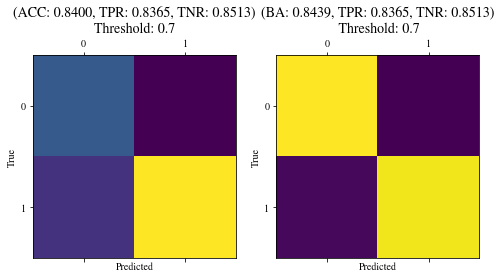

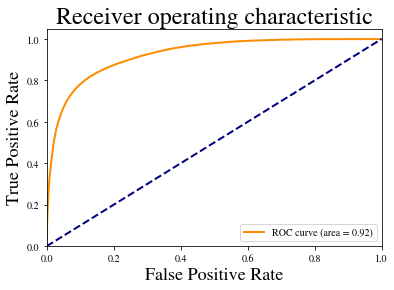

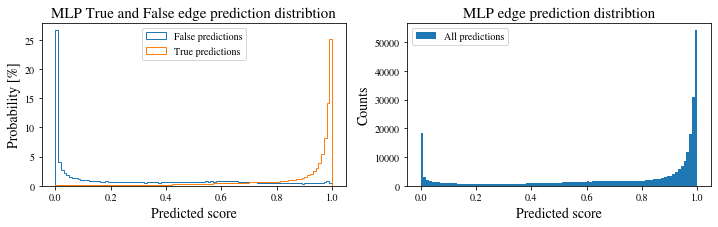

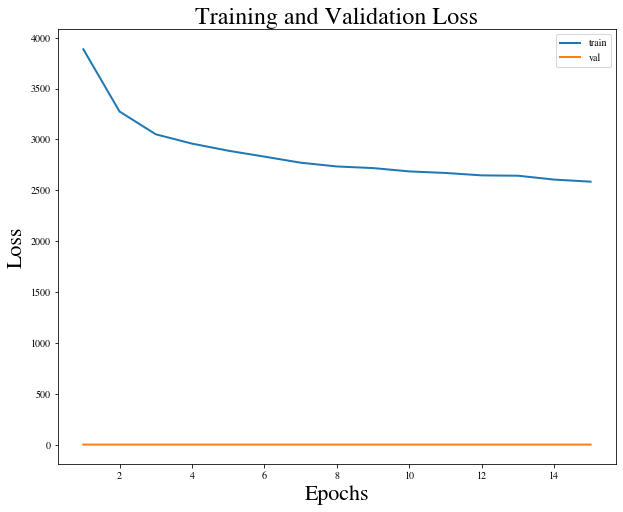

Training epoch 16:  63%|██████▎   | 7623/12079 [04:42<02:51, 26.05it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 18:  96%|█████████▌| 11559/12079 [07:03<00:18, 28.02it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 20: 100%|██████████| 12079/12079 [07:25<00:00, 27.13it/s]


Epoch: 20, train loss: 2537.4143
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_20_loss_2537.4143.pt
Epoch: 20, val loss: 0.2444


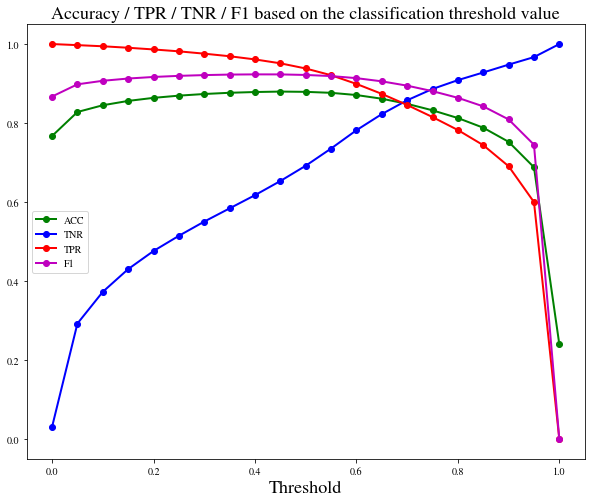

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 190787


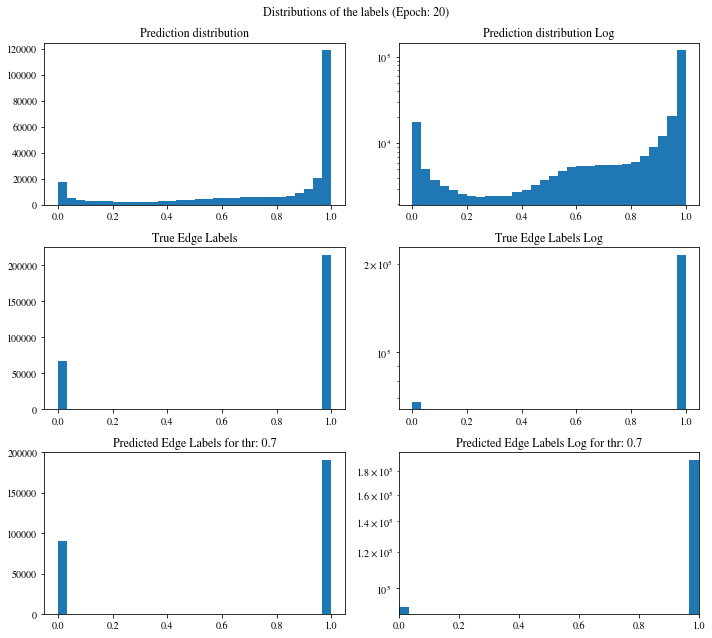

[0.99923265 0.99797815 0.99971789 ... 0.5577848  0.64748633 0.70743579]
Confusion matrix:
[[ 58074   9626]
 [ 33006 181161]]

Confusion matrix weighted:
[[0.42890694 0.07109306]
 [0.07705669 0.42294331]]

TN: 58074 	 FN: 33006 	 TP: 181161 	 FP: 9626
Confusion matrix scaled:
[[0.20603334 0.03415086]
 [0.11709778 0.64271802]]

Accuracy: 0.8488
Precision: 0.9495
Negative predictive value: 0.6376
Recall: Correctly classifying 84.5887 % of positive edges
True negative rate: Correctly classifying 85.7814 % of all negative edges
F1 score: 0.8947
[0.84770311 0.85609752] [0.85781388 0.84588662] [0.85272853 0.85096144]
Balanced accuracy: 0.8519
Precision weighted: [0.84770311 0.85609752]
Recall weighted: [0.85781388 0.84588662]
F1 score weighted: [0.85272853 0.85096144]
positive_likelihood_ratio: 5.949150660132657, negative_likelihood_ratio: 0.1796582936522892


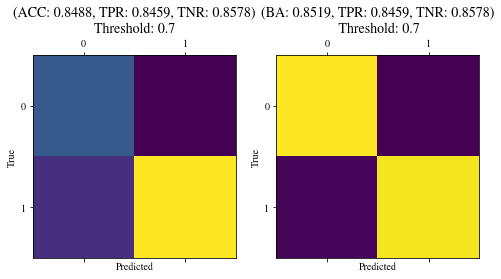

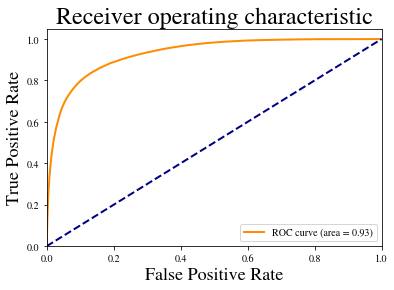

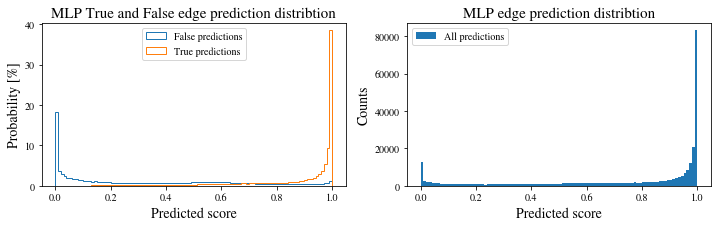

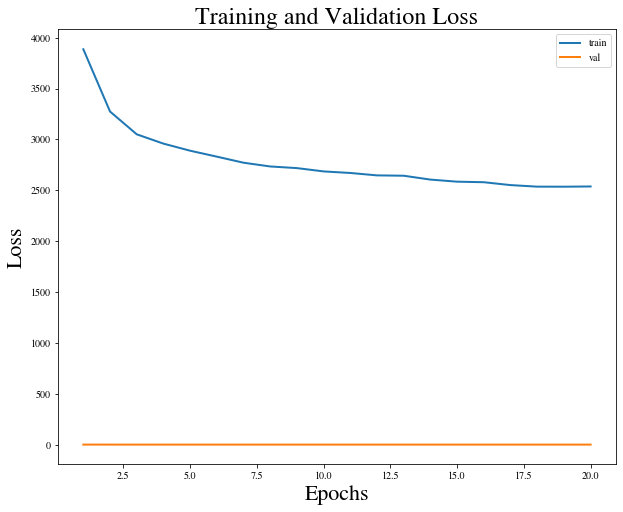

Training epoch 21:  20%|█▉        | 2368/12079 [01:23<05:54, 27.43it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 22: 100%|██████████| 12079/12079 [07:20<00:00, 27.44it/s]


Epoch: 22, train loss: 2362.6362
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_22_loss_2362.6362.pt
Epoch: 22, val loss: 0.2385


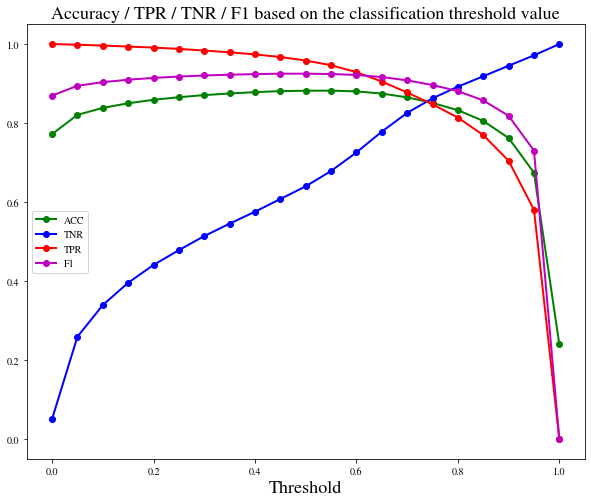

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190779


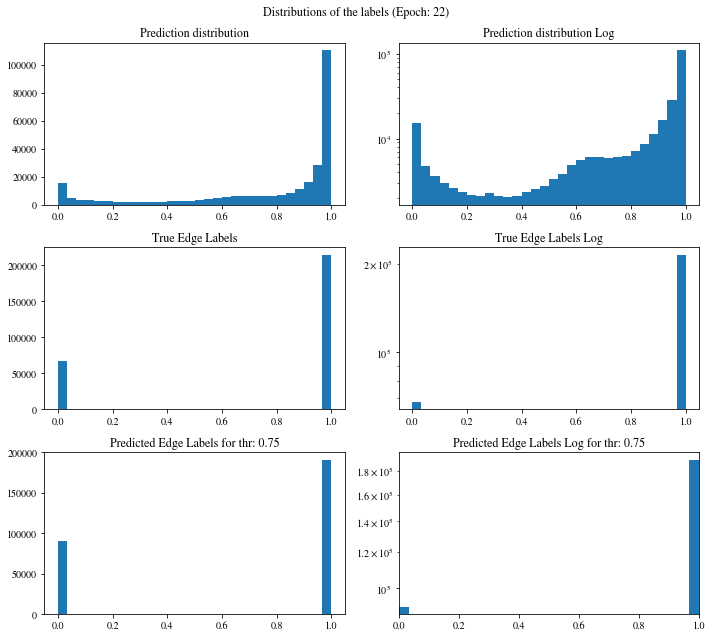

[0.94179958 0.98487896 0.792216   ... 0.65727401 0.40644377 0.22124797]
Confusion matrix:
[[ 58409   9291]
 [ 32679 181488]]

Confusion matrix weighted:
[[0.43138109 0.06861891]
 [0.07629327 0.42370673]]

TN: 58409 	 FN: 32679 	 TP: 181488 	 FP: 9291
Confusion matrix scaled:
[[0.20722185 0.03296235]
 [0.11593766 0.64387814]]

Accuracy: 0.8511
Precision: 0.9513
Negative predictive value: 0.6412
Recall: Correctly classifying 84.7413 % of positive edges
True negative rate: Correctly classifying 86.2762 % of all negative edges
F1 score: 0.8964
[0.84972007 0.86062293] [0.86276219 0.84741347] [0.85619146 0.85396712]
Balanced accuracy: 0.8551
Precision weighted: [0.84972007 0.86062293]
Recall weighted: [0.86276219 0.84741347]
F1 score weighted: [0.85619146 0.85396712]
positive_likelihood_ratio: 6.174781155958765, negative_likelihood_ratio: 0.1768581602148147


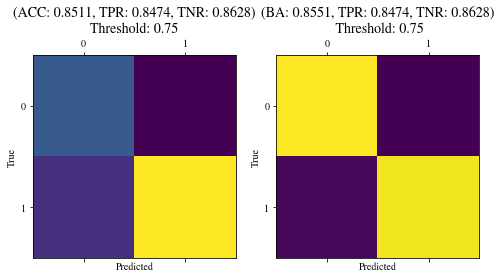

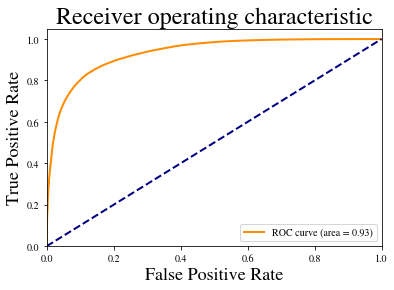

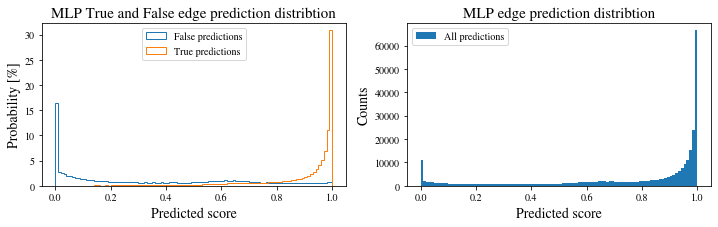

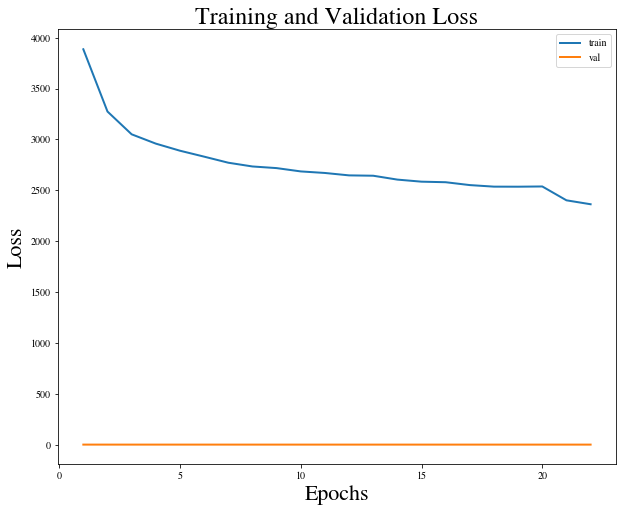

Training epoch 23:  59%|█████▉    | 7176/12079 [04:21<03:10, 25.67it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 25: 100%|██████████| 12079/12079 [07:08<00:00, 28.16it/s]


Epoch: 25, train loss: 2329.7834
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_25_loss_2329.7834.pt
Epoch: 25, val loss: 0.2419


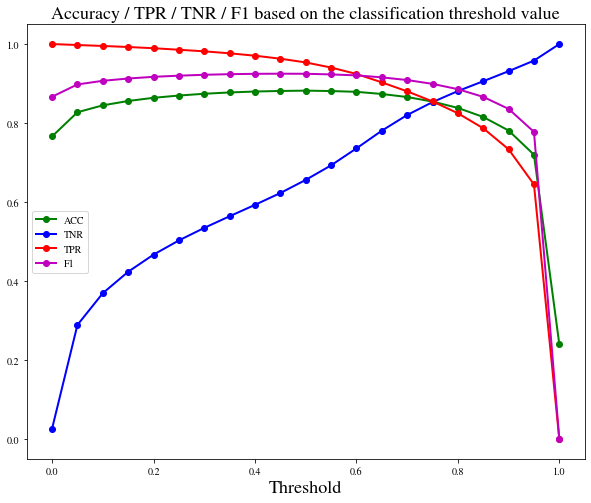

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 193044


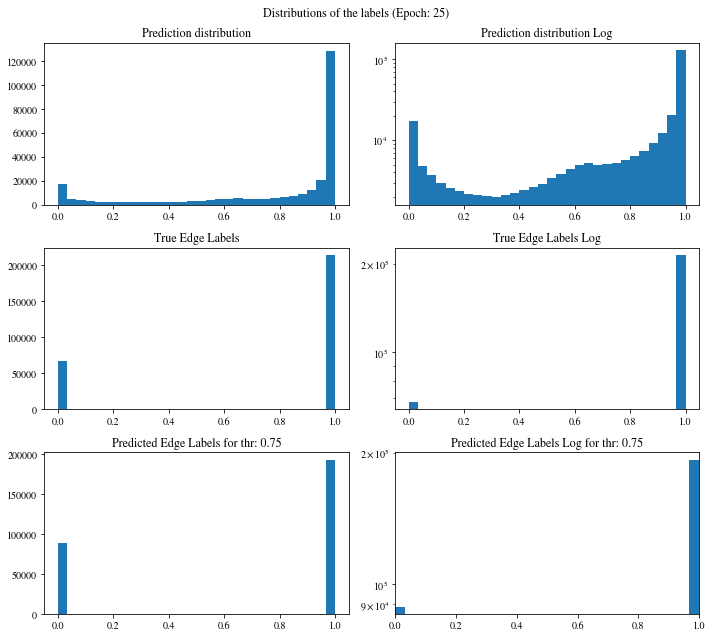

[2.70680577e-01 8.11640501e-01 9.79906142e-01 ... 1.96682096e-01
 5.29064695e-35 7.36000776e-01]
Confusion matrix:
[[ 57758   9942]
 [ 31065 183102]]

Confusion matrix weighted:
[[0.42657312 0.07342688]
 [0.07252518 0.42747482]]

TN: 57758 	 FN: 31065 	 TP: 183102 	 FP: 9942
Confusion matrix scaled:
[[0.20491225 0.03527195]
 [0.11021155 0.64960425]]

Accuracy: 0.8545
Precision: 0.9485
Negative predictive value: 0.6503
Recall: Correctly classifying 85.4950 % of positive edges
True negative rate: Correctly classifying 85.3146 % of all negative edges
F1 score: 0.8993
[0.85468758 0.85341059] [0.85314623 0.85494964] [0.85391621 0.85417942]
Balanced accuracy: 0.8540
Precision weighted: [0.85468758 0.85341059]
Recall weighted: [0.85314623 0.85494964]
F1 score weighted: [0.85391621 0.85417942]
positive_likelihood_ratio: 5.821775374199028, negative_likelihood_ratio: 0.17001816596338623


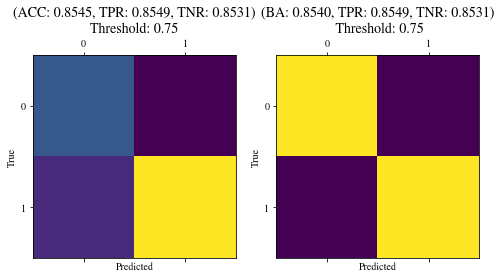

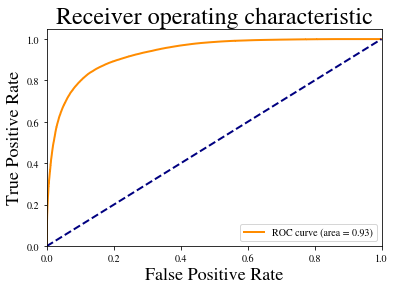

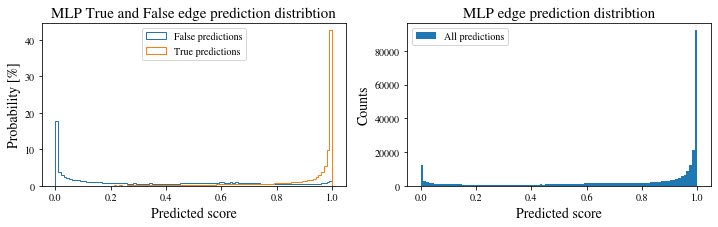

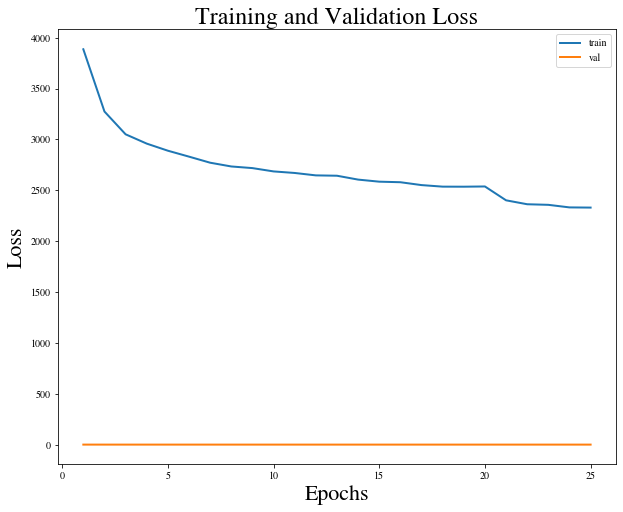

Training epoch 26:   6%|▌         | 726/12079 [00:25<06:53, 27.43it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 27: 100%|██████████| 12079/12079 [07:17<00:00, 27.61it/s]


Epoch: 27, train loss: 2310.5435
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_27_loss_2310.5435.pt
Epoch: 27, val loss: 0.2356


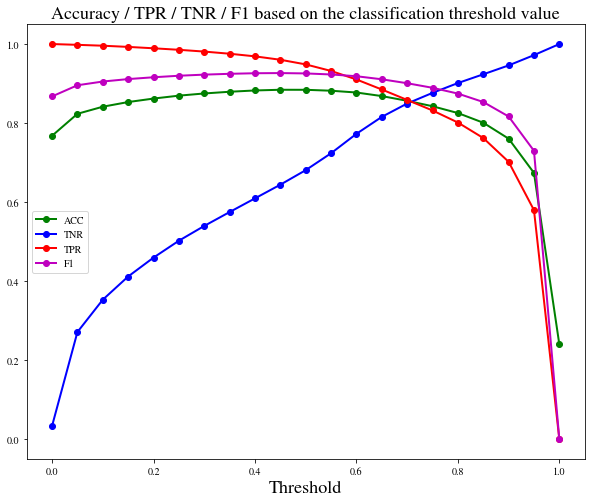

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194073


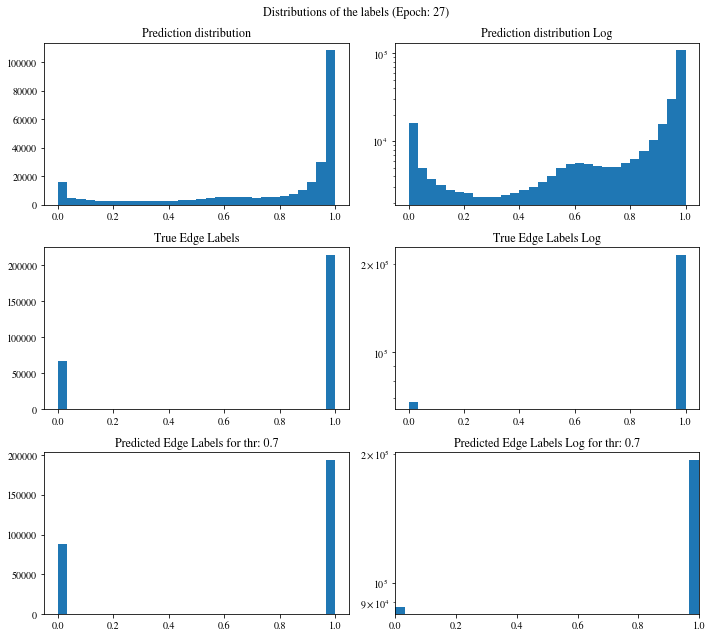

[0.9956246  0.97803074 0.99141204 ... 0.98585922 0.98668808 0.97158933]
Confusion matrix:
[[ 57515  10185]
 [ 30279 183888]]

Confusion matrix weighted:
[[0.42477843 0.07522157]
 [0.07069016 0.42930984]]

TN: 57515 	 FN: 30279 	 TP: 183888 	 FP: 10185
Confusion matrix scaled:
[[0.20405014 0.03613406]
 [0.107423   0.6523928 ]]

Accuracy: 0.8564
Precision: 0.9475
Negative predictive value: 0.6551
Recall: Correctly classifying 85.8620 % of positive edges
True negative rate: Correctly classifying 84.9557 % of all negative edges
F1 score: 0.9009
[0.85732665 0.85090806] [0.84955687 0.85861968] [0.85342408 0.85474647]
Balanced accuracy: 0.8541
Precision weighted: [0.85732665 0.85090806]
Recall weighted: [0.84955687 0.85861968]
F1 score weighted: [0.85342408 0.85474647]
positive_likelihood_ratio: 5.707270693943826, negative_likelihood_ratio: 0.16641655189397772


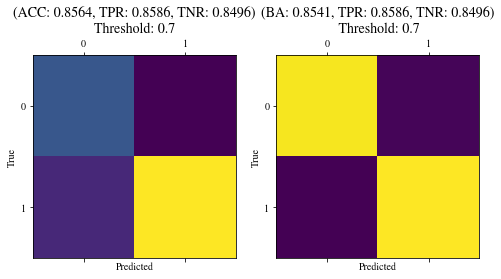

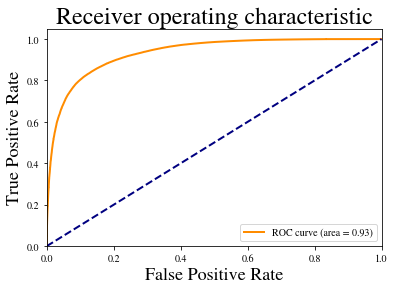

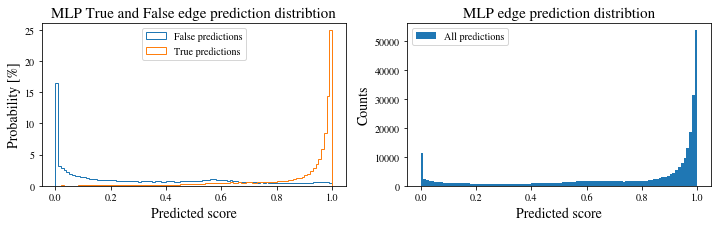

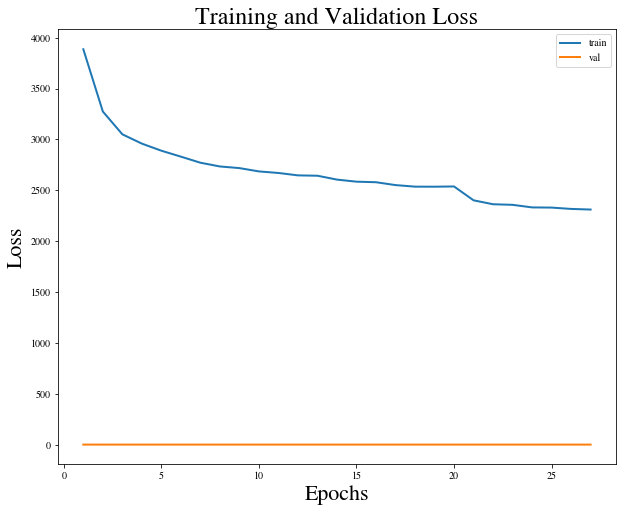

Training epoch 28:  26%|██▌       | 3125/12079 [01:50<05:02, 29.63it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 29: 100%|██████████| 12079/12079 [07:17<00:00, 27.60it/s]


Epoch: 29, train loss: 2304.1870
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_29_loss_2304.1870.pt
Epoch: 29, val loss: 0.2394


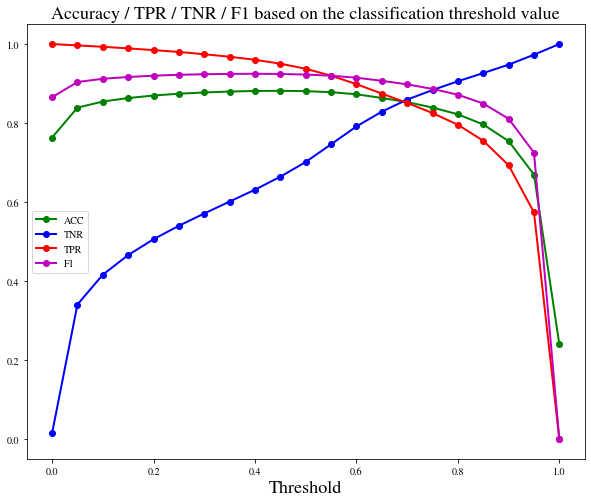

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 191793


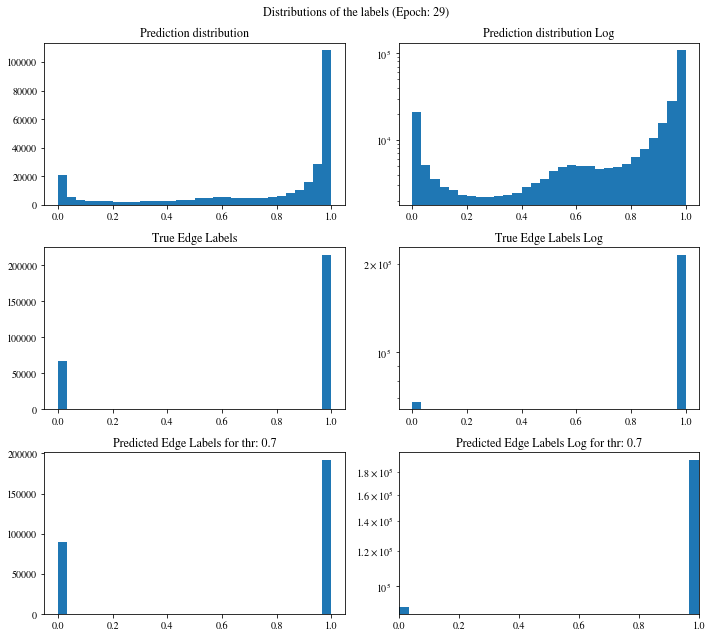

[0.08194295 0.99195236 0.80357993 ... 0.98995566 0.99311185 0.99350727]
Confusion matrix:
[[ 58189   9511]
 [ 31885 182282]]

Confusion matrix weighted:
[[0.42975628 0.07024372]
 [0.07443957 0.42556043]]

TN: 58189 	 FN: 31885 	 TP: 182282 	 FP: 9511
Confusion matrix scaled:
[[0.20644134 0.03374286]
 [0.11312073 0.64669507]]

Accuracy: 0.8531
Precision: 0.9504
Negative predictive value: 0.6460
Recall: Correctly classifying 85.1121 % of positive edges
True negative rate: Correctly classifying 85.9513 % of all negative edges
F1 score: 0.8980
[0.85235981 0.85832365] [0.85951256 0.85112085] [0.85592124 0.85470708]
Balanced accuracy: 0.8553
Precision weighted: [0.85235981 0.85832365]
Recall weighted: [0.85951256 0.85112085]
F1 score weighted: [0.85592124 0.85470708]
positive_likelihood_ratio: 6.058341061423969, negative_likelihood_ratio: 0.17321346242067454


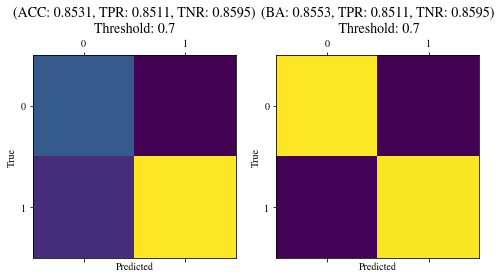

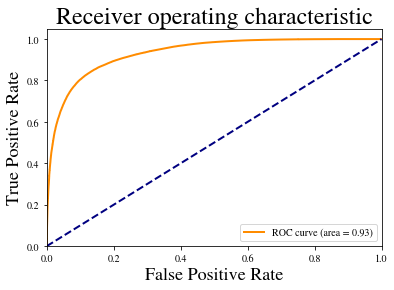

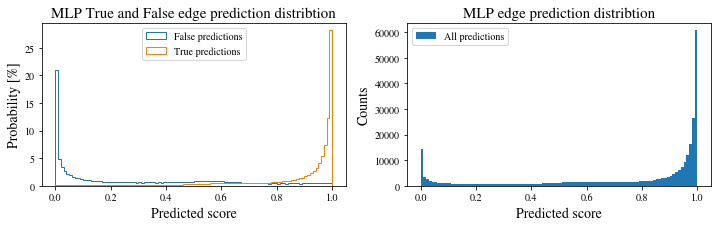

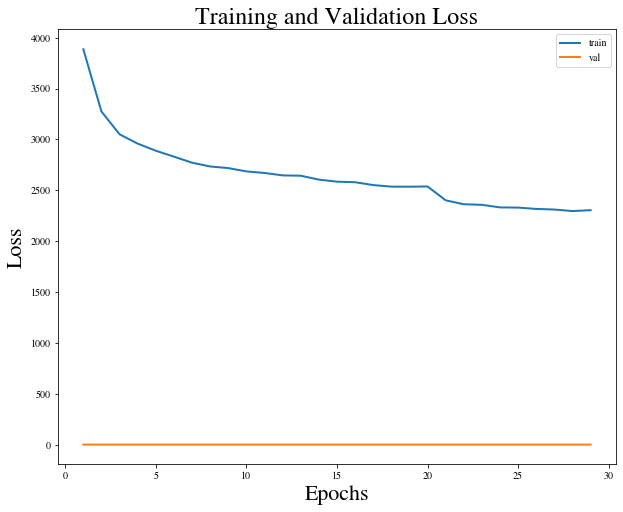

Training epoch 30:  66%|██████▌   | 7978/12079 [04:53<02:27, 27.80it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 32: 100%|██████████| 12079/12079 [07:25<00:00, 27.13it/s]


Epoch: 32, train loss: 2287.6726
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_32_loss_2287.6726.pt
Epoch: 32, val loss: 0.2417


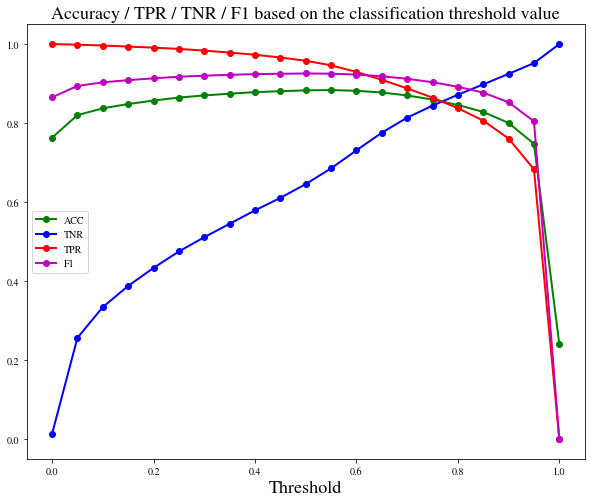

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 191975


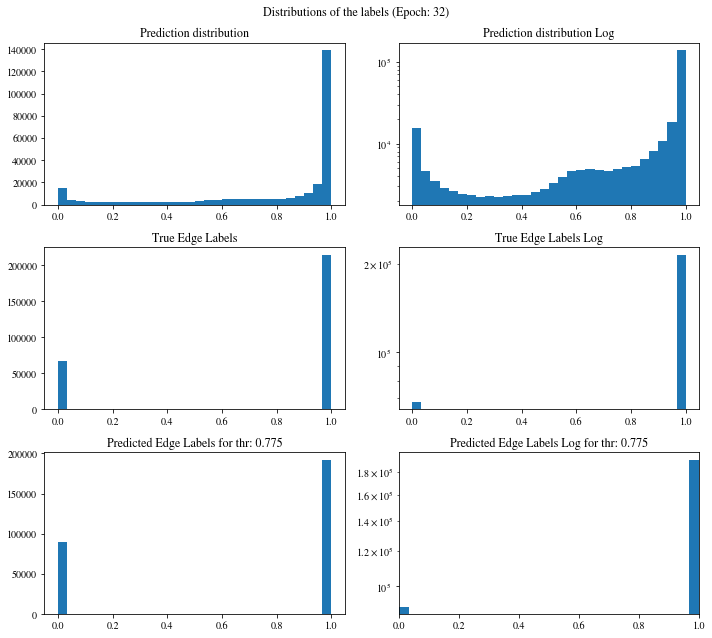

[0.83998787 0.67349195 0.80358964 ... 0.99081427 0.99270177 0.90577877]
Confusion matrix:
[[ 58123   9577]
 [ 31769 182398]]

Confusion matrix weighted:
[[0.42926883 0.07073117]
 [0.07416876 0.42583124]]

TN: 58123 	 FN: 31769 	 TP: 182398 	 FP: 9577
Confusion matrix scaled:
[[0.20620718 0.03397702]
 [0.11270919 0.64710661]]

Accuracy: 0.8533
Precision: 0.9501
Negative predictive value: 0.6466
Recall: Correctly classifying 85.1662 % of positive edges
True negative rate: Correctly classifying 85.8538 % of all negative edges
F1 score: 0.8982
[0.85267537 0.85755835] [0.85853767 0.85166249] [0.85559648 0.85460025]
Balanced accuracy: 0.8551
Precision weighted: [0.85267537 0.85755835]
Recall weighted: [0.85853767 0.85166249]
F1 score weighted: [0.85559648 0.85460025]
positive_likelihood_ratio: 6.020418754961256, negative_likelihood_ratio: 0.17277927126500794


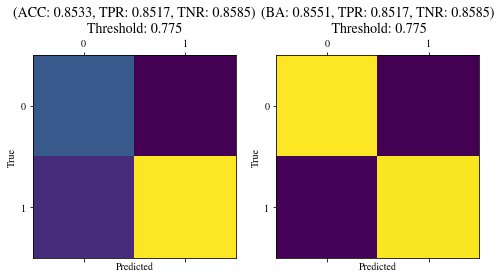

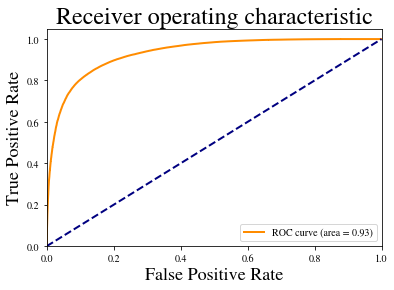

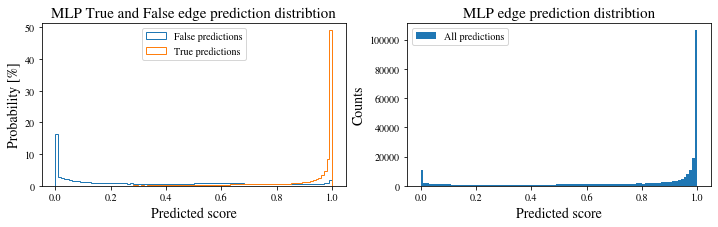

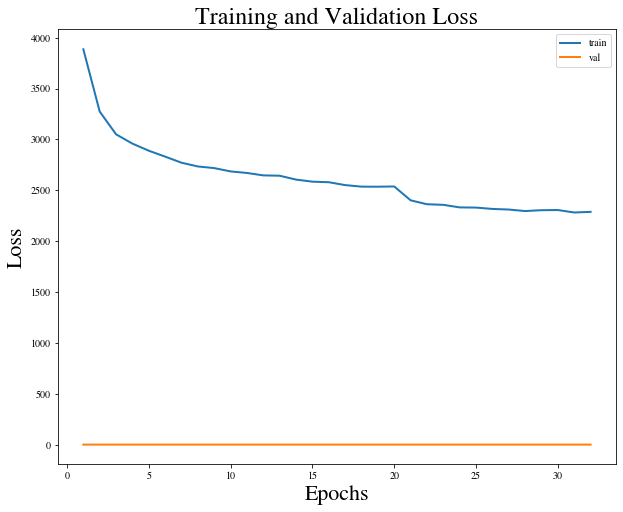

Training epoch 33:   2%|▏         | 238/12079 [00:09<06:33, 30.07it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 34: 100%|██████████| 12079/12079 [07:29<00:00, 26.88it/s]


Epoch: 34, train loss: 2269.0464
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_34_loss_2269.0464.pt
Epoch: 34, val loss: 0.2377


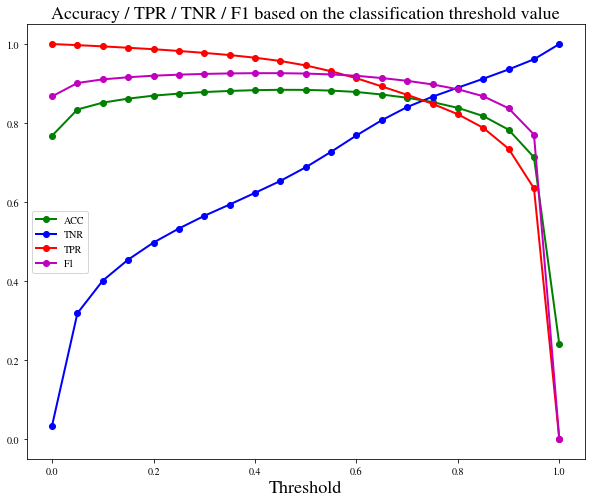

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190812


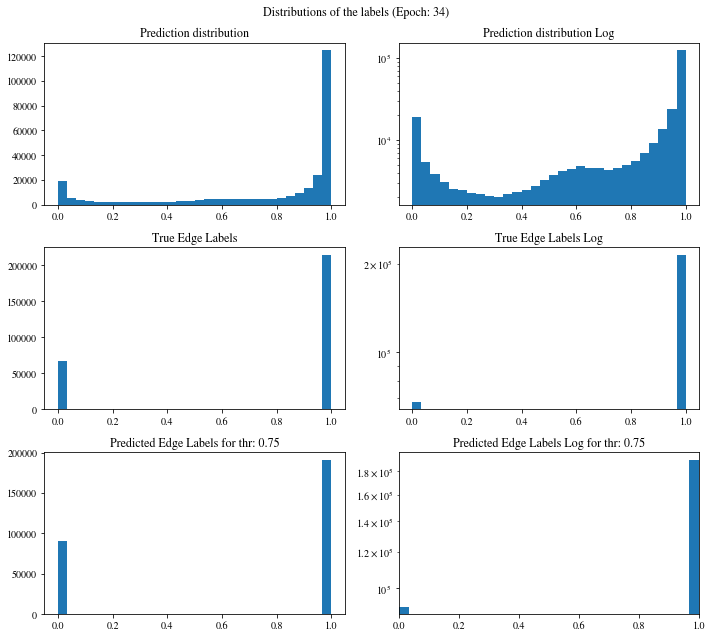

[0.99896646 0.99903274 0.99959892 ... 0.99778026 0.98844171 0.98980647]
Confusion matrix:
[[ 58686   9014]
 [ 32369 181798]]

Confusion matrix weighted:
[[0.43342688 0.06657312]
 [0.07556953 0.42443047]]

TN: 58686 	 FN: 32369 	 TP: 181798 	 FP: 9014
Confusion matrix scaled:
[[0.20820458 0.03197962]
 [0.11483785 0.64497795]]

Accuracy: 0.8532
Precision: 0.9528
Negative predictive value: 0.6445
Recall: Correctly classifying 84.8861 % of positive edges
True negative rate: Correctly classifying 86.6854 % of all negative edges
F1 score: 0.8978
[0.85153229 0.86441419] [0.86685377 0.84886094] [0.85912472 0.85656697]
Balanced accuracy: 0.8579
Precision weighted: [0.85153229 0.86441419]
Recall weighted: [0.86685377 0.84886094]
F1 score weighted: [0.85912472 0.85656697]
positive_likelihood_ratio: 6.375403299513279, negative_likelihood_ratio: 0.17435358787764207


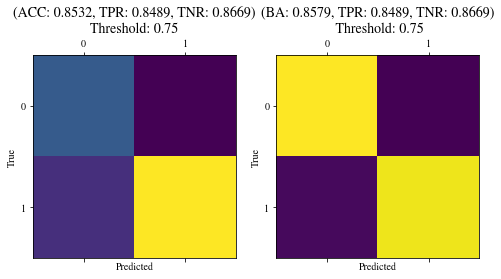

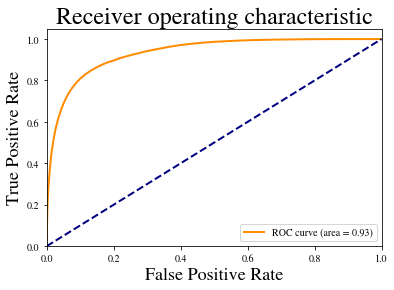

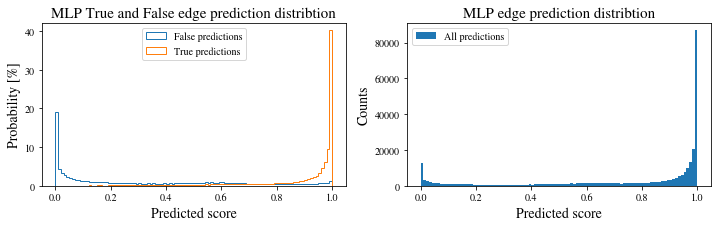

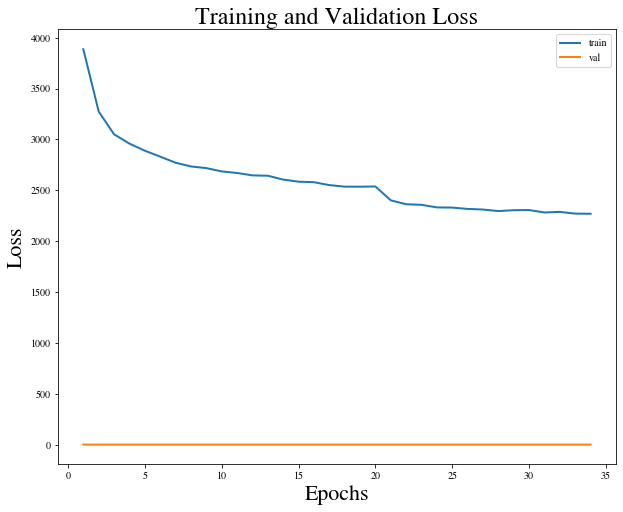

Training epoch 35:  10%|█         | 1230/12079 [00:43<05:35, 32.34it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 36: 100%|██████████| 12079/12079 [07:19<00:00, 27.49it/s]


Epoch: 36, train loss: 2260.2793
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_36_loss_2260.2793.pt
Epoch: 36, val loss: 0.2332


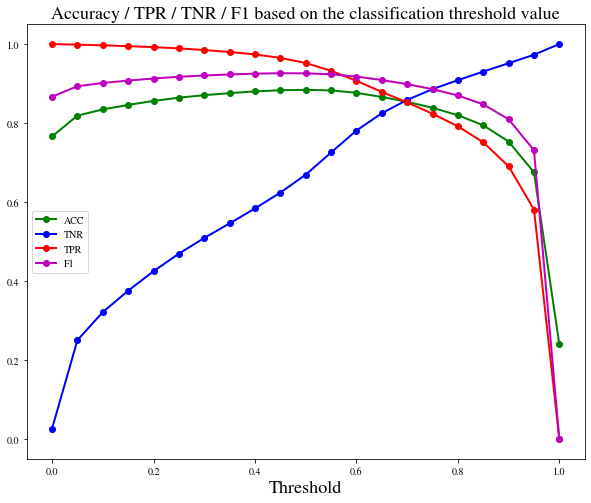

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 192081


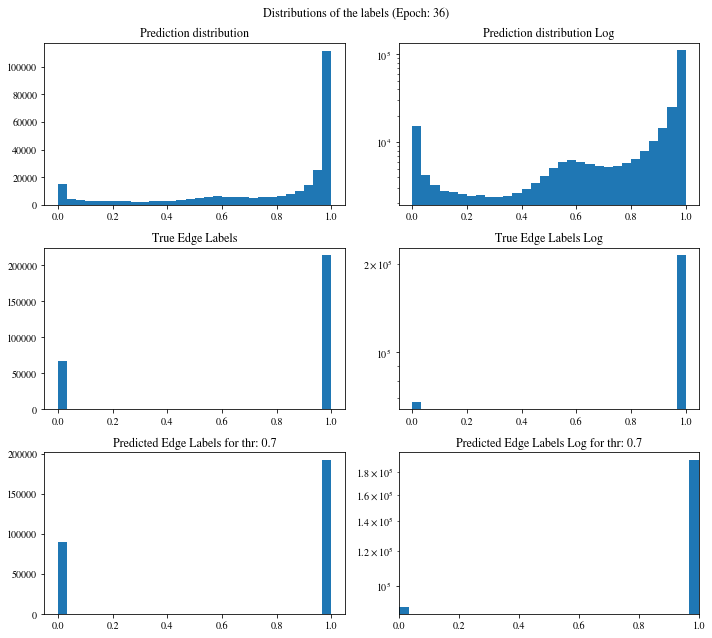

[0.83480936 0.85404259 0.86672211 ... 0.99114275 0.98747474 0.98459333]
Confusion matrix:
[[ 58139   9561]
 [ 31647 182520]]

Confusion matrix weighted:
[[0.429387   0.070613  ]
 [0.07388393 0.42611607]]

TN: 58139 	 FN: 31647 	 TP: 182520 	 FP: 9561
Confusion matrix scaled:
[[0.20626395 0.03392025]
 [0.11227636 0.64753944]]

Accuracy: 0.8538
Precision: 0.9502
Negative predictive value: 0.6475
Recall: Correctly classifying 85.2232 % of positive edges
True negative rate: Correctly classifying 85.8774 % of all negative edges
F1 score: 0.8986
[0.85319253 0.85784404] [0.858774   0.85223214] [0.85597417 0.85502888]
Balanced accuracy: 0.8555
Precision weighted: [0.85319253 0.85784404]
Recall weighted: [0.858774   0.85223214]
F1 score weighted: [0.85597417 0.85502888]
positive_likelihood_ratio: 6.034527313886521, negative_likelihood_ratio: 0.1720683938824364


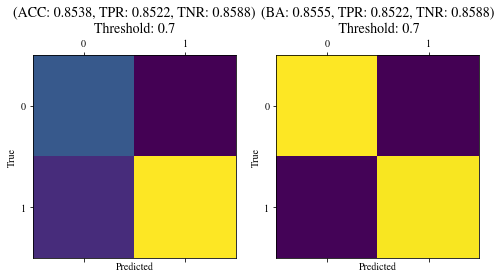

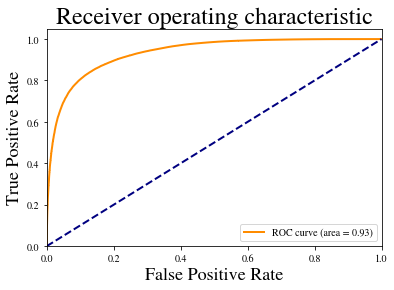

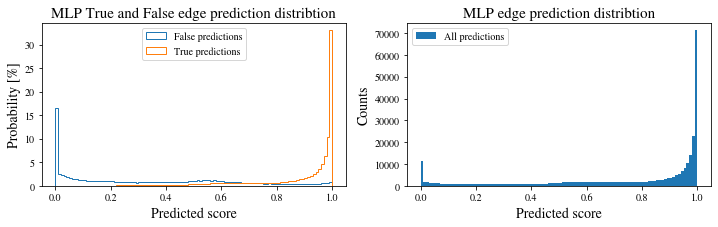

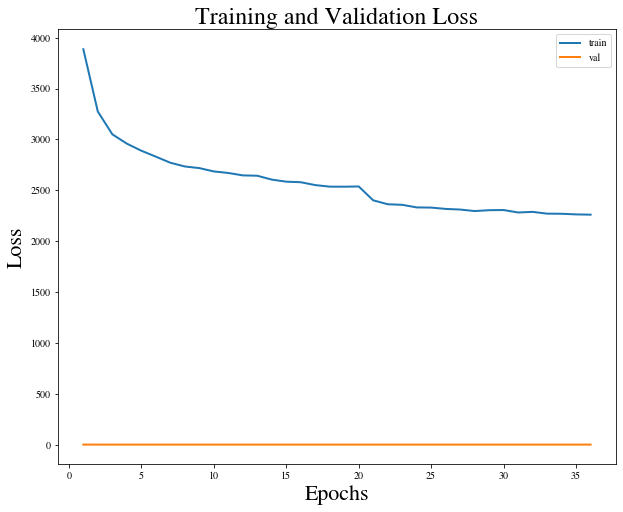

Training epoch 37:  39%|███▉      | 4714/12079 [02:54<04:58, 24.65it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 38: 100%|██████████| 12079/12079 [07:22<00:00, 27.27it/s]


Epoch: 38, train loss: 2264.2874
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_38_loss_2264.2874.pt
Epoch: 38, val loss: 0.2380


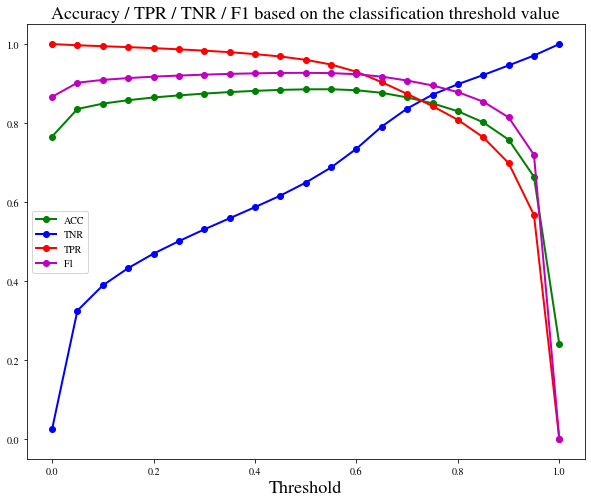

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193692


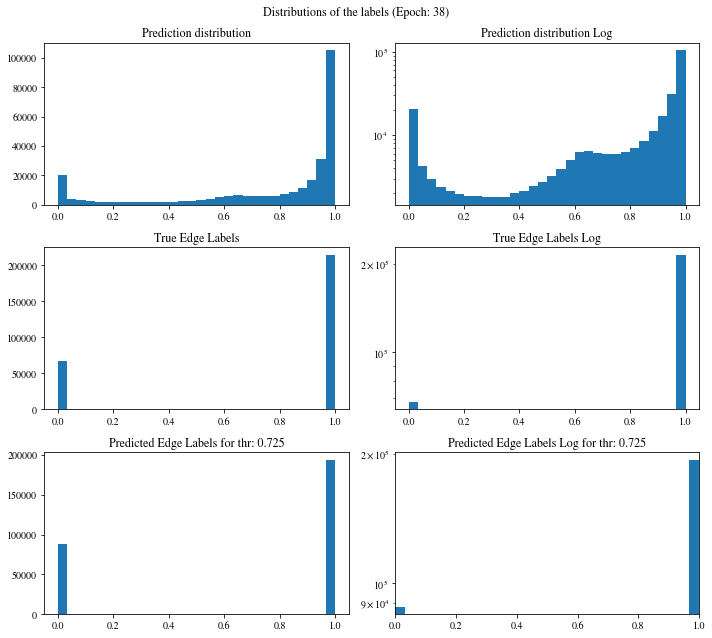

[0.99802244 0.99105048 0.99920624 ... 0.98971027 0.95472705 0.98820323]
Confusion matrix:
[[ 57928   9772]
 [ 30247 183920]]

Confusion matrix weighted:
[[0.42782866 0.07217134]
 [0.07061545 0.42938455]]

TN: 57928 	 FN: 30247 	 TP: 183920 	 FP: 9772
Confusion matrix scaled:
[[0.20551537 0.03466883]
 [0.10730948 0.65250632]]

Accuracy: 0.8580
Precision: 0.9495
Negative predictive value: 0.6570
Recall: Correctly classifying 85.8769 % of positive edges
True negative rate: Correctly classifying 85.5657 % of all negative edges
F1 score: 0.9019
[0.85832824 0.85610508] [0.85565731 0.85876909] [0.85699069 0.85743502]
Balanced accuracy: 0.8572
Precision weighted: [0.85832824 0.85610508]
Recall weighted: [0.85565731 0.85876909]
F1 score weighted: [0.85699069 0.85743502]
positive_likelihood_ratio: 5.949515706964314, negative_likelihood_ratio: 0.16505545697322072


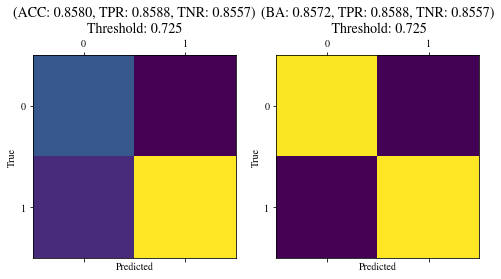

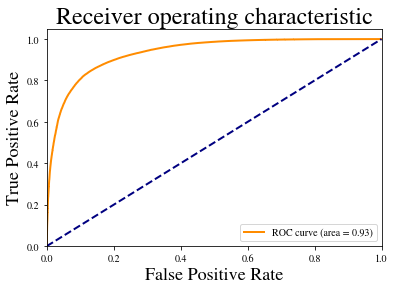

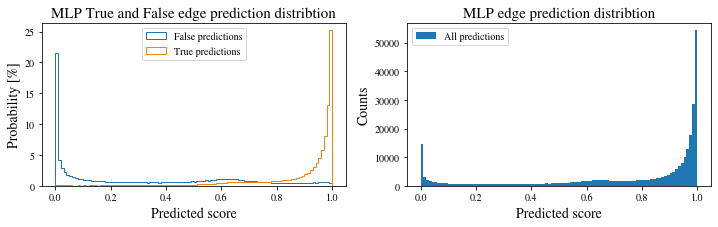

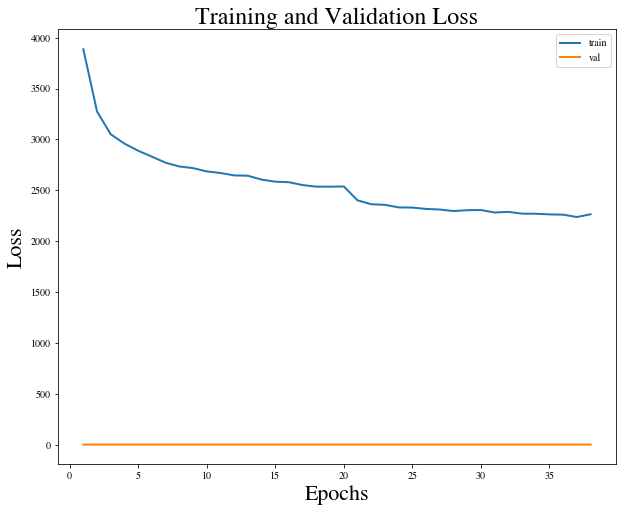

Training epoch 39:  72%|███████▏  | 8638/12079 [05:08<02:29, 22.96it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 40: 100%|██████████| 12079/12079 [07:19<00:00, 27.47it/s]


Epoch: 40, train loss: 2238.0432
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_40_loss_2238.0432.pt
Epoch: 40, val loss: 0.2407


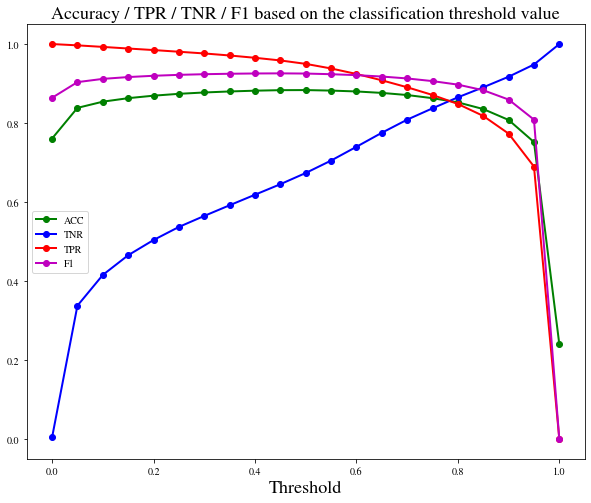

Chosen classification threshold is: 0.8
Edge labels: number of positive: 214167
Predictions: number of positive: 190828


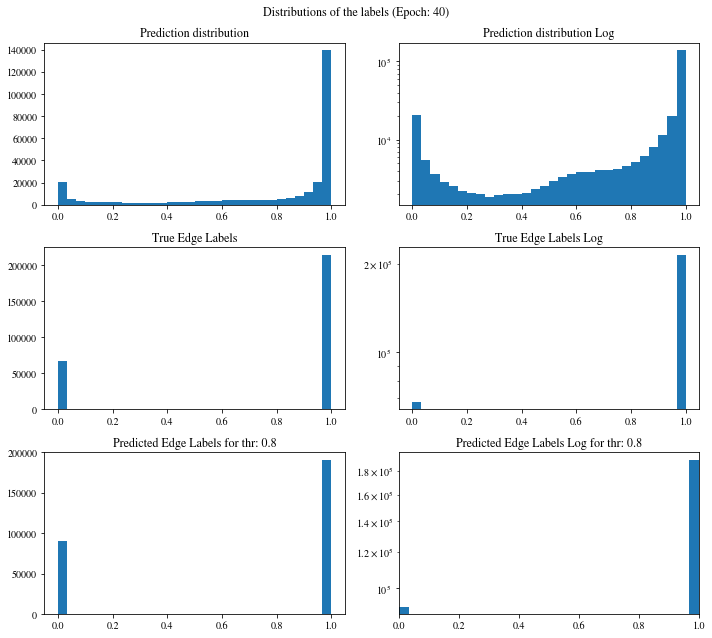

[0.99557328 0.99288684 0.99092686 ... 0.95180178 0.97569931 0.98025048]
Confusion matrix:
[[ 58578   9122]
 [ 32461 181706]]

Confusion matrix weighted:
[[0.43262925 0.06737075]
 [0.07578432 0.42421568]]

TN: 58578 	 FN: 32461 	 TP: 181706 	 FP: 9122
Confusion matrix scaled:
[[0.20782142 0.03236278]
 [0.11516424 0.64465156]]

Accuracy: 0.8525
Precision: 0.9522
Negative predictive value: 0.6434
Recall: Correctly classifying 84.8431 % of positive edges
True negative rate: Correctly classifying 86.5258 % of all negative edges
F1 score: 0.8973
[0.85093962 0.86295238] [0.86525849 0.84843136] [0.85803932 0.85563026]
Balanced accuracy: 0.8568
Precision weighted: [0.85093962 0.86295238]
Recall weighted: [0.86525849 0.84843136]
F1 score weighted: [0.85803932 0.85563026]
positive_likelihood_ratio: 6.296733541299076, negative_likelihood_ratio: 0.1751715086938753


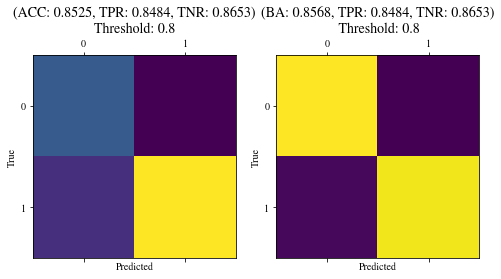

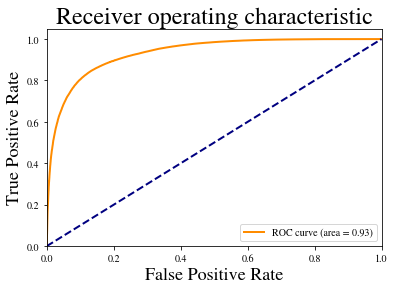

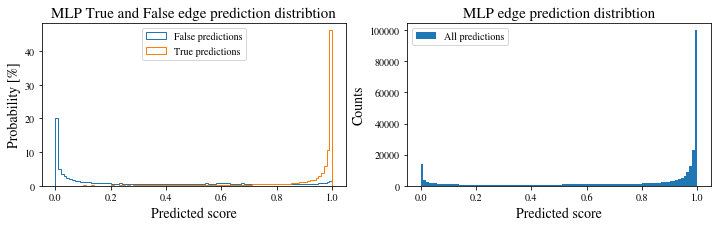

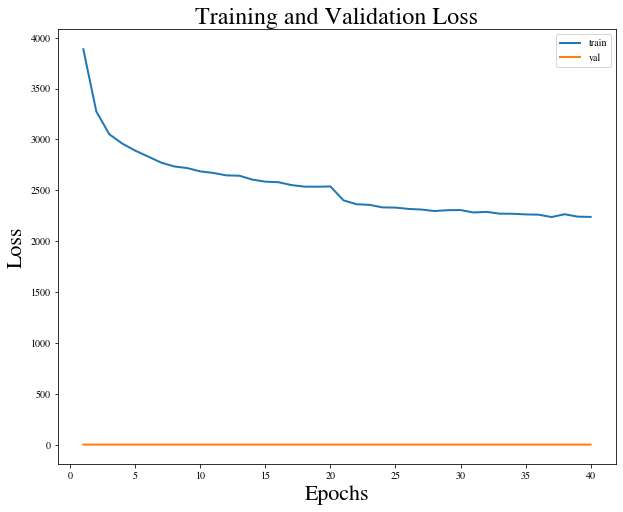

Training epoch 41: 100%|██████████| 12079/12079 [07:11<00:00, 28.01it/s]


Epoch: 41, train loss: 2173.8325
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_41_loss_2173.8325.pt
Epoch: 41, val loss: 0.2341


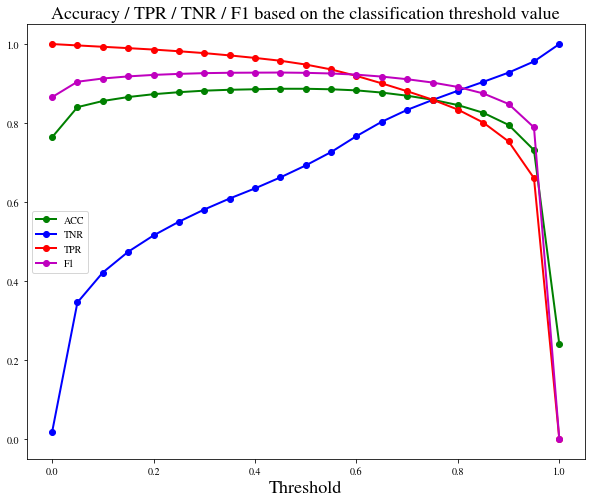

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 193621


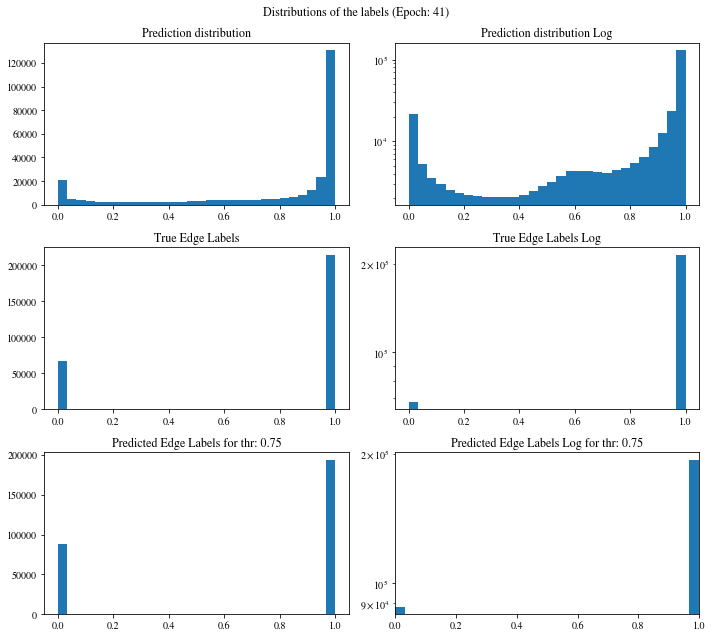

[0.99819142 0.9994837  0.99936563 ... 0.69035393 0.64605838 0.33757415]
Confusion matrix:
[[ 58120   9580]
 [ 30126 184041]]

Confusion matrix weighted:
[[0.42924668 0.07075332]
 [0.07033296 0.42966704]]

TN: 58120 	 FN: 30126 	 TP: 184041 	 FP: 9580
Confusion matrix scaled:
[[0.20619654 0.03398766]
 [0.1068802  0.6529356 ]]

Accuracy: 0.8591
Precision: 0.9505
Negative predictive value: 0.6586
Recall: Correctly classifying 85.9334 % of positive edges
True negative rate: Correctly classifying 85.8493 % of all negative edges
F1 score: 0.9026
[0.85921571 0.85861222] [0.85849335 0.85933407] [0.85885438 0.85897299]
Balanced accuracy: 0.8589
Precision weighted: [0.85921571 0.85861222]
Recall weighted: [0.85849335 0.85933407]
F1 score weighted: [0.85885438 0.85897299]
positive_likelihood_ratio: 6.072747036722645, negative_likelihood_ratio: 0.16385208857875191


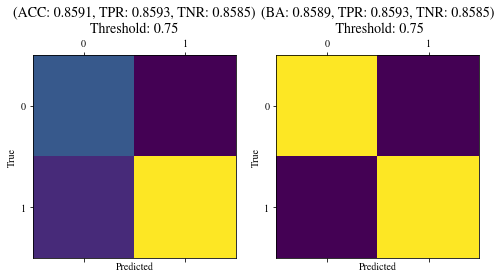

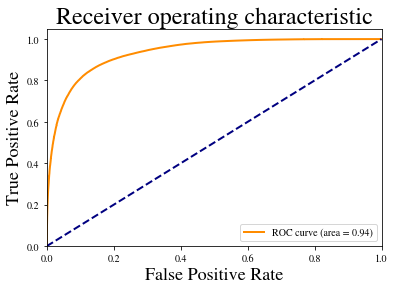

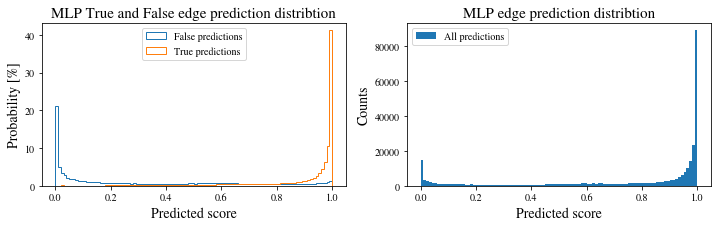

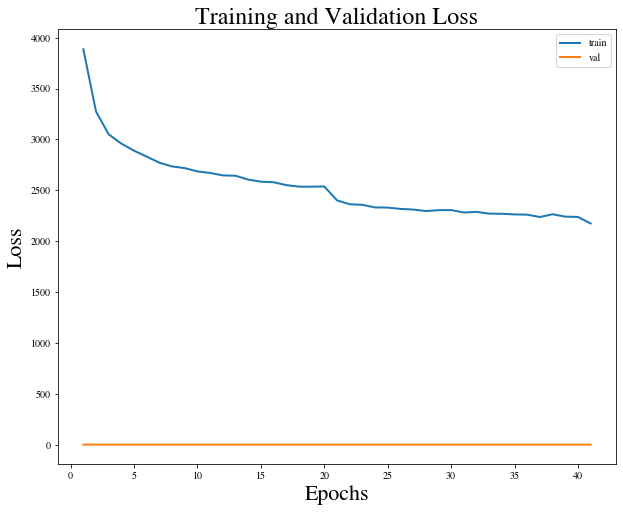

Training epoch 42: 100%|██████████| 12079/12079 [07:31<00:00, 26.76it/s]


Epoch: 42, train loss: 2156.6362
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_42_loss_2156.6362.pt


Training epoch 43: 100%|██████████| 12079/12079 [07:24<00:00, 27.19it/s]


Epoch: 43, train loss: 2139.2070
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_43_loss_2139.2070.pt
Epoch: 43, val loss: 0.2333


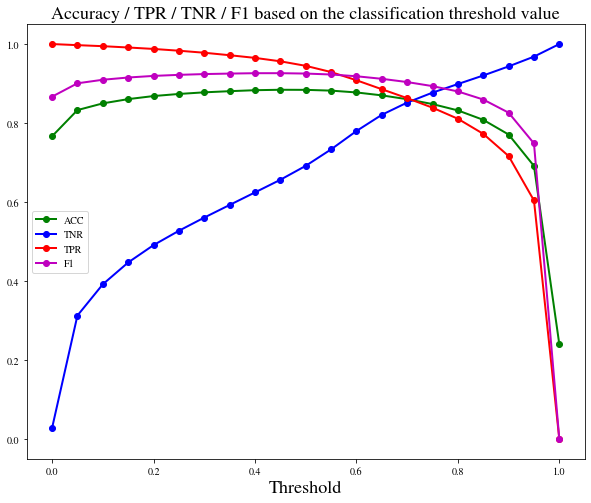

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194878


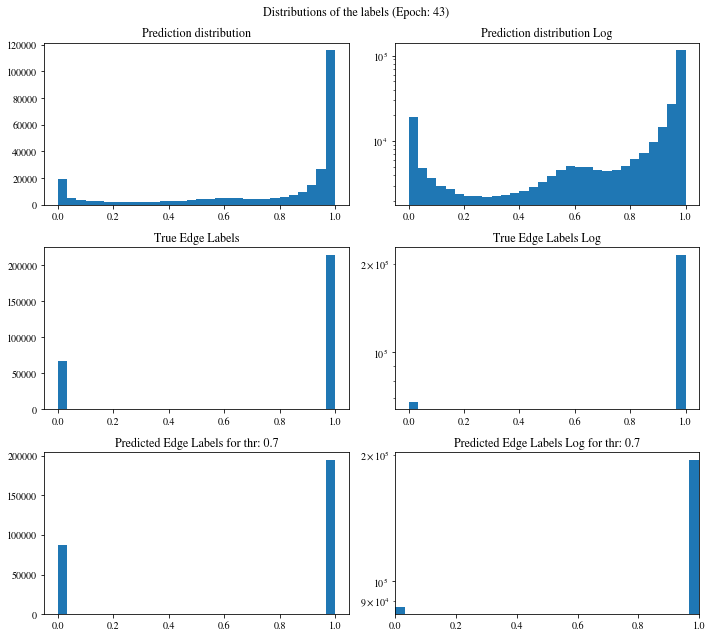

[0.98790038 0.99964881 0.9999311  ... 0.98392695 0.9763158  0.9876287 ]
Confusion matrix:
[[ 57679  10021]
 [ 29310 184857]]

Confusion matrix weighted:
[[0.42598966 0.07401034]
 [0.06842791 0.43157209]]

TN: 57679 	 FN: 29310 	 TP: 184857 	 FP: 10021
Confusion matrix scaled:
[[0.20463197 0.03555223]
 [0.10398521 0.65583059]]

Accuracy: 0.8605
Precision: 0.9486
Negative predictive value: 0.6631
Recall: Correctly classifying 86.3144 % of positive edges
True negative rate: Correctly classifying 85.1979 % of all negative edges
F1 score: 0.9038
[0.86159895 0.8536137 ] [0.85197932 0.86314418] [0.85676214 0.85835249]
Balanced accuracy: 0.8576
Precision weighted: [0.86159895 0.8536137 ]
Recall weighted: [0.85197932 0.86314418]
F1 score weighted: [0.85676214 0.85835249]
positive_likelihood_ratio: 5.831240506242554, negative_likelihood_ratio: 0.160632793338015


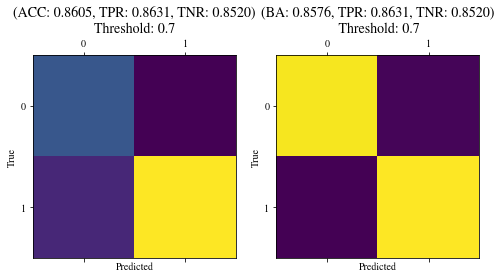

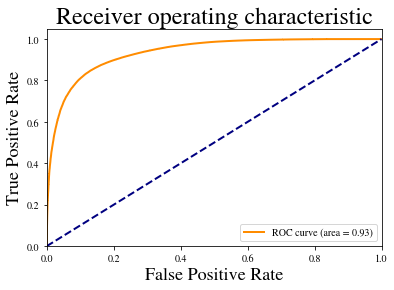

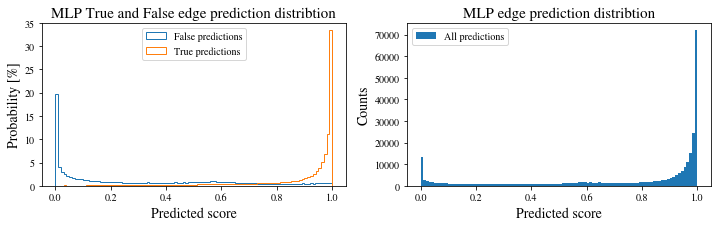

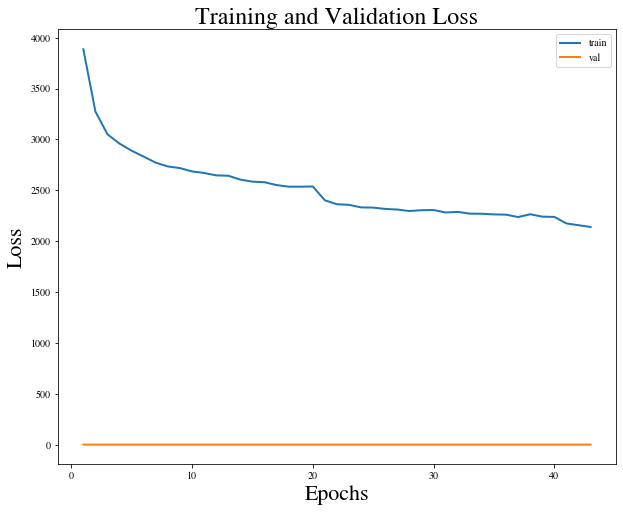

Training epoch 44:   6%|▋         | 758/12079 [00:27<05:48, 32.52it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 45: 100%|██████████| 12079/12079 [07:23<00:00, 27.23it/s]


Epoch: 45, train loss: 2147.1345
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_45_loss_2147.1345.pt
Epoch: 45, val loss: 0.2328


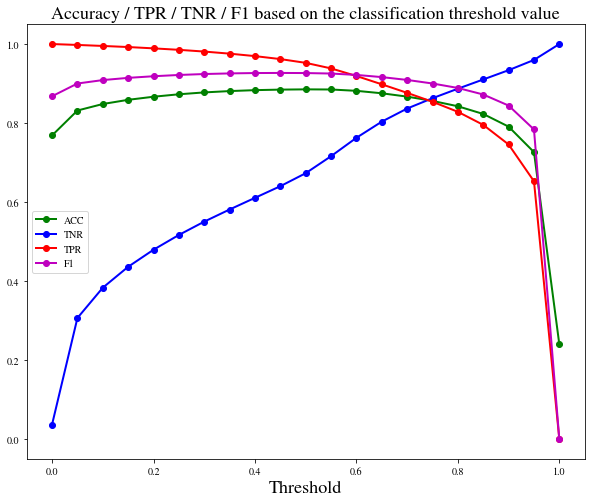

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192163


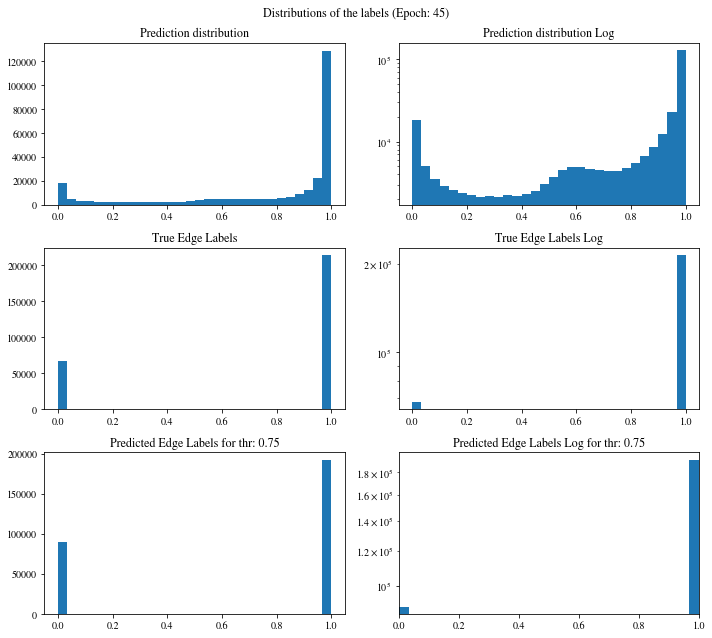

[0.89053917 0.92468059 0.90331638 ... 0.8457948  0.81854016 0.87952602]
Confusion matrix:
[[ 58427   9273]
 [ 31277 182890]]

Confusion matrix weighted:
[[0.43151403 0.06848597]
 [0.07302012 0.42697988]]

TN: 58427 	 FN: 31277 	 TP: 182890 	 FP: 9273
Confusion matrix scaled:
[[0.20728571 0.03289849]
 [0.11096368 0.64885212]]

Accuracy: 0.8561
Precision: 0.9517
Negative predictive value: 0.6513
Recall: Correctly classifying 85.3960 % of positive edges
True negative rate: Correctly classifying 86.3028 % of all negative edges
F1 score: 0.9002
[0.8552722  0.86177459] [0.86302806 0.85395976] [0.85913263 0.85784938]
Balanced accuracy: 0.8585
Precision weighted: [0.8552722  0.86177459]
Recall weighted: [0.86302806 0.85395976]
F1 score weighted: [0.85913263 0.85784938]
positive_likelihood_ratio: 6.234560096766307, negative_likelihood_ratio: 0.1692184131084265


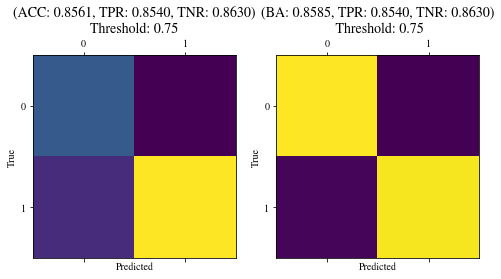

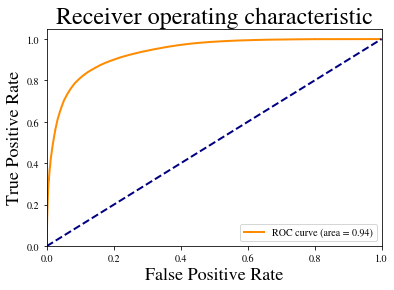

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 47: 100%|██████████| 12079/12079 [07:21<00:00, 27.36it/s]


Epoch: 47, train loss: 2125.0947
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_47_loss_2125.0947.pt
Epoch: 47, val loss: 0.2309


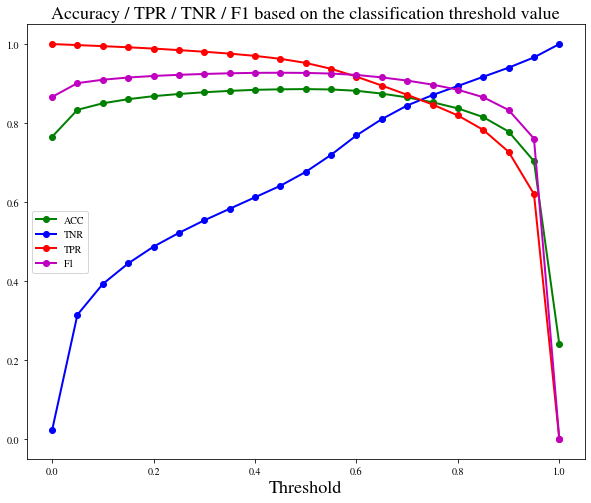

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193628


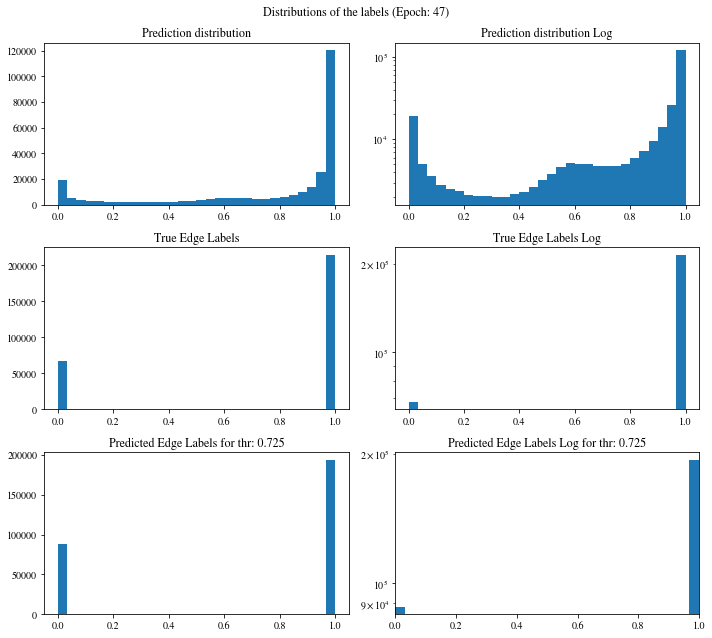

[9.96642947e-01 9.98921990e-01 9.98733103e-01 ... 6.45020247e-01
 1.63040852e-07 6.74167275e-01]
Confusion matrix:
[[ 58124   9576]
 [ 30115 184052]]

Confusion matrix weighted:
[[0.42927622 0.07072378]
 [0.07030728 0.42969272]]

TN: 58124 	 FN: 30115 	 TP: 184052 	 FP: 9576
Confusion matrix scaled:
[[0.20621073 0.03397347]
 [0.10684117 0.65297463]]

Accuracy: 0.8592
Precision: 0.9505
Negative predictive value: 0.6587
Recall: Correctly classifying 85.9385 % of positive edges
True negative rate: Correctly classifying 85.8552 % of all negative edges
F1 score: 0.9027
[0.8592682  0.85867016] [0.85855244 0.85938543] [0.85891017 0.85902765]
Balanced accuracy: 0.8590
Precision weighted: [0.8592682  0.85867016]
Recall weighted: [0.85855244 0.85938543]
F1 score weighted: [0.85891017 0.85902765]
positive_likelihood_ratio: 6.075646805016139, negative_likelihood_ratio: 0.1637809888370631


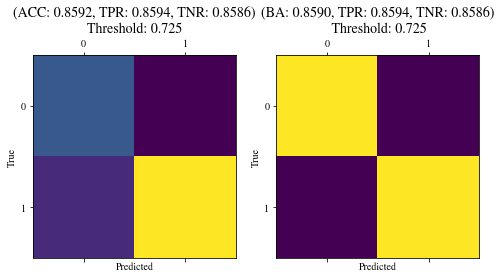

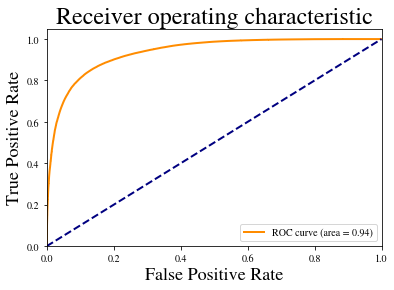

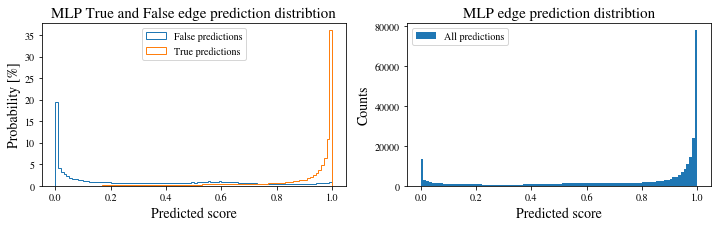

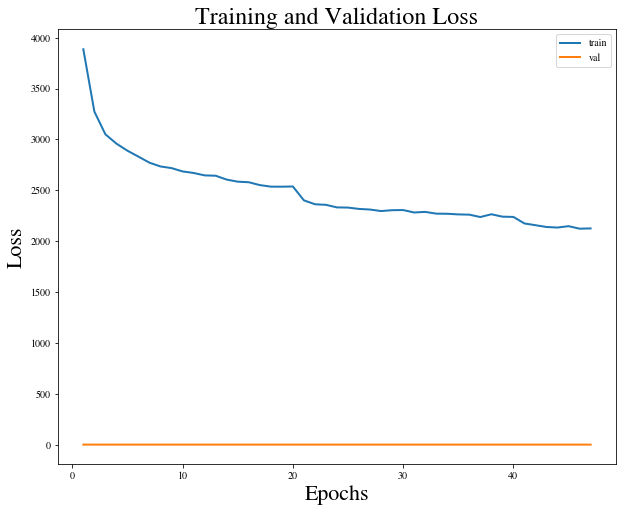

Training epoch 48:  39%|███▉      | 4683/12079 [02:51<04:27, 27.64it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 48: 100%|██████████| 12079/12079 [07:14<00:00, 27.77it/s]


Epoch: 48, train loss: 2116.8750
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH/model_epoch_48_loss_2116.8750.pt
Epoch: 48, val loss: 0.2328


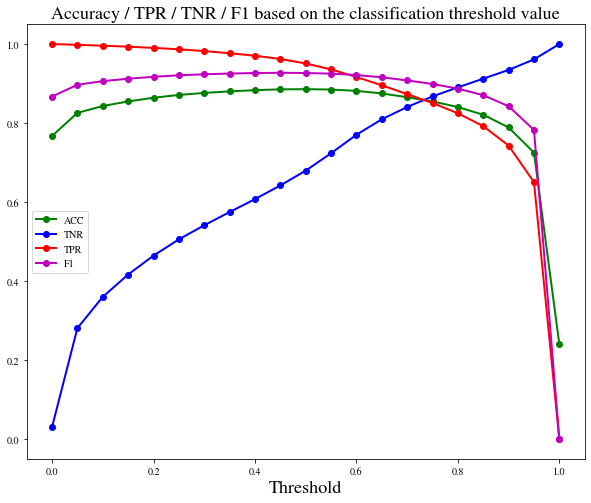

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 191186


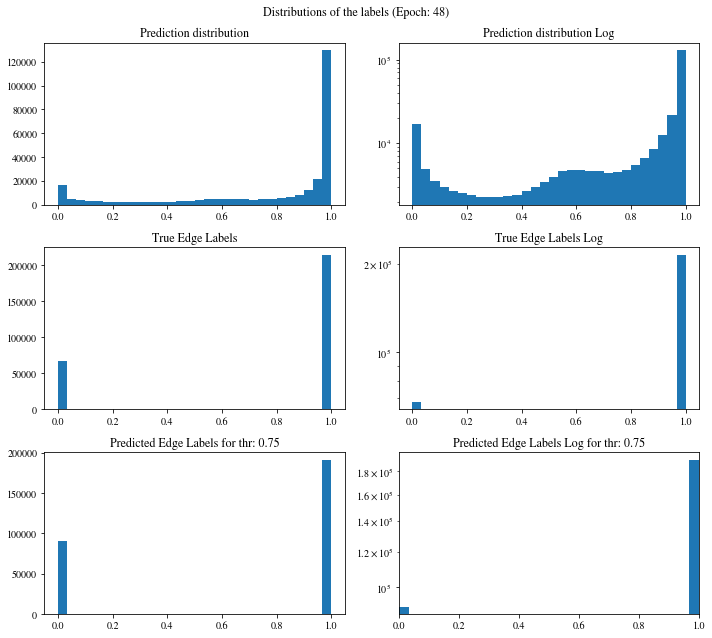

[0.98841965 0.99304819 0.98539019 ... 0.15706831 0.11272864 0.15249769]
Confusion matrix:
[[ 58731   8969]
 [ 31950 182217]]

Confusion matrix weighted:
[[0.43375923 0.06624077]
 [0.07459132 0.42540868]]

TN: 58731 	 FN: 31950 	 TP: 182217 	 FP: 8969
Confusion matrix scaled:
[[0.20836423 0.03181997]
 [0.11335133 0.64646447]]

Accuracy: 0.8548
Precision: 0.9531
Negative predictive value: 0.6477
Recall: Correctly classifying 85.0817 % of positive edges
True negative rate: Correctly classifying 86.7518 % of all negative edges
F1 score: 0.8991
[0.85326794 0.86526829] [0.86751846 0.85081735] [0.8603342  0.85798198]
Balanced accuracy: 0.8592
Precision weighted: [0.85326794 0.86526829]
Recall weighted: [0.86751846 0.85081735]
F1 score weighted: [0.8603342  0.85798198]
positive_likelihood_ratio: 6.4221579647085685, negative_likelihood_ratio: 0.17196480929200675


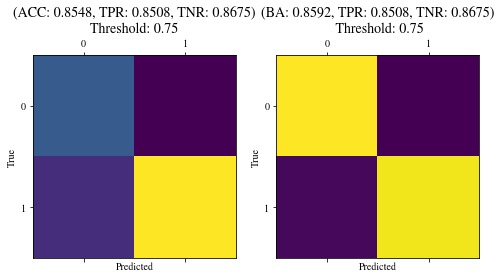

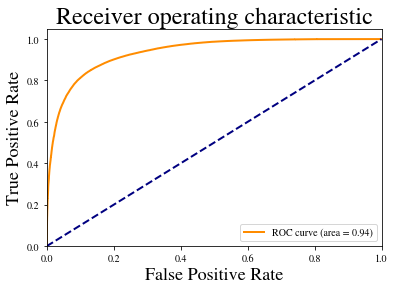

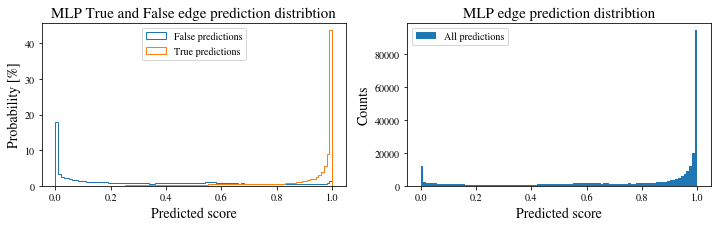

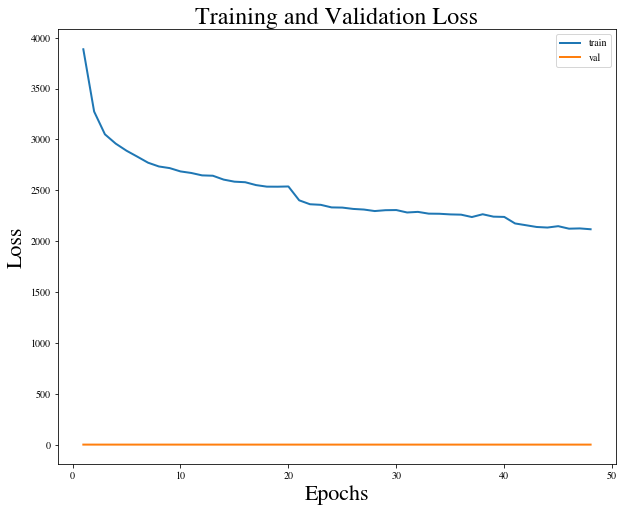

Training epoch 49:  85%|████████▌ | 10324/12079 [06:16<01:06, 26.27it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



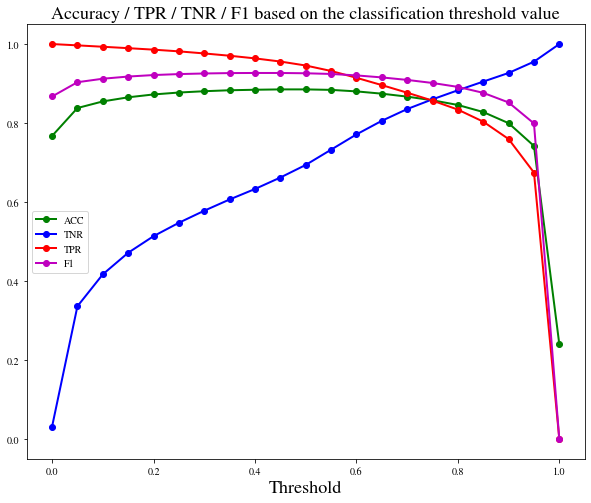

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192991


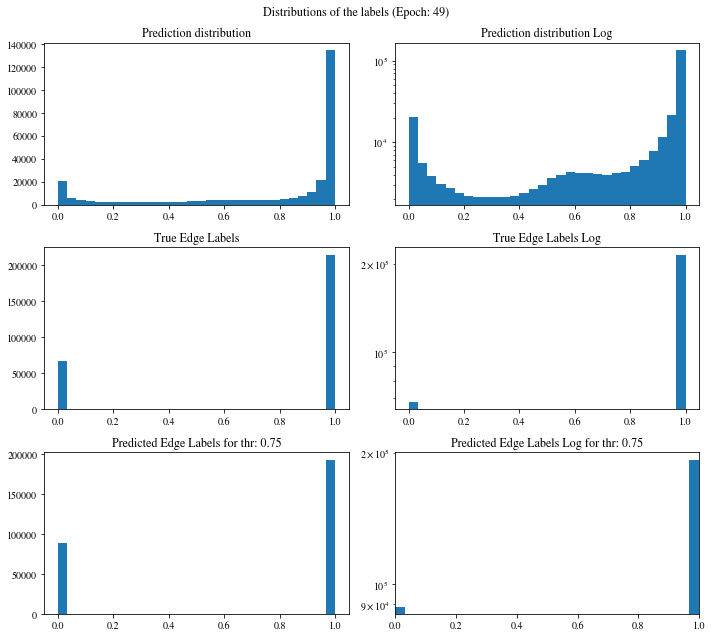

[9.98739541e-01 9.97703850e-01 9.98897552e-01 ... 4.82559187e-07
 5.88786840e-01 1.46638493e-13]
Confusion matrix:
[[ 58238   9462]
 [ 30638 183529]]

Confusion matrix weighted:
[[0.43011817 0.06988183]
 [0.07152829 0.42847171]]

TN: 58238 	 FN: 30638 	 TP: 183529 	 FP: 9462
Confusion matrix scaled:
[[0.20661518 0.03356902]
 [0.10869665 0.65111914]]

Accuracy: 0.8577
Precision: 0.9510
Negative predictive value: 0.6553
Recall: Correctly classifying 85.6943 % of positive edges
True negative rate: Correctly classifying 86.0236 % of all negative edges
F1 score: 0.9015
[0.85741294 0.85977459] [0.86023634 0.85694341] [0.85882232 0.85835666]
Balanced accuracy: 0.8586
Precision weighted: [0.85741294 0.85977459]
Recall weighted: [0.86023634 0.85694341]
F1 score weighted: [0.85882232 0.85835666]
positive_likelihood_ratio: 6.131374876517072, negative_likelihood_ratio: 0.16629916752627938


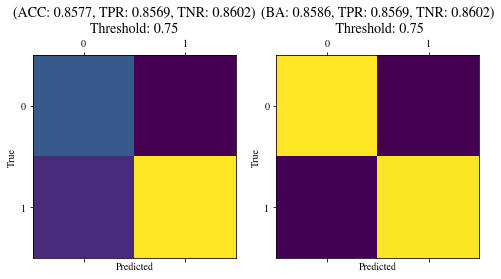

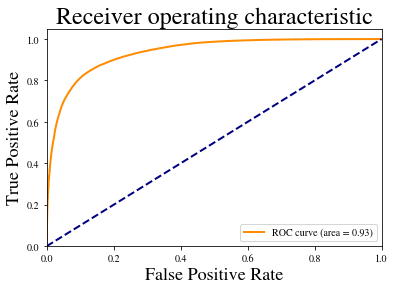

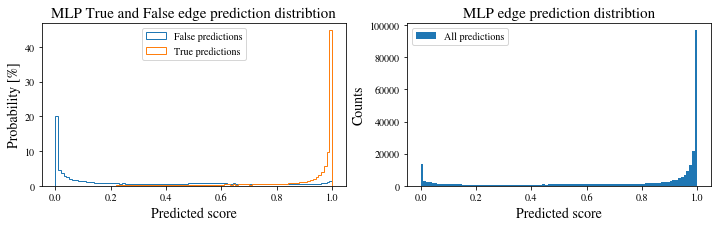

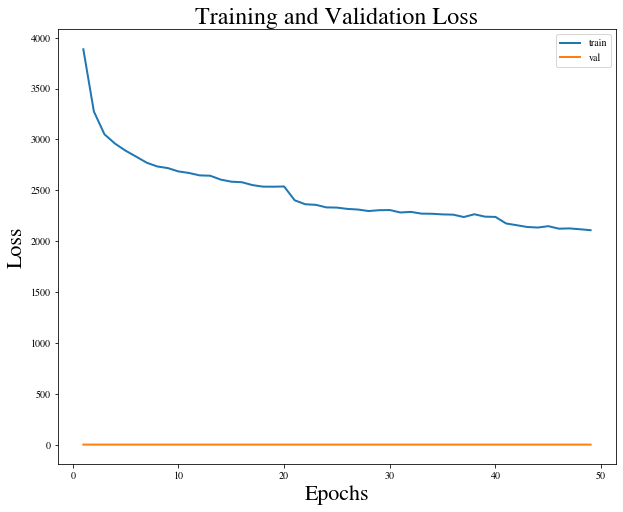

Training epoch 50:  95%|█████████▌| 11514/12079 [06:58<00:20, 28.02it/s]

In [ ]:
epochs = 50
decision_th = 0.85

outputModelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features_2MH"
mkdir_p(outputModelPath)


train_loss_hist = []
val_loss_hist = []

for epoch in range(epochs):

    loss = train(model, optimizer, train_dl, epoch+1, device, edge_features=True)
    train_loss_hist.append(loss)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt')
    
    # Validation
    model.eval()
    pred, lab = [], []
    val_loss, j = 0, 0
    for sample in val_dl:
        sample = sample.to(device)
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred,emb, edge_emb = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()
        val_loss += loss_obj(nn_pred, sample.edge_label.float()).item()
        j += 1
        
    val_loss = float(val_loss)/j
    print(f'Epoch: {epoch+1}, val loss: {val_loss:.4f}')
    val_loss_hist.append(val_loss)
    
    TNR, TPR, thresholds = classification_thresholds_plot(np.array(pred), np.array(lab),
                                                          threshold_step=0.05, output_folder=outputModelPath,
                                                          epoch=epoch+1)
    classification_threshold = get_best_threshold(TNR, TPR, thresholds)
    print(f"Chosen classification threshold is: {classification_threshold}")

    plot_prediction_distribution_standard_and_log(np.array(pred), np.array(lab),
                                                  epoch=epoch+1, thr = classification_threshold,
                                                 folder=outputModelPath, val=True)

    test(np.array(lab), np.array(pred), classification_threshold=classification_threshold,
                        output_folder=outputModelPath, epoch=epoch+1)
    save_pred(np.array(pred), np.array(lab), epoch=epoch, out_folder=outputModelPath)
    save_loss(train_loss_hist, val_loss_hist, outputLossFunctionPath=outputModelPath)

    scheduler.step()     

# Model with edge features, all node features

In [32]:
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=64, weighted_aggr=True)
                               #dropout=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = torch.nn.BCELoss()
#model.apply(weight_init)

Training epoch 1: 100%|██████████| 12079/12079 [06:31<00:00, 30.89it/s]


Epoch: 1, train loss: 3890.2651
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_1_loss_3890.2651.pt
Epoch: 1, val loss: 0.3583


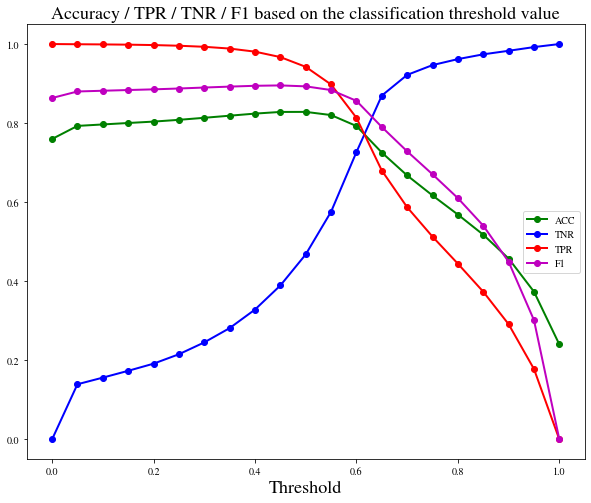

Chosen classification threshold is: 0.625
Edge labels: number of positive: 214167
Predictions: number of positive: 171554


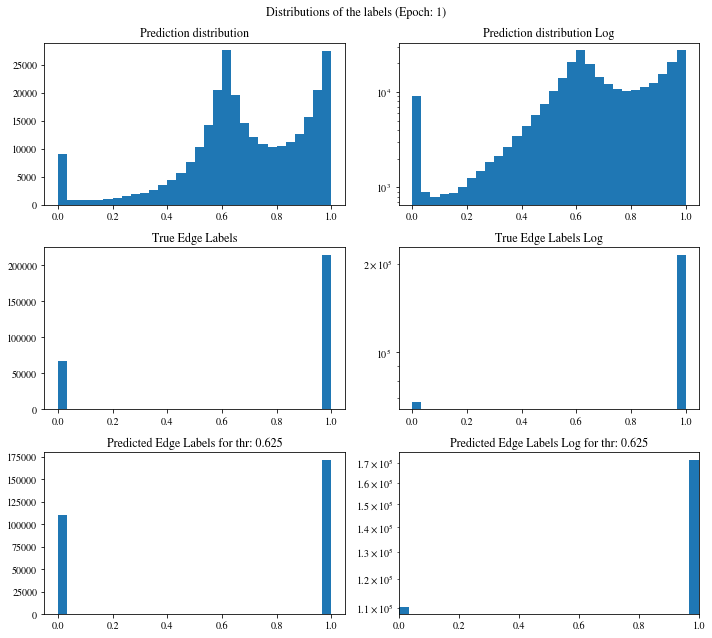

[0.65283406 0.76046753 0.61373127 ... 0.85040808 0.75009954 0.82970828]
Confusion matrix:
[[ 55261  12439]
 [ 55052 159115]]

Confusion matrix weighted:
[[0.40813146 0.09186854]
 [0.12852587 0.37147413]]

TN: 55261 	 FN: 55052 	 TP: 159115 	 FP: 12439
Confusion matrix scaled:
[[0.19605346 0.04413074]
 [0.19531197 0.56450383]]

Accuracy: 0.7606
Precision: 0.9275
Negative predictive value: 0.5009
Recall: Correctly classifying 74.2948 % of positive edges
True negative rate: Correctly classifying 81.6263 % of all negative edges
F1 score: 0.8250
[0.76050664 0.80172658] [0.81626292 0.74294826] [0.78739898 0.77121909]
Balanced accuracy: 0.7796
Precision weighted: [0.76050664 0.80172658]
Recall weighted: [0.81626292 0.74294826]
F1 score weighted: [0.78739898 0.77121909]
positive_likelihood_ratio: 4.043540252607391, negative_likelihood_ratio: 0.3149129186554108


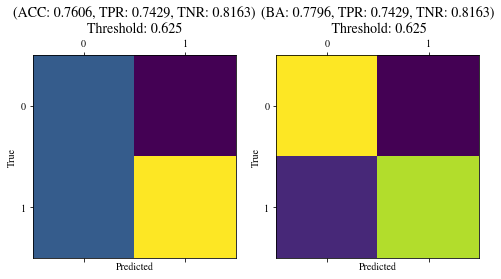

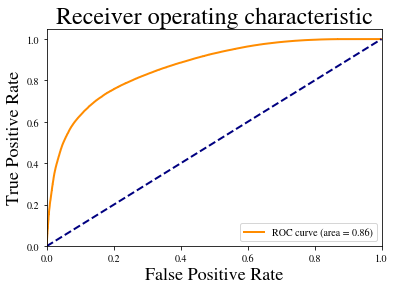

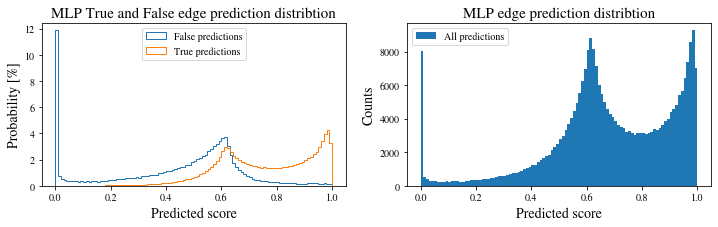

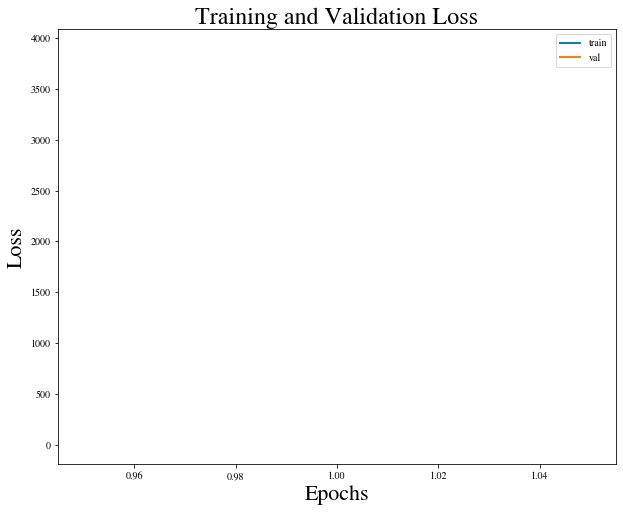

Training epoch 2: 100%|██████████| 12079/12079 [06:21<00:00, 31.66it/s]


Epoch: 2, train loss: 3256.9456
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_2_loss_3256.9456.pt
Epoch: 2, val loss: 0.2984


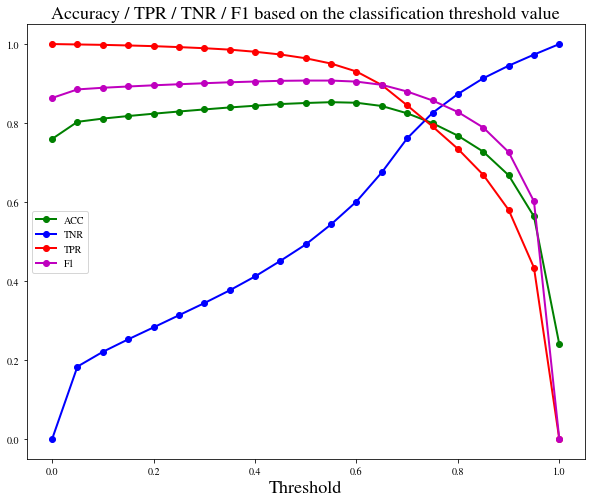

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 188970


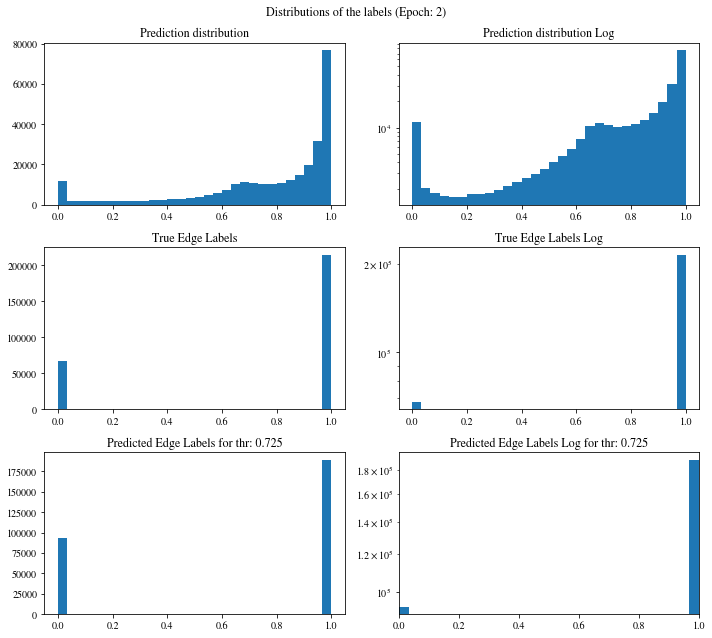

[0.99530101 0.995417   0.99506253 ... 0.06434952 0.10500315 0.33273458]
Confusion matrix:
[[ 53884  13816]
 [ 39013 175154]]

Confusion matrix weighted:
[[0.3979616  0.1020384 ]
 [0.09108079 0.40891921]]

TN: 53884 	 FN: 39013 	 TP: 175154 	 FP: 13816
Confusion matrix scaled:
[[0.19116818 0.04901603]
 [0.13840925 0.62140655]]

Accuracy: 0.8126
Precision: 0.9269
Negative predictive value: 0.5800
Recall: Correctly classifying 81.7838 % of positive edges
True negative rate: Correctly classifying 79.5923 % of all negative edges
F1 score: 0.8690
[0.81375686 0.80029967] [0.79592319 0.81783842] [0.80474123 0.80897399]
Balanced accuracy: 0.8069
Precision weighted: [0.81375686 0.80029967]
Recall weighted: [0.79592319 0.81783842]
F1 score weighted: [0.80474123 0.80897399]
positive_likelihood_ratio: 4.0075029495311645, negative_likelihood_ratio: 0.22886829577012532


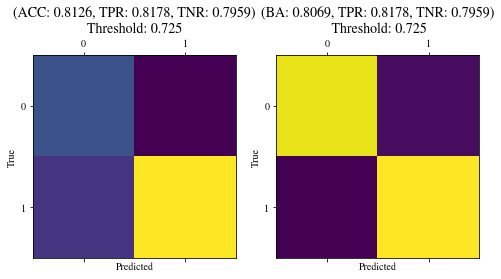

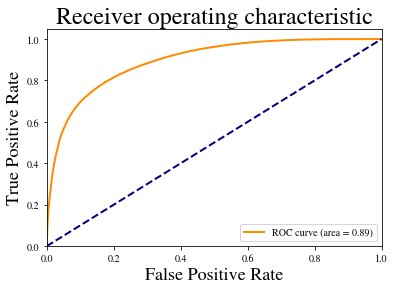

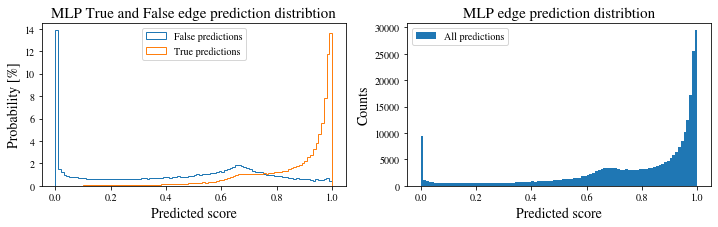

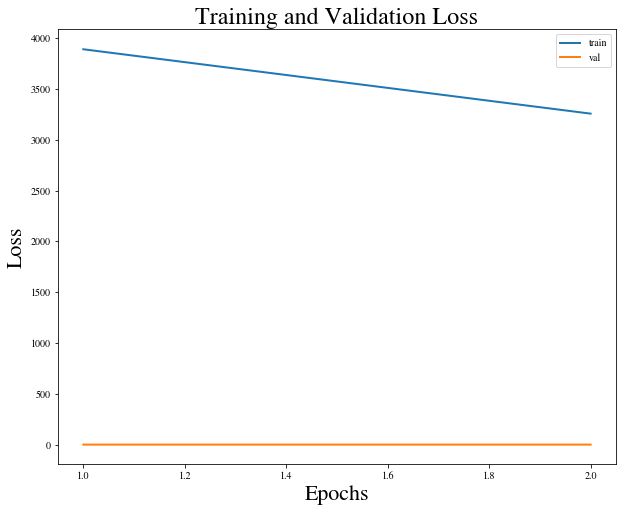

Training epoch 3: 100%|██████████| 12079/12079 [06:25<00:00, 31.33it/s]


Epoch: 3, train loss: 3047.9500
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_3_loss_3047.9500.pt
Epoch: 3, val loss: 0.2755


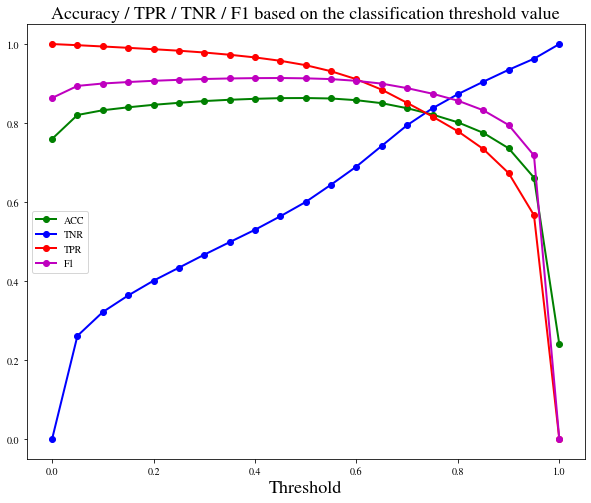

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 190951


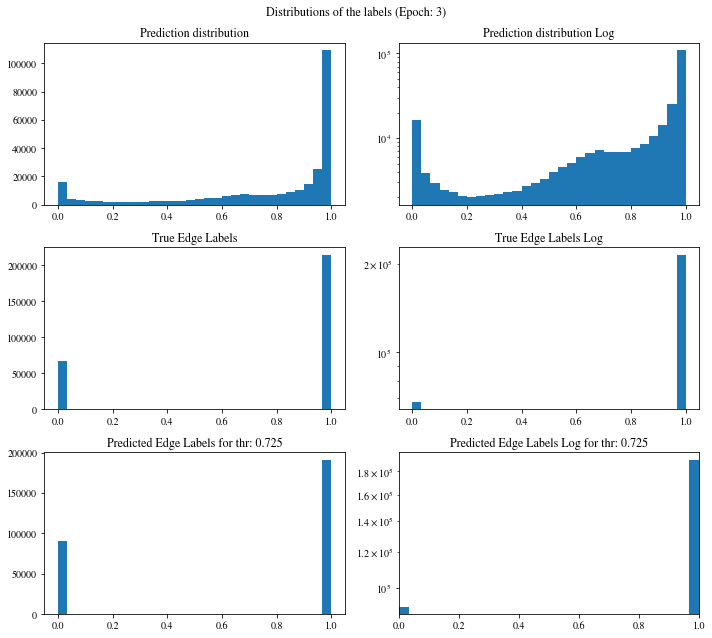

[0.9857738  0.82512975 0.89608699 ... 0.28542906 0.40613922 0.66702545]
Confusion matrix:
[[ 55357  12343]
 [ 35559 178608]]

Confusion matrix weighted:
[[0.40884047 0.09115953]
 [0.08301699 0.41698301]]

TN: 55357 	 FN: 35559 	 TP: 178608 	 FP: 12343
Confusion matrix scaled:
[[0.19639404 0.04379016]
 [0.12615524 0.63366056]]

Accuracy: 0.8301
Precision: 0.9354
Negative predictive value: 0.6089
Recall: Correctly classifying 83.3966 % of positive edges
True negative rate: Correctly classifying 81.7681 % of all negative edges
F1 score: 0.8818
[0.83121738 0.82060245] [0.81768095 0.83396602] [0.8243936  0.82723027]
Balanced accuracy: 0.8258
Precision weighted: [0.83121738 0.82060245]
Recall weighted: [0.81768095 0.83396602]
F1 score weighted: [0.8243936  0.82723027]
positive_likelihood_ratio: 4.574212052389768, negative_likelihood_ratio: 0.2030547290740664


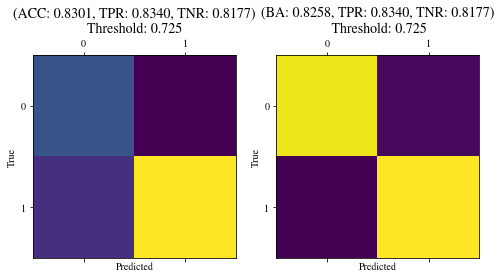

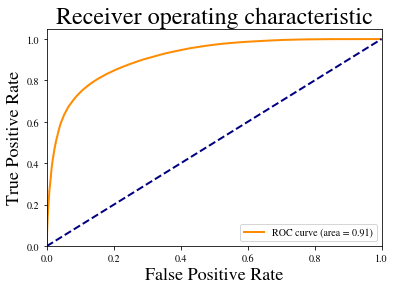

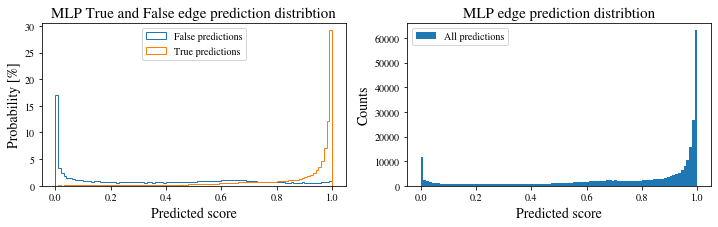

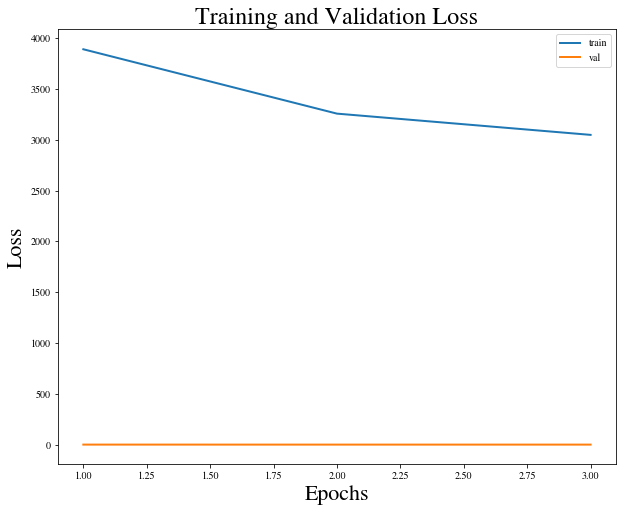

Training epoch 4: 100%|██████████| 12079/12079 [06:20<00:00, 31.72it/s]


Epoch: 4, train loss: 2910.9763
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_4_loss_2910.9763.pt
Epoch: 4, val loss: 0.2781


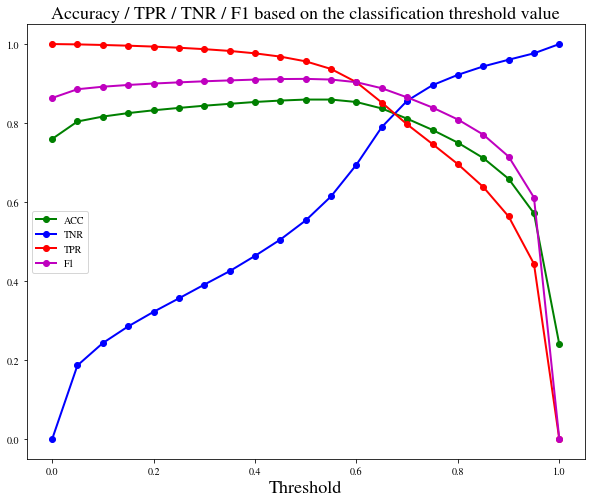

Chosen classification threshold is: 0.675
Edge labels: number of positive: 214167
Predictions: number of positive: 188100


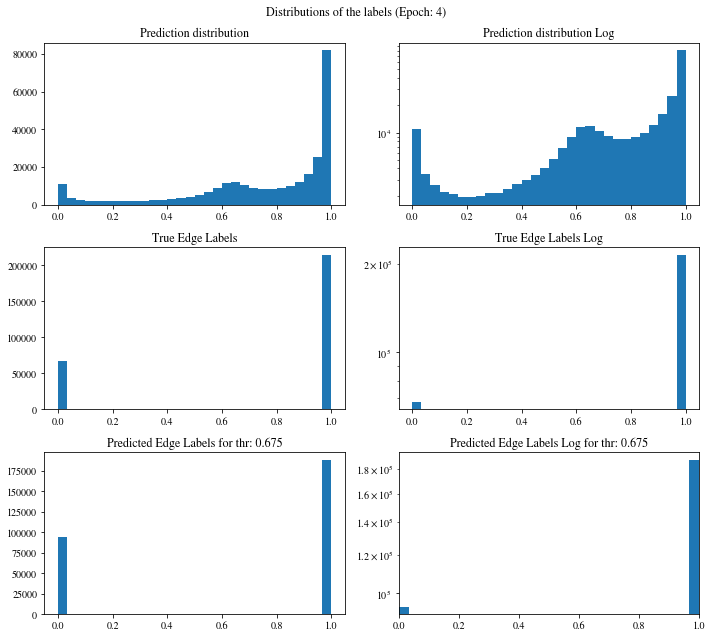

[0.91394913 0.93728572 0.11451457 ... 0.7032848  0.78657848 0.72731358]
Confusion matrix:
[[ 56043  11657]
 [ 37724 176443]]

Confusion matrix weighted:
[[0.41390694 0.08609306]
 [0.08807146 0.41192854]]

TN: 56043 	 FN: 37724 	 TP: 176443 	 FP: 11657
Confusion matrix scaled:
[[0.19882782 0.04135638]
 [0.13383617 0.62597963]]

Accuracy: 0.8248
Precision: 0.9380
Negative predictive value: 0.5977
Recall: Correctly classifying 82.3857 % of positive edges
True negative rate: Correctly classifying 82.7814 % of all negative edges
F1 score: 0.8772
[0.8245513  0.82712987] [0.82781388 0.82385708] [0.82617937 0.82549023]
Balanced accuracy: 0.8258
Precision weighted: [0.8245513  0.82712987]
Recall weighted: [0.82781388 0.82385708]
F1 score weighted: [0.82617937 0.82549023]
positive_likelihood_ratio: 4.784689418575562, negative_likelihood_ratio: 0.21278081915073555


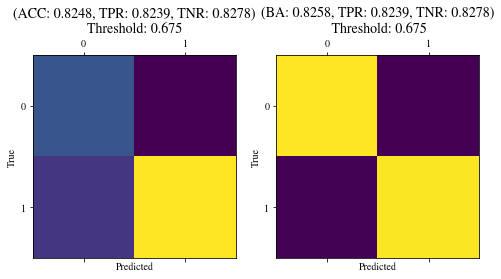

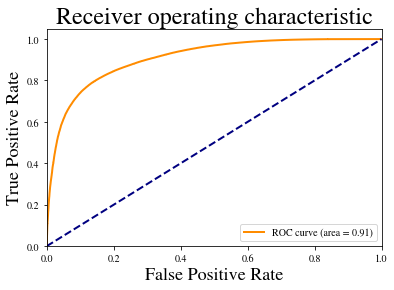

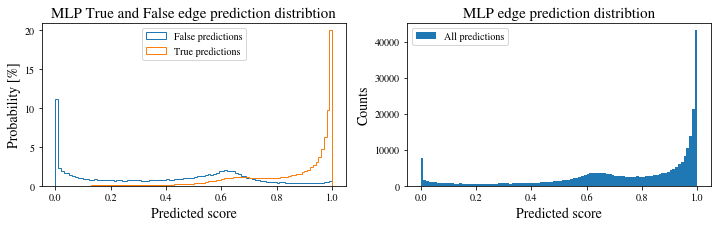

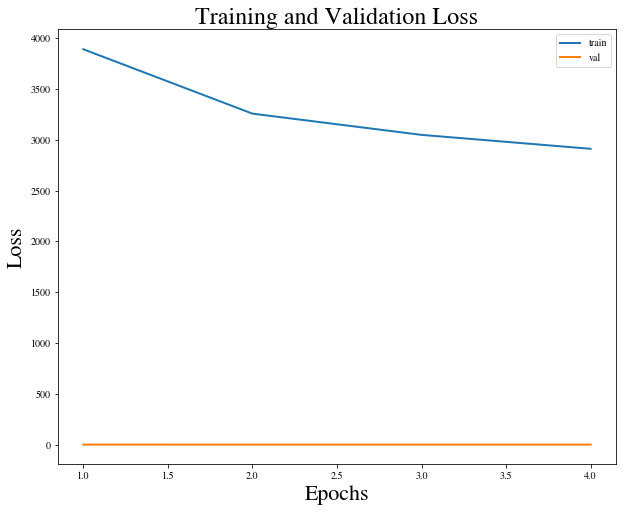

Training epoch 5: 100%|██████████| 12079/12079 [06:23<00:00, 31.46it/s]


Epoch: 5, train loss: 2853.5786
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_5_loss_2853.5786.pt
Epoch: 5, val loss: 0.2721


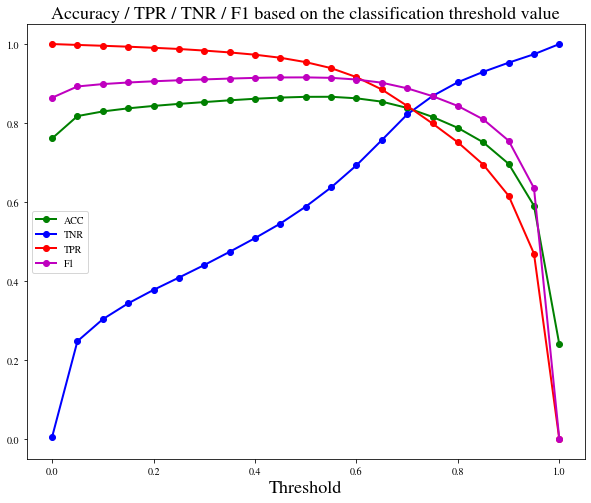

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 186312


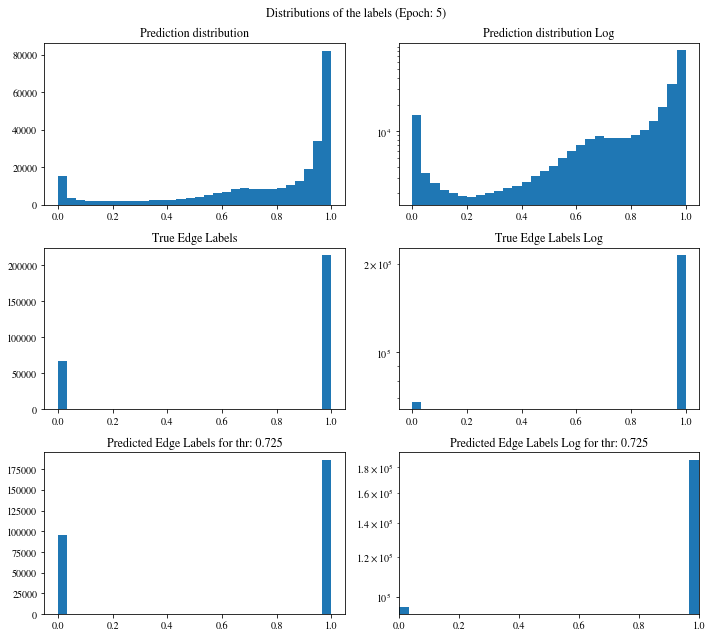

[0.92742497 0.99531758 0.91432774 ... 0.56705779 0.57910031 0.06292357]
Confusion matrix:
[[ 57349  10351]
 [ 38206 175961]]

Confusion matrix weighted:
[[0.42355244 0.07644756]
 [0.08919675 0.41080325]]

TN: 57349 	 FN: 38206 	 TP: 175961 	 FP: 10351
Confusion matrix scaled:
[[0.20346121 0.03672299]
 [0.1355462  0.6242696 ]]

Accuracy: 0.8277
Precision: 0.9444
Negative predictive value: 0.6002
Recall: Correctly classifying 82.1607 % of positive edges
True negative rate: Correctly classifying 84.7105 % of all negative edges
F1 score: 0.8788
[0.82604215 0.84310429] [0.84710487 0.8216065 ] [0.83644093 0.83221659]
Balanced accuracy: 0.8344
Precision weighted: [0.82604215 0.84310429]
Recall weighted: [0.84710487 0.8216065 ]
F1 score weighted: [0.83644093 0.83221659]
positive_likelihood_ratio: 5.373660542542701, negative_likelihood_ratio: 0.21059198458805745


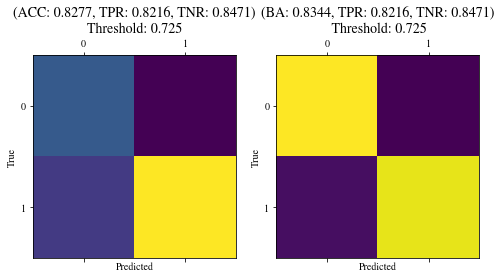

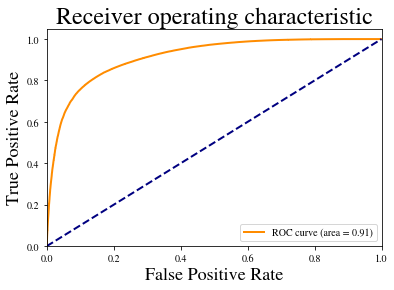

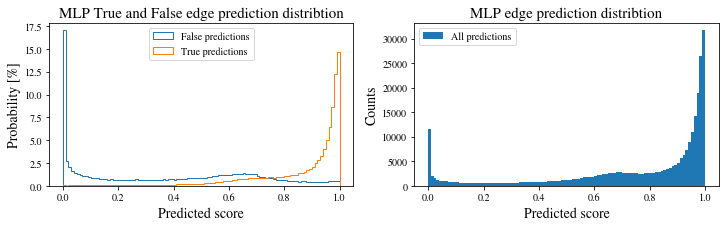

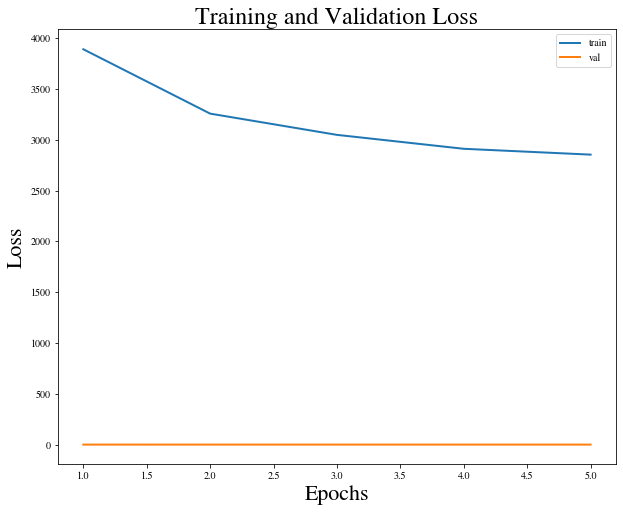

Training epoch 6: 100%|██████████| 12079/12079 [06:36<00:00, 30.44it/s]


Epoch: 6, train loss: 2791.2251
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_6_loss_2791.2251.pt
Epoch: 6, val loss: 0.2743


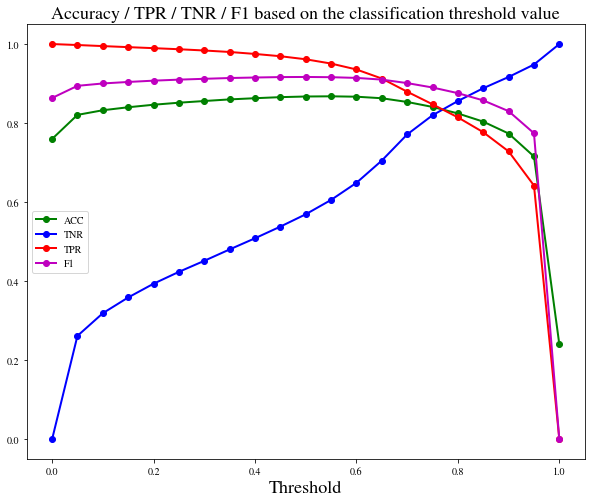

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 189021


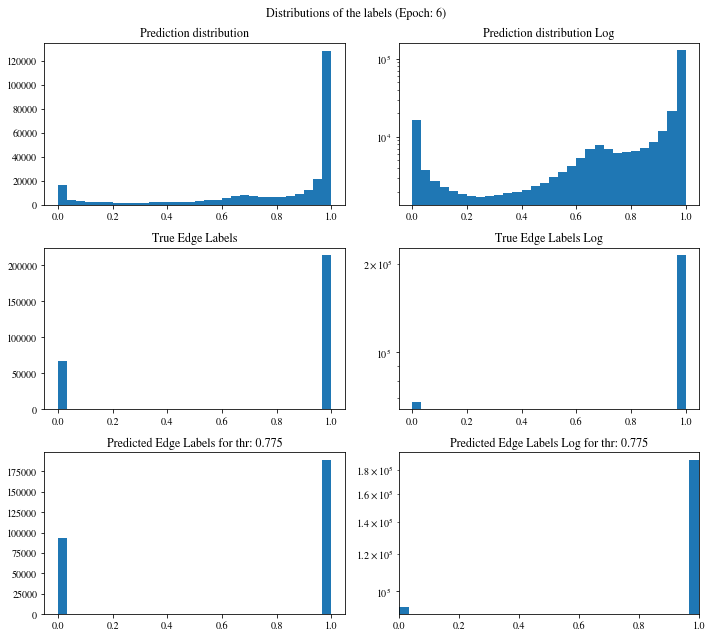

[0.9950729  0.98493284 0.98652202 ... 0.99143571 0.99126655 0.63893813]
Confusion matrix:
[[ 56805  10895]
 [ 36041 178126]]

Confusion matrix weighted:
[[0.41953471 0.08046529]
 [0.08414228 0.41585772]]

TN: 56805 	 FN: 36041 	 TP: 178126 	 FP: 10895
Confusion matrix scaled:
[[0.20153122 0.03865298]
 [0.12786527 0.63195053]]

Accuracy: 0.8335
Precision: 0.9424
Negative predictive value: 0.6118
Recall: Correctly classifying 83.1715 % of positive edges
True negative rate: Correctly classifying 83.9069 % of all negative edges
F1 score: 0.8836
[0.83294396 0.83787717] [0.83906942 0.83171544] [0.83599547 0.83478494]
Balanced accuracy: 0.8354
Precision weighted: [0.83294396 0.83787717]
Recall weighted: [0.83906942 0.83171544]
F1 score weighted: [0.83599547 0.83478494]
positive_likelihood_ratio: 5.168162926679309, negative_likelihood_ratio: 0.200560952624398


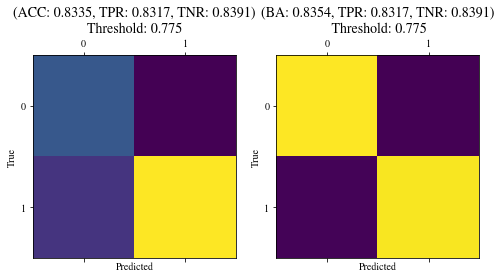

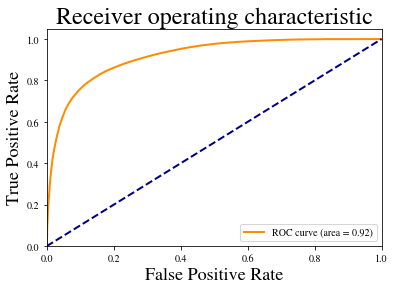

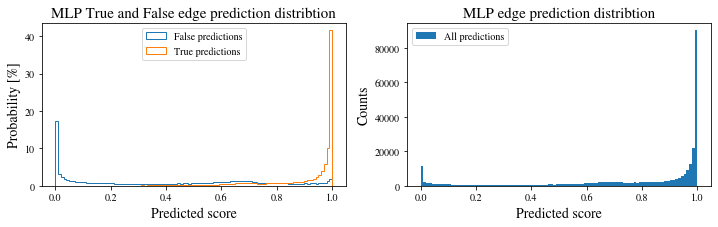

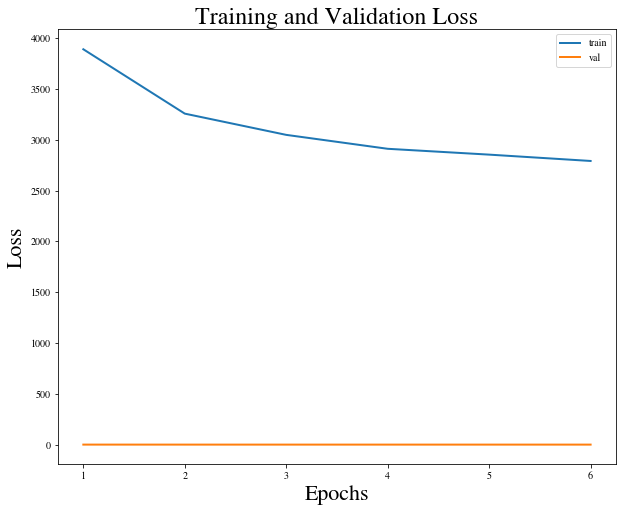

Training epoch 7: 100%|██████████| 12079/12079 [06:31<00:00, 30.82it/s]


Epoch: 7, train loss: 2765.8792
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_7_loss_2765.8792.pt
Epoch: 7, val loss: 0.2761


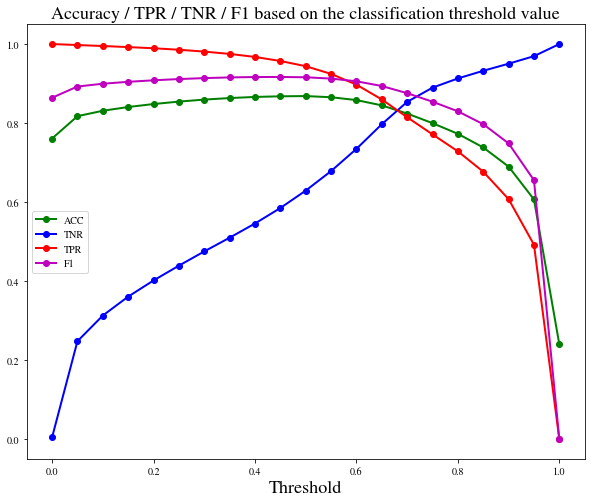

Chosen classification threshold is: 0.675
Edge labels: number of positive: 214167
Predictions: number of positive: 191176


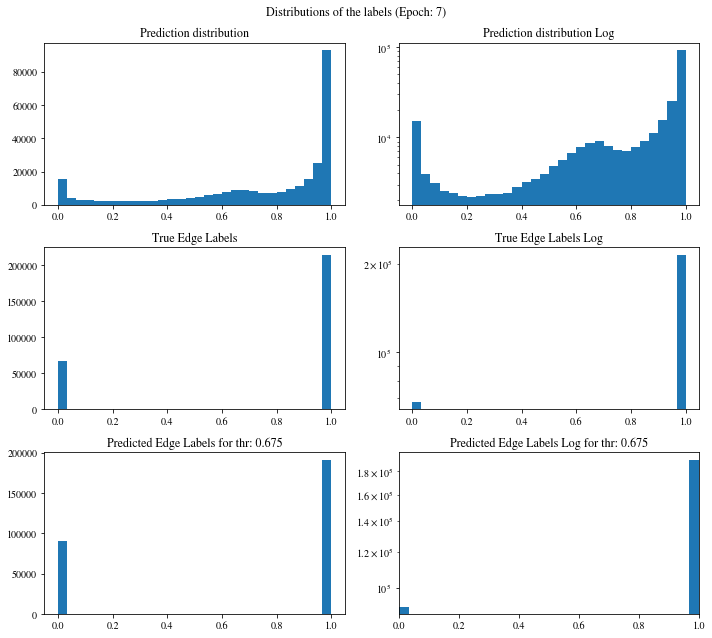

[0.25805676 0.51830554 0.86554772 ... 0.62543827 0.62473696 0.61809897]
Confusion matrix:
[[ 55998  11702]
 [ 34693 179474]]

Confusion matrix weighted:
[[0.41357459 0.08642541]
 [0.0809952  0.4190048 ]]

TN: 55998 	 FN: 34693 	 TP: 179474 	 FP: 11702
Confusion matrix scaled:
[[0.19866817 0.04151603]
 [0.12308287 0.63673293]]

Accuracy: 0.8354
Precision: 0.9388
Negative predictive value: 0.6175
Recall: Correctly classifying 83.8010 % of positive edges
True negative rate: Correctly classifying 82.7149 % of all negative edges
F1 score: 0.8855
[0.83623099 0.82900625] [0.82714919 0.83800959] [0.8316653  0.83348361]
Balanced accuracy: 0.8326
Precision weighted: [0.83623099 0.82900625]
Recall weighted: [0.82714919 0.83800959]
F1 score weighted: [0.8316653  0.83348361]
positive_likelihood_ratio: 4.848166919054139, negative_likelihood_ratio: 0.1958418285158124


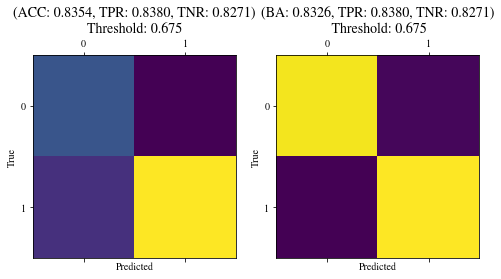

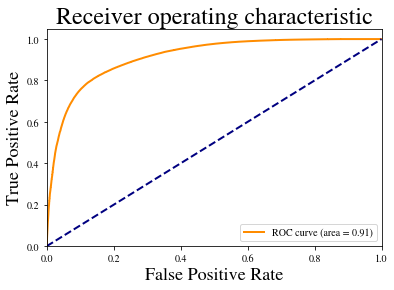

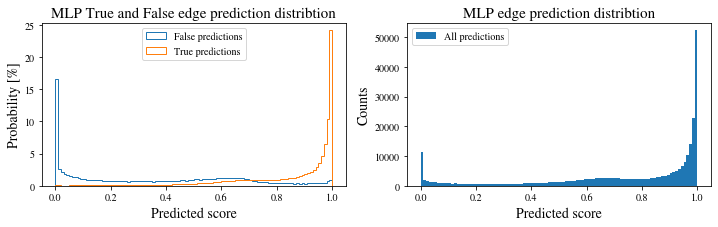

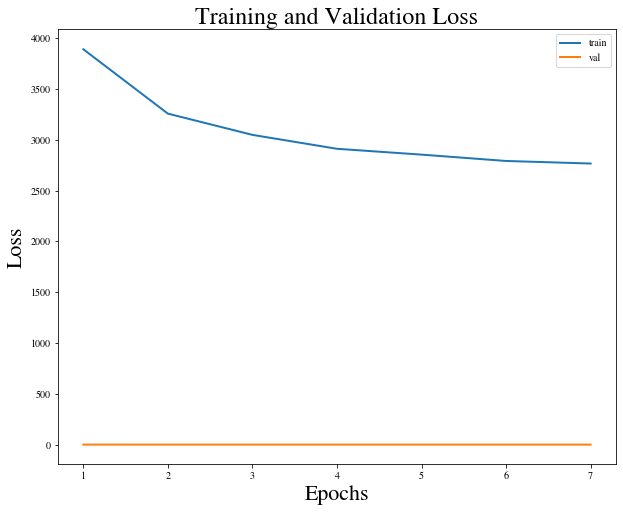

Training epoch 8: 100%|██████████| 12079/12079 [06:22<00:00, 31.56it/s]


Epoch: 8, train loss: 2721.8472
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_8_loss_2721.8472.pt
Epoch: 8, val loss: 0.2819


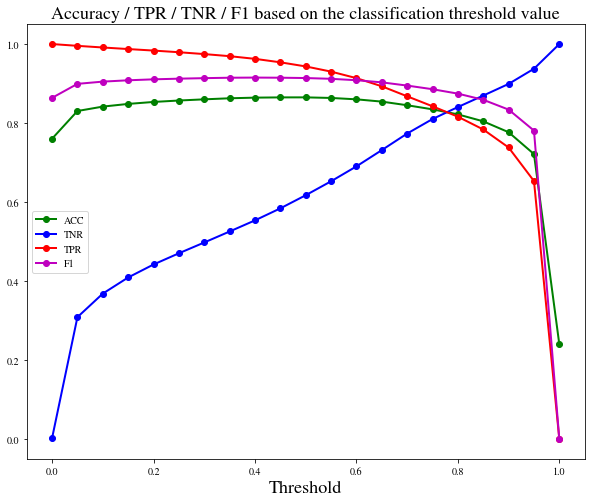

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 189548


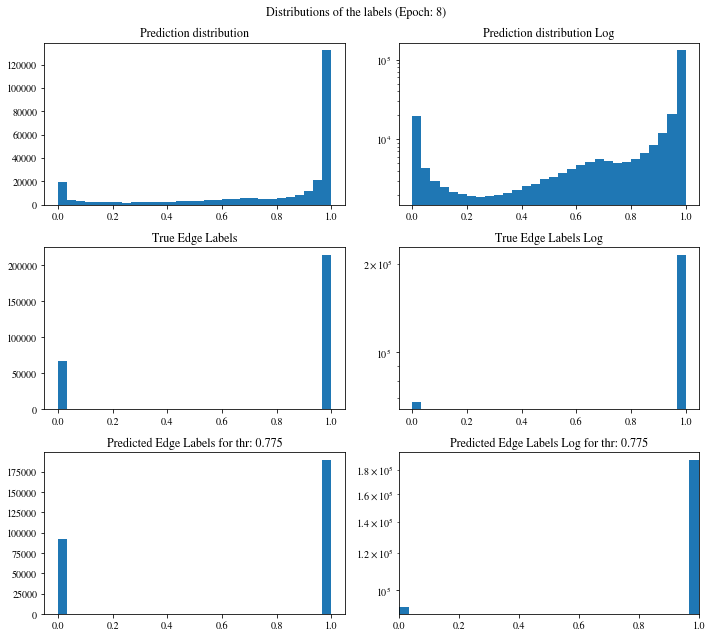

[0.6814875  0.64043117 0.72388411 ... 0.38089889 0.56108087 0.24263342]
Confusion matrix:
[[ 55928  11772]
 [ 36391 177776]]

Confusion matrix weighted:
[[0.41305761 0.08694239]
 [0.0849594  0.4150406 ]]

TN: 55928 	 FN: 36391 	 TP: 177776 	 FP: 11772
Confusion matrix scaled:
[[0.19841982 0.04176438]
 [0.12910699 0.63070881]]

Accuracy: 0.8291
Precision: 0.9379
Negative predictive value: 0.6058
Recall: Correctly classifying 83.0081 % of positive edges
True negative rate: Correctly classifying 82.6115 % of all negative edges
F1 score: 0.8807
[0.82940462 0.82680211] [0.82611521 0.8300812 ] [0.82775665 0.82843841]
Balanced accuracy: 0.8281
Precision weighted: [0.82940462 0.82680211]
Recall weighted: [0.82611521 0.8300812 ]
F1 score weighted: [0.82775665 0.82843841]
positive_likelihood_ratio: 4.77374253534442, negative_likelihood_ratio: 0.20568414522109654


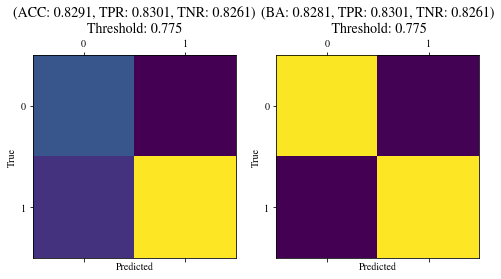

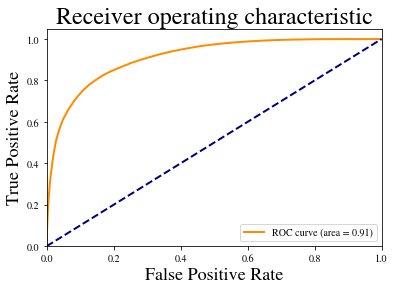

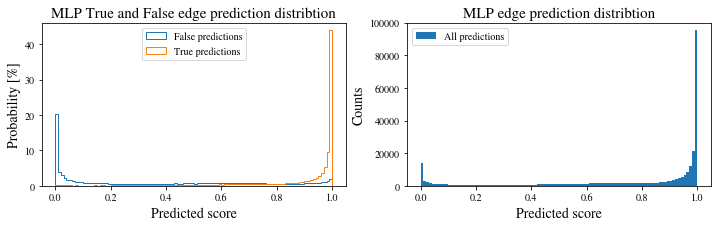

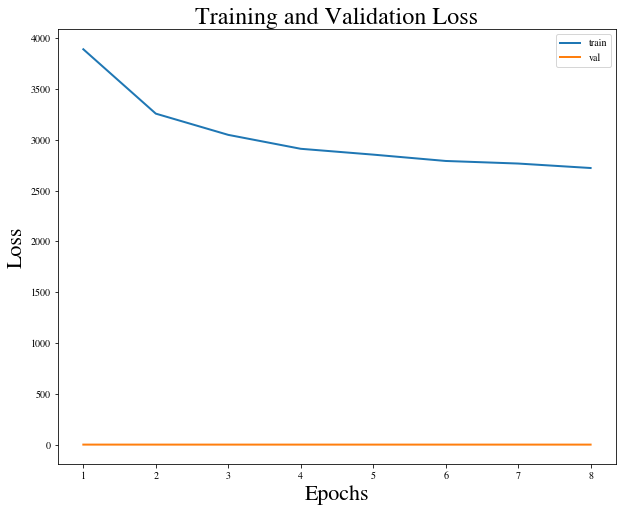

Training epoch 9: 100%|██████████| 12079/12079 [06:27<00:00, 31.14it/s]


Epoch: 9, train loss: 2681.3792
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_9_loss_2681.3792.pt
Epoch: 9, val loss: 0.2734


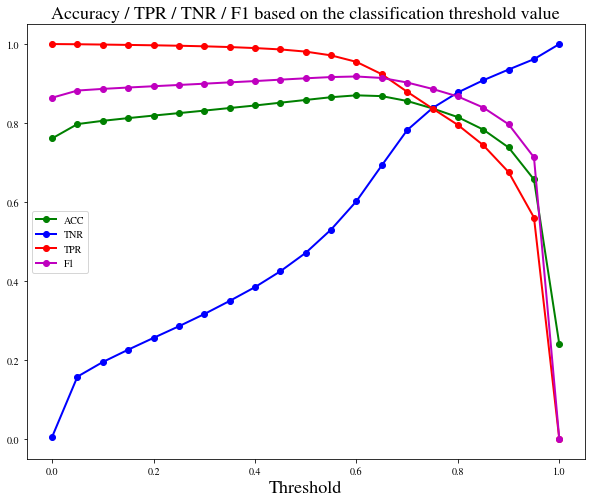

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190192


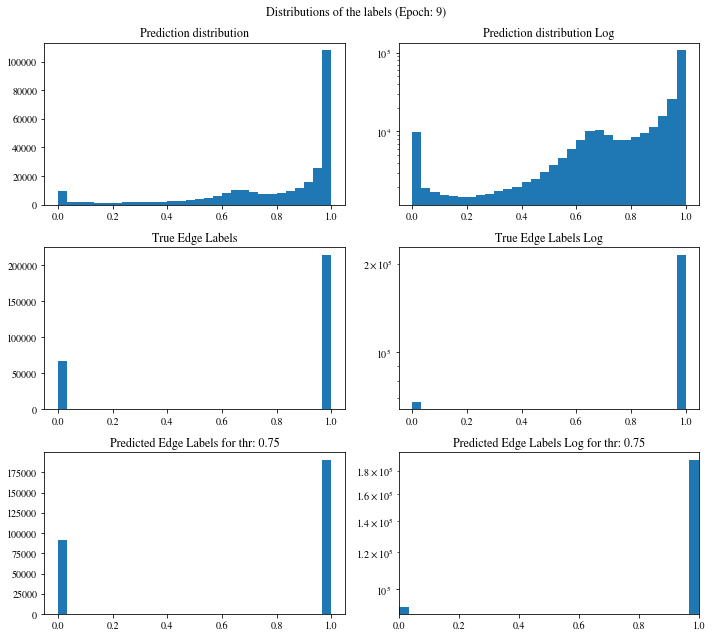

[0.99865413 0.97771251 0.96658248 ... 0.95841515 0.96028203 0.96627063]
Confusion matrix:
[[ 56741  10959]
 [ 34934 179233]]

Confusion matrix weighted:
[[0.41906204 0.08093796]
 [0.08155785 0.41844215]]

TN: 56741 	 FN: 34934 	 TP: 179233 	 FP: 10959
Confusion matrix scaled:
[[0.20130416 0.03888004]
 [0.12393789 0.63587791]]

Accuracy: 0.8372
Precision: 0.9424
Negative predictive value: 0.6189
Recall: Correctly classifying 83.6884 % of positive edges
True negative rate: Correctly classifying 83.8124 % of all negative edges
F1 score: 0.8865
[0.83708628 0.83792314] [0.83812408 0.8368843 ] [0.83760486 0.8374034 ]
Balanced accuracy: 0.8375
Precision weighted: [0.83708628 0.83792314]
Recall weighted: [0.83812408 0.8368843 ]
F1 score weighted: [0.83760486 0.8374034 ]
positive_likelihood_ratio: 5.169912140572463, negative_likelihood_ratio: 0.19461998998019736


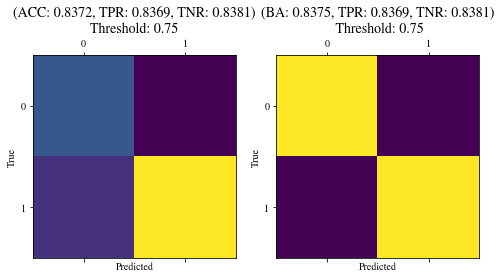

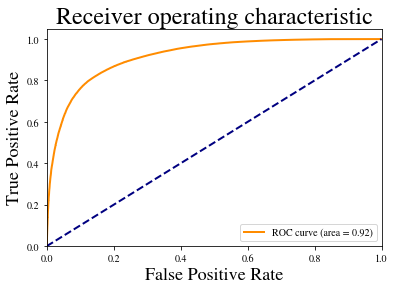

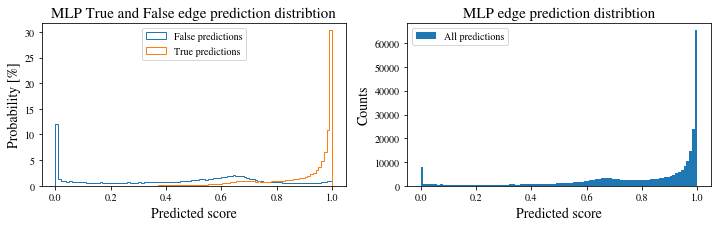

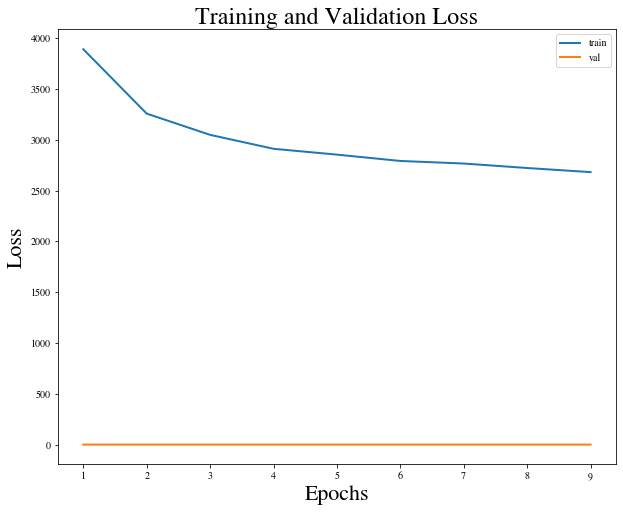

Training epoch 10: 100%|██████████| 12079/12079 [06:34<00:00, 30.64it/s]


Epoch: 10, train loss: 2670.5640
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_10_loss_2670.5640.pt
Epoch: 10, val loss: 0.2591


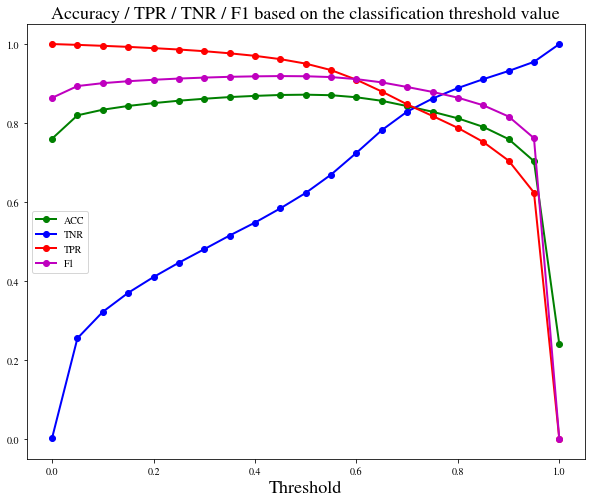

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 193063


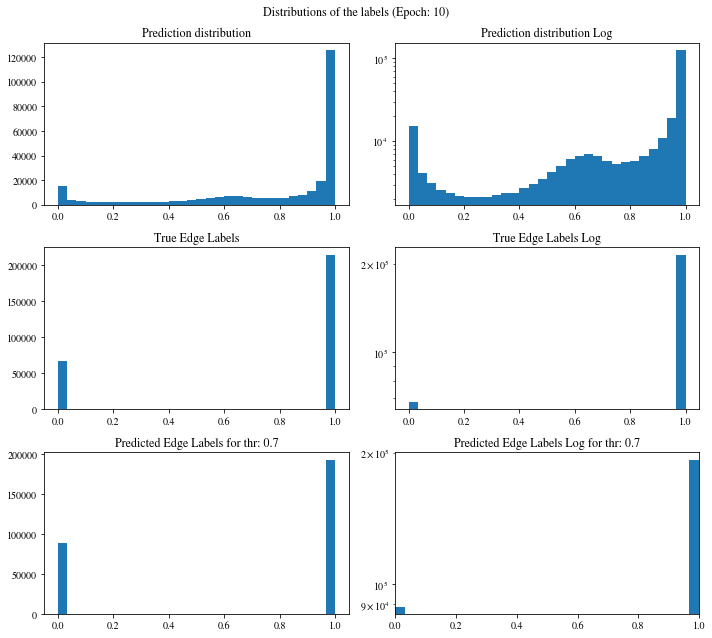

[9.52324688e-01 9.88407671e-01 9.89614069e-01 ... 1.52773660e-09
 7.02274442e-01 5.20545185e-01]
Confusion matrix:
[[ 56130  11570]
 [ 32674 181493]]

Confusion matrix weighted:
[[0.41454948 0.08545052]
 [0.07628159 0.42371841]]

TN: 56130 	 FN: 32674 	 TP: 181493 	 FP: 11570
Confusion matrix scaled:
[[0.19913647 0.04104773]
 [0.11591992 0.64389588]]

Accuracy: 0.8430
Precision: 0.9401
Negative predictive value: 0.6321
Recall: Correctly classifying 84.7437 % of positive edges
True negative rate: Correctly classifying 82.9099 % of all negative edges
F1 score: 0.8914
[0.84458687 0.83217649] [0.82909897 0.84743681] [0.83677126 0.83973733]
Balanced accuracy: 0.8383
Precision weighted: [0.84458687 0.83217649]
Recall weighted: [0.82909897 0.84743681]
F1 score weighted: [0.83677126 0.83973733]
positive_likelihood_ratio: 4.958640644969748, negative_likelihood_ratio: 0.18401082732406945


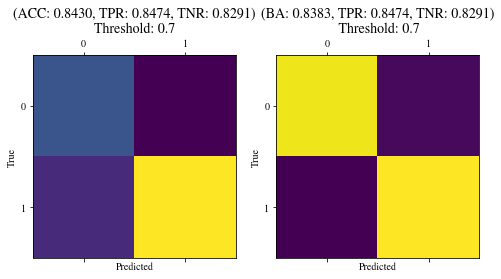

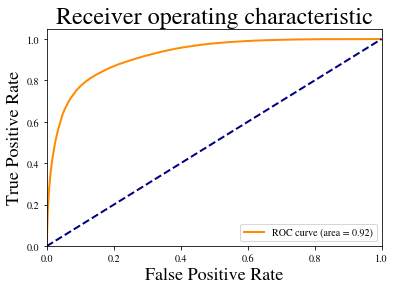

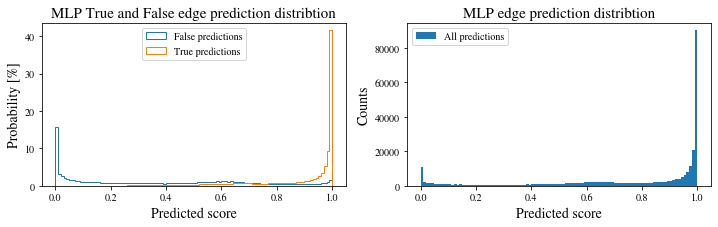

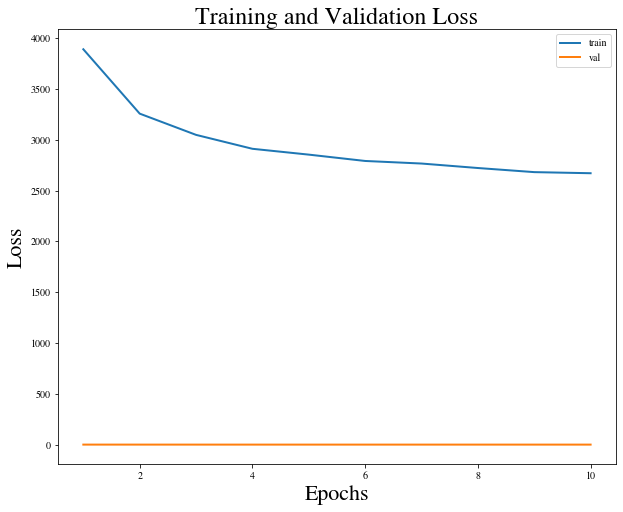

Training epoch 11: 100%|██████████| 12079/12079 [06:32<00:00, 30.80it/s]


Epoch: 11, train loss: 2634.4673
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_11_loss_2634.4673.pt
Epoch: 11, val loss: 0.2556


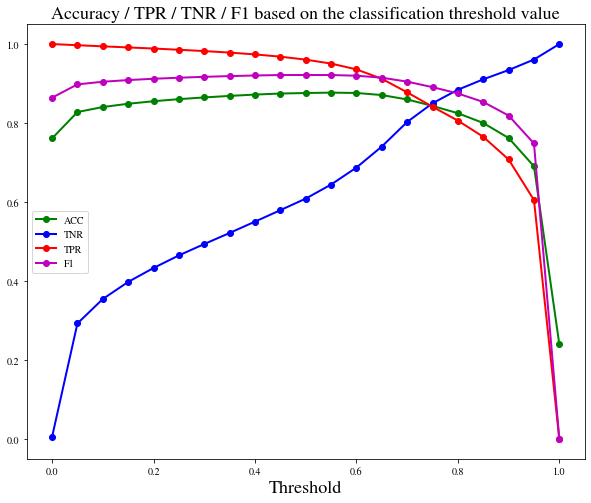

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190342


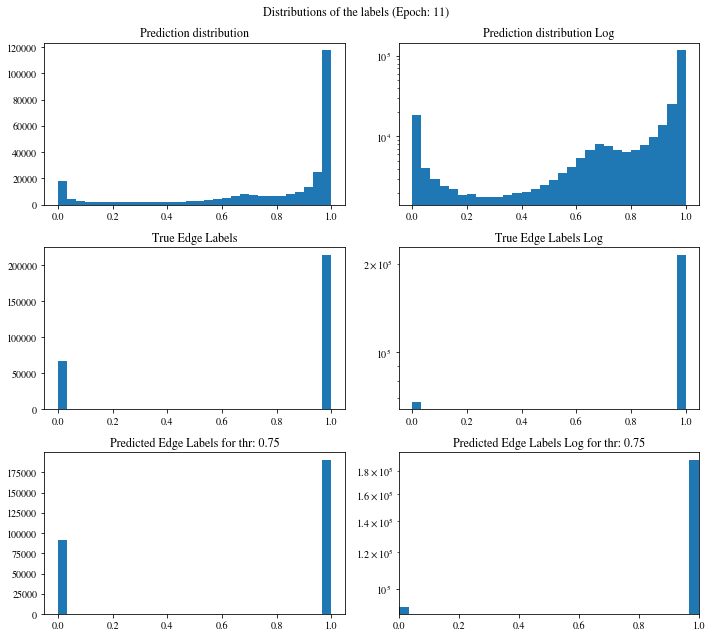

[0.99793112 0.99648809 0.99531257 ... 0.01003052 0.98490322 0.97914302]
Confusion matrix:
[[ 57560  10140]
 [ 33965 180202]]

Confusion matrix weighted:
[[0.42511078 0.07488922]
 [0.0792956  0.4207044 ]]

TN: 57560 	 FN: 33965 	 TP: 180202 	 FP: 10140
Confusion matrix scaled:
[[0.20420979 0.03597441]
 [0.12050009 0.63931571]]

Accuracy: 0.8435
Precision: 0.9467
Negative predictive value: 0.6289
Recall: Correctly classifying 84.1409 % of positive edges
True negative rate: Correctly classifying 85.0222 % of all negative edges
F1 score: 0.8910
[0.84279422 0.84888987] [0.85022157 0.84140881] [0.8464916  0.84513278]
Balanced accuracy: 0.8458
Precision weighted: [0.84279422 0.84888987]
Recall weighted: [0.85022157 0.84140881]
F1 score weighted: [0.8464916  0.84513278]
positive_likelihood_ratio: 5.617689964869071, negative_likelihood_ratio: 0.1865292521929746


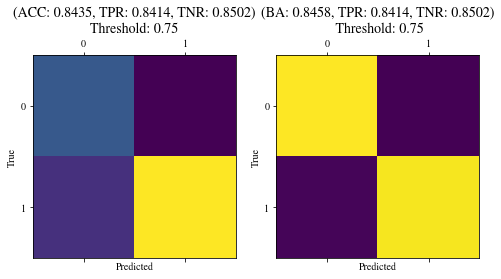

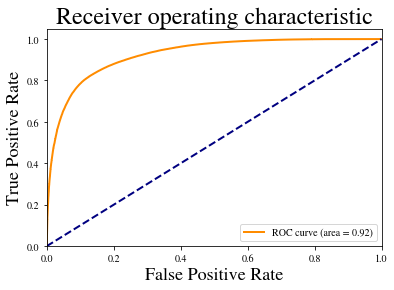

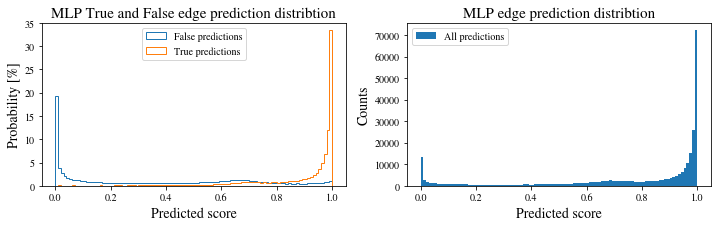

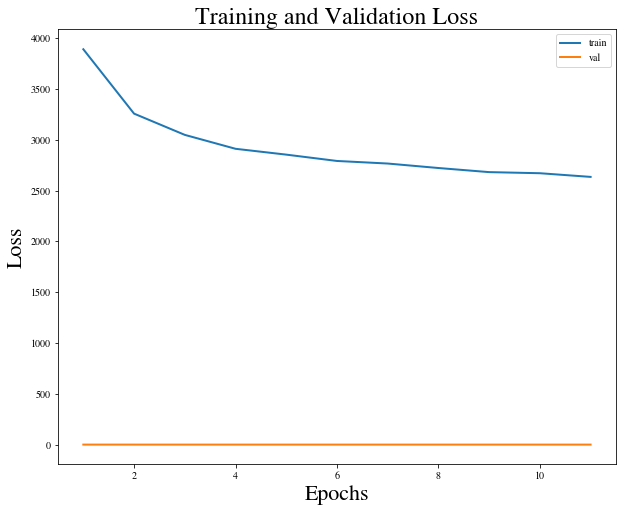

Training epoch 12: 100%|██████████| 12079/12079 [06:40<00:00, 30.16it/s]


Epoch: 12, train loss: 2617.9717
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_12_loss_2617.9717.pt
Epoch: 12, val loss: 0.2615


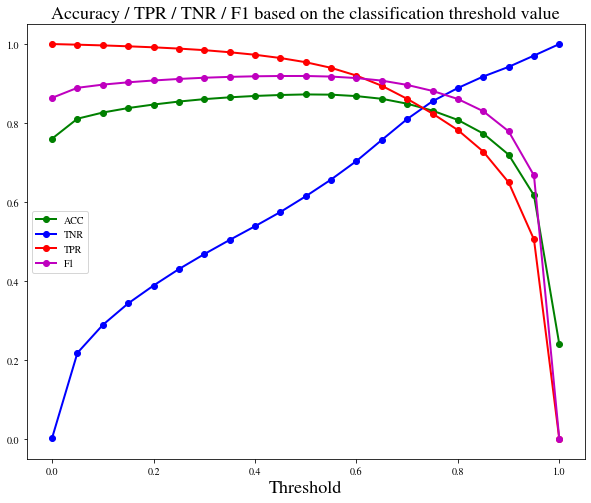

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 191773


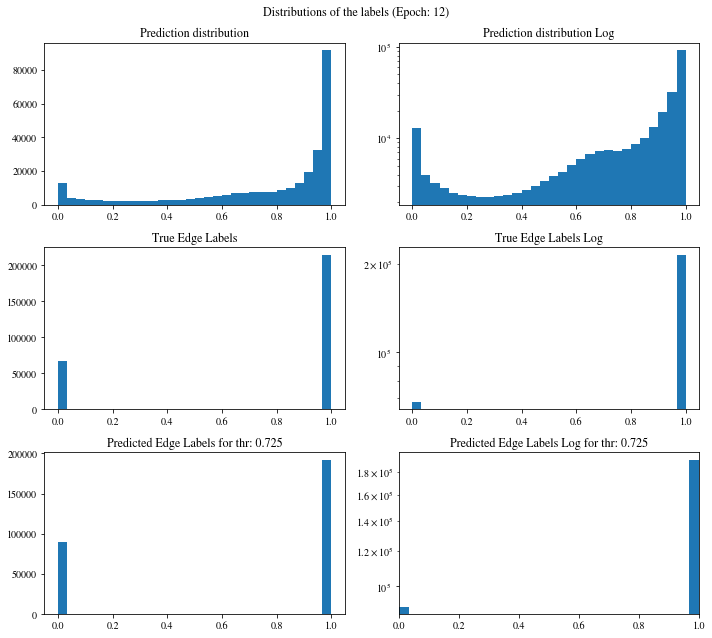

[0.99885917 0.99859267 0.99799359 ... 0.72406846 0.75780624 0.7461527 ]
Confusion matrix:
[[ 56446  11254]
 [ 33648 180519]]

Confusion matrix weighted:
[[0.41688331 0.08311669]
 [0.07855552 0.42144448]]

TN: 56446 	 FN: 33648 	 TP: 180519 	 FP: 11254
Confusion matrix scaled:
[[0.20025757 0.03992663]
 [0.11937545 0.64044035]]

Accuracy: 0.8407
Precision: 0.9413
Negative predictive value: 0.6265
Recall: Correctly classifying 84.2889 % of positive edges
True negative rate: Correctly classifying 83.3767 % of all negative edges
F1 score: 0.8894
[0.84144254 0.83526935] [0.83376662 0.84288896] [0.837587   0.83906186]
Balanced accuracy: 0.8383
Precision weighted: [0.84144254 0.83526935]
Recall weighted: [0.83376662 0.84288896]
F1 score weighted: [0.837587   0.83906186]
positive_likelihood_ratio: 5.070515605542396, negative_likelihood_ratio: 0.18843527221106676


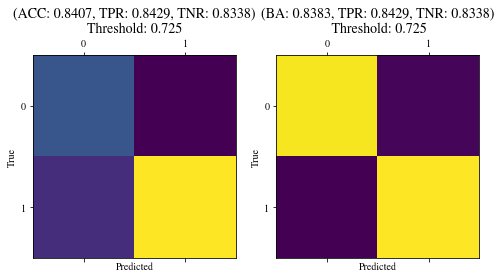

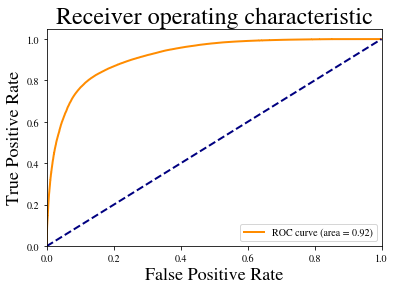

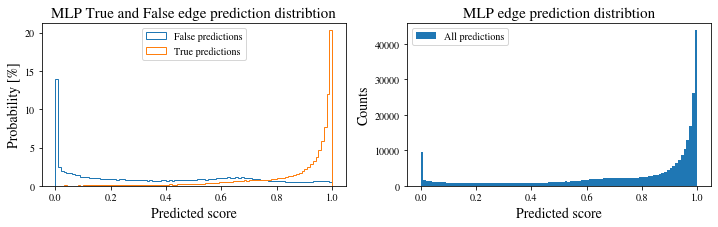

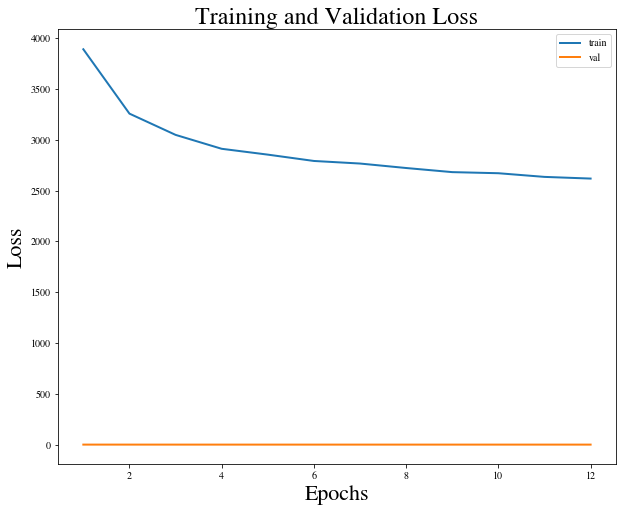

Training epoch 13: 100%|██████████| 12079/12079 [06:42<00:00, 30.03it/s]


Epoch: 13, train loss: 2633.8701
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_13_loss_2633.8701.pt
Epoch: 13, val loss: 0.2512


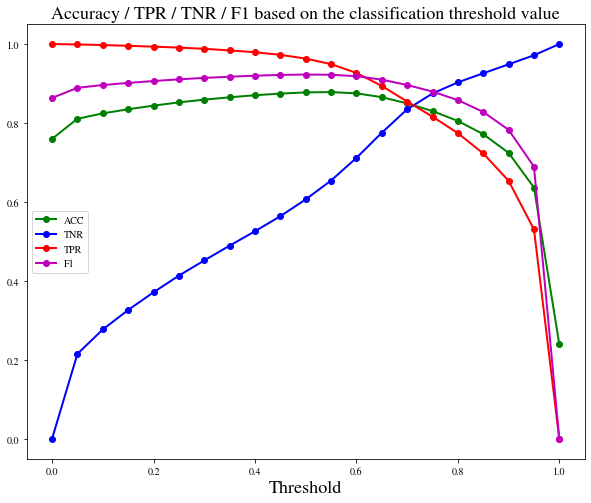

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194208


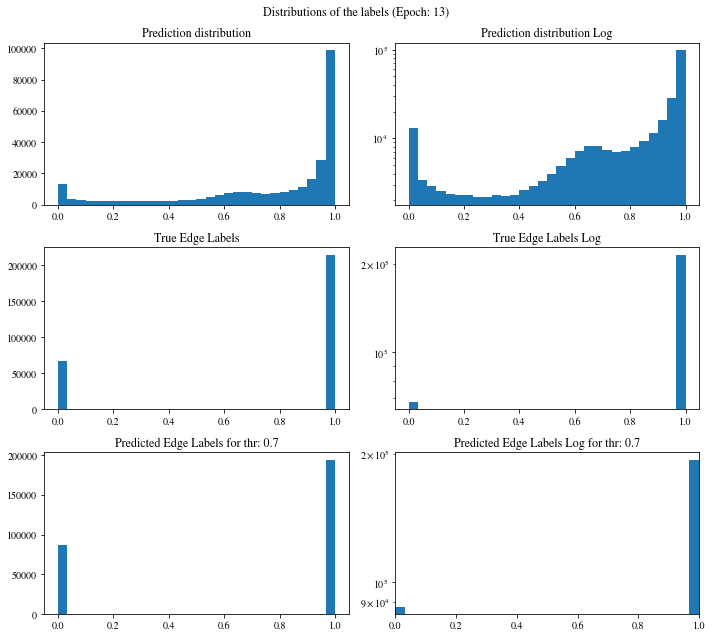

[0.50826019 0.65484327 0.31568077 ... 0.99287993 0.98951799 0.98665452]
Confusion matrix:
[[ 56524  11176]
 [ 31135 183032]]

Confusion matrix weighted:
[[0.41745938 0.08254062]
 [0.0726886  0.4273114 ]]

TN: 56524 	 FN: 31135 	 TP: 183032 	 FP: 11176
Confusion matrix scaled:
[[0.20053429 0.03964991]
 [0.1104599  0.6493559 ]]

Accuracy: 0.8499
Precision: 0.9425
Negative predictive value: 0.6448
Recall: Correctly classifying 85.4623 % of positive edges
True negative rate: Correctly classifying 83.4919 % of all negative edges
F1 score: 0.8964
[0.8517007  0.83810867] [0.83491876 0.85462279] [0.84322624 0.84628518]
Balanced accuracy: 0.8448
Precision weighted: [0.8517007  0.83810867]
Recall weighted: [0.83491876 0.85462279]
F1 score weighted: [0.84322624 0.84628518]
positive_likelihood_ratio: 5.176983104712547, negative_likelihood_ratio: 0.1741213789139582


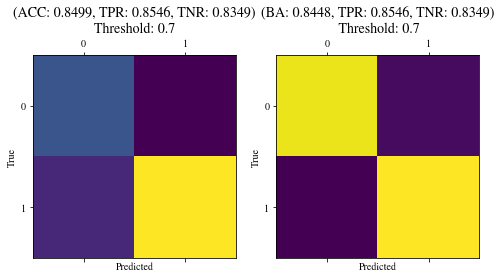

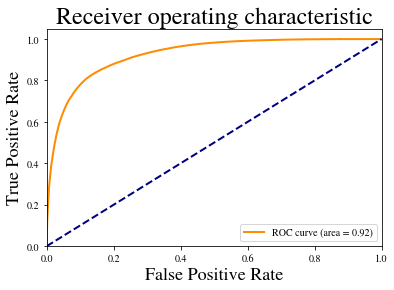

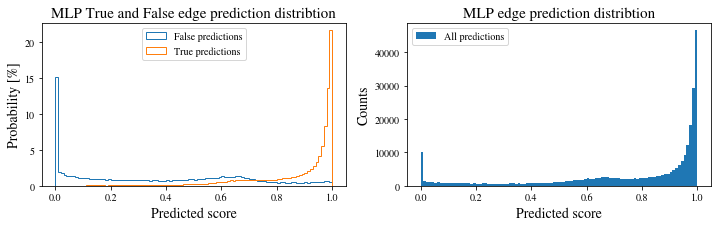

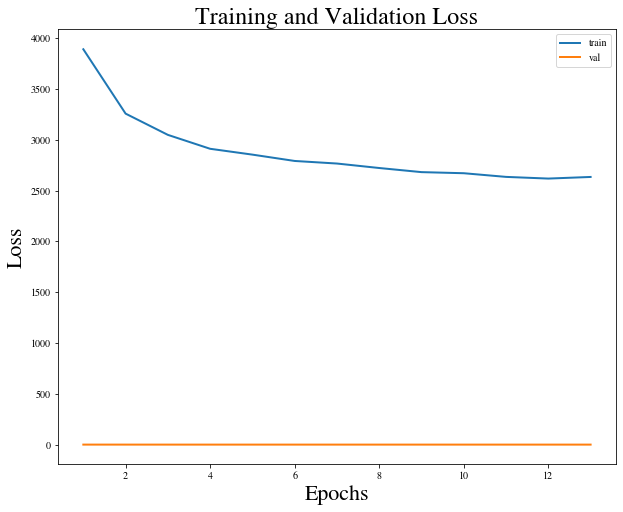

Training epoch 14: 100%|██████████| 12079/12079 [06:50<00:00, 29.44it/s]


Epoch: 14, train loss: 2586.1648
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_14_loss_2586.1648.pt
Epoch: 14, val loss: 0.2529


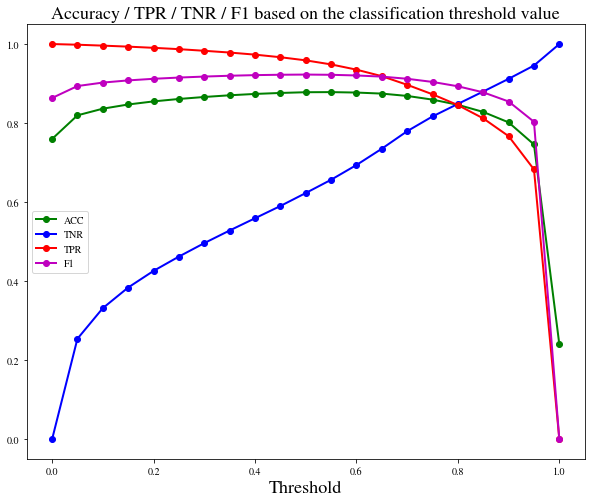

Chosen classification threshold is: 0.8
Edge labels: number of positive: 214167
Predictions: number of positive: 191344


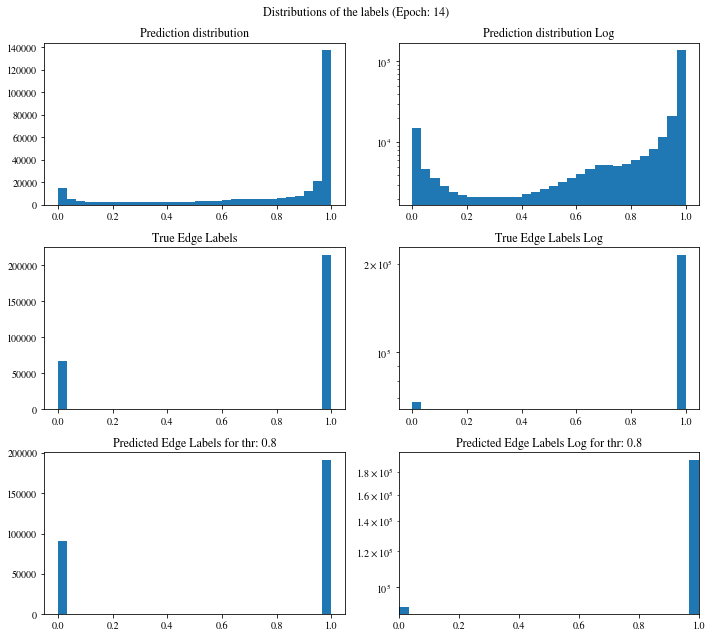

[0.9997009  0.99953938 0.995745   ... 0.99670368 0.98824733 0.98796308]
Confusion matrix:
[[ 57449  10251]
 [ 33074 181093]]

Confusion matrix weighted:
[[0.42429099 0.07570901]
 [0.07721544 0.42278456]]

TN: 57449 	 FN: 33074 	 TP: 181093 	 FP: 10251
Confusion matrix scaled:
[[0.20381598 0.03636822]
 [0.11733903 0.64247677]]

Accuracy: 0.8463
Precision: 0.9464
Negative predictive value: 0.6346
Recall: Correctly classifying 84.5569 % of positive edges
True negative rate: Correctly classifying 84.8582 % of all negative edges
F1 score: 0.8932
[0.84603299 0.8481244 ] [0.84858198 0.84556911] [0.84730557 0.84684483]
Balanced accuracy: 0.8471
Precision weighted: [0.84603299 0.8481244 ]
Recall weighted: [0.84858198 0.84556911]
F1 score weighted: [0.84730557 0.84684483]
positive_likelihood_ratio: 5.584336053002876, negative_likelihood_ratio: 0.18198699926312933


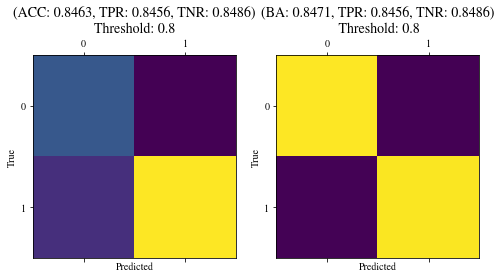

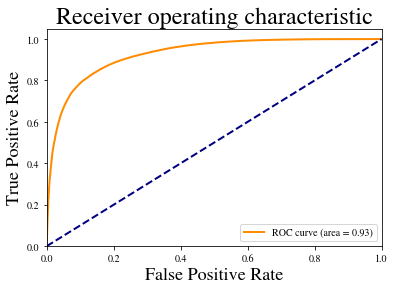

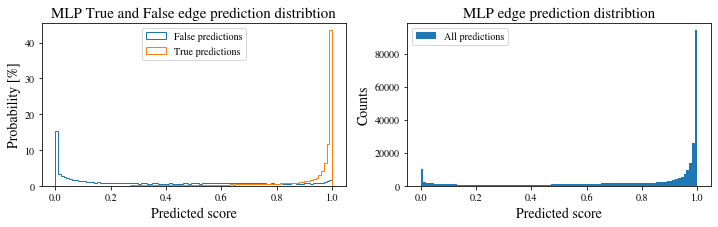

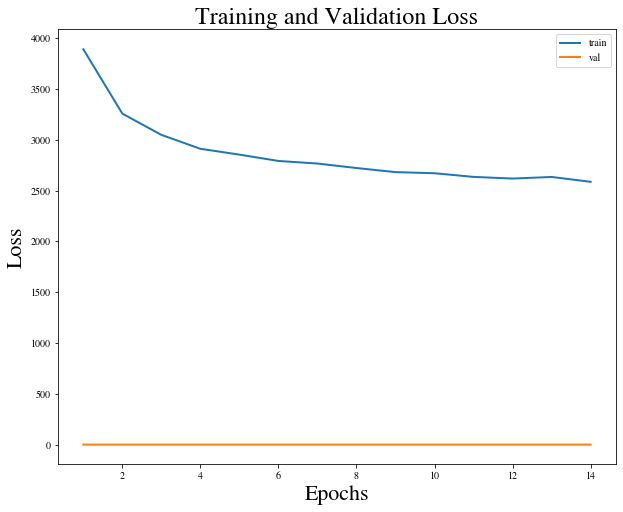

Training epoch 15: 100%|██████████| 12079/12079 [06:29<00:00, 31.03it/s]


Epoch: 15, train loss: 2560.9888
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_15_loss_2560.9888.pt
Epoch: 15, val loss: 0.2536


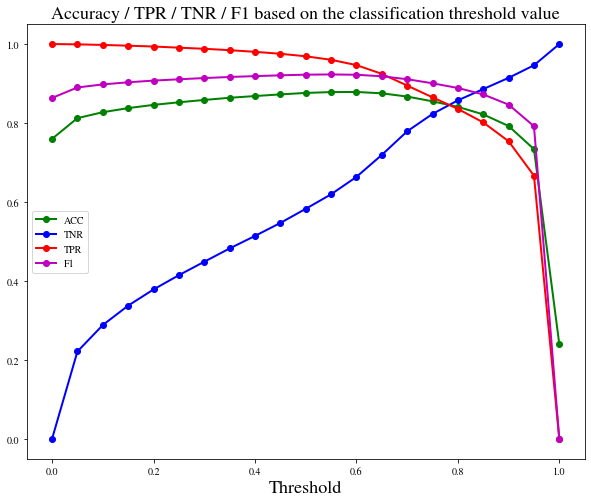

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 192944


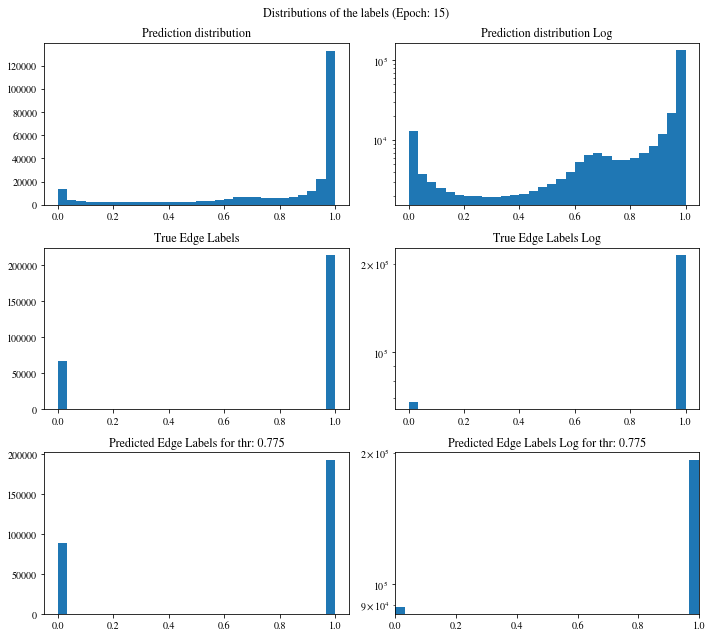

[0.99684191 0.9952625  0.99814427 ... 0.99675792 0.99039638 0.99628204]
Confusion matrix:
[[ 56971  10729]
 [ 31952 182215]]

Confusion matrix weighted:
[[0.42076071 0.07923929]
 [0.07459599 0.42540401]]

TN: 56971 	 FN: 31952 	 TP: 182215 	 FP: 10729
Confusion matrix scaled:
[[0.20212015 0.03806405]
 [0.11335843 0.64645737]]

Accuracy: 0.8486
Precision: 0.9444
Negative predictive value: 0.6407
Recall: Correctly classifying 85.0808 % of positive edges
True negative rate: Correctly classifying 84.1521 % of all negative edges
F1 score: 0.8952
[0.84940954 0.8429796 ] [0.84152142 0.85080801] [0.84544708 0.84687572]
Balanced accuracy: 0.8462
Precision weighted: [0.84940954 0.8429796 ]
Recall weighted: [0.84152142 0.85080801]
F1 score weighted: [0.84544708 0.84687572]
positive_likelihood_ratio: 5.368599363273027, negative_likelihood_ratio: 0.17728839991300288


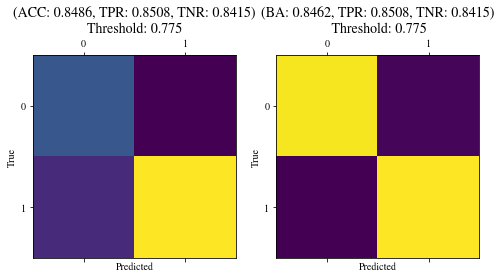

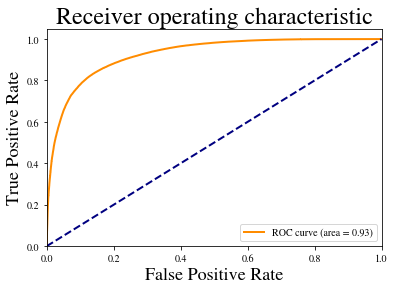

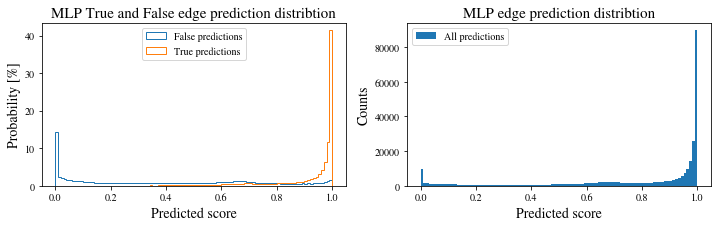

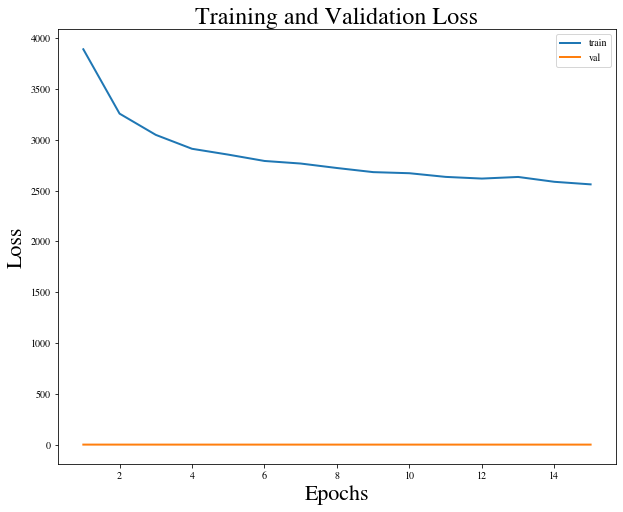

Training epoch 16: 100%|██████████| 12079/12079 [06:20<00:00, 31.74it/s]


Epoch: 16, train loss: 2551.1746
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_16_loss_2551.1746.pt
Epoch: 16, val loss: 0.2489


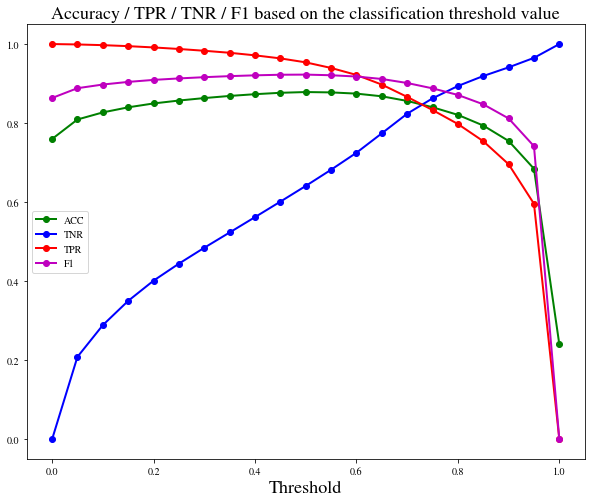

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 192586


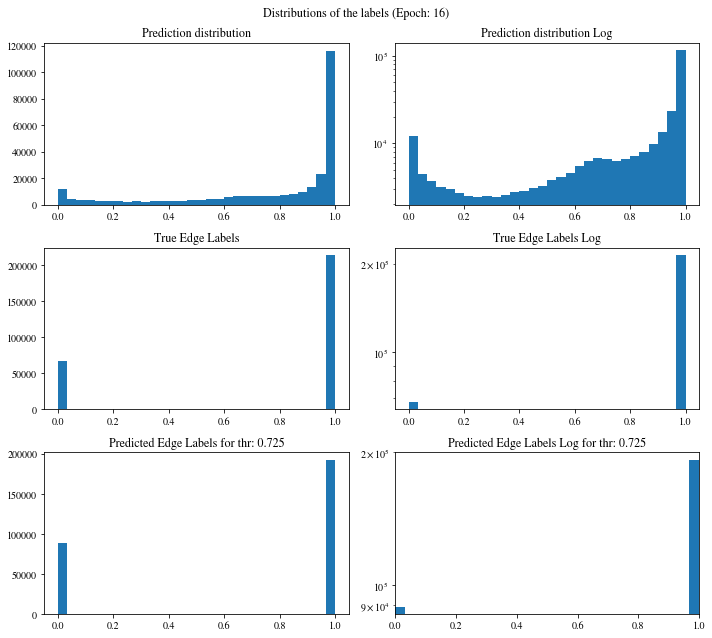

[0.98689204 0.99459475 0.99527955 ... 0.98669899 0.95764542 0.93501234]
Confusion matrix:
[[ 57162  10538]
 [ 32119 182048]]

Confusion matrix weighted:
[[0.42217134 0.07782866]
 [0.07498588 0.42501412]]

TN: 57162 	 FN: 32119 	 TP: 182048 	 FP: 10538
Confusion matrix scaled:
[[0.20279777 0.03738643]
 [0.11395091 0.64586489]]

Accuracy: 0.8487
Precision: 0.9453
Negative predictive value: 0.6402
Recall: Correctly classifying 85.0028 % of positive edges
True negative rate: Correctly classifying 84.4343 % of all negative edges
F1 score: 0.8951
[0.8491707  0.84522268] [0.84434269 0.85002825] [0.84674981 0.84761866]
Balanced accuracy: 0.8472
Precision weighted: [0.8491707  0.84522268]
Recall weighted: [0.84434269 0.85002825]
F1 score weighted: [0.84674981 0.84761866]
positive_likelihood_ratio: 5.460895089786239, negative_likelihood_ratio: 0.17761952947469678


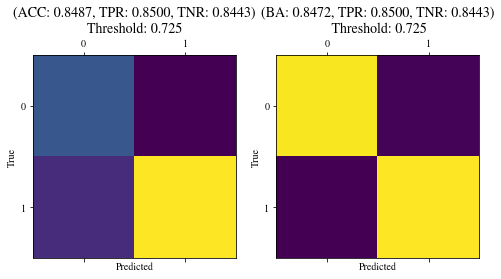

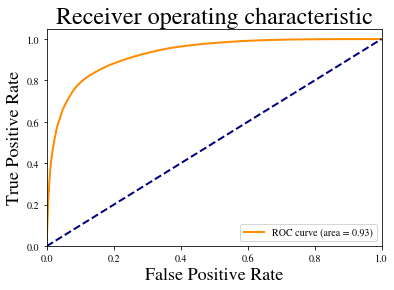

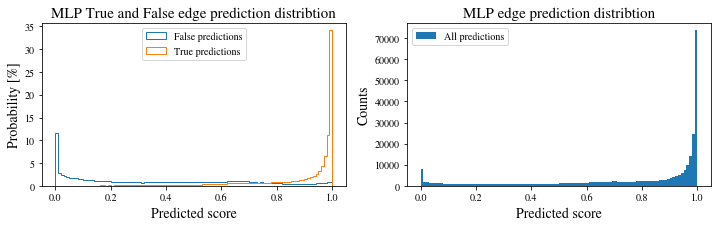

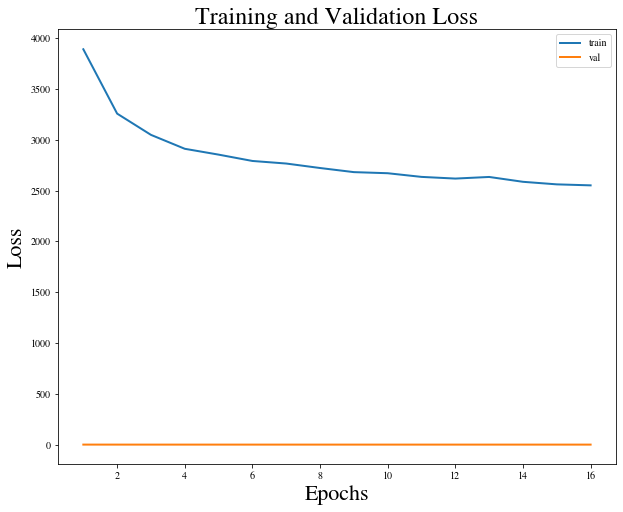

Training epoch 17: 100%|██████████| 12079/12079 [06:25<00:00, 31.34it/s]


Epoch: 17, train loss: 2549.3552
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_17_loss_2549.3552.pt
Epoch: 17, val loss: 0.2497


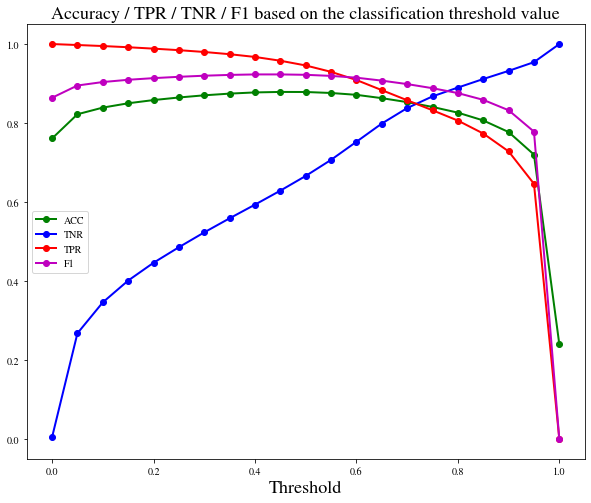

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194695


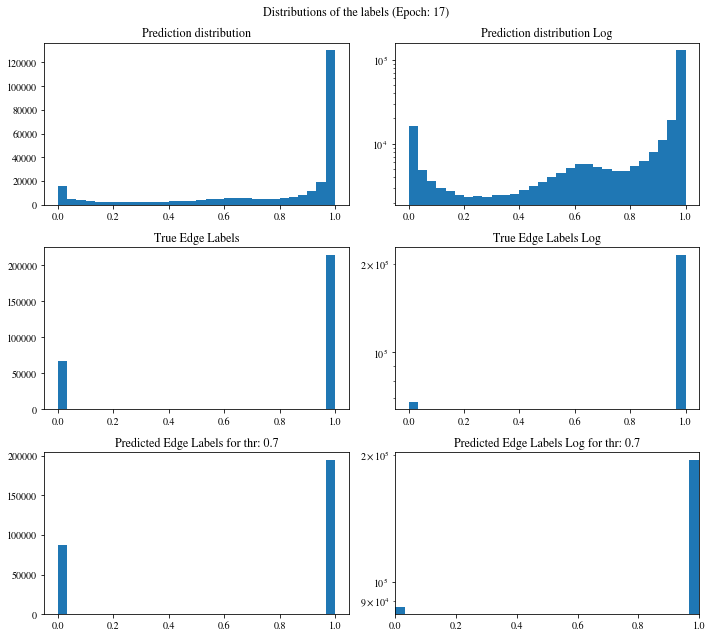

[0.99754602 0.9995603  0.99041641 ... 0.99258703 0.98536104 0.94878507]
Confusion matrix:
[[ 56733  10967]
 [ 30439 183728]]

Confusion matrix weighted:
[[0.41900295 0.08099705]
 [0.0710637  0.4289363 ]]

TN: 56733 	 FN: 30439 	 TP: 183728 	 FP: 10967
Confusion matrix scaled:
[[0.20127578 0.03890842]
 [0.10799065 0.65182515]]

Accuracy: 0.8531
Precision: 0.9437
Negative predictive value: 0.6508
Recall: Correctly classifying 85.7873 % of positive edges
True negative rate: Correctly classifying 83.8006 % of all negative edges
F1 score: 0.8987
[0.85499176 0.8411615 ] [0.83800591 0.85787259] [0.84641363 0.84943487]
Balanced accuracy: 0.8479
Precision weighted: [0.85499176 0.8411615 ]
Recall weighted: [0.83800591 0.85787259]
F1 score weighted: [0.84641363 0.84943487]
positive_likelihood_ratio: 5.2957029875655035, negative_likelihood_ratio: 0.16960191309060207


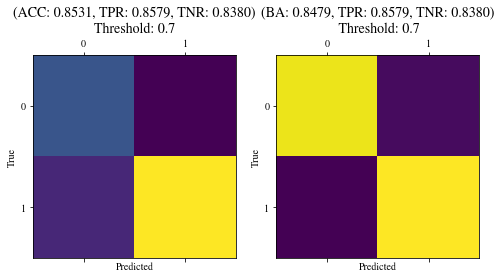

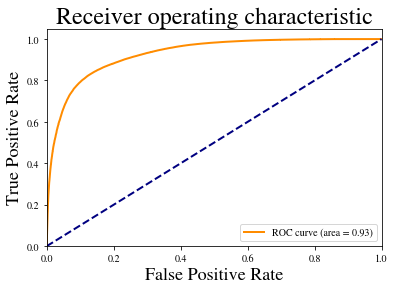

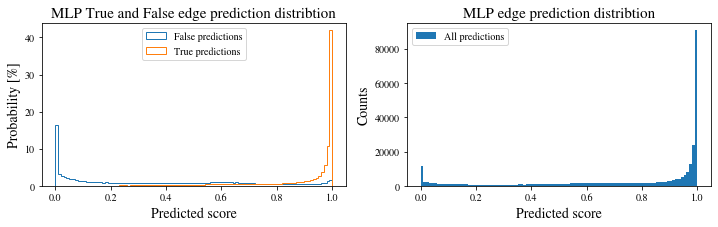

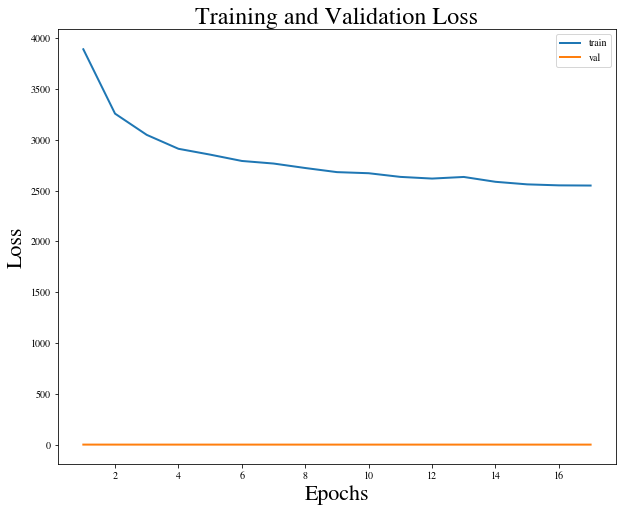

Training epoch 18: 100%|██████████| 12079/12079 [06:25<00:00, 31.33it/s]


Epoch: 18, train loss: 2526.9419
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_18_loss_2526.9419.pt
Epoch: 18, val loss: 0.2602


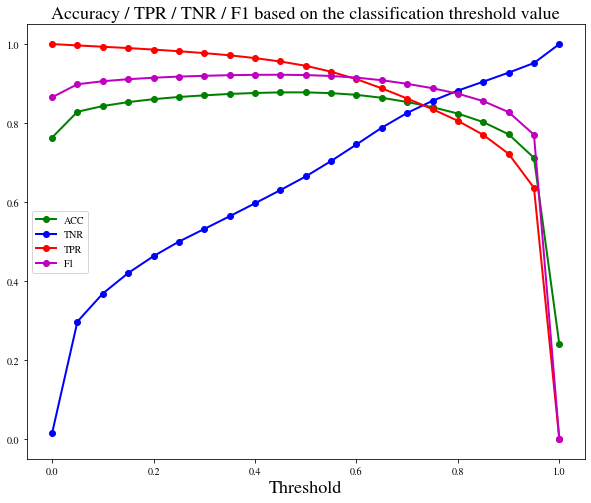

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 192474


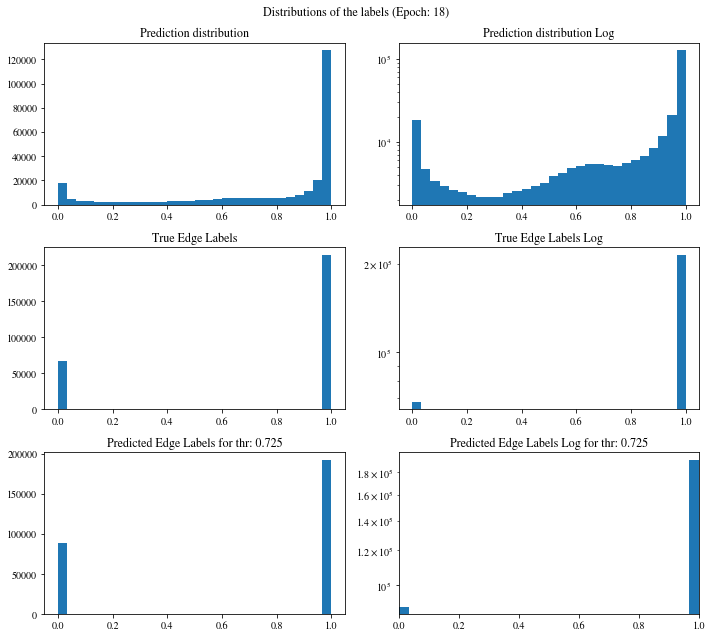

[6.47887290e-02 5.24751134e-02 9.99191105e-01 ... 4.71605480e-01
 2.79849660e-17 8.61995578e-01]
Confusion matrix:
[[ 57034  10666]
 [ 32359 181808]]

Confusion matrix weighted:
[[0.421226   0.078774  ]
 [0.07554619 0.42445381]]

TN: 57034 	 FN: 32359 	 TP: 181808 	 FP: 10666
Confusion matrix scaled:
[[0.20234366 0.03784054]
 [0.11480237 0.64501343]]

Accuracy: 0.8474
Precision: 0.9446
Negative predictive value: 0.6380
Recall: Correctly classifying 84.8908 % of positive edges
True negative rate: Correctly classifying 84.2452 % of all negative edges
F1 score: 0.8942
[0.84792589 0.84346254] [0.84245199 0.84890763] [0.84518008 0.84617633]
Balanced accuracy: 0.8457
Precision weighted: [0.84792589 0.84346254]
Recall weighted: [0.84245199 0.84890763]
F1 score weighted: [0.84518008 0.84617633]
positive_likelihood_ratio: 5.388247367934266, negative_likelihood_ratio: 0.17934834613762168


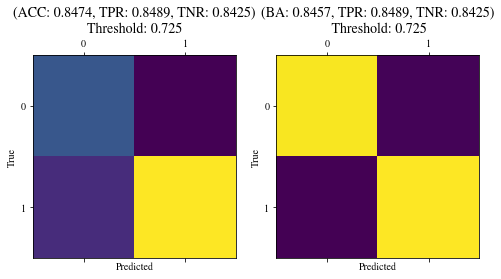

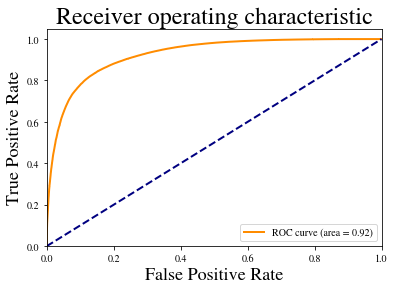

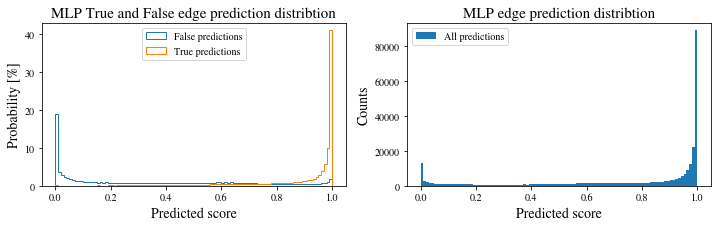

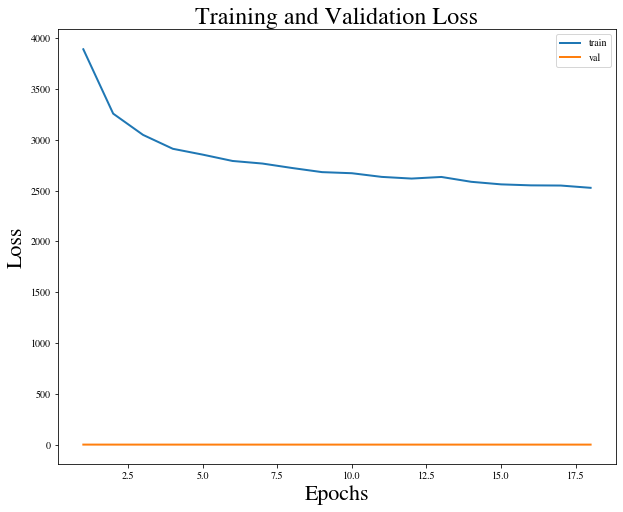

Training epoch 19: 100%|██████████| 12079/12079 [06:23<00:00, 31.52it/s]


Epoch: 19, train loss: 2515.2646
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_19_loss_2515.2646.pt
Epoch: 19, val loss: 0.2462


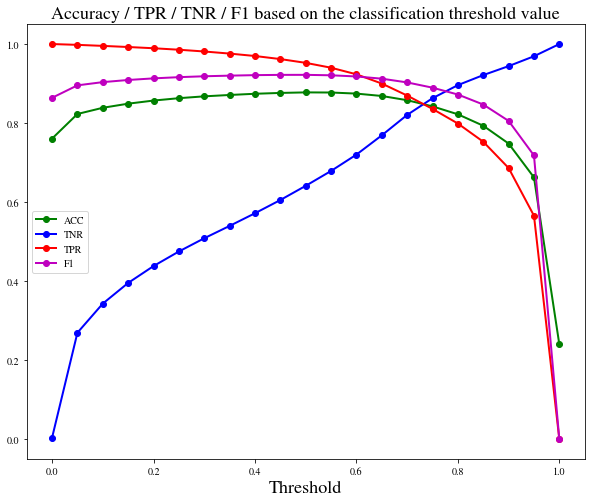

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193360


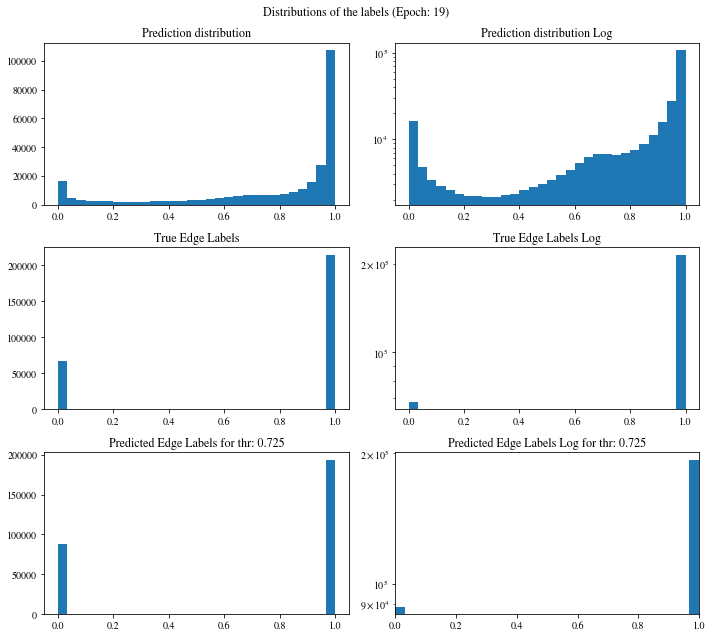

[0.95753181 0.60456687 0.72481906 ... 0.9427973  0.88758469 0.8907572 ]
Confusion matrix:
[[ 57093  10607]
 [ 31414 182753]]

Confusion matrix weighted:
[[0.42166174 0.07833826]
 [0.07333996 0.42666004]]

TN: 57093 	 FN: 31414 	 TP: 182753 	 FP: 10607
Confusion matrix scaled:
[[0.20255298 0.03763122]
 [0.11144973 0.64836607]]

Accuracy: 0.8509
Precision: 0.9451
Negative predictive value: 0.6451
Recall: Correctly classifying 85.3320 % of positive edges
True negative rate: Correctly classifying 84.3323 % of all negative edges
F1 score: 0.8969
[0.85183897 0.84487421] [0.84332349 0.85332007] [0.84755984 0.84907614]
Balanced accuracy: 0.8483
Precision weighted: [0.85183897 0.84487421]
Recall weighted: [0.84332349 0.85332007]
F1 score weighted: [0.84755984 0.84907614]
positive_likelihood_ratio: 5.446381532822437, negative_likelihood_ratio: 0.1739307985453979


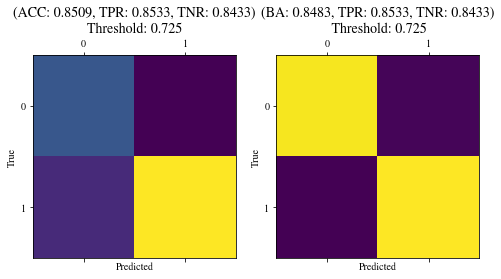

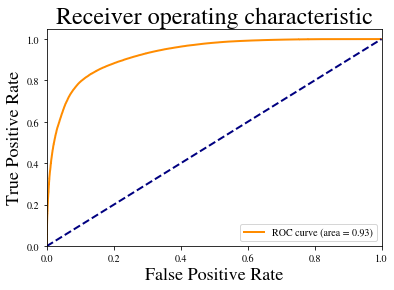

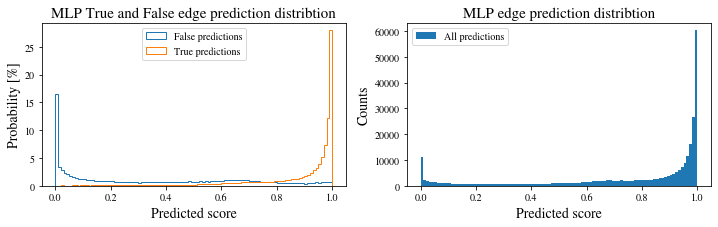

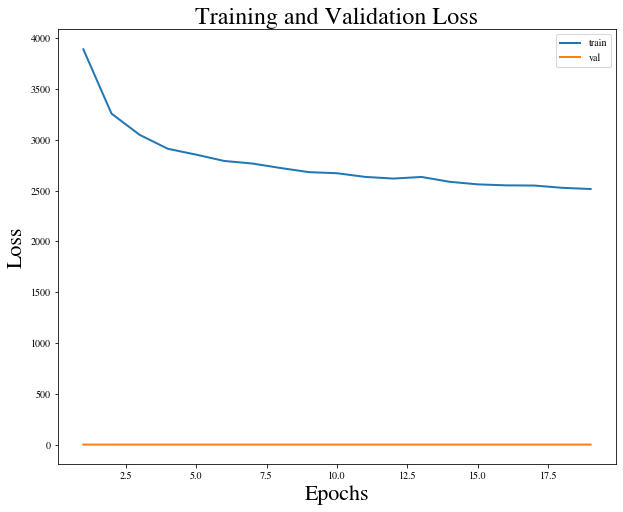

Training epoch 20: 100%|██████████| 12079/12079 [06:26<00:00, 31.24it/s]


Epoch: 20, train loss: 2497.7170
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_20_loss_2497.7170.pt
Epoch: 20, val loss: 0.2433


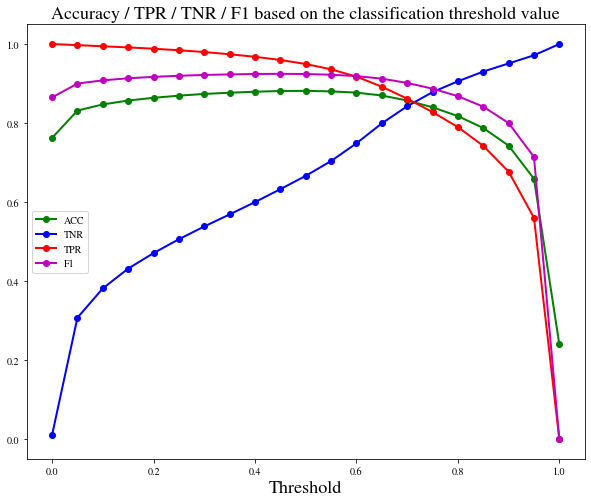

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 195225


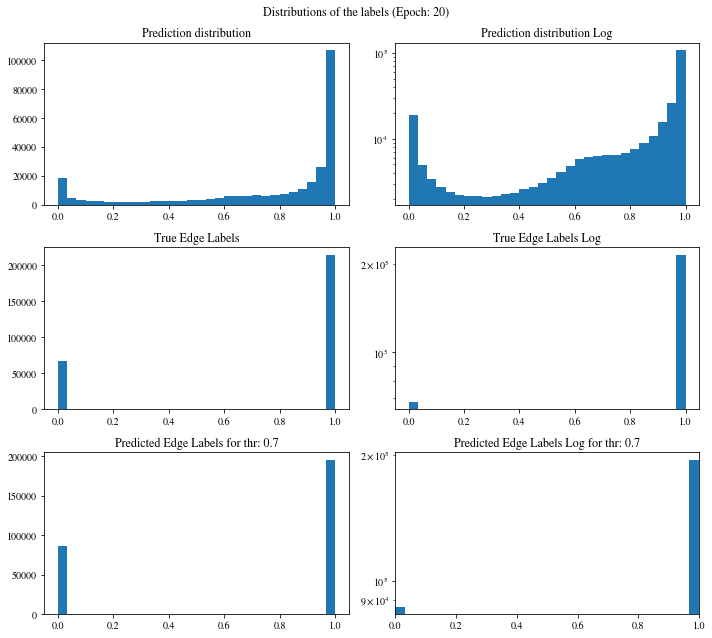

[0.74714297 0.71350098 0.78275263 ... 0.77307022 0.74553663 0.7930764 ]
Confusion matrix:
[[ 57048  10652]
 [ 29594 184573]]

Confusion matrix weighted:
[[0.42132939 0.07867061]
 [0.06909094 0.43090906]]

TN: 57048 	 FN: 29594 	 TP: 184573 	 FP: 10652
Confusion matrix scaled:
[[0.20239333 0.03779087]
 [0.10499278 0.65482302]]

Accuracy: 0.8572
Precision: 0.9454
Negative predictive value: 0.6584
Recall: Correctly classifying 86.1818 % of positive edges
True negative rate: Correctly classifying 84.2659 % of all negative edges
F1 score: 0.9017
[0.85911893 0.84561667] [0.84265879 0.86181811] [0.85080925 0.85364053]
Balanced accuracy: 0.8522
Precision weighted: [0.85911893 0.84561667]
Recall weighted: [0.84265879 0.86181811]
F1 score weighted: [0.85080925 0.85364053]
positive_likelihood_ratio: 5.477383243630277, negative_likelihood_ratio: 0.1639832016696517


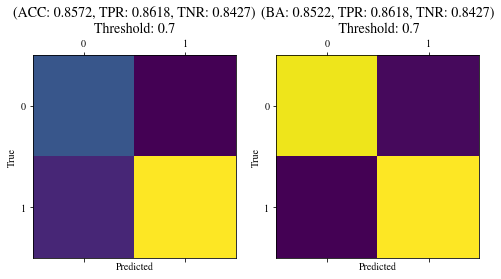

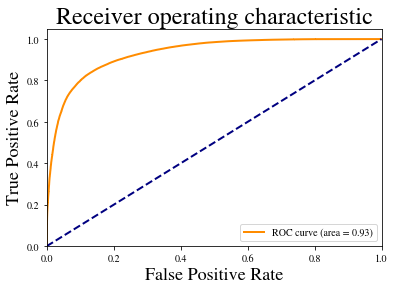

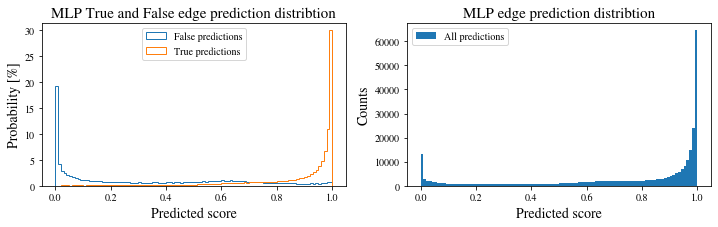

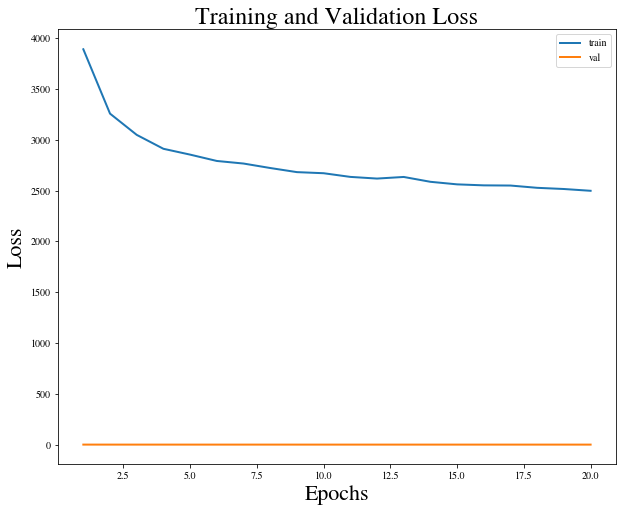

Training epoch 21: 100%|██████████| 12079/12079 [06:26<00:00, 31.27it/s]


Epoch: 21, train loss: 2391.0916
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_21_loss_2391.0916.pt
Epoch: 21, val loss: 0.2379


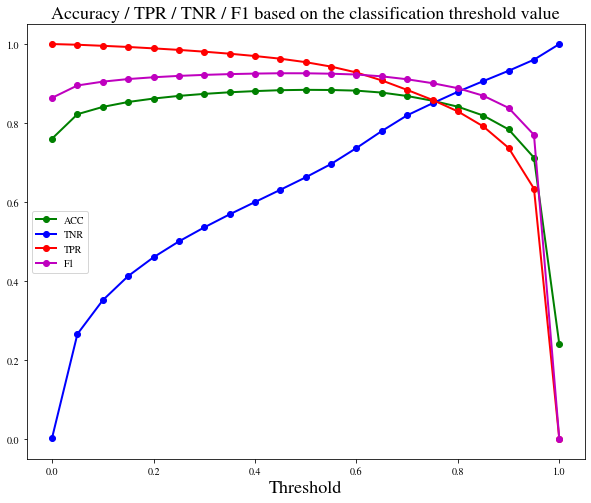

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194038


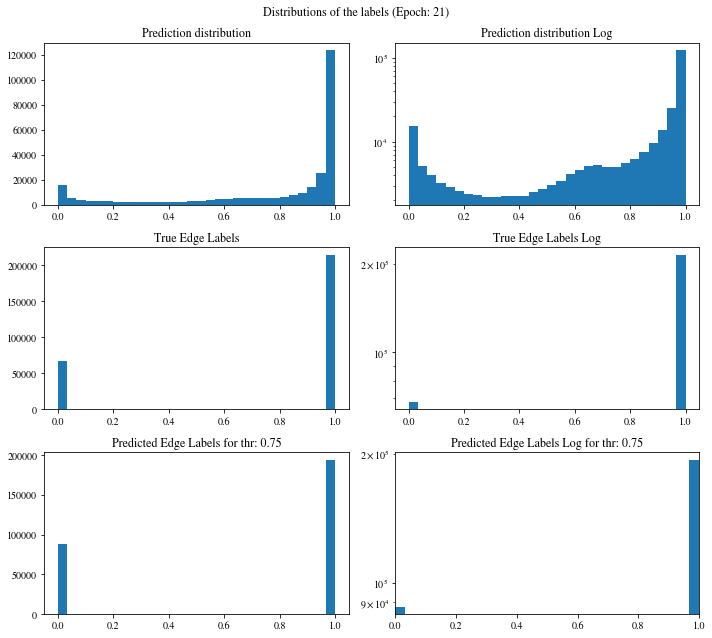

[0.99366552 0.9944464  0.99717039 ... 0.90431648 0.90369534 0.90173131]
Confusion matrix:
[[ 57556  10144]
 [ 30273 183894]]

Confusion matrix weighted:
[[0.42508124 0.07491876]
 [0.07067615 0.42932385]]

TN: 57556 	 FN: 30273 	 TP: 183894 	 FP: 10144
Confusion matrix scaled:
[[0.2041956  0.0359886 ]
 [0.10740172 0.65241408]]

Accuracy: 0.8566
Precision: 0.9477
Negative predictive value: 0.6553
Recall: Correctly classifying 85.8648 % of positive edges
True negative rate: Correctly classifying 85.0162 % of all negative edges
F1 score: 0.9010
[0.85743802 0.85142319] [0.85016248 0.85864769] [0.85378475 0.85502018]
Balanced accuracy: 0.8544
Precision weighted: [0.85743802 0.85142319]
Recall weighted: [0.85016248 0.85864769]
F1 score weighted: [0.85378475 0.85502018]
positive_likelihood_ratio: 5.730525302500235, negative_likelihood_ratio: 0.1662650519743835


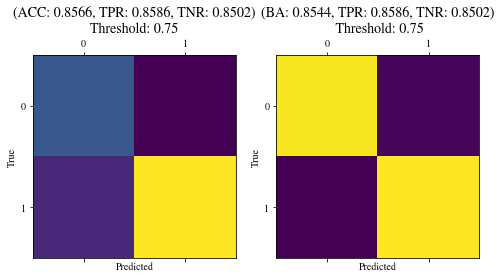

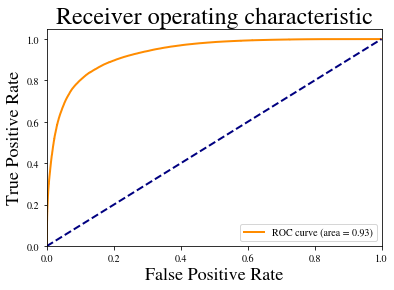

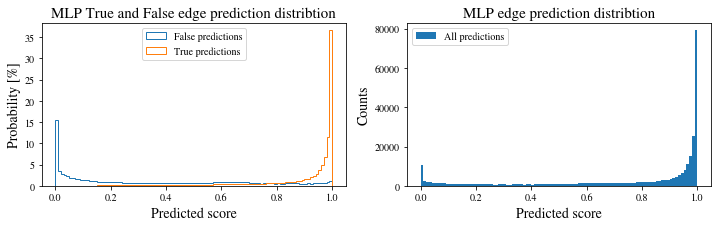

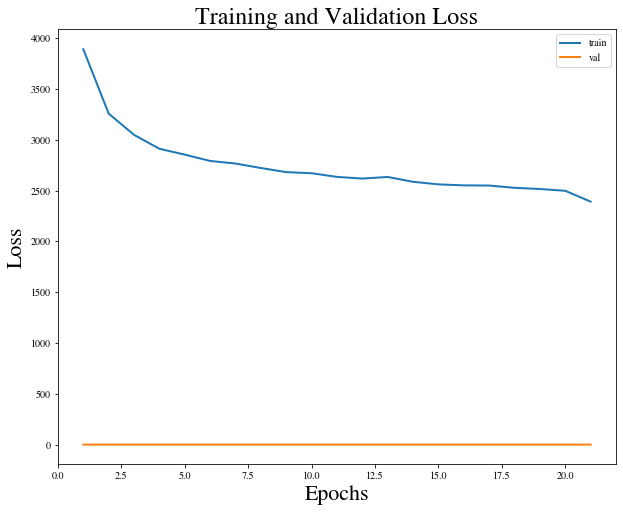

Training epoch 22: 100%|██████████| 12079/12079 [06:43<00:00, 29.93it/s]


Epoch: 22, train loss: 2387.3137
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_22_loss_2387.3137.pt
Epoch: 22, val loss: 0.2358


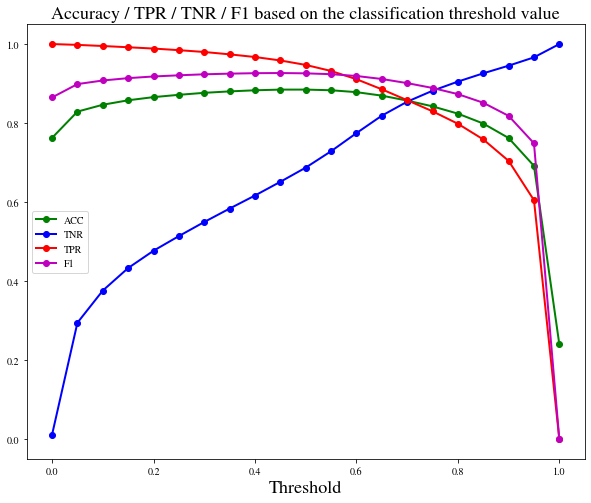

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 193614


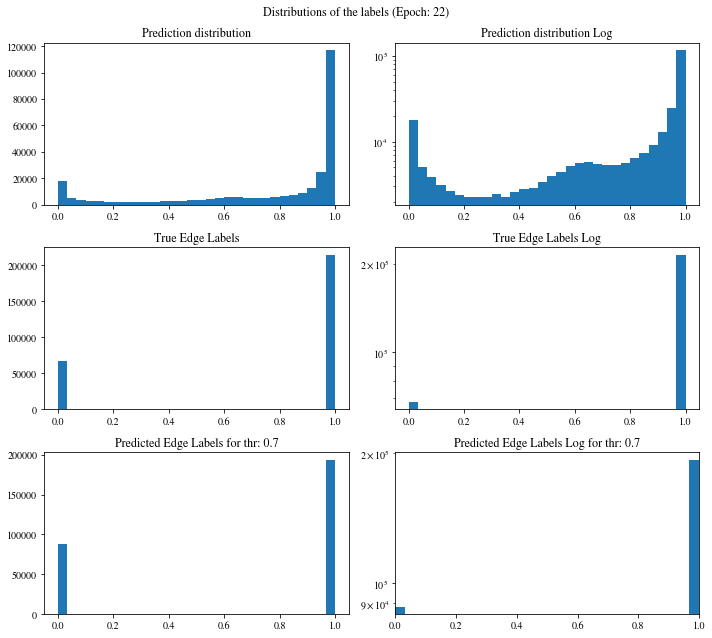

[0.995691   0.99205106 0.9832117  ... 0.0986038  0.01767973 0.93938988]
Confusion matrix:
[[ 57826   9874]
 [ 30427 183740]]

Confusion matrix weighted:
[[0.42707533 0.07292467]
 [0.07103569 0.42896431]]

TN: 57826 	 FN: 30427 	 TP: 183740 	 FP: 9874
Confusion matrix scaled:
[[0.20515349 0.03503071]
 [0.10794807 0.65186772]]

Accuracy: 0.8570
Precision: 0.9490
Negative predictive value: 0.6552
Recall: Correctly classifying 85.7929 % of positive edges
True negative rate: Correctly classifying 85.4151 % of all negative edges
F1 score: 0.9012
[0.85738985 0.8546996 ] [0.85415066 0.85792863] [0.85576719 0.85631107]
Balanced accuracy: 0.8560
Precision weighted: [0.85738985 0.8546996 ]
Recall weighted: [0.85415066 0.85792863]
F1 score weighted: [0.85576719 0.85631107]
positive_likelihood_ratio: 5.882293697196667, negative_likelihood_ratio: 0.16633057852661612


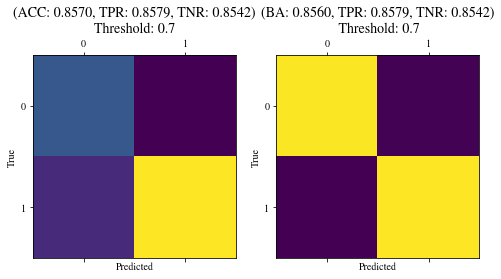

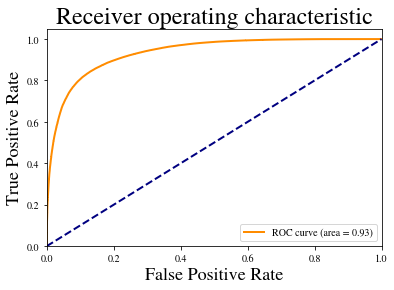

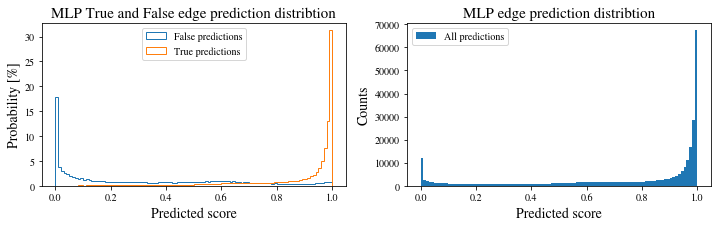

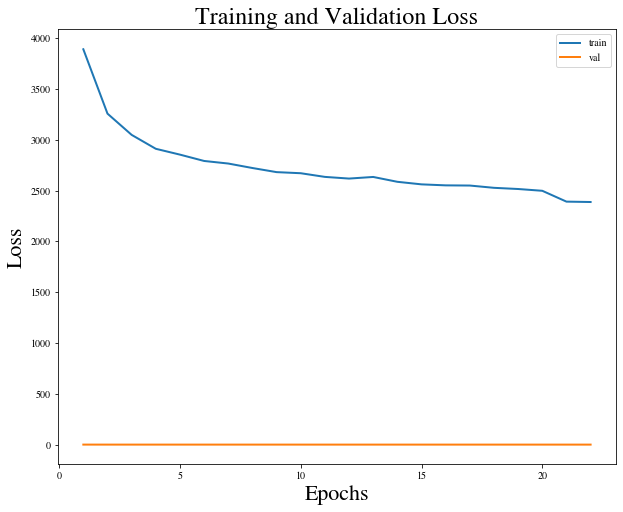

Training epoch 23: 100%|██████████| 12079/12079 [06:25<00:00, 31.29it/s]


Epoch: 23, train loss: 2332.2126
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_23_loss_2332.2126.pt
Epoch: 23, val loss: 0.2385


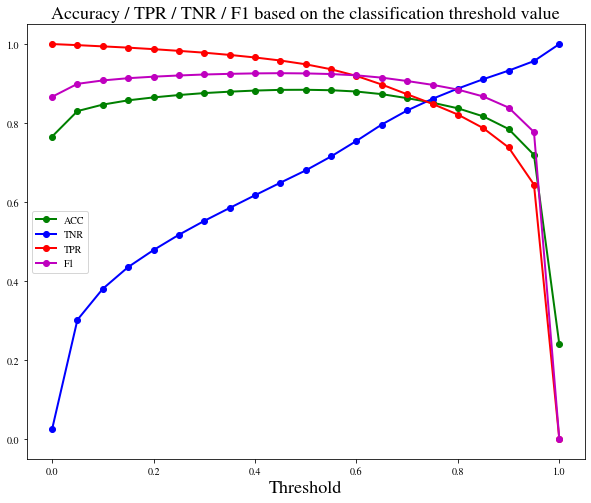

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 191102


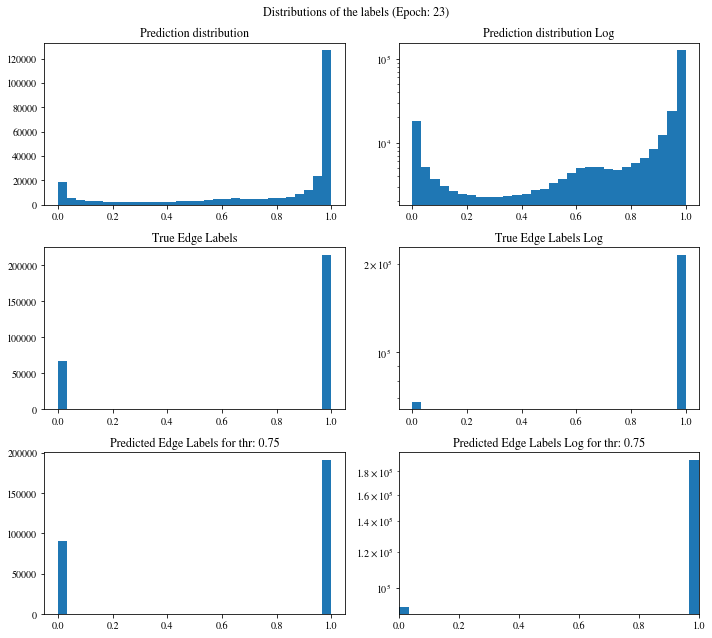

[0.99894029 0.99918741 0.99617743 ... 0.96327066 0.99067831 0.94710034]
Confusion matrix:
[[ 58326   9374]
 [ 32439 181728]]

Confusion matrix weighted:
[[0.43076809 0.06923191]
 [0.07573296 0.42426704]]

TN: 58326 	 FN: 32439 	 TP: 181728 	 FP: 9374
Confusion matrix scaled:
[[0.20692738 0.03325682]
 [0.11508619 0.64472961]]

Accuracy: 0.8517
Precision: 0.9509
Negative predictive value: 0.6426
Recall: Correctly classifying 84.8534 % of positive edges
True negative rate: Correctly classifying 86.1536 % of all negative edges
F1 score: 0.8968
[0.85047819 0.85971215] [0.86153619 0.84853409] [0.85597148 0.85408655]
Balanced accuracy: 0.8550
Precision weighted: [0.85047819 0.85971215]
Recall weighted: [0.86153619 0.84853409]
F1 score weighted: [0.85597148 0.85408655]
positive_likelihood_ratio: 6.128201168102558, negative_likelihood_ratio: 0.17580911172044397


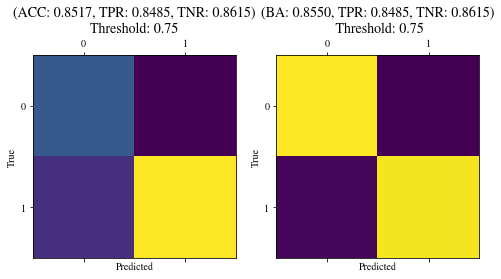

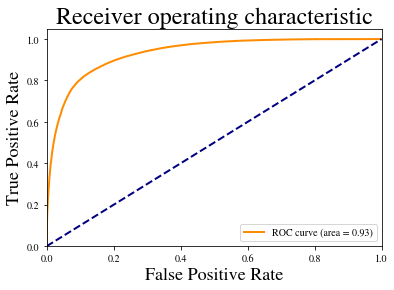

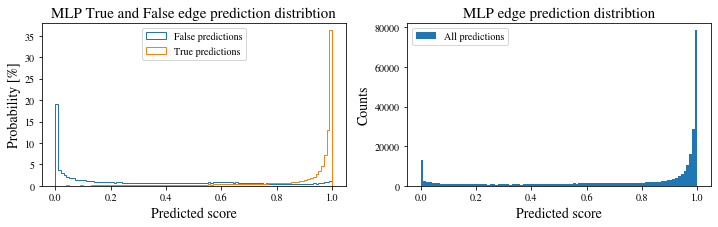

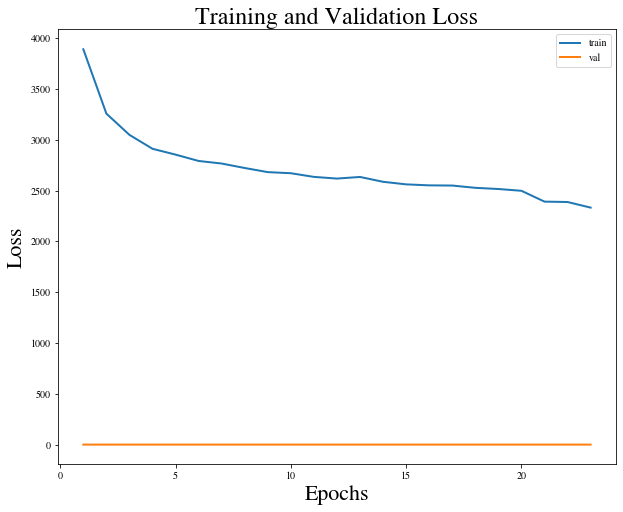

Training epoch 24: 100%|██████████| 12079/12079 [06:25<00:00, 31.35it/s]


Epoch: 24, train loss: 2315.5664
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_24_loss_2315.5664.pt
Epoch: 24, val loss: 0.2336


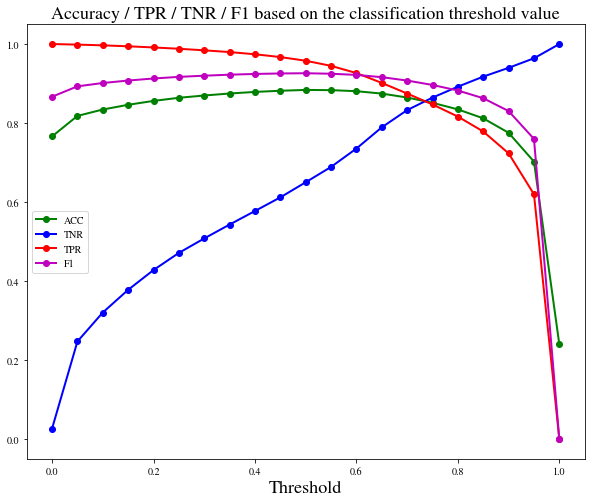

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 190616


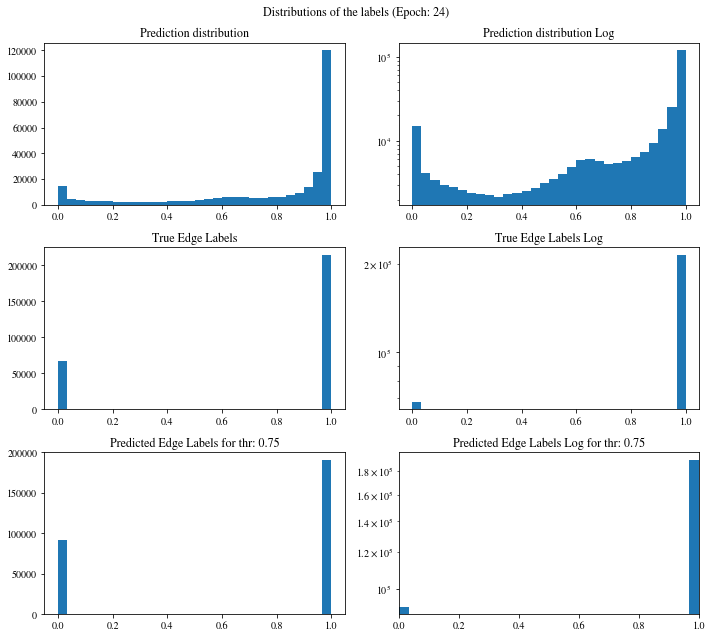

[0.98836726 0.98642749 0.98904467 ... 0.91470933 0.92405051 0.00147827]
Confusion matrix:
[[ 58531   9169]
 [ 32720 181447]]

Confusion matrix weighted:
[[0.43228213 0.06771787]
 [0.07638899 0.42361101]]

TN: 58531 	 FN: 32720 	 TP: 181447 	 FP: 9169
Confusion matrix scaled:
[[0.20765467 0.03252953]
 [0.11608312 0.64373268]]

Accuracy: 0.8514
Precision: 0.9519
Negative predictive value: 0.6414
Recall: Correctly classifying 84.7222 % of positive edges
True negative rate: Correctly classifying 86.4564 % of all negative edges
F1 score: 0.8965
[0.84982637 0.86217405] [0.86456425 0.84722203] [0.85713197 0.85463264]
Balanced accuracy: 0.8559
Precision weighted: [0.84982637 0.86217405]
Recall weighted: [0.86456425 0.84722203]
F1 score weighted: [0.85713197 0.85463264]
positive_likelihood_ratio: 6.2555274591840675, negative_likelihood_ratio: 0.17671095191849245


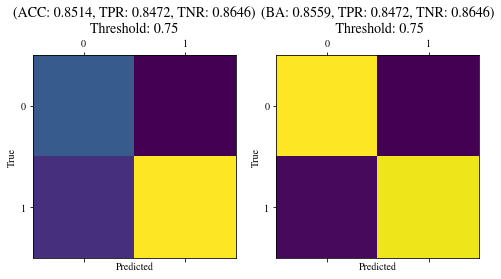

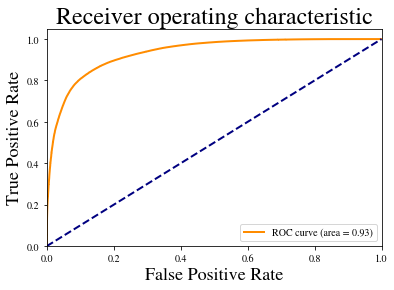

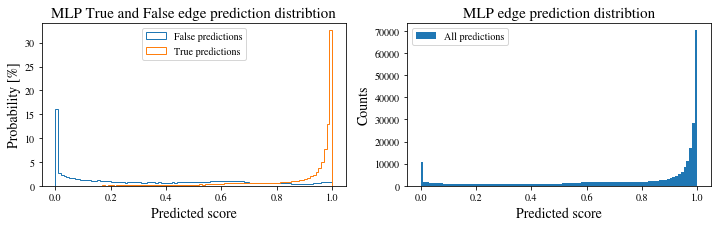

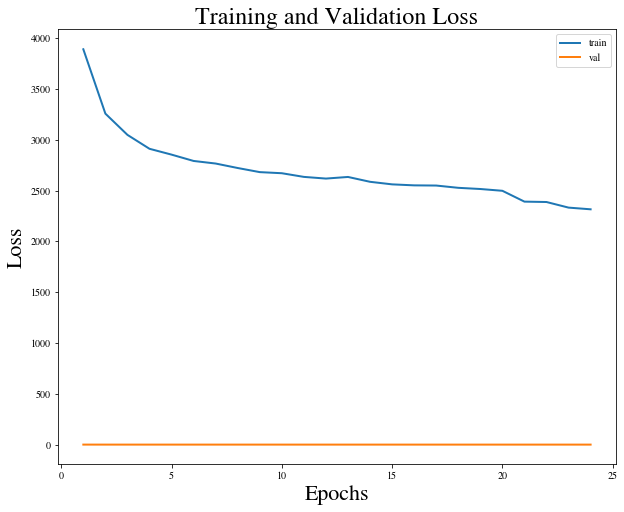

Training epoch 25: 100%|██████████| 12079/12079 [06:34<00:00, 30.63it/s]


Epoch: 25, train loss: 2328.3618
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_25_loss_2328.3618.pt
Epoch: 25, val loss: 0.2354


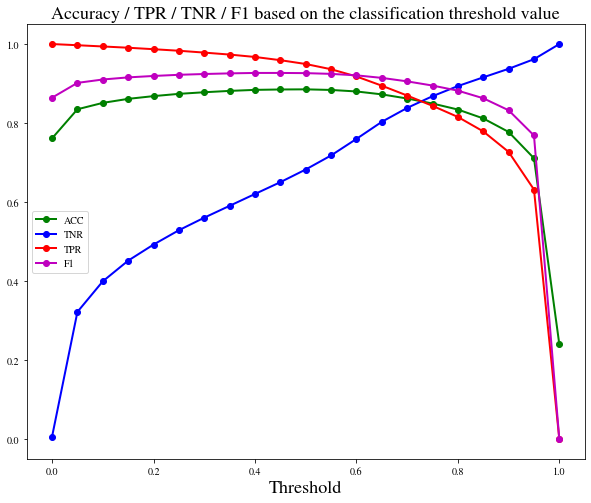

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193371


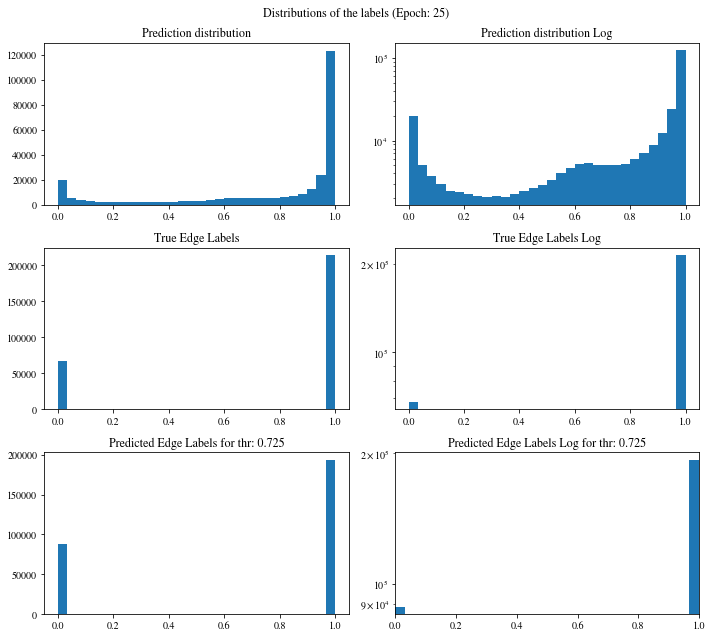

[9.87532079e-01 9.30591941e-01 8.93606557e-06 ... 5.01115680e-01
 6.45223856e-01 6.74081385e-01]
Confusion matrix:
[[ 57800   9900]
 [ 30696 183471]]

Confusion matrix weighted:
[[0.42688331 0.07311669]
 [0.0716637  0.4283363 ]]

TN: 57800 	 FN: 30696 	 TP: 183471 	 FP: 9900
Confusion matrix scaled:
[[0.20506125 0.03512295]
 [0.10890243 0.65091337]]

Accuracy: 0.8560
Precision: 0.9488
Negative predictive value: 0.6531
Recall: Correctly classifying 85.6673 % of positive edges
True negative rate: Correctly classifying 85.3767 % of all negative edges
F1 score: 0.9004
[0.85625488 0.85419034] [0.85376662 0.8566726 ] [0.85500894 0.85542967]
Balanced accuracy: 0.8552
Precision weighted: [0.85625488 0.85419034]
Recall weighted: [0.85376662 0.8566726 ]
F1 score weighted: [0.85500894 0.85542967]
positive_likelihood_ratio: 5.85825603950245, negative_likelihood_ratio: 0.16787656070805787


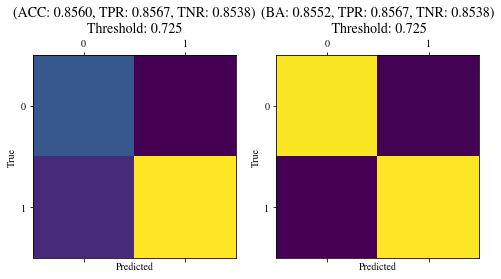

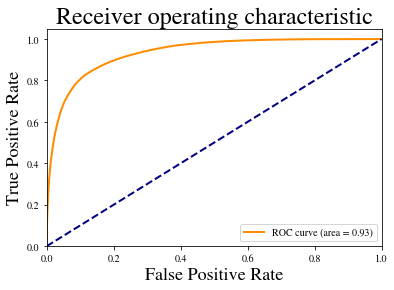

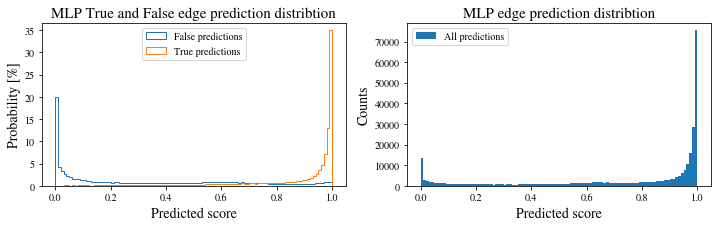

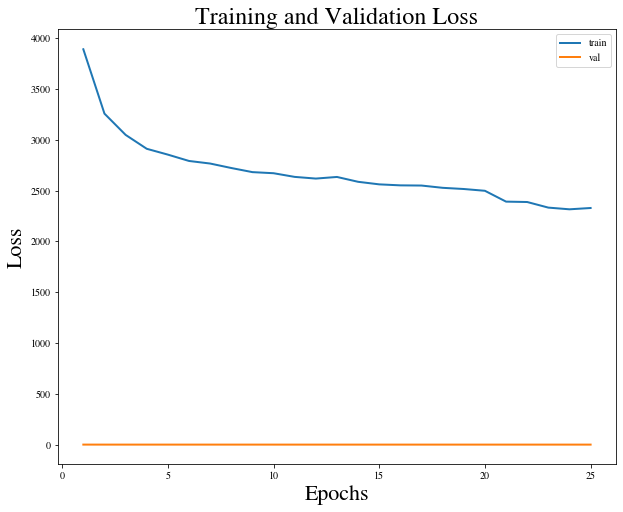

Training epoch 26: 100%|██████████| 12079/12079 [06:26<00:00, 31.23it/s]


Epoch: 26, train loss: 2305.0232
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_26_loss_2305.0232.pt
Epoch: 26, val loss: 0.2431


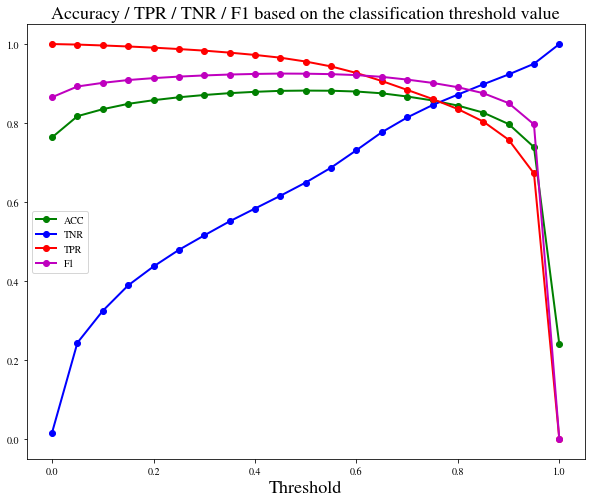

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194864


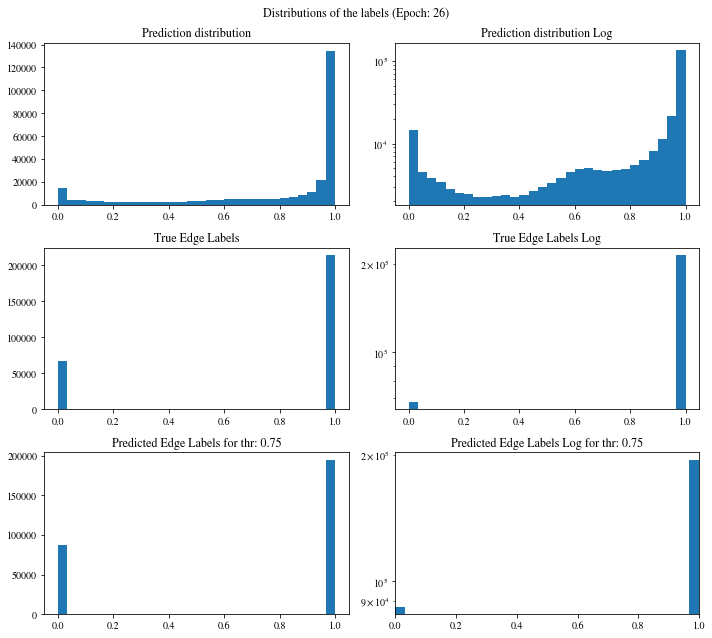

[0.88554013 0.98473734 0.78607345 ... 0.8557272  0.84295273 0.76369357]
Confusion matrix:
[[ 57249  10451]
 [ 29754 184413]]

Confusion matrix weighted:
[[0.42281388 0.07718612]
 [0.06946448 0.43053552]]

TN: 57249 	 FN: 29754 	 TP: 184413 	 FP: 10451
Confusion matrix scaled:
[[0.20310643 0.03707777]
 [0.10556042 0.65425538]]

Accuracy: 0.8574
Precision: 0.9464
Negative predictive value: 0.6580
Recall: Correctly classifying 86.1071 % of positive edges
True negative rate: Correctly classifying 84.5628 % of all negative edges
F1 score: 0.9017
[0.85889186 0.84797552] [0.84562777 0.86107103] [0.85220821 0.85447311]
Balanced accuracy: 0.8533
Precision weighted: [0.85889186 0.84797552]
Recall weighted: [0.84562777 0.86107103]
F1 score weighted: [0.85220821 0.85447311]
positive_likelihood_ratio: 5.577888140652829, negative_likelihood_ratio: 0.16429092284646524


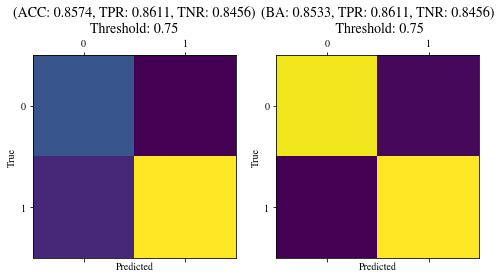

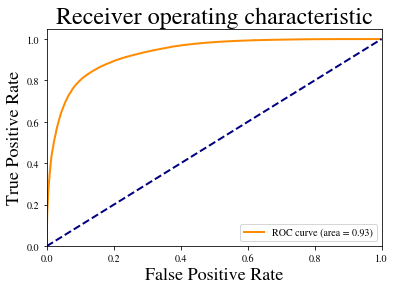

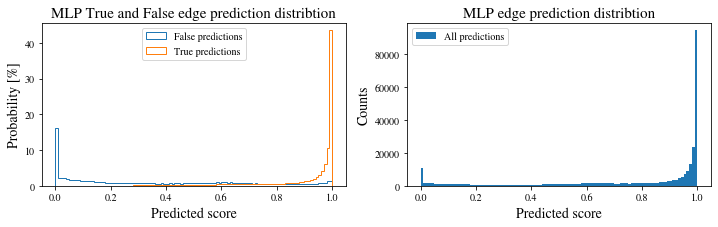

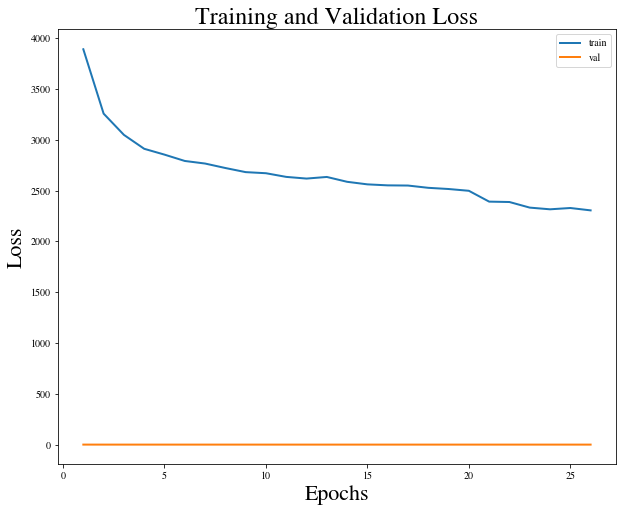

Training epoch 27: 100%|██████████| 12079/12079 [06:22<00:00, 31.59it/s]


Epoch: 27, train loss: 2303.2864
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_27_loss_2303.2864.pt
Epoch: 27, val loss: 0.2346


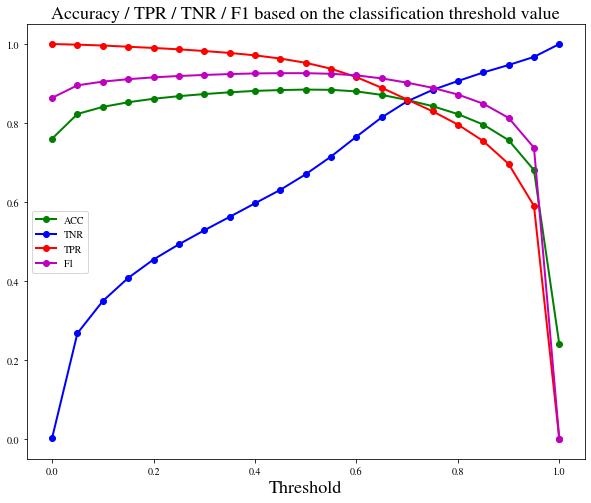

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 193920


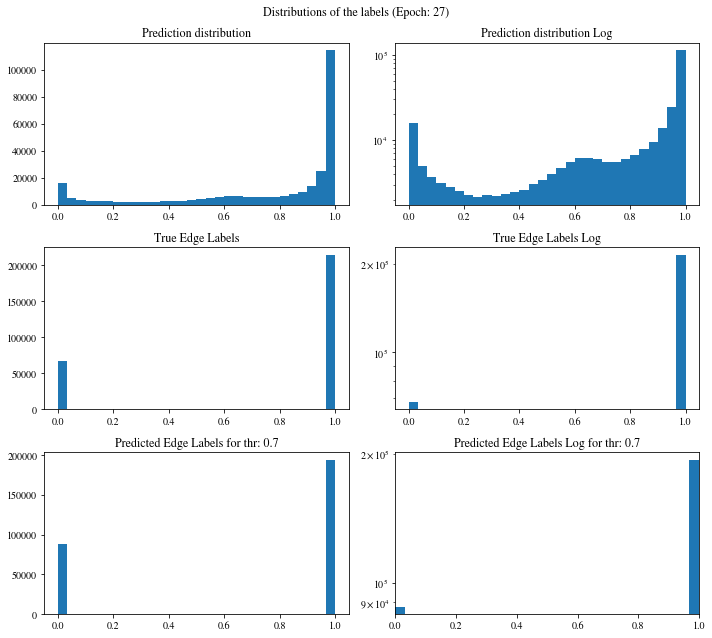

[0.99129957 0.99258512 0.98422086 ... 0.93422323 0.92120278 0.59993774]
Confusion matrix:
[[ 57889   9811]
 [ 30058 184109]]

Confusion matrix weighted:
[[0.42754062 0.07245938]
 [0.07017421 0.42982579]]

TN: 57889 	 FN: 30058 	 TP: 184109 	 FP: 9811
Confusion matrix scaled:
[[0.205377   0.0348072 ]
 [0.10663895 0.65317685]]

Accuracy: 0.8586
Precision: 0.9494
Negative predictive value: 0.6582
Recall: Correctly classifying 85.9652 % of positive edges
True negative rate: Correctly classifying 85.5081 % of all negative edges
F1 score: 0.9023
[0.8590072  0.85574056] [0.85508124 0.85965158] [0.85703972 0.85769161]
Balanced accuracy: 0.8574
Precision weighted: [0.8590072  0.85574056]
Recall weighted: [0.85508124 0.85965158]
F1 score weighted: [0.85703972 0.85769161]
positive_likelihood_ratio: 5.931955151045502, negative_likelihood_ratio: 0.16413460265495322


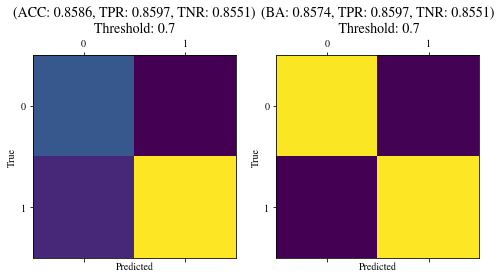

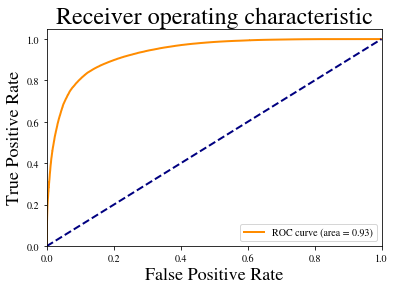

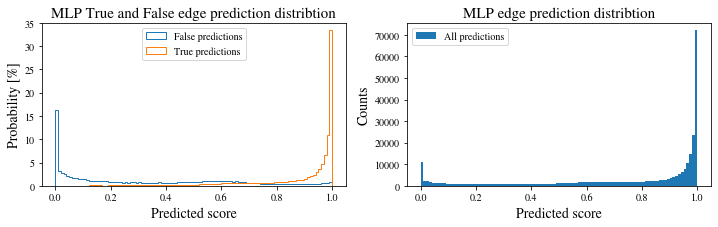

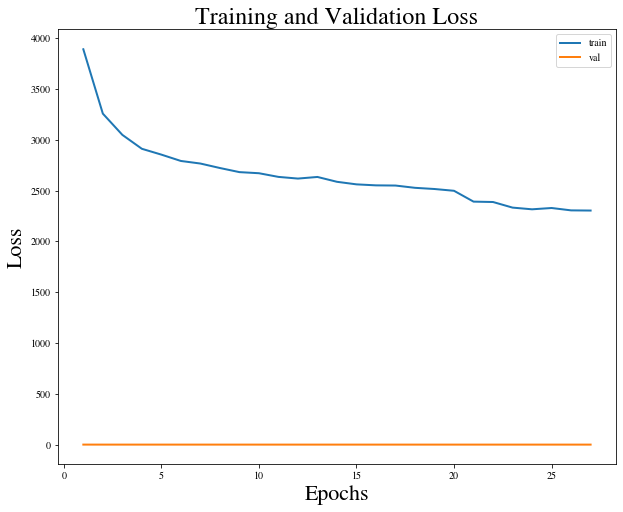

Training epoch 29: 100%|██████████| 12079/12079 [06:31<00:00, 30.86it/s]


Epoch: 29, train loss: 2277.4980
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_29_loss_2277.4980.pt
Epoch: 29, val loss: 0.2370


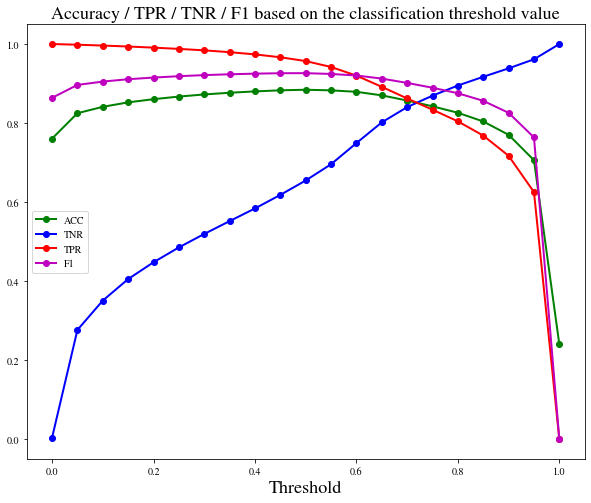

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 191409


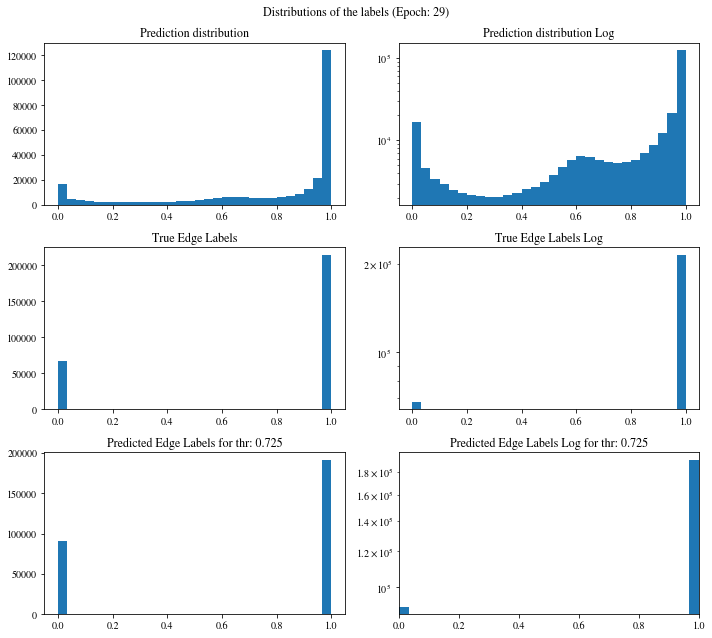

[0.75037158 0.76666582 0.97875309 ... 0.99127442 0.98684293 0.98587626]
Confusion matrix:
[[ 57915   9785]
 [ 32543 181624]]

Confusion matrix weighted:
[[0.42773264 0.07226736]
 [0.07597576 0.42402424]]

TN: 57915 	 FN: 32543 	 TP: 181624 	 FP: 9785
Confusion matrix scaled:
[[0.20546925 0.03471495]
 [0.11545516 0.64436064]]

Accuracy: 0.8498
Precision: 0.9489
Negative predictive value: 0.6402
Recall: Correctly classifying 84.8048 % of positive edges
True negative rate: Correctly classifying 85.5465 % of all negative edges
F1 score: 0.8956
[0.84916718 0.85438529] [0.85546529 0.84804849] [0.8523046 0.8512051]
Balanced accuracy: 0.8518
Precision weighted: [0.84916718 0.85438529]
Recall weighted: [0.85546529 0.84804849]
F1 score weighted: [0.8523046 0.8512051]
positive_likelihood_ratio: 5.867438167626146, negative_likelihood_ratio: 0.17762440697190993


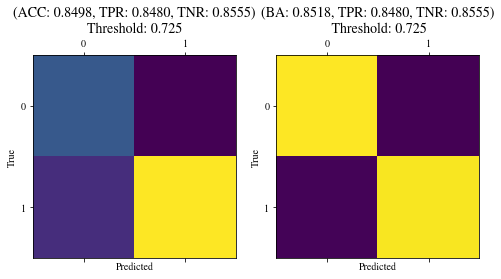

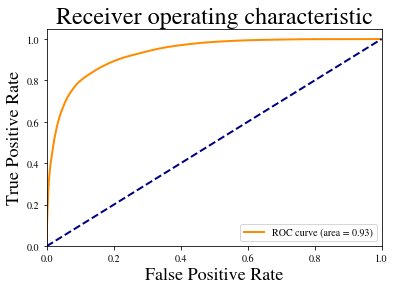

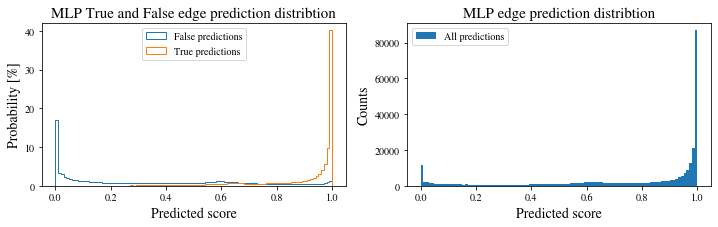

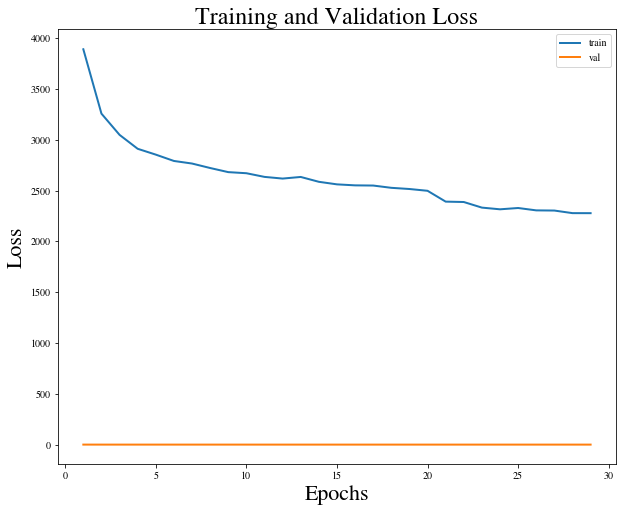

Training epoch 30:   8%|▊         | 931/12079 [00:29<05:20, 34.74it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 31: 100%|██████████| 12079/12079 [06:21<00:00, 31.70it/s]


Epoch: 31, train loss: 2269.2864
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_31_loss_2269.2864.pt
Epoch: 31, val loss: 0.2333


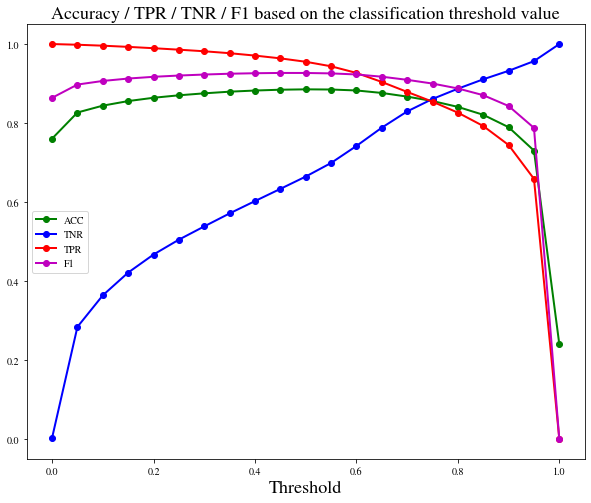

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192350


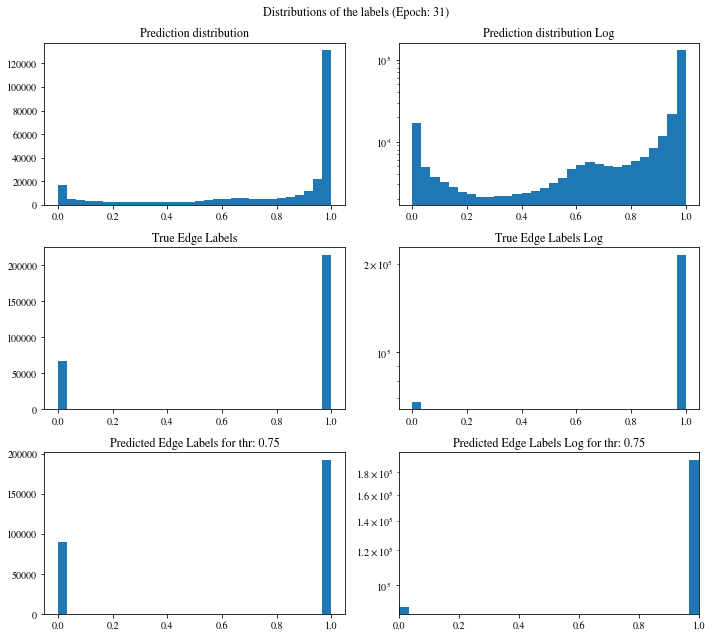

[0.98423183 0.99608409 0.9962219  ... 0.80130714 0.71734065 0.74784106]
Confusion matrix:
[[ 58296   9404]
 [ 31221 182946]]

Confusion matrix weighted:
[[0.43054653 0.06945347]
 [0.07288938 0.42711062]]

TN: 58296 	 FN: 31221 	 TP: 182946 	 FP: 9404
Confusion matrix scaled:
[[0.20682095 0.03336325]
 [0.11076501 0.64905079]]

Accuracy: 0.8559
Precision: 0.9511
Negative predictive value: 0.6512
Recall: Correctly classifying 85.4221 % of positive edges
True negative rate: Correctly classifying 86.1093 % of all negative edges
F1 score: 0.9001
[0.85521617 0.86013191] [0.86109306 0.85422124] [0.85814455 0.85716638]
Balanced accuracy: 0.8577
Precision weighted: [0.85521617 0.86013191]
Recall weighted: [0.86109306 0.85422124]
F1 score weighted: [0.85814455 0.85716638]
positive_likelihood_ratio: 6.149593561349364, negative_likelihood_ratio: 0.1692950142217405


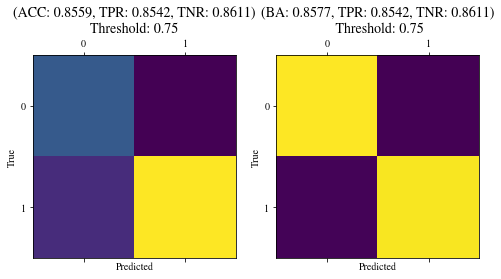

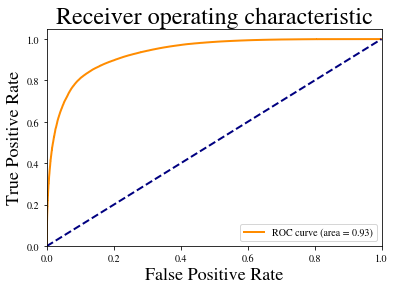

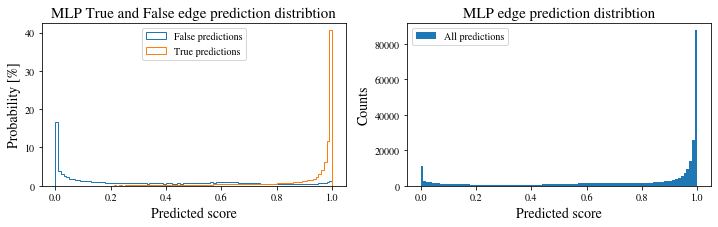

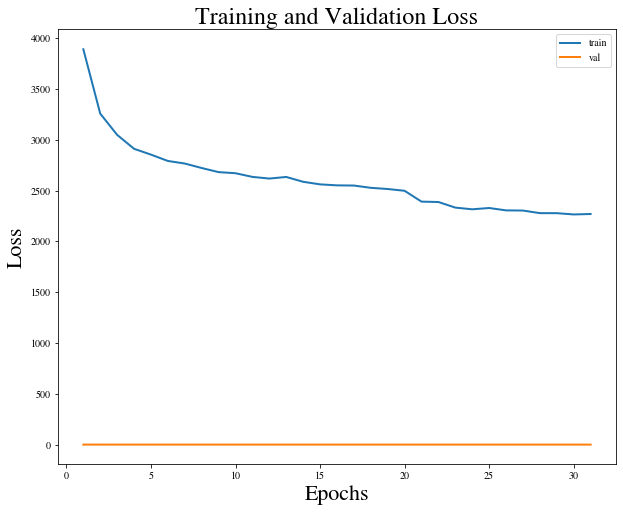

Training epoch 32:  67%|██████▋   | 8149/12079 [04:25<02:07, 30.71it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 33: 100%|██████████| 12079/12079 [06:33<00:00, 30.74it/s]


Epoch: 33, train loss: 2258.3220
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_33_loss_2258.3220.pt
Epoch: 33, val loss: 0.2356


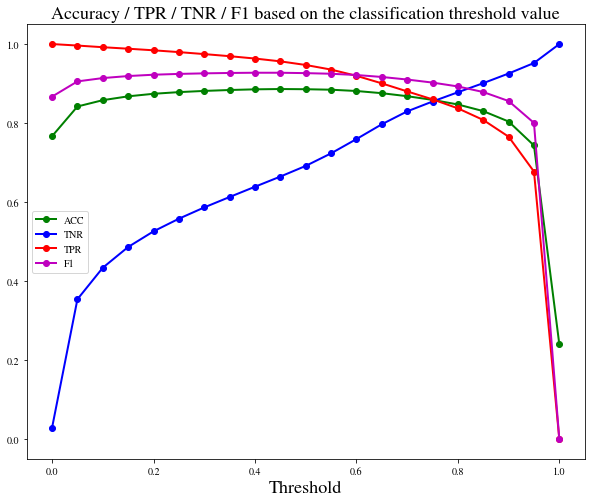

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194053


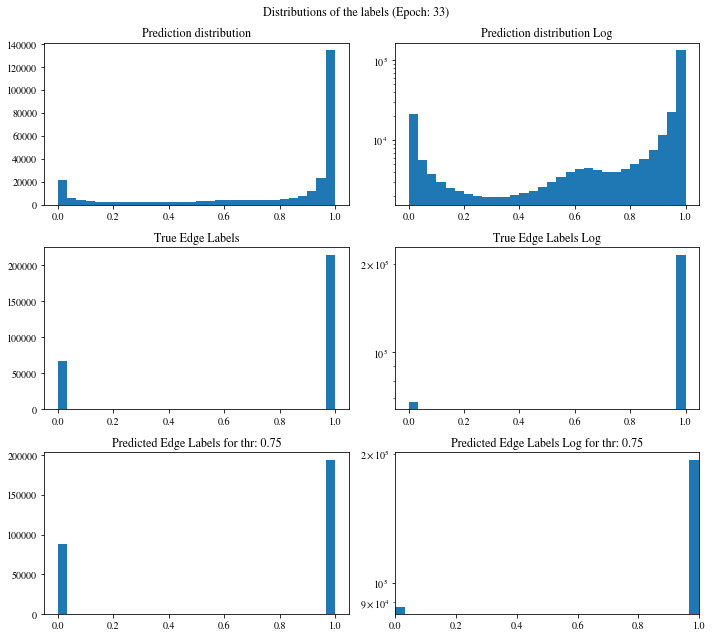

[0.99427539 0.99551433 0.98862797 ... 0.99375075 0.9936406  0.99089909]
Confusion matrix:
[[ 57858   9842]
 [ 29956 184211]]

Confusion matrix weighted:
[[0.42731167 0.07268833]
 [0.06993608 0.43006392]]

TN: 57858 	 FN: 29956 	 TP: 184211 	 FP: 9842
Confusion matrix scaled:
[[0.20526702 0.03491718]
 [0.10627707 0.65353873]]

Accuracy: 0.8588
Precision: 0.9493
Negative predictive value: 0.6589
Recall: Correctly classifying 86.0128 % of positive edges
True negative rate: Correctly classifying 85.4623 % of all negative edges
F1 score: 0.9025
[0.85935366 0.85541918] [0.85462334 0.86012784] [0.85698197 0.85776705]
Balanced accuracy: 0.8574
Precision weighted: [0.85935366 0.85541918]
Recall weighted: [0.85462334 0.86012784]
F1 score weighted: [0.85698197 0.85776705]
positive_likelihood_ratio: 5.916546946714502, negative_likelihood_ratio: 0.1636652658307559


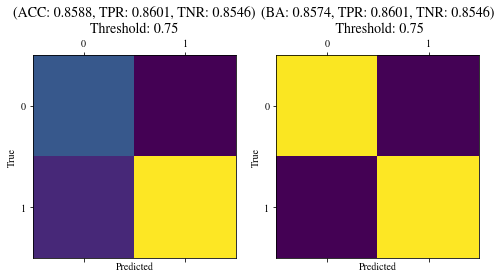

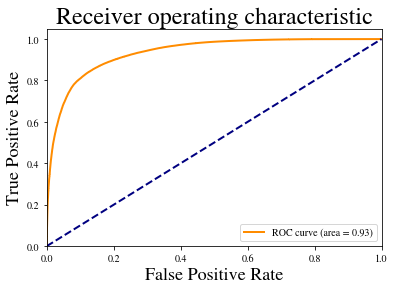

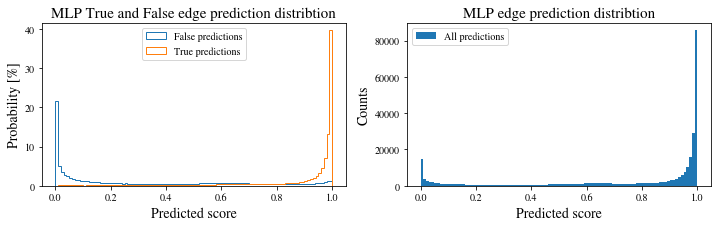

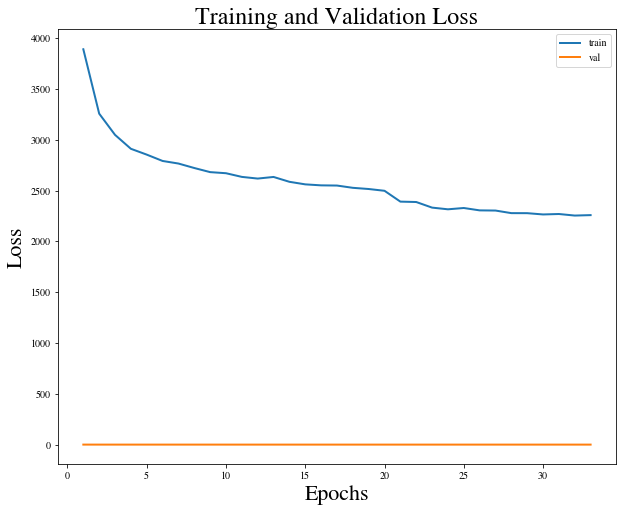

Training epoch 34: 100%|██████████| 12079/12079 [06:34<00:00, 30.61it/s]


Epoch: 34, train loss: 2231.2783
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_34_loss_2231.2783.pt
Epoch: 34, val loss: 0.2406


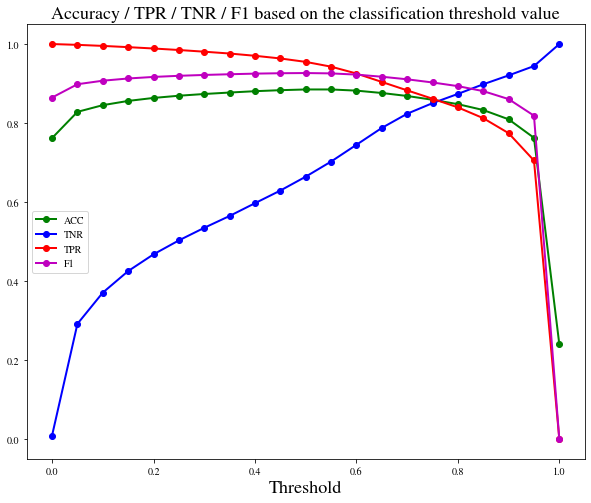

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194675


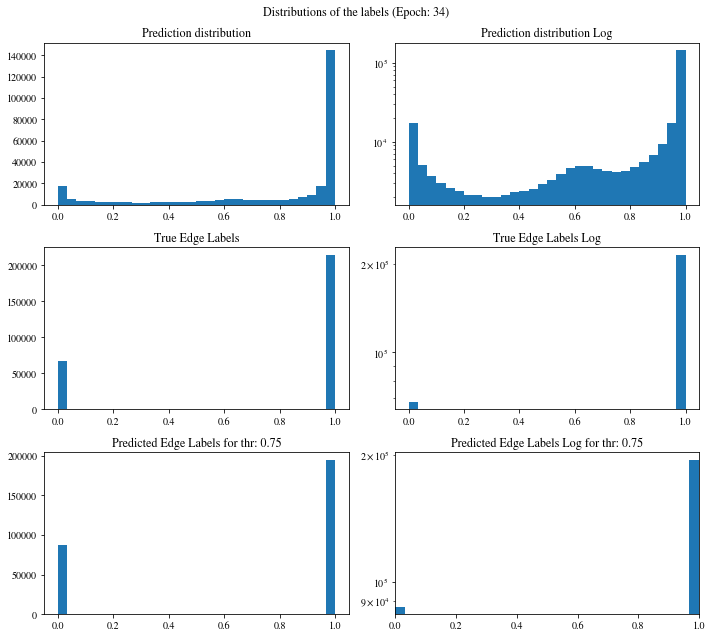

[0.99991846 0.99981207 0.99950457 ... 0.86794978 0.86964512 0.84108698]
Confusion matrix:
[[ 57579  10121]
 [ 29613 184554]]

Confusion matrix weighted:
[[0.42525111 0.07474889]
 [0.0691353  0.4308647 ]]

TN: 57579 	 FN: 29613 	 TP: 184554 	 FP: 10121
Confusion matrix scaled:
[[0.20427719 0.03590701]
 [0.10506019 0.65475561]]

Accuracy: 0.8590
Precision: 0.9480
Negative predictive value: 0.6604
Recall: Correctly classifying 86.1729 % of positive edges
True negative rate: Correctly classifying 85.0502 % of all negative edges
F1 score: 0.9028
[0.86015938 0.85216202] [0.85050222 0.8617294 ] [0.85530354 0.85691901]
Balanced accuracy: 0.8561
Precision weighted: [0.86015938 0.85216202]
Recall weighted: [0.85050222 0.8617294 ]
F1 score weighted: [0.85530354 0.85691901]
positive_likelihood_ratio: 5.764161668852757, negative_likelihood_ratio: 0.16257524009693197


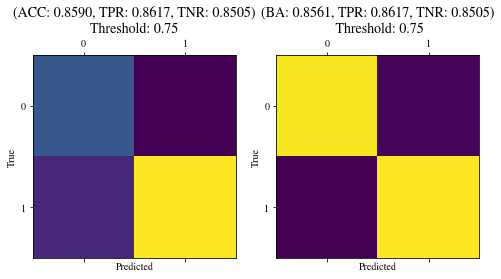

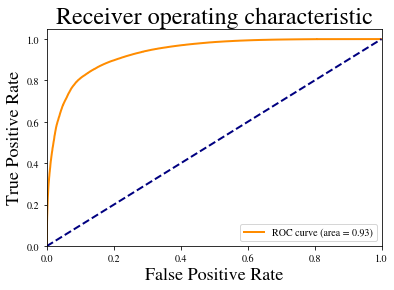

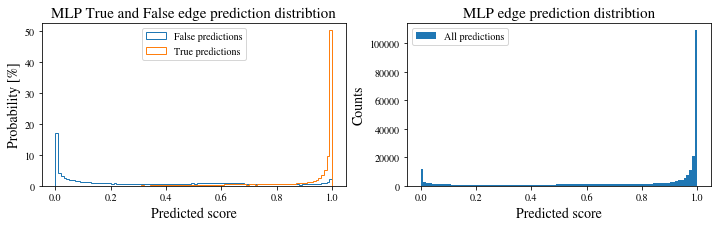

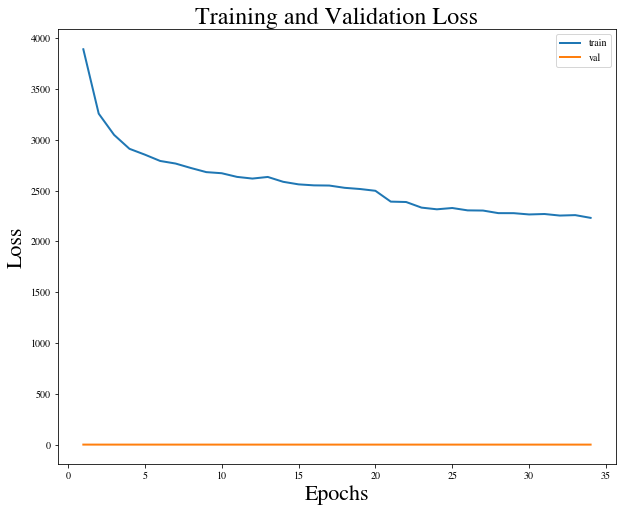

Training epoch 35: 100%|██████████| 12079/12079 [06:27<00:00, 31.13it/s]


Epoch: 35, train loss: 2237.6270
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_35_loss_2237.6270.pt
Epoch: 35, val loss: 0.2346


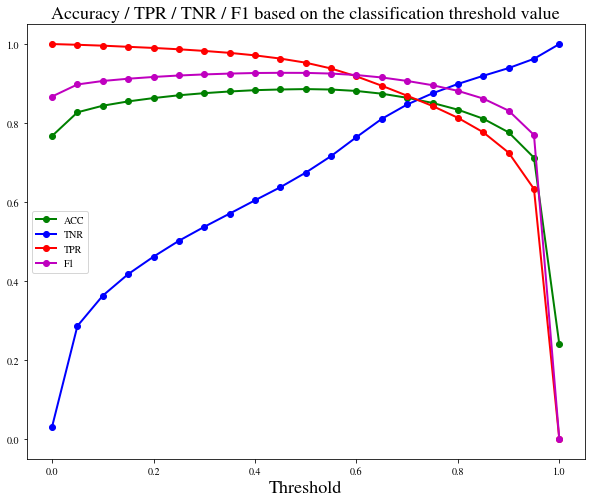

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 192756


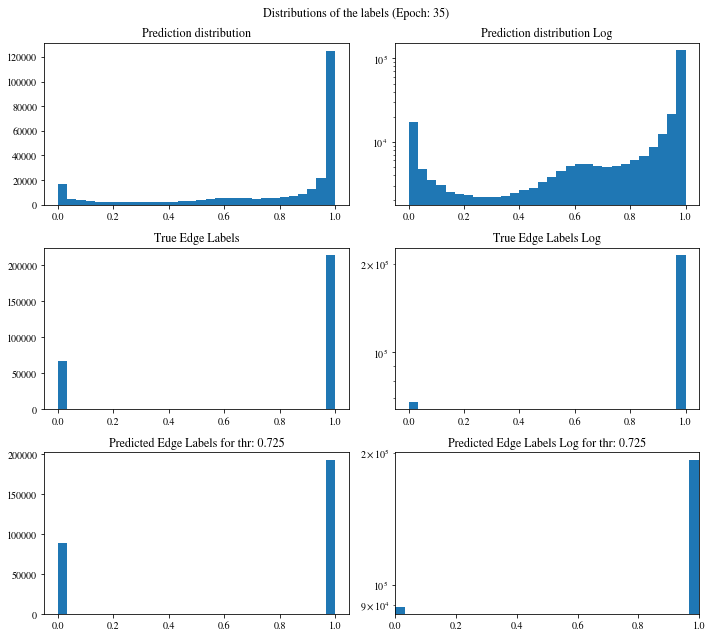

[0.99886405 0.99913341 0.9986487  ... 0.93421656 0.92293155 0.95978671]
Confusion matrix:
[[ 58358   9342]
 [ 30753 183414]]

Confusion matrix weighted:
[[0.43100443 0.06899557]
 [0.07179678 0.42820322]]

TN: 58358 	 FN: 30753 	 TP: 183414 	 FP: 9342
Confusion matrix scaled:
[[0.20704091 0.03314329]
 [0.10910465 0.65071115]]

Accuracy: 0.8578
Precision: 0.9515
Negative predictive value: 0.6549
Recall: Correctly classifying 85.6406 % of positive edges
True negative rate: Correctly classifying 86.2009 % of all negative edges
F1 score: 0.9015
[0.85720644 0.86123142] [0.86200886 0.85640645] [0.85960094 0.85881216]
Balanced accuracy: 0.8592
Precision weighted: [0.85720644 0.86123142]
Recall weighted: [0.86200886 0.85640645]
F1 score weighted: [0.85960094 0.85881216]
positive_likelihood_ratio: 6.2062424115822505, negative_likelihood_ratio: 0.16658013281809886


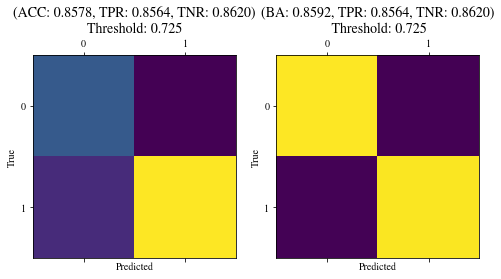

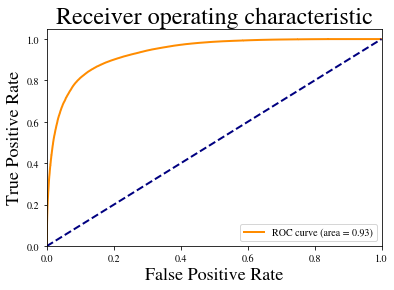

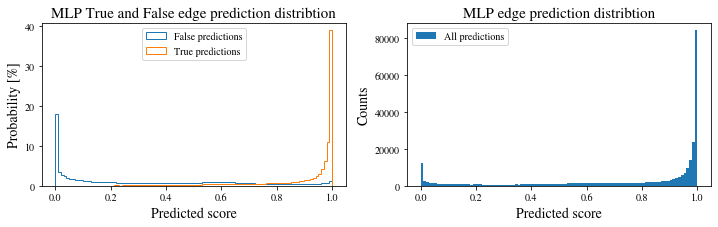

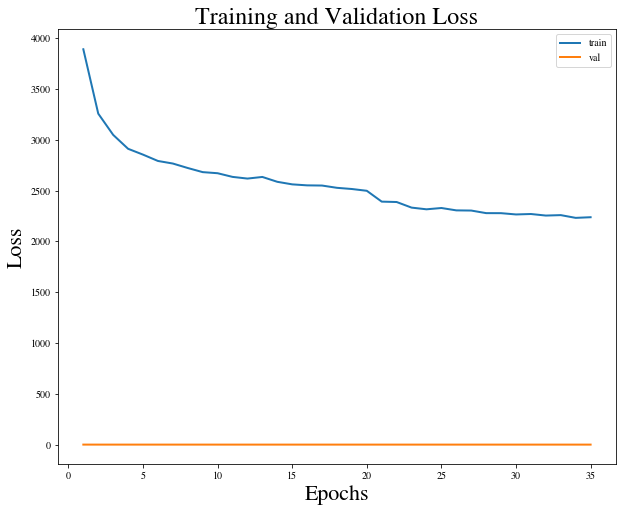

Training epoch 36: 100%|██████████| 12079/12079 [06:31<00:00, 30.84it/s]


Epoch: 36, train loss: 2233.5891
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_36_loss_2233.5891.pt
Epoch: 36, val loss: 0.2356


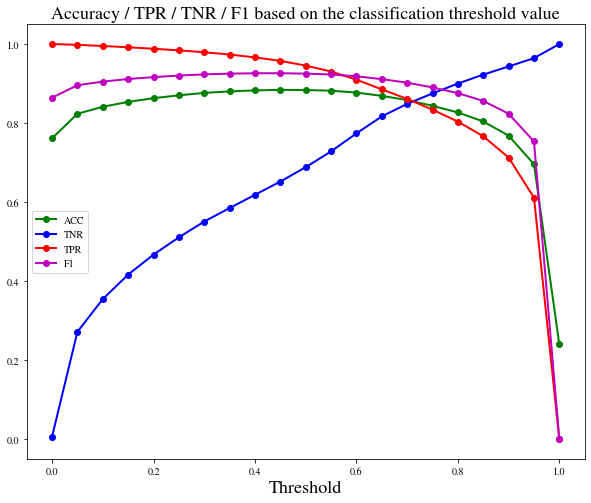

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194691


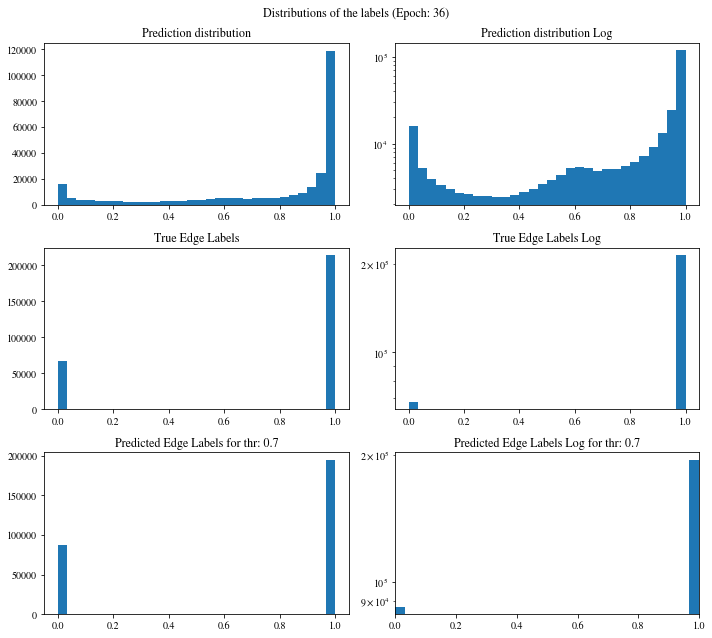

[0.99914563 0.99876142 0.99933392 ... 0.94656098 0.9407683  0.69307899]
Confusion matrix:
[[ 57454  10246]
 [ 29722 184445]]

Confusion matrix weighted:
[[0.42432792 0.07567208]
 [0.06938978 0.43061022]]

TN: 57454 	 FN: 29722 	 TP: 184445 	 FP: 10246
Confusion matrix scaled:
[[0.20383372 0.03635048]
 [0.1054469  0.6543689 ]]

Accuracy: 0.8582
Precision: 0.9474
Negative predictive value: 0.6591
Recall: Correctly classifying 86.1220 % of positive edges
True negative rate: Correctly classifying 84.8656 % of all negative edges
F1 score: 0.9022
[0.85945455 0.85053382] [0.84865583 0.86122045] [0.85402106 0.85584378]
Balanced accuracy: 0.8549
Precision weighted: [0.85945455 0.85053382]
Recall weighted: [0.84865583 0.86122045]
F1 score weighted: [0.85402106 0.85584378]
positive_likelihood_ratio: 5.690476715654901, negative_likelihood_ratio: 0.1635286589515071


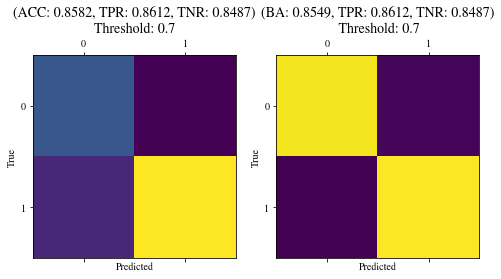

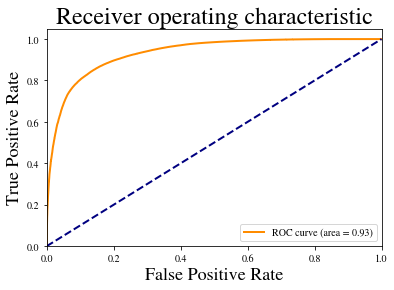

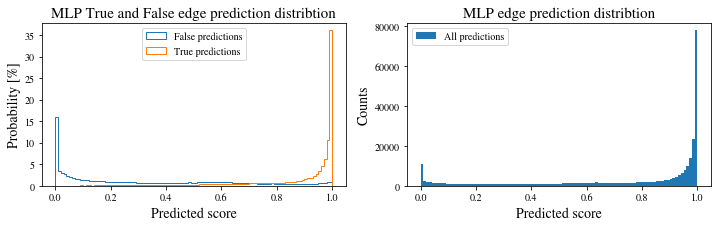

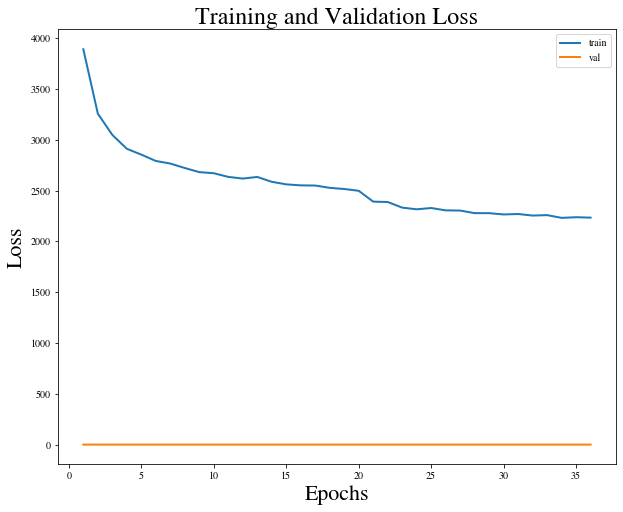

Training epoch 37: 100%|██████████| 12079/12079 [06:20<00:00, 31.75it/s]


Epoch: 37, train loss: 2224.4739
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_37_loss_2224.4739.pt
Epoch: 37, val loss: 0.2318


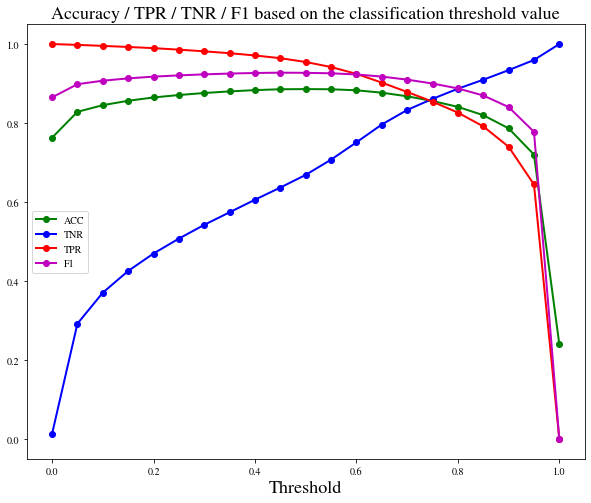

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192350


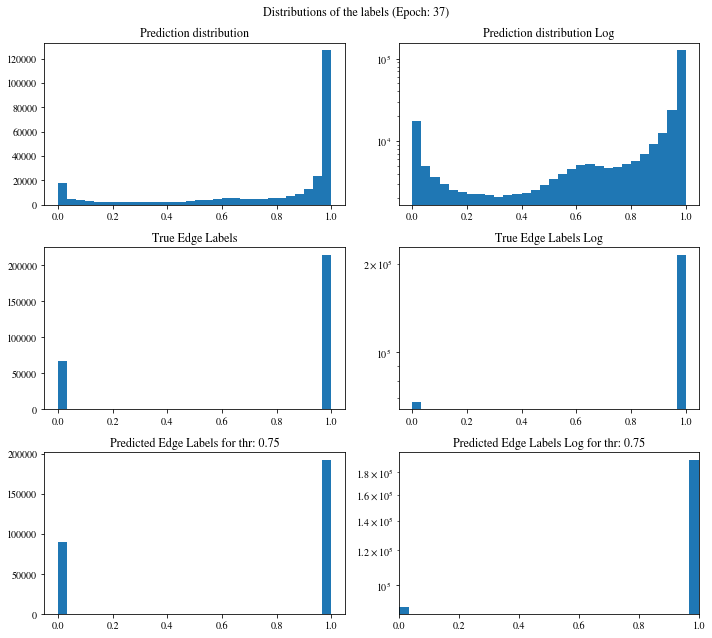

[0.97860515 0.91124964 0.86474961 ... 0.96842098 0.00325786 0.00529564]
Confusion matrix:
[[ 58310   9390]
 [ 31207 182960]]

Confusion matrix weighted:
[[0.43064993 0.06935007]
 [0.0728567  0.4271433 ]]

TN: 58310 	 FN: 31207 	 TP: 182960 	 FP: 9390
Confusion matrix scaled:
[[0.20687062 0.03331358]
 [0.11071534 0.64910046]]

Accuracy: 0.8560
Precision: 0.9512
Negative predictive value: 0.6514
Recall: Correctly classifying 85.4287 % of positive edges
True negative rate: Correctly classifying 86.1300 % of all negative edges
F1 score: 0.9001
[0.85530141 0.86032024] [0.86129985 0.85428661] [0.85829015 0.85729281]
Balanced accuracy: 0.8578
Precision weighted: [0.85530141 0.86032024]
Recall weighted: [0.86129985 0.85428661]
F1 score weighted: [0.85829015 0.85729281]
positive_likelihood_ratio: 6.159233585658496, negative_likelihood_ratio: 0.16917847077116657


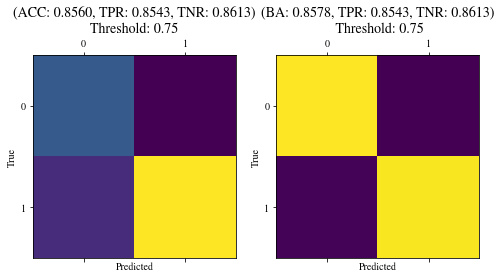

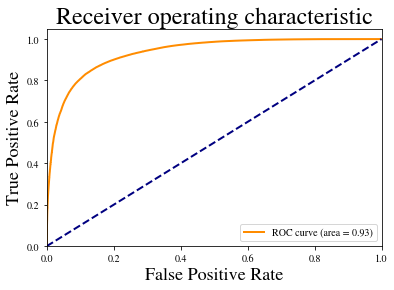

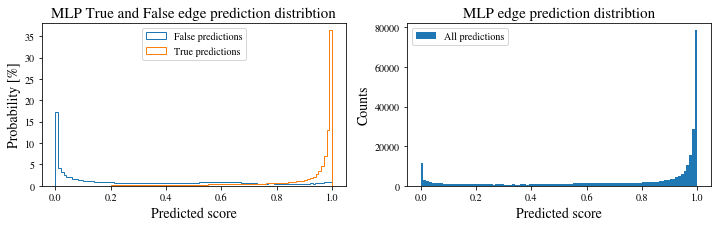

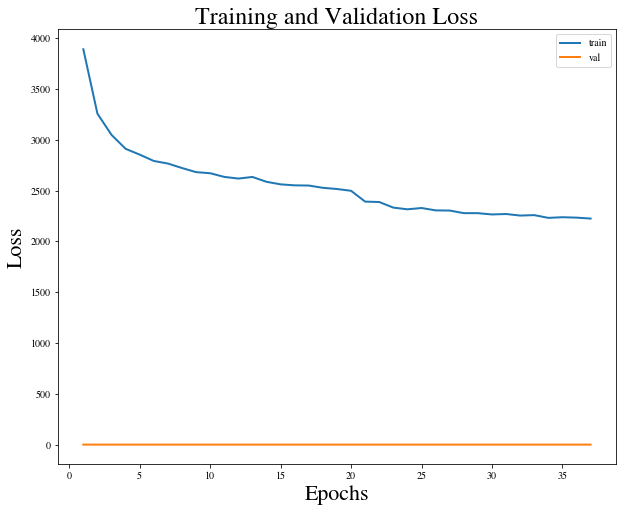

Training epoch 38: 100%|██████████| 12079/12079 [06:14<00:00, 32.29it/s]


Epoch: 38, train loss: 2236.8765
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_38_loss_2236.8765.pt
Epoch: 38, val loss: 0.2328


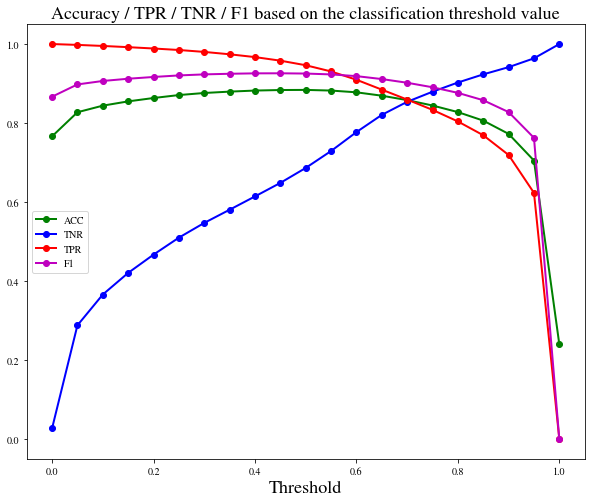

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 193986


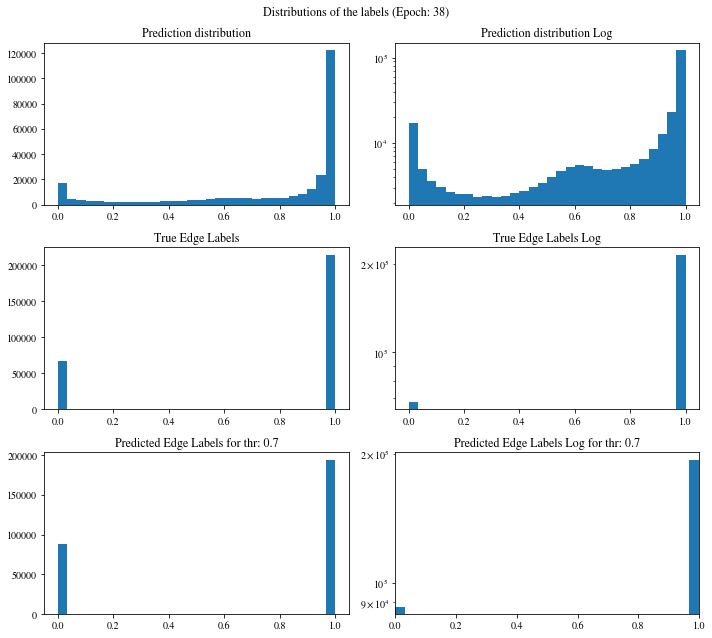

[0.99762279 0.99552554 0.99671847 ... 0.0493449  0.03239223 0.95759916]
Confusion matrix:
[[ 57809   9891]
 [ 30072 184095]]

Confusion matrix weighted:
[[0.42694978 0.07305022]
 [0.07020689 0.42979311]]

TN: 57809 	 FN: 30072 	 TP: 184095 	 FP: 9891
Confusion matrix scaled:
[[0.20509318 0.03509102]
 [0.10668862 0.65312718]]

Accuracy: 0.8582
Precision: 0.9490
Negative predictive value: 0.6578
Recall: Correctly classifying 85.9586 % of positive edges
True negative rate: Correctly classifying 85.3900 % of all negative edges
F1 score: 0.9021
[0.85878316 0.85472568] [0.85389956 0.85958621] [0.8563344  0.85714906]
Balanced accuracy: 0.8567
Precision weighted: [0.85878316 0.85472568]
Recall weighted: [0.85389956 0.85958621]
F1 score weighted: [0.8563344  0.85714906]
positive_likelihood_ratio: 5.883529114195081, negative_likelihood_ratio: 0.1644382973498322


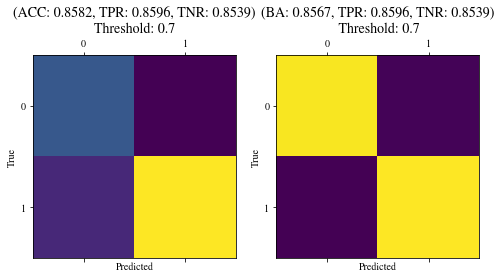

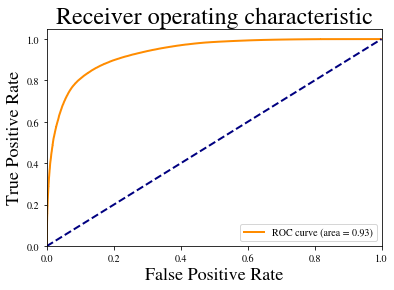

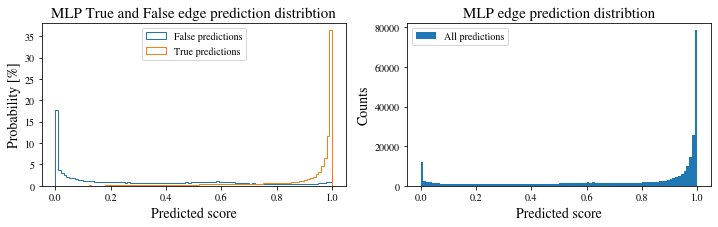

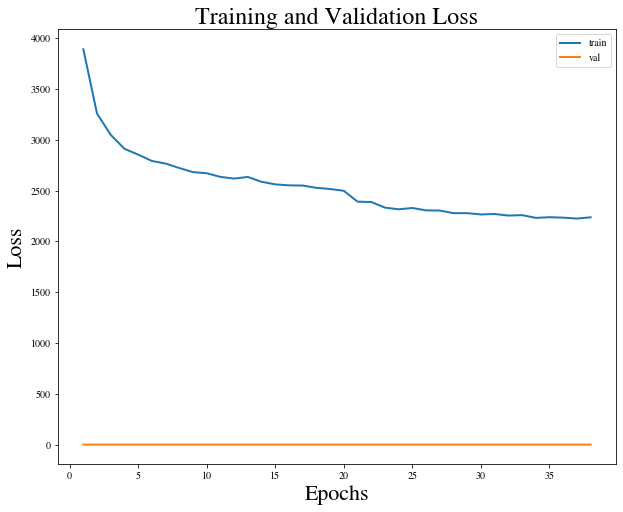

Training epoch 39: 100%|██████████| 12079/12079 [06:25<00:00, 31.34it/s]


Epoch: 39, train loss: 2234.9304
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_39_loss_2234.9304.pt
Epoch: 39, val loss: 0.2328


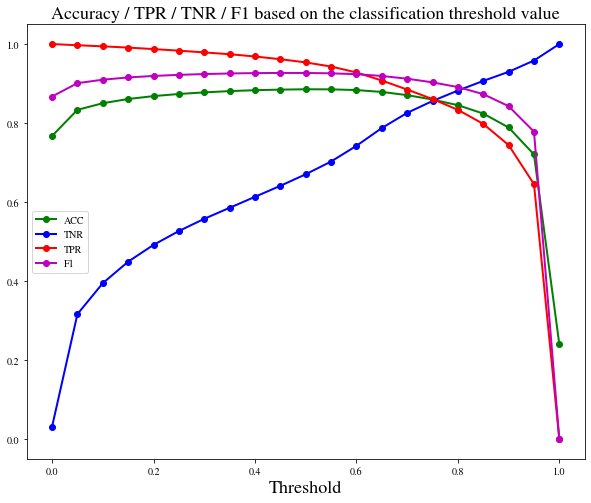

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194113


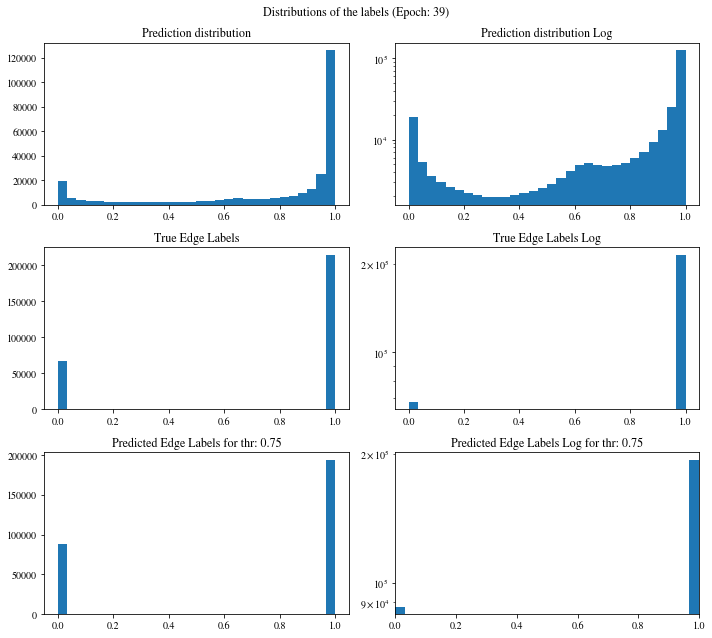

[0.99951565 0.98553574 0.98983383 ... 0.99989617 0.99818379 0.9312886 ]
Confusion matrix:
[[ 57948   9752]
 [ 29806 184361]]

Confusion matrix weighted:
[[0.42797637 0.07202363]
 [0.06958588 0.43041412]]

TN: 57948 	 FN: 29806 	 TP: 184361 	 FP: 9752
Confusion matrix scaled:
[[0.20558632 0.03459788]
 [0.10574491 0.65407089]]

Accuracy: 0.8597
Precision: 0.9498
Negative predictive value: 0.6603
Recall: Correctly classifying 86.0828 % of positive edges
True negative rate: Correctly classifying 85.5953 % of all negative edges
F1 score: 0.9031
[0.86014638 0.85665163] [0.85595273 0.86082823] [0.85804443 0.85873485]
Balanced accuracy: 0.8584
Precision weighted: [0.86014638 0.85665163]
Recall weighted: [0.85595273 0.86082823]
F1 score weighted: [0.85804443 0.85873485]
positive_likelihood_ratio: 5.976012235251942, negative_likelihood_ratio: 0.16259281911063475


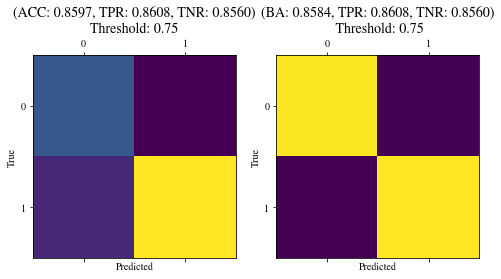

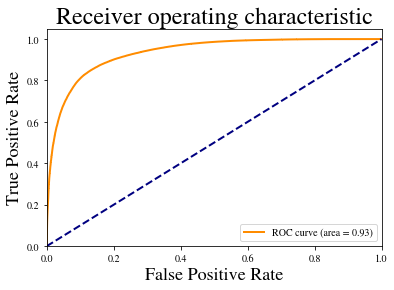

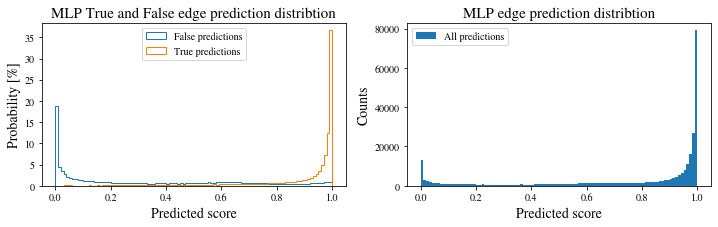

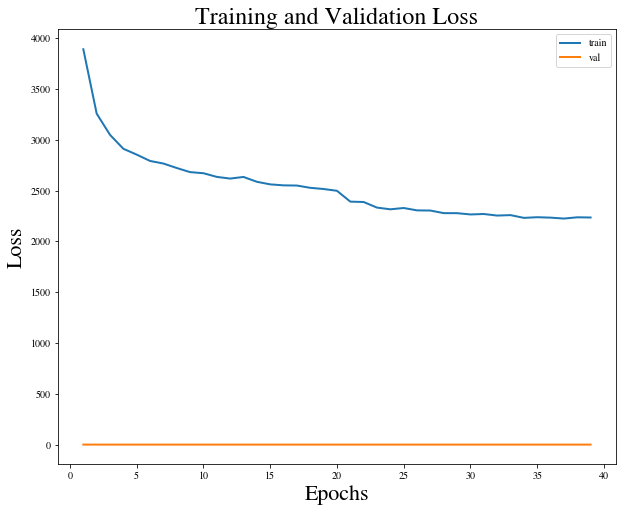

Training epoch 40: 100%|██████████| 12079/12079 [06:20<00:00, 31.73it/s]


Epoch: 40, train loss: 2214.0640
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_40_loss_2214.0640.pt
Epoch: 40, val loss: 0.2342


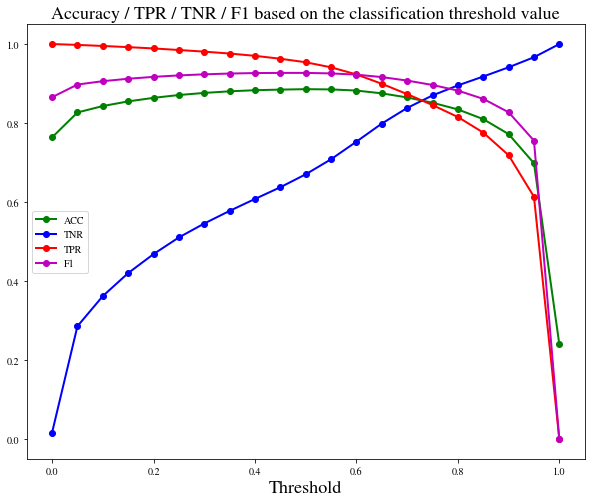

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193950


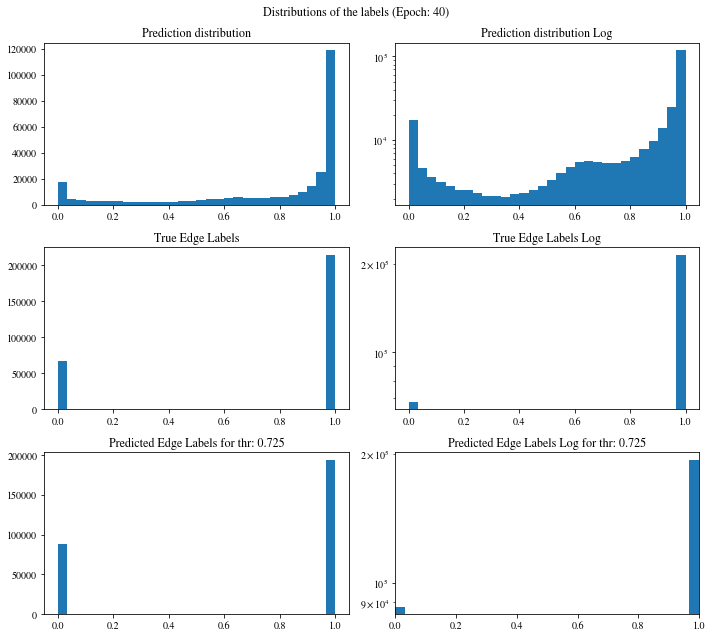

[0.99226975 0.994017   0.99232554 ... 0.96201134 0.85140133 0.9762308 ]
Confusion matrix:
[[ 57880   9820]
 [ 30037 184130]]

Confusion matrix weighted:
[[0.42747415 0.07252585]
 [0.07012518 0.42987482]]

TN: 57880 	 FN: 30037 	 TP: 184130 	 FP: 9820
Confusion matrix scaled:
[[0.20534507 0.03483913]
 [0.10656444 0.65325136]]

Accuracy: 0.8586
Precision: 0.9494
Negative predictive value: 0.6583
Recall: Correctly classifying 85.9750 % of positive edges
True negative rate: Correctly classifying 85.4948 % of all negative edges
F1 score: 0.9023
[0.859073   0.85564142] [0.8549483  0.85974963] [0.85700569 0.85769061]
Balanced accuracy: 0.8573
Precision weighted: [0.859073   0.85564142]
Recall weighted: [0.8549483  0.85974963]
F1 score weighted: [0.85700569 0.85769061]
positive_likelihood_ratio: 5.9271945279545015, negative_likelihood_ratio: 0.16404543426894944


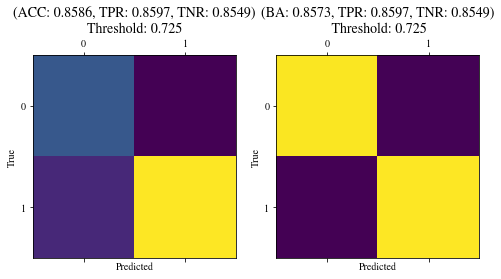

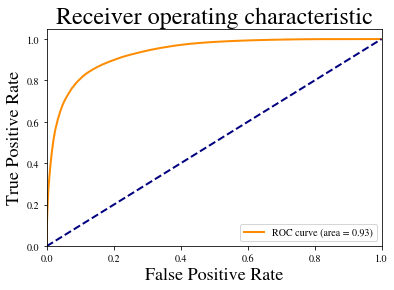

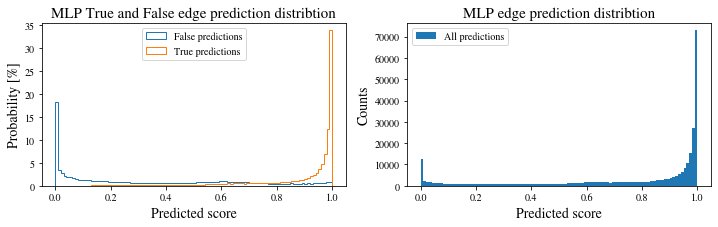

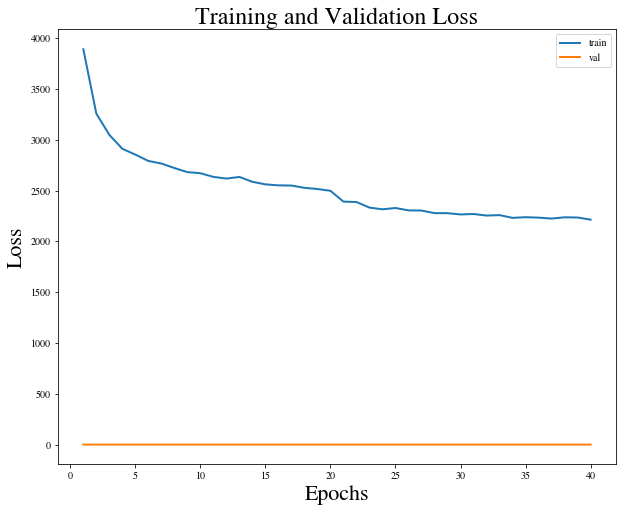

Training epoch 41: 100%|██████████| 12079/12079 [06:34<00:00, 30.58it/s]


Epoch: 41, train loss: 2145.5623
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_41_loss_2145.5623.pt
Epoch: 41, val loss: 0.2342


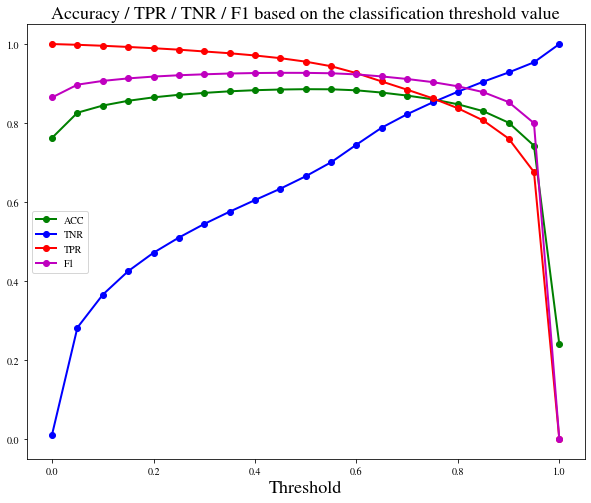

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194814


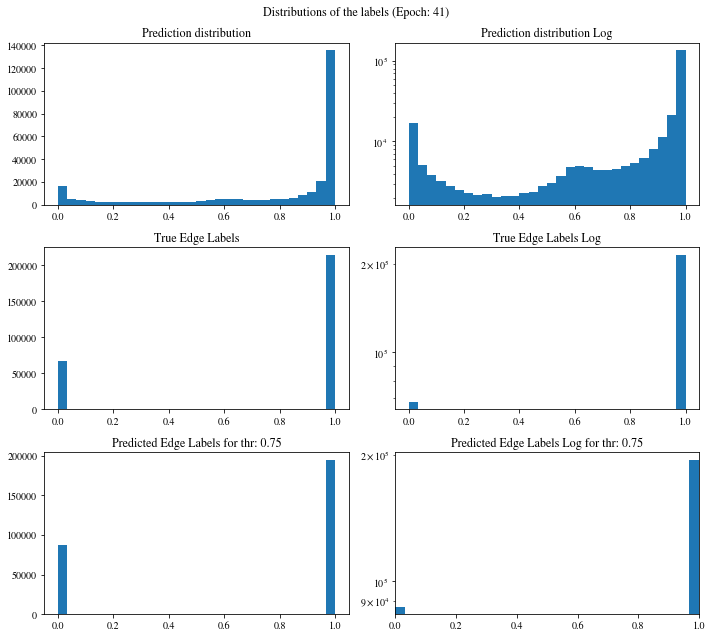

[0.9917984  0.96710354 0.99456882 ... 0.70153451 0.72379941 0.6561445 ]
Confusion matrix:
[[ 57700  10000]
 [ 29353 184814]]

Confusion matrix weighted:
[[0.42614476 0.07385524]
 [0.0685283  0.4314717 ]]

TN: 57700 	 FN: 29353 	 TP: 184814 	 FP: 10000
Confusion matrix scaled:
[[0.20470648 0.03547773]
 [0.10413777 0.65567803]]

Accuracy: 0.8604
Precision: 0.9487
Negative predictive value: 0.6628
Recall: Correctly classifying 86.2943 % of positive edges
True negative rate: Correctly classifying 85.2290 % of all negative edges
F1 score: 0.9038
[0.86146749 0.85384661] [0.85228951 0.8629434 ] [0.85685393 0.85837091]
Balanced accuracy: 0.8576
Precision weighted: [0.86146749 0.85384661]
Recall weighted: [0.85228951 0.8629434 ]
F1 score weighted: [0.85685393 0.85837091]
positive_likelihood_ratio: 5.842126844938763, negative_likelihood_ratio: 0.16080990555654026


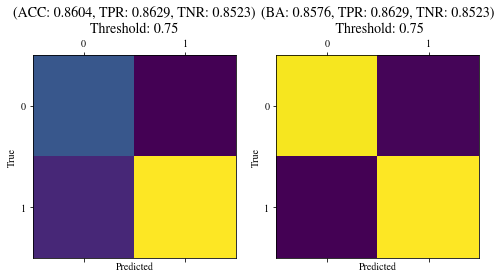

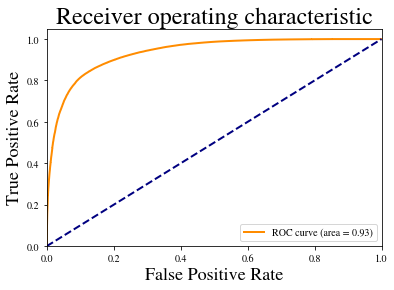

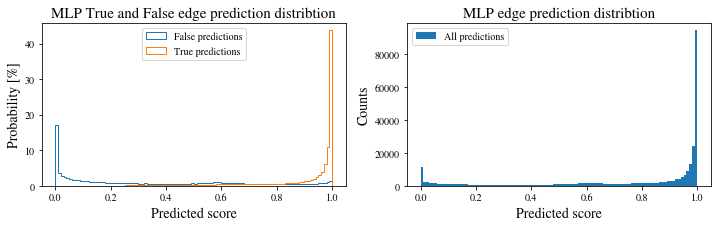

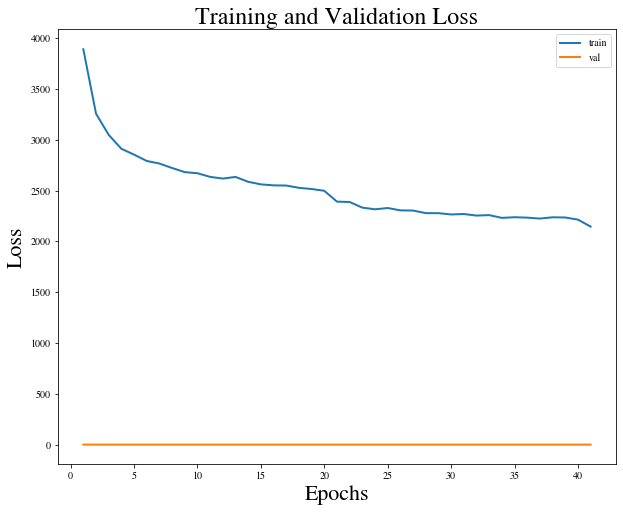

Training epoch 42: 100%|██████████| 12079/12079 [06:27<00:00, 31.14it/s]


Epoch: 42, train loss: 2122.7639
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_42_loss_2122.7639.pt
Epoch: 42, val loss: 0.2345


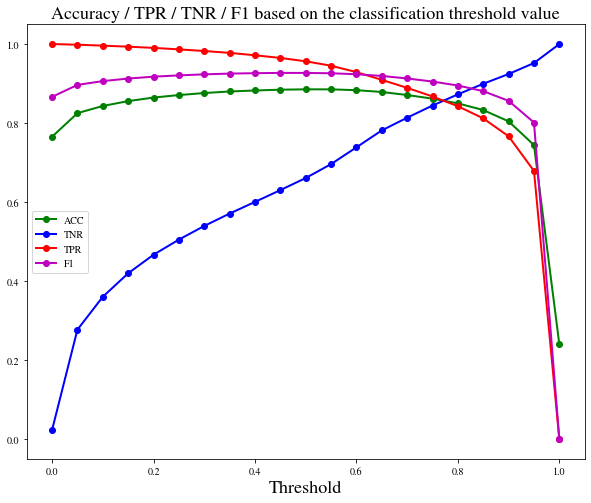

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 192816


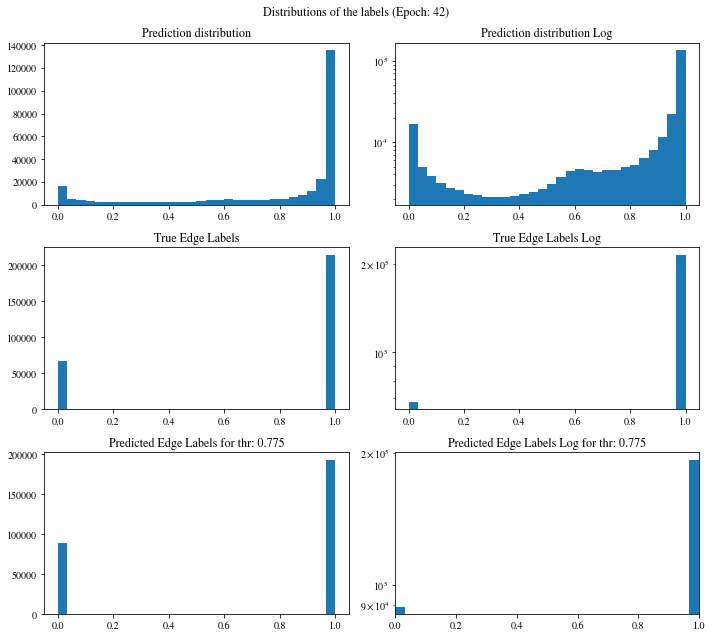

[0.02905945 0.99895692 0.99480271 ... 0.95009995 0.01954065 0.01892809]
Confusion matrix:
[[ 58141   9559]
 [ 30910 183257]]

Confusion matrix weighted:
[[0.42940177 0.07059823]
 [0.07216331 0.42783669]]

TN: 58141 	 FN: 30910 	 TP: 183257 	 FP: 9559
Confusion matrix scaled:
[[0.20627104 0.03391316]
 [0.10966165 0.65015415]]

Accuracy: 0.8564
Precision: 0.9504
Negative predictive value: 0.6529
Recall: Correctly classifying 85.5673 % of positive edges
True negative rate: Correctly classifying 85.8804 % of all negative edges
F1 score: 0.9006
[0.85612373 0.85836019] [0.85880355 0.85567338] [0.85746155 0.85701468]
Balanced accuracy: 0.8572
Precision weighted: [0.85612373 0.85836019]
Recall weighted: [0.85880355 0.85567338]
F1 score weighted: [0.85746155 0.85701468]
positive_likelihood_ratio: 6.060161897812182, negative_likelihood_ratio: 0.16805545860603285


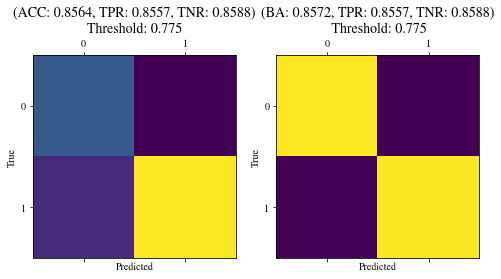

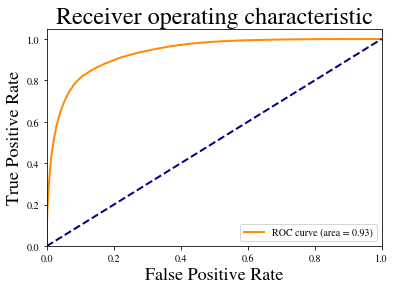

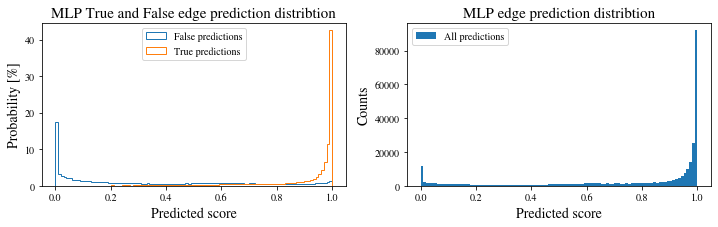

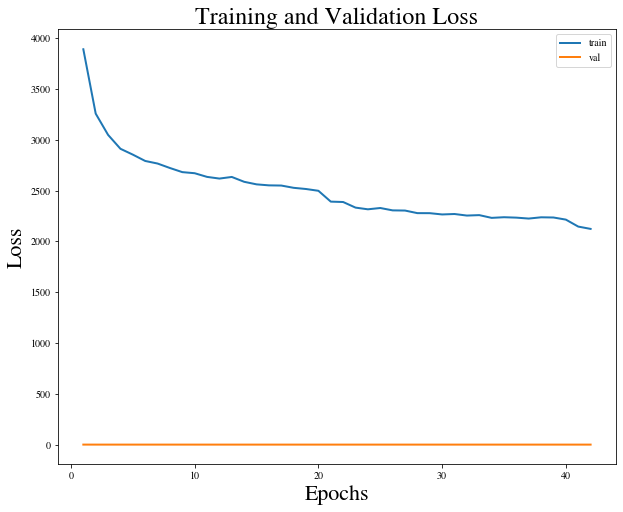

Training epoch 43: 100%|██████████| 12079/12079 [06:15<00:00, 32.20it/s]


Epoch: 43, train loss: 2116.4043
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_43_loss_2116.4043.pt
Epoch: 43, val loss: 0.2331


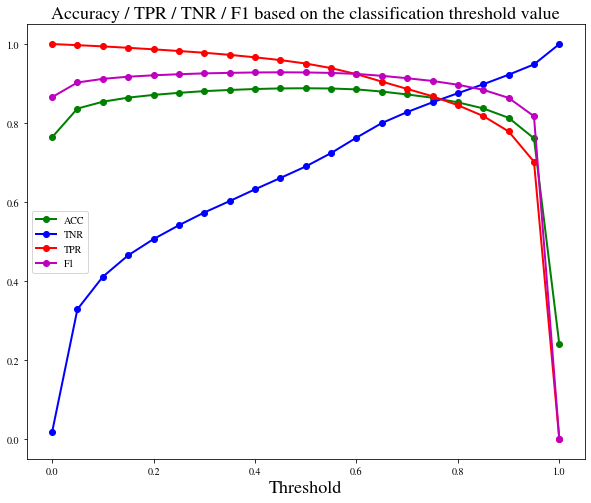

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 195832


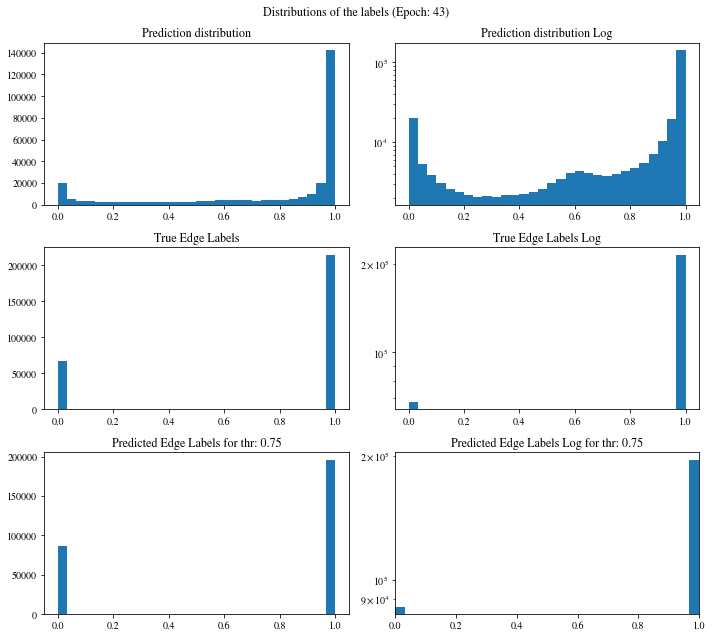

[0.99727976 0.99998653 0.99565923 ... 0.98098856 0.99342841 0.98431373]
Confusion matrix:
[[ 57729   9971]
 [ 28306 185861]]

Confusion matrix weighted:
[[0.42635894 0.07364106]
 [0.06608394 0.43391606]]

TN: 57729 	 FN: 28306 	 TP: 185861 	 FP: 9971
Confusion matrix scaled:
[[0.20480936 0.03537484]
 [0.10042325 0.65939255]]

Accuracy: 0.8642
Precision: 0.9491
Negative predictive value: 0.6710
Recall: Correctly classifying 86.7832 % of positive edges
True negative rate: Correctly classifying 85.2718 % of all negative edges
F1 score: 0.9066
[0.86580384 0.85491079] [0.85271787 0.86783211] [0.85921103 0.86132299]
Balanced accuracy: 0.8603
Precision weighted: [0.86580384 0.85491079]
Recall weighted: [0.85271787 0.86783211]
F1 score weighted: [0.85921103 0.86132299]
positive_likelihood_ratio: 5.892311102628127, negative_likelihood_ratio: 0.15499603311498464


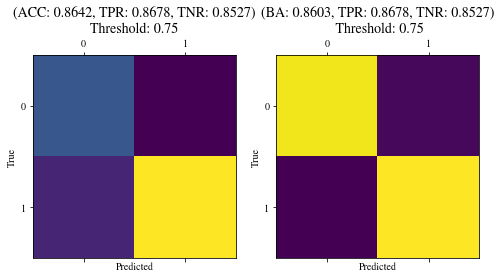

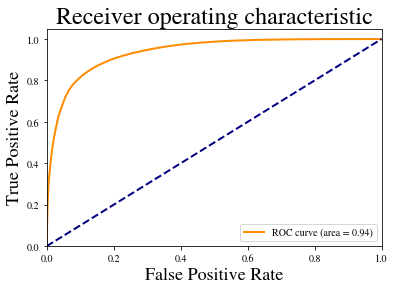

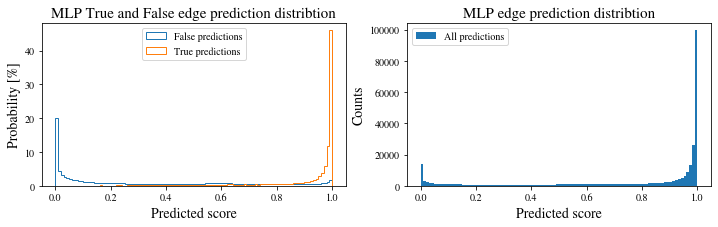

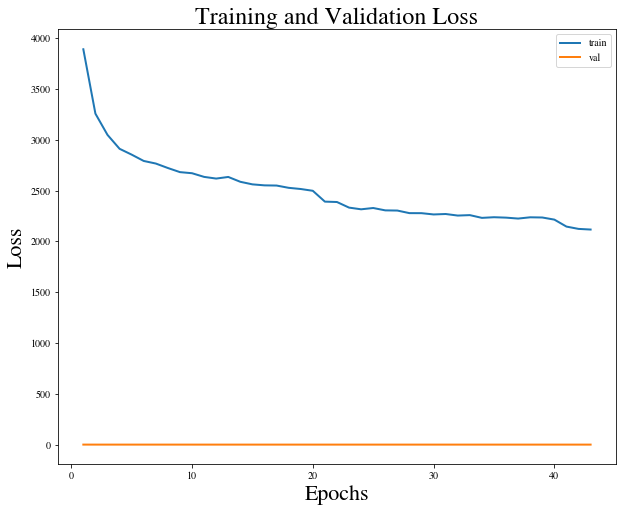

Training epoch 44: 100%|██████████| 12079/12079 [06:18<00:00, 31.93it/s]


Epoch: 44, train loss: 2099.5542
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_44_loss_2099.5542.pt
Epoch: 44, val loss: 0.2328


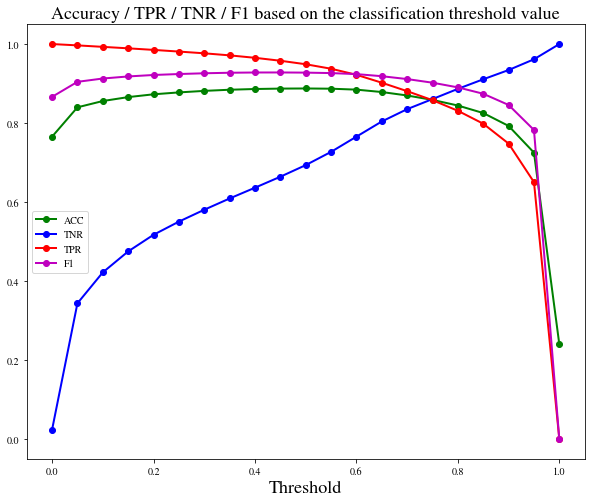

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 193182


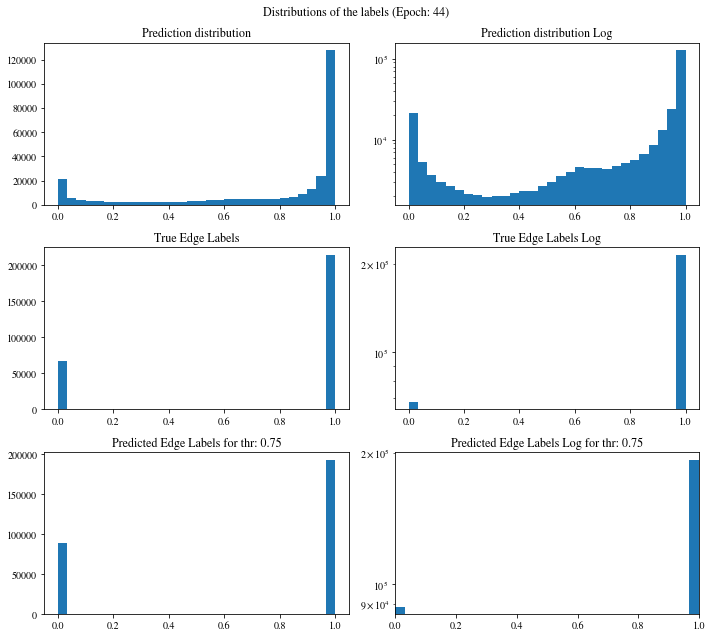

[7.02921987e-01 9.94745612e-01 9.88778055e-01 ... 9.56669390e-01
 3.96127842e-04 7.70000741e-04]
Confusion matrix:
[[ 58279   9421]
 [ 30406 183761]]

Confusion matrix weighted:
[[0.43042097 0.06957903]
 [0.07098666 0.42901334]]

TN: 58279 	 FN: 30406 	 TP: 183761 	 FP: 9421
Confusion matrix scaled:
[[0.20676064 0.03342357]
 [0.10787357 0.65194223]]

Accuracy: 0.8587
Precision: 0.9512
Negative predictive value: 0.6571
Recall: Correctly classifying 85.8027 % of positive edges
True negative rate: Correctly classifying 86.0842 % of all negative edges
F1 score: 0.9022
[0.85842525 0.86044908] [0.86084195 0.85802668] [0.8596319  0.85923617]
Balanced accuracy: 0.8594
Precision weighted: [0.85842525 0.86044908]
Recall weighted: [0.86084195 0.85802668]
F1 score weighted: [0.8596319  0.85923617]
positive_likelihood_ratio: 6.165842930020772, negative_likelihood_ratio: 0.16492379341228075


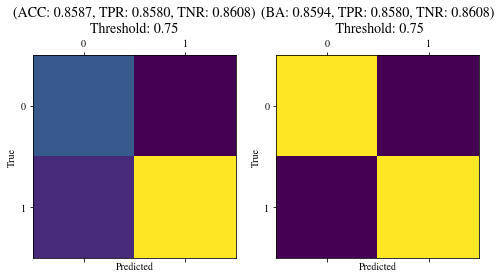

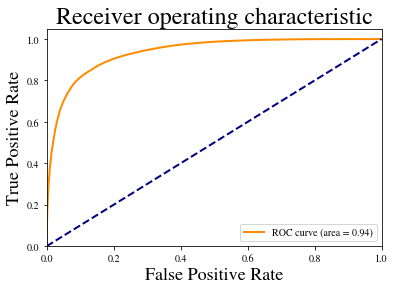

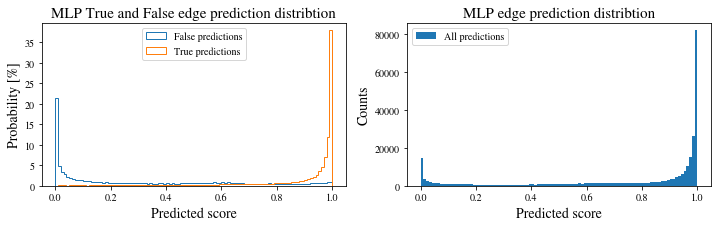

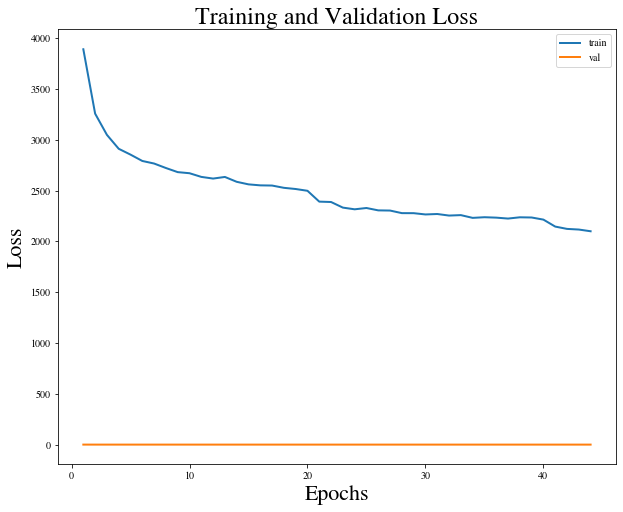

Training epoch 45: 100%|██████████| 12079/12079 [06:27<00:00, 31.14it/s]


Epoch: 45, train loss: 2101.5317
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_45_loss_2101.5317.pt
Epoch: 45, val loss: 0.2328


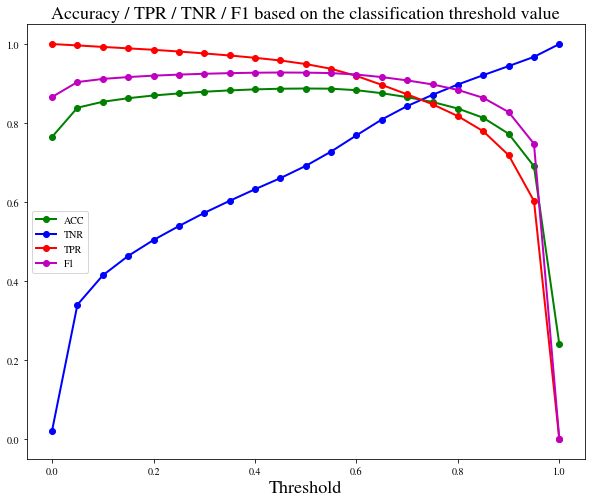

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193925


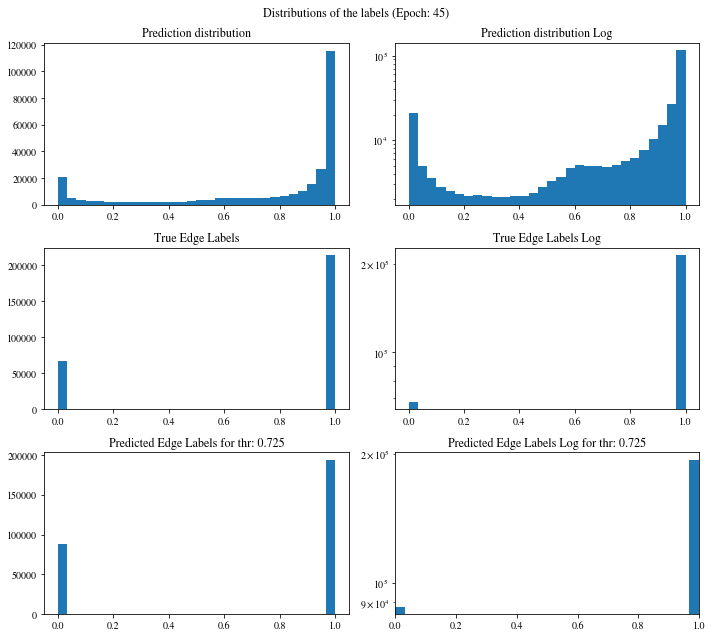

[0.98416996 0.95587206 0.88512152 ... 0.99470192 0.91480696 0.87688893]
Confusion matrix:
[[ 58082   9618]
 [ 29860 184307]]

Confusion matrix weighted:
[[0.42896603 0.07103397]
 [0.06971195 0.43028805]]

TN: 58082 	 FN: 29860 	 TP: 184307 	 FP: 9618
Confusion matrix scaled:
[[0.20606172 0.03412248]
 [0.10593649 0.65387931]]

Accuracy: 0.8599
Precision: 0.9504
Negative predictive value: 0.6605
Recall: Correctly classifying 86.0576 % of positive edges
True negative rate: Correctly classifying 85.7932 % of all negative edges
F1 score: 0.9033
[0.86020647 0.8583067 ] [0.85793205 0.86057609] [0.85906776 0.8594399 ]
Balanced accuracy: 0.8593
Precision weighted: [0.86020647 0.8583067 ]
Recall weighted: [0.85793205 0.86057609]
F1 score weighted: [0.85906776 0.8594399 ]
positive_likelihood_ratio: 6.057496512942017, negative_likelihood_ratio: 0.16251159633834364


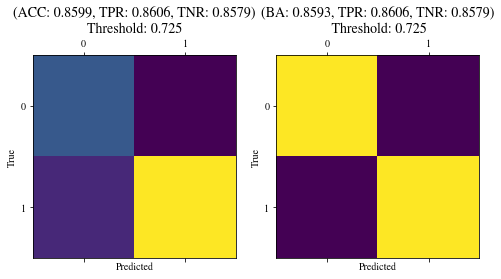

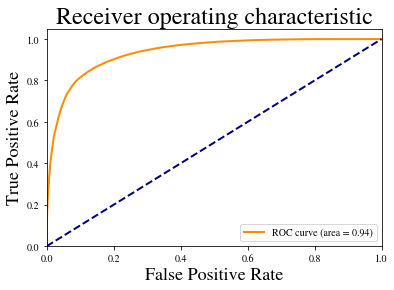

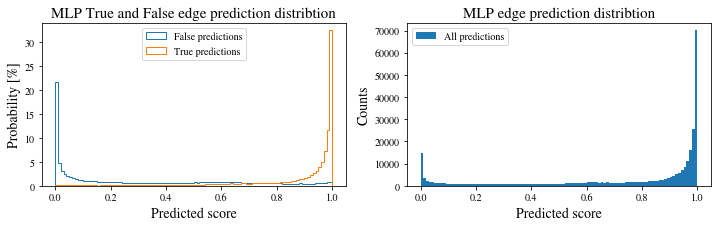

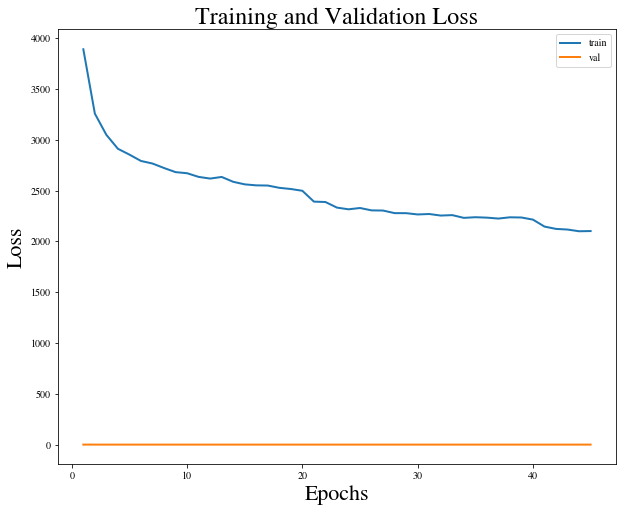

Training epoch 46: 100%|██████████| 12079/12079 [06:27<00:00, 31.19it/s]


Epoch: 46, train loss: 2105.8843
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_46_loss_2105.8843.pt
Epoch: 46, val loss: 0.2318


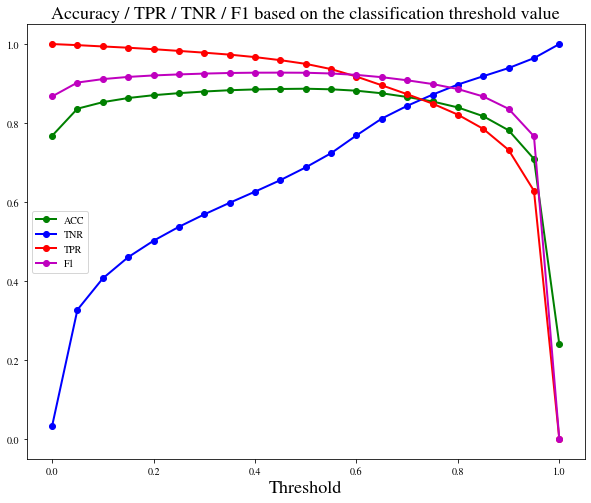

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 194146


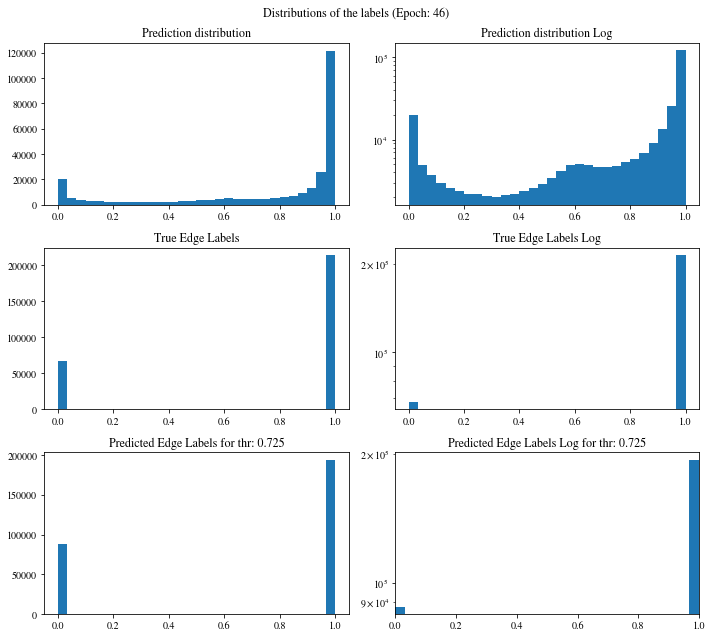

[0.9616676  0.9741255  0.96995014 ... 0.92326993 0.00408704 0.00381386]
Confusion matrix:
[[ 58063   9637]
 [ 29658 184509]]

Confusion matrix weighted:
[[0.4288257  0.0711743 ]
 [0.06924036 0.43075964]]

TN: 58063 	 FN: 29658 	 TP: 184509 	 FP: 9637
Confusion matrix scaled:
[[0.20599432 0.03418988]
 [0.10521984 0.65459596]]

Accuracy: 0.8606
Precision: 0.9504
Negative predictive value: 0.6619
Recall: Correctly classifying 86.1519 % of positive edges
True negative rate: Correctly classifying 85.7651 % of all negative edges
F1 score: 0.9038
[0.86098158 0.85819987] [0.8576514  0.86151928] [0.85931326 0.85985637]
Balanced accuracy: 0.8596
Precision weighted: [0.86098158 0.85819987]
Recall weighted: [0.8576514  0.86151928]
F1 score weighted: [0.85931326 0.85985637]
positive_likelihood_ratio: 6.05217965859447, negative_likelihood_ratio: 0.16146504021709332


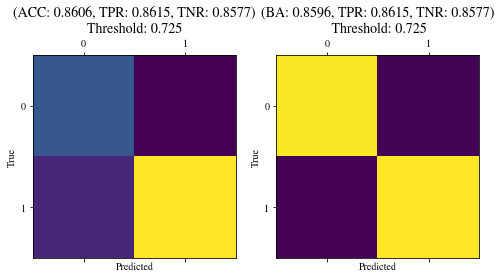

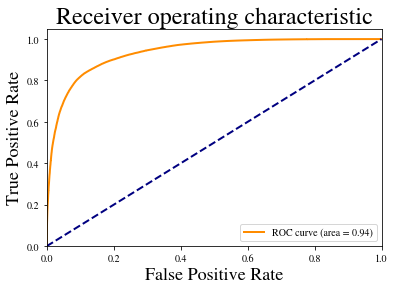

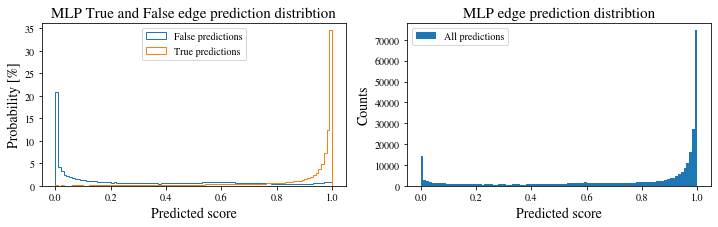

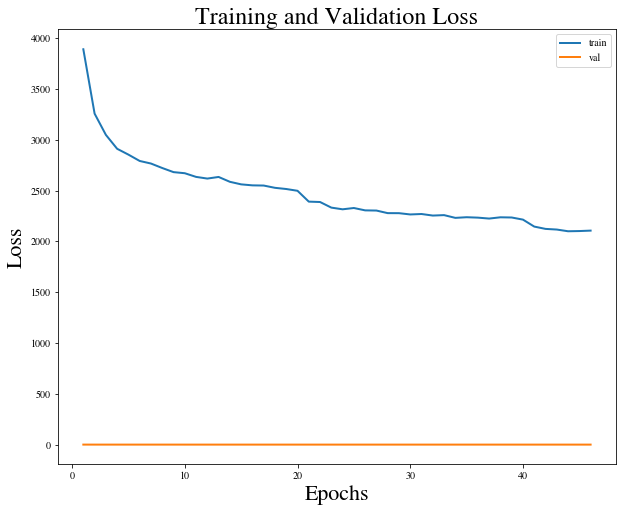

Training epoch 47: 100%|██████████| 12079/12079 [06:34<00:00, 30.66it/s]


Epoch: 47, train loss: 2091.3533
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_47_loss_2091.3533.pt
Epoch: 47, val loss: 0.2322


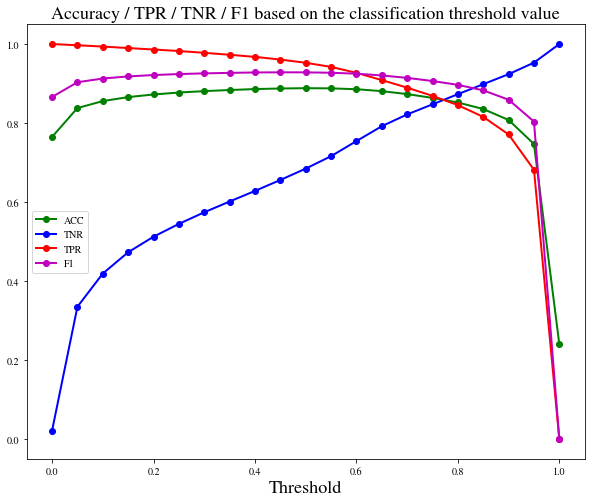

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 193196


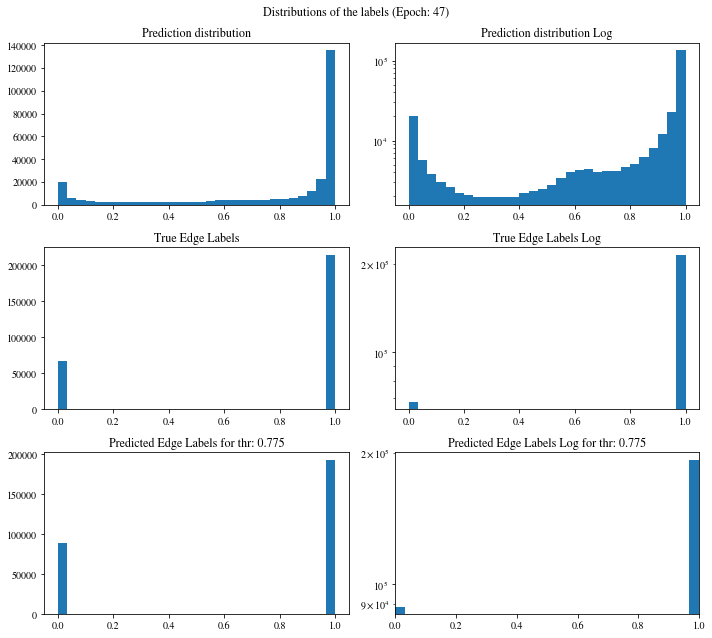

[8.50596577e-02 7.54577637e-01 9.46349978e-01 ... 4.54063520e-05
 5.29711783e-01 1.19034533e-16]
Confusion matrix:
[[ 58227   9473]
 [ 30444 183723]]

Confusion matrix weighted:
[[0.43003693 0.06996307]
 [0.07107538 0.42892462]]

TN: 58227 	 FN: 30444 	 TP: 183723 	 FP: 9473
Confusion matrix scaled:
[[0.20657615 0.03360805]
 [0.10800839 0.65180741]]

Accuracy: 0.8584
Precision: 0.9510
Negative predictive value: 0.6567
Recall: Correctly classifying 85.7849 % of positive edges
True negative rate: Correctly classifying 86.0074 % of all negative edges
F1 score: 0.9020
[0.85816478 0.85976188] [0.86007386 0.85784925] [0.85911826 0.8588045 ]
Balanced accuracy: 0.8590
Precision weighted: [0.85816478 0.85976188]
Recall weighted: [0.86007386 0.85784925]
F1 score weighted: [0.85911826 0.8588045 ]
positive_likelihood_ratio: 6.130728821106701, negative_likelihood_ratio: 0.16527737780851187


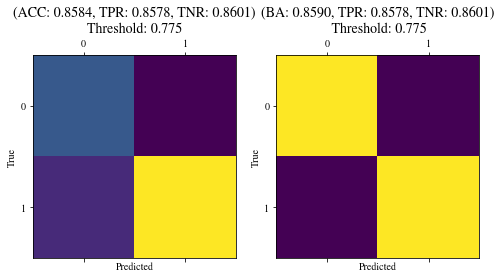

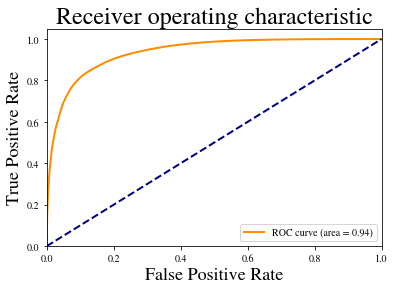

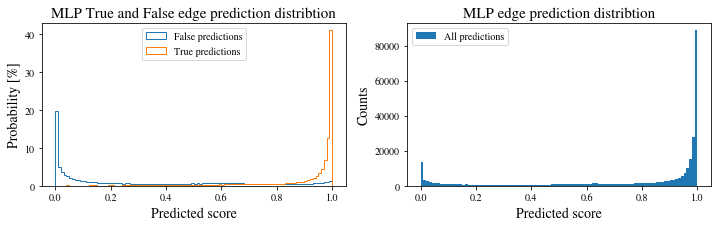

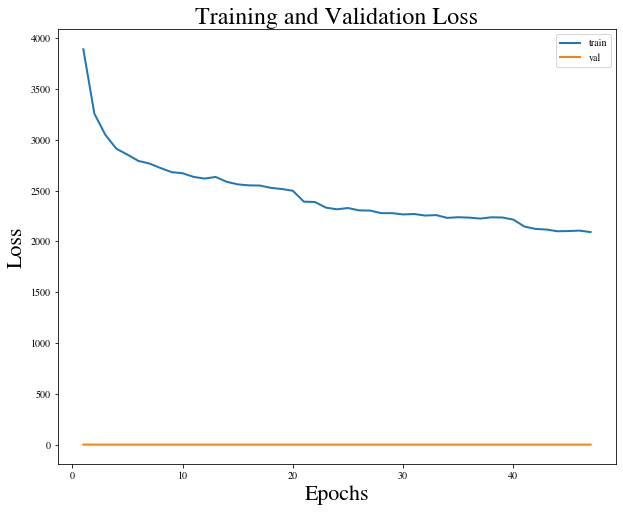

Training epoch 48: 100%|██████████| 12079/12079 [06:38<00:00, 30.32it/s]


Epoch: 48, train loss: 2092.1133
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_48_loss_2092.1133.pt
Epoch: 48, val loss: 0.2339


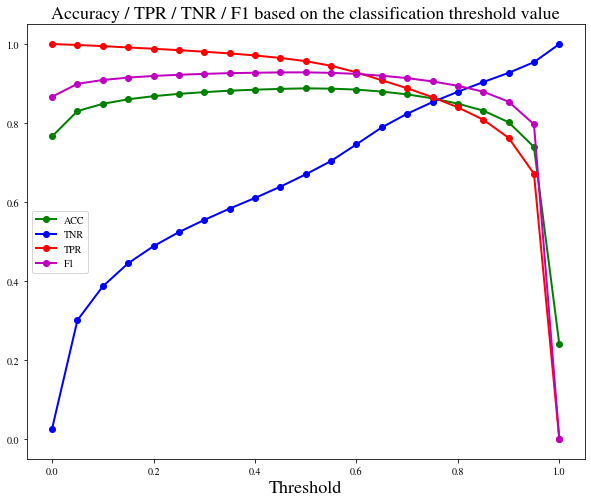

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 195324


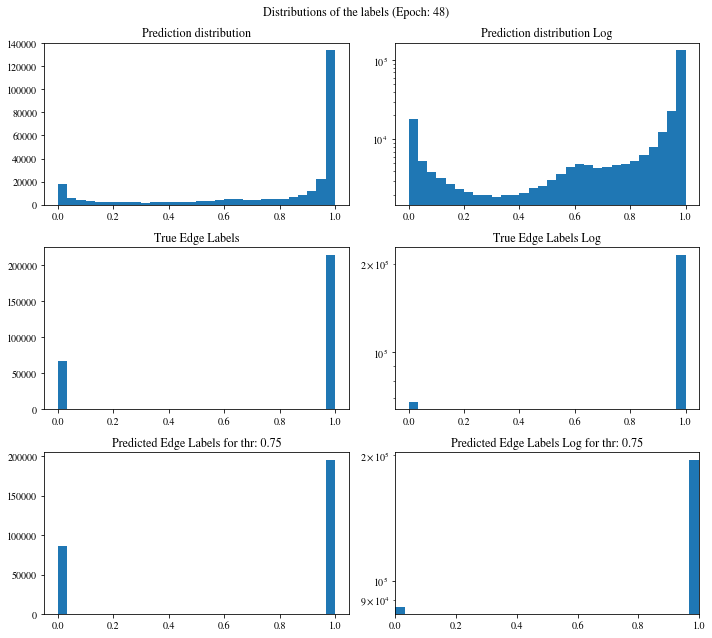

[0.99839717 0.9963243  0.98932332 ... 0.26984057 0.29716501 0.37008131]
Confusion matrix:
[[ 57765   9935]
 [ 28778 185389]]

Confusion matrix weighted:
[[0.42662482 0.07337518]
 [0.06718589 0.43281411]]

TN: 57765 	 FN: 28778 	 TP: 185389 	 FP: 9935
Confusion matrix scaled:
[[0.20493708 0.03524712]
 [0.1020978  0.657718  ]]

Accuracy: 0.8627
Precision: 0.9491
Negative predictive value: 0.6675
Recall: Correctly classifying 86.5628 % of positive edges
True negative rate: Correctly classifying 85.3250 % of all negative edges
F1 score: 0.9055
[0.86394404 0.85504398] [0.85324963 0.86562822] [0.85856354 0.86030355]
Balanced accuracy: 0.8594
Precision weighted: [0.86394404 0.85504398]
Recall weighted: [0.85324963 0.86562822]
F1 score weighted: [0.85856354 0.86030355]
positive_likelihood_ratio: 5.898644268988767, negative_likelihood_ratio: 0.15748237146363014


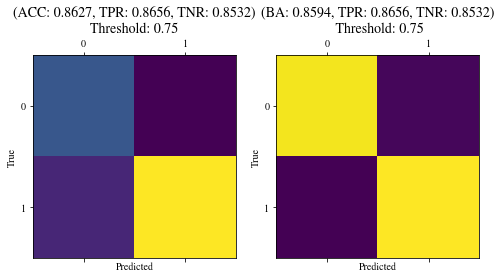

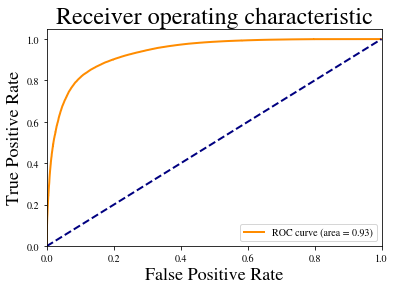

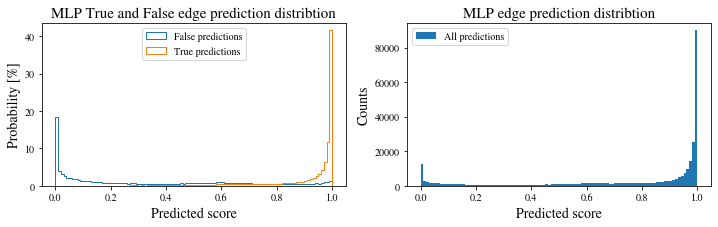

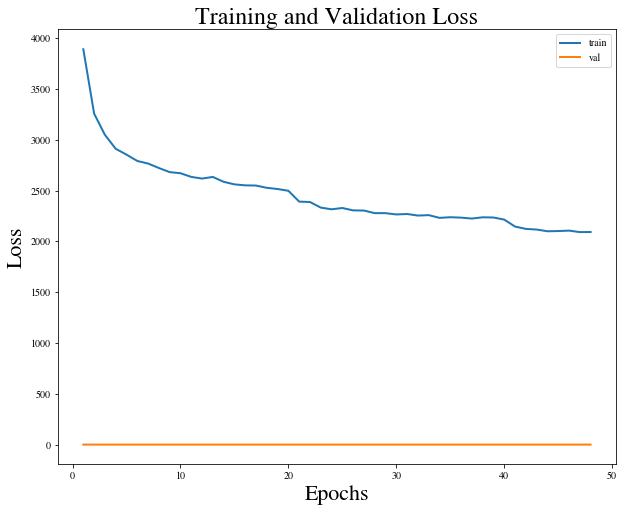

Training epoch 49: 100%|██████████| 12079/12079 [06:23<00:00, 31.51it/s]


Epoch: 49, train loss: 2096.1641
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_49_loss_2096.1641.pt
Epoch: 49, val loss: 0.2322


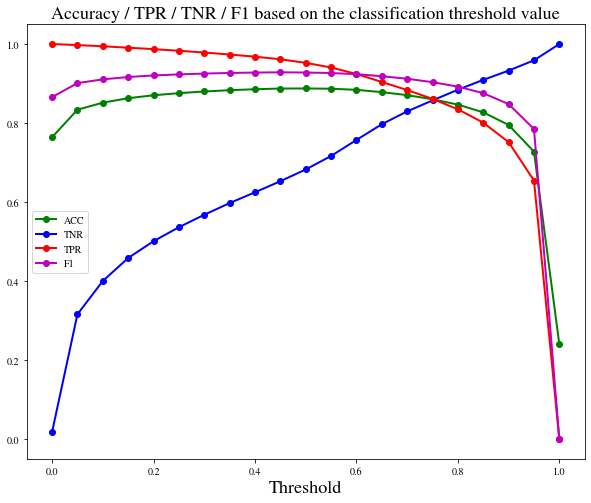

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 194098


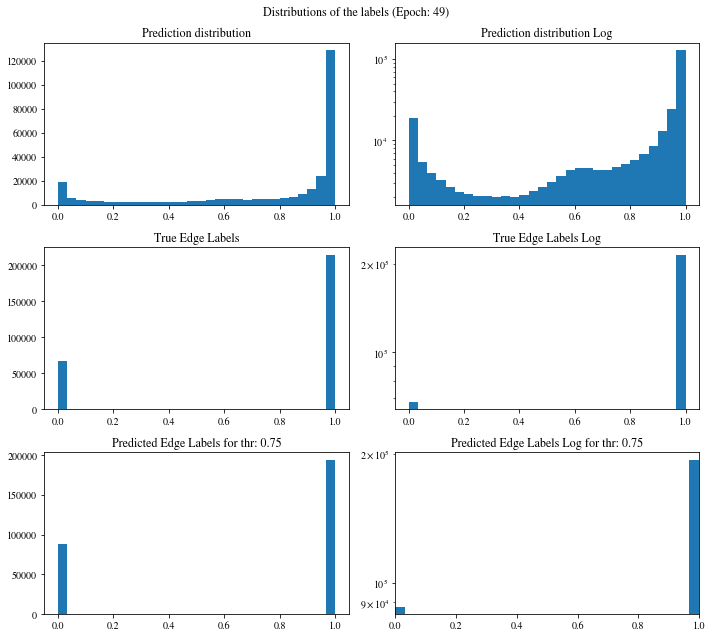

[0.97879308 0.43680638 0.50334483 ... 0.99409771 0.99130344 0.99615955]
Confusion matrix:
[[ 58051   9649]
 [ 29718 184449]]

Confusion matrix weighted:
[[0.42873708 0.07126292]
 [0.06938044 0.43061956]]

TN: 58051 	 FN: 29718 	 TP: 184449 	 FP: 9649
Confusion matrix scaled:
[[0.20595174 0.03423246]
 [0.1054327  0.6543831 ]]

Accuracy: 0.8603
Precision: 0.9503
Negative predictive value: 0.6614
Recall: Correctly classifying 86.1239 % of positive edges
True negative rate: Correctly classifying 85.7474 % of all negative edges
F1 score: 0.9036
[0.86071472 0.85800874] [0.85747415 0.86123913] [0.85909138 0.8596209 ]
Balanced accuracy: 0.8594
Precision weighted: [0.86071472 0.85800874]
Recall weighted: [0.85747415 0.86123913]
F1 score weighted: [0.85909138 0.8596209 ]
positive_likelihood_ratio: 6.04268720721627, negative_likelihood_ratio: 0.1618251388877059


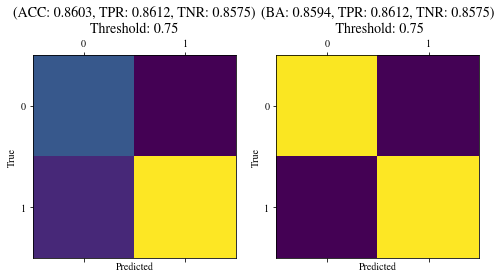

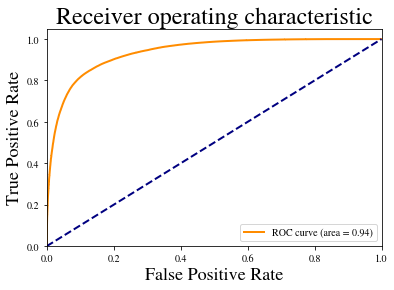

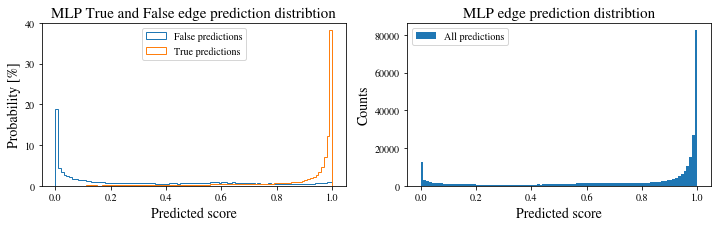

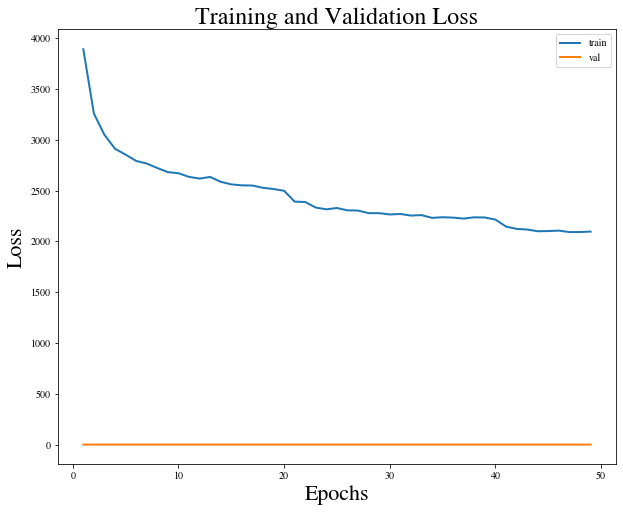

Training epoch 50: 100%|██████████| 12079/12079 [06:17<00:00, 32.00it/s]


Epoch: 50, train loss: 2094.9900
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features/model_epoch_50_loss_2094.9900.pt
Epoch: 50, val loss: 0.2344


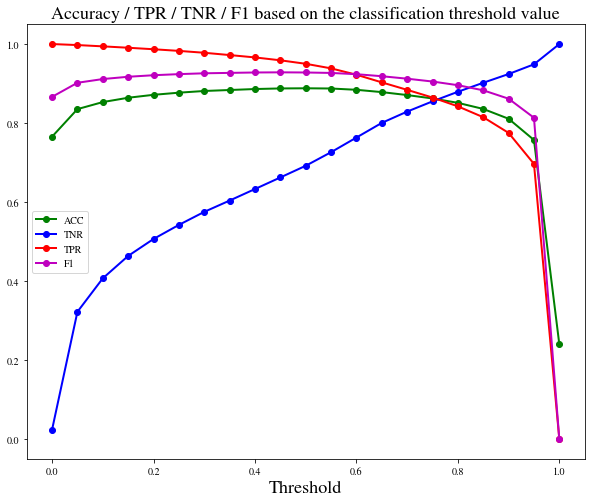

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 195006


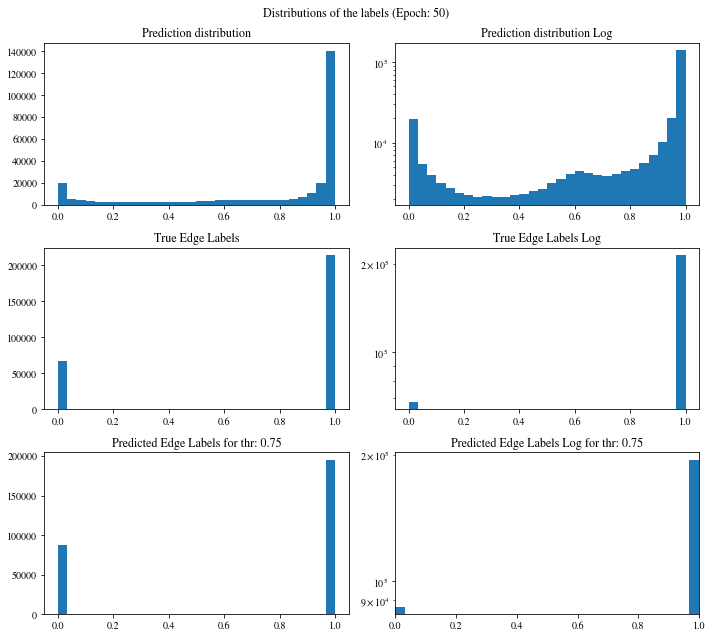

[0.94584453 0.71329409 0.97315639 ... 0.69273102 0.57201296 0.2265442 ]
Confusion matrix:
[[ 57885   9815]
 [ 28976 185191]]

Confusion matrix weighted:
[[0.42751108 0.07248892]
 [0.06764814 0.43235186]]

TN: 57885 	 FN: 28976 	 TP: 185191 	 FP: 9815
Confusion matrix scaled:
[[0.20536281 0.03482139]
 [0.10280026 0.65701554]]

Accuracy: 0.8624
Precision: 0.9497
Negative predictive value: 0.6664
Recall: Correctly classifying 86.4704 % of positive edges
True negative rate: Correctly classifying 85.5022 % of all negative edges
F1 score: 0.9052
[0.86338103 0.85641231] [0.85502216 0.86470371] [0.85918126 0.86053804]
Balanced accuracy: 0.8599
Precision weighted: [0.86338103 0.85641231]
Recall weighted: [0.85502216 0.86470371]
F1 score weighted: [0.85918126 0.86053804]
positive_likelihood_ratio: 5.964385261114059, negative_likelihood_ratio: 0.1582371713253089


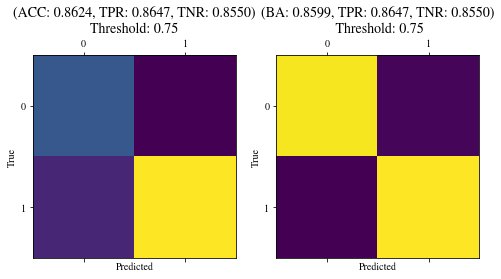

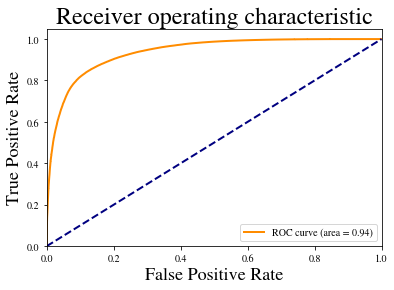

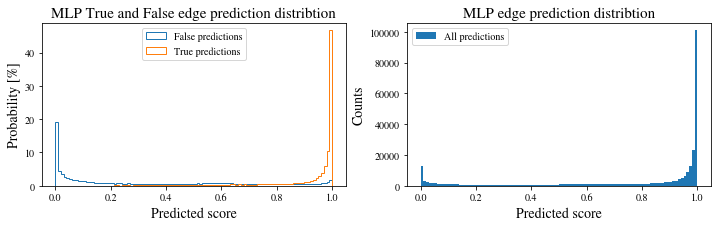

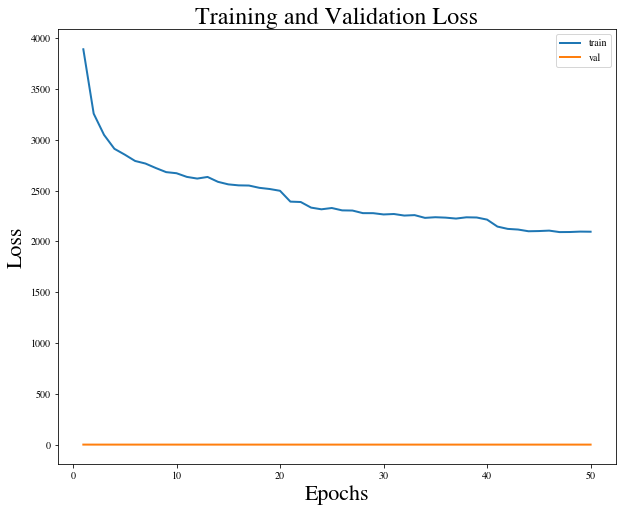

In [33]:
epochs = 50
decision_th = 0.85

outputModelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/gnn__double_pion_0_PU_33_features"
mkdir_p(outputModelPath)


epochs = 50
decision_th = 0.85


train_loss_hist = []
val_loss_hist = []

for epoch in range(epochs):

    loss = train(model, optimizer, train_dl, epoch+1, device, edge_features=True)
    train_loss_hist.append(loss)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt')
    
    # Validation
    model.eval()
    pred, lab = [], []
    val_loss, j = 0, 0
    for sample in val_dl:
        sample = sample.to(device)
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred,emb, edge_emb = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()
        val_loss += loss_obj(nn_pred, sample.edge_label.float()).item()
        j += 1
        
    val_loss = float(val_loss)/j
    print(f'Epoch: {epoch+1}, val loss: {val_loss:.4f}')
    val_loss_hist.append(val_loss)
    
    TNR, TPR, thresholds = classification_thresholds_plot(np.array(pred), np.array(lab),
                                                          threshold_step=0.05, output_folder=outputModelPath,
                                                          epoch=epoch+1)
    classification_threshold = get_best_threshold(TNR, TPR, thresholds)
    print(f"Chosen classification threshold is: {classification_threshold}")

    plot_prediction_distribution_standard_and_log(np.array(pred), np.array(lab),
                                                  epoch=epoch+1, thr = classification_threshold,
                                                 folder=outputModelPath, val=True)

    test(np.array(lab), np.array(pred), classification_threshold=classification_threshold,
                        output_folder=outputModelPath, epoch=epoch+1)
    save_pred(np.array(pred), np.array(lab), epoch=epoch, out_folder=outputModelPath)
    save_loss(train_loss_hist, val_loss_hist, outputLossFunctionPath=outputModelPath)

    scheduler.step()     

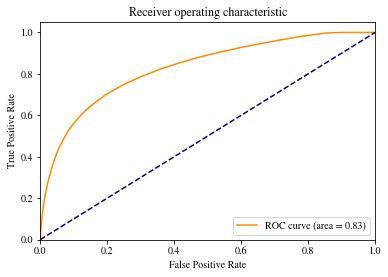

Edge labels: number of positive: 214167
Predictions: number of positive: 258516


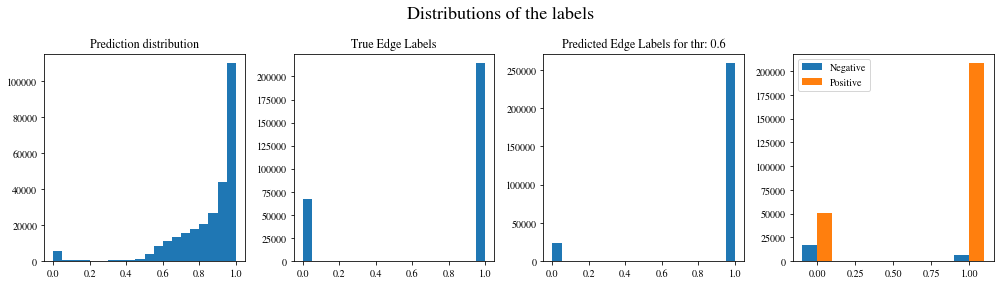

Edge labels: number of positive: 214167
Predictions: number of positive: 180235


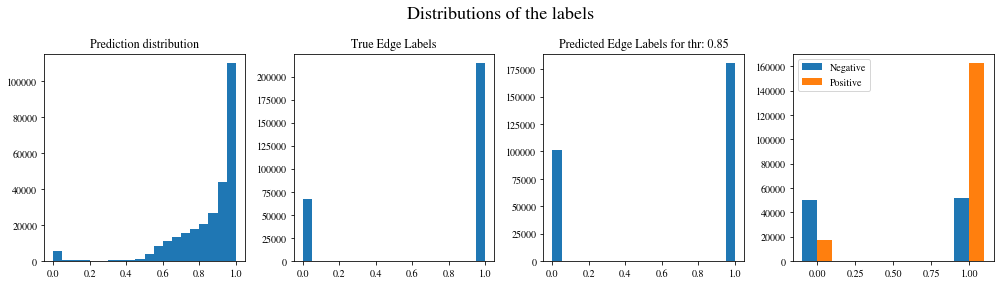

TP: 162476, TN: 49941, FP: 17759, FN: 51691
Acc: 0.7536 P: 0.9015 R: 0.7586 F1: 0.82 FB: 0.87
---------------------------


NameError: name 'test' is not defined

In [41]:
decision_th = 0.85
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
                continue
    data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
    nn_pred, data = model(*data, device)
    pred += nn_pred.tolist()
    lab += sample.edge_label.tolist()

plot_roc(lab, pred)
plot_pred_distr(lab, pred, decision_th = 0.6)
plot_pred_distr(lab, pred, decision_th = decision_th)

pred_thr = (np.array(pred) > decision_th).astype(int)

tn, fp, fn, tp = confusion_matrix(lab, pred_thr).ravel()
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")
acc = accuracy_score(lab, pred_thr)
precision = precision_score(lab, pred_thr)
recall = recall_score(lab, pred_thr)
f1 = f1_score(lab, pred_thr)
# The F-beta score is the weighted harmonic mean of precision and recall, reaching its optimal value at 1 and its worst value at 0.
fb = fbeta_score(lab, pred_thr, beta=0.5)
print(f'Acc: {acc:.4f} P: {precision:.4f} R: {recall:.4f} F1: {f1:.2f} FB: {fb:.2f}')
print("---------------------------")

test(np.array(lab), np.array(pred), classification_threshold = decision_th)

In [ ]:
ev_id = 3
model.cpu()
model.to("cpu")
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, return_net_out=True, device="cpu", edge_features=True)

print(nn_score)
fig = plt.figure(figsize=(5, 3))

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=25)
plt.show()

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")


truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

t_match = testDataset[ev_id].best_simTs_match.cpu()
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Plotting only true edges
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_only_true=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct, missed and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed = False, plot_only_true=False, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting all the initial edges submitted for prediction
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_all_initial_edges=True,
              energy=E, edges=p_pairs, edges_t=t_pairs, all_edges=all_edges)

In [ ]:
# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
    print("ERROR: different shapes of edge index and edge features")
else:
    inputs = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)

    link_pred, embs = model(*inputs, device=device)
    embs = embs.cpu().detach().numpy()
    predictions = link_pred.cpu().detach().numpy()


    event_features = event.x.cpu().numpy()
    components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85) # PU=True)
    #print(components)
    #print(predicted_cluster_ids)

    tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
    embs_original = tsne.fit_transform(event_features)

    #print(event_features.shape)
    #print(embs.shape)
    embs_model = tsne.fit_transform(embs)

    # scikit v 1.2.2
    # class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0,
    #                             learning_rate='auto', n_iter=1000, n_iter_without_progress=300,
    #                             min_grad_norm=1e-07, metric='euclidean', metric_params=None, 
    #                             init='pca', verbose=0, random_state=None, method='barnes_hut',
    #                             angle=0.5, n_jobs=None, square_distances='deprecated')

    # class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0, 
    #                             learning_rate=200.0, n_iter=1000, n_iter_without_progress=300, 
    #                             min_grad_norm=1e-07, metric='euclidean', init='random', verbose=0,
    #                             random_state=None, method='barnes_hut', angle=0.5, n_jobs=None,
    #                             square_distances='legacy')

    # diff : lr = 200
    # init: random

    plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
              feature_type='original features', energy_factor=10)
    plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
              feature_type='model embeddings', energy_factor=15)

    components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85, PU=True)
    plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
              feature_type='original features', energy_factor=10)
    plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
              feature_type='model embeddings', energy_factor=15)

# Model 0 all features, normalized, simple training script

In [168]:
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], hidden_dim=64)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = FocalLoss(alpha=alpha, gamma=2)

# modelPath = "./model_saved/mlp_simple_double_pion_0_PU/model.pt"
# checkpoint = torch.load(modelPath, map_location=device)
# model.load_state_dict(checkpoint["model_state_dict"])

/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/torch/nn/init.py:403: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


In [169]:
epochs = 10

outputModelPath = "./model_saved/gnn_double_pion_0_PU_33_features"
mkdir_p(outputModelPath)

for epoch in range(epochs):
    loss = train(model, optimizer, train_dl, epoch+1, device)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt')
    
    # Validation
    pred, lab = [], []
    for sample in val_dl:
        sample = sample.to(device)
        data = prepare_network_input_data(sample.x, sample.edge_index, device=device)
        nn_pred, data = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()

    test(np.array(lab), np.array(pred), classification_threshold = decision_th)
    #------------------------

    scheduler.step()
    if (epoch+1) % 20 == 0:
        train_acc = test_simple(model, train_dl, device)
        val_acc = test_simple(model, val_dl)
        print(f'Epoch: {epoch+1}, loss: {loss:.4f}, train acc: {train_acc:.4f}, test acc: {val_acc:.4f}')

Training epoch 1:   0%|          | 3/8639 [00:08<7:03:28,  2.94s/it] 


KeyboardInterrupt: 

In [64]:
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=64, weighted_aggr=True)
modelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1/model.pt"
checkpoint = torch.load(modelPath, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
print(f"Model epoch: {checkpoint['epoch']}")
print(">>> Model Loaded.")
model.eval()


Model epoch: 10
>>> Model Loaded.


GNN_TracksterLinkingNet(
  (inputnetwork): Sequential(
    (0): Linear(in_features=33, out_features=64, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=64, out_features=64, bias=True)
    (4): LeakyReLU(negative_slope=0.01)
  )
  (edge_inputnetwork): Sequential(
    (0): Linear(in_features=8, out_features=32, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=32, out_features=32, bias=True)
    (4): LeakyReLU(negative_slope=0.01)
  )
  (attention_direct): Sequential(
    (0): Linear(in_features=32, out_features=32, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=32, out_features=1, bias=True)
    (4): Sigmoid()
  )
  (attention_reverse): Sequential(
    (0): Linear(in_features=32, out_features=32, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.2, inplace=Fal

In [ ]:
pred_thr = (np.array(pred) > decision_th).astype(int)

tn, fp, fn, tp = confusion_matrix(lab, pred_thr).ravel()
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")
acc = accuracy_score(lab, pred_thr)
precision = precision_score(lab, pred_thr)
recall = recall_score(lab, pred_thr)
f1 = f1_score(lab, pred_thr)
# The F-beta score is the weighted harmonic mean of precision and recall, reaching its optimal value at 1 and its worst value at 0.
fb = fbeta_score(lab, pred_thr, beta=0.5)
print(f'Acc: {acc:.4f} P: {precision:.4f} R: {recall:.4f} F1: {f1:.2f} FB: {fb:.2f}')
print("---------------------------")

test(np.array(lab), np.array(pred), classification_threshold = decision_th)

In [ ]:
ev_id = 3
model.cpu()
model.to("cpu")
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, return_net_out=True, device="cpu")

In [ ]:
print(nn_score)
fig = plt.figure(figsize=(5, 3))

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=25)
plt.show()

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

In [ ]:
# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")


truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

t_match = testDataset[ev_id].best_simTs_match.cpu()
all_edges = testDataset[ev_id].edge_index.T.tolist()

In [ ]:
# Plotting only true edges
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_only_true=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct, missed and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed = False, plot_only_true=False, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting all the initial edges submitted for prediction
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_all_initial_edges=True,
              energy=E, edges=p_pairs, edges_t=t_pairs, all_edges=all_edges)

In [ ]:
# Make above plots on LC level...but you dont have lcs anymore...

In [ ]:
# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

# scikit v 1.2.2
# class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0,
#                             learning_rate='auto', n_iter=1000, n_iter_without_progress=300,
#                             min_grad_norm=1e-07, metric='euclidean', metric_params=None, 
#                             init='pca', verbose=0, random_state=None, method='barnes_hut',
#                             angle=0.5, n_jobs=None, square_distances='deprecated')

# class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0, 
#                             learning_rate=200.0, n_iter=1000, n_iter_without_progress=300, 
#                             min_grad_norm=1e-07, metric='euclidean', init='random', verbose=0,
#                             random_state=None, method='barnes_hut', angle=0.5, n_jobs=None,
#                             square_distances='legacy')

# diff : lr = 200
# init: random

plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)
plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85, PU=True)
plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)
plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

# Model 0, no time and LC/Tr density, features normalized, simple script

In [ ]:
model = MLP_TracksterLinkingNet(input_dim = 30)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = torch.nn.BCELoss()

In [ ]:
epochs = 10
for epoch in range(epochs):
    loss = train(model, optimizer, train_dl, epoch+1, device)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')

    scheduler.step()
    if (epoch+1) % 20 == 0:
        train_acc = test_simple(model, train_dl, device)
        val_acc = test_simple(model, val_dl)
        print(f'Epoch: {epoch+1}, loss: {loss:.4f}, train acc: {train_acc:.4f}, test acc: {val_acc:.4f}')
        
outputModelPath = "./model_saved/mlp_simple_double_pion_0_PU_30_features"

mkdir_p(outputModelPath)
print(f">>> Saving model to {outputModelPath + '/model.pt'}")
torch.save({'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, outputModelPath + "/model.pt")

In [ ]:
decision_th = 0.8
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    data = prepare_network_input_data(sample.x, sample.edge_index)
    nn_pred, data = model(*data, device)
    pred += nn_pred.tolist()
    lab += sample.edge_label.tolist()

plot_roc(lab, pred)
plot_pred_distr(lab, pred, decision_th = 0.6)

pred_thr = (np.array(pred) > decision_th).astype(int)

tn, fp, fn, tp = confusion_matrix(lab, pred_thr).ravel()
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")
acc = accuracy_score(lab, pred_thr)
precision = precision_score(lab, pred_thr)
recall = recall_score(lab, pred_thr)
f1 = f1_score(lab, pred_thr)
# The F-beta score is the weighted harmonic mean of precision and recall, reaching its optimal value at 1 and its worst value at 0.
fb = fbeta_score(lab, pred_thr, beta=0.5)
print(f'Acc: {acc:.4f} P: {precision:.4f} R: {recall:.4f} F1: {f1:.2f} FB: {fb:.2f}')
print("---------------------------")

test(np.array(lab), np.array(pred), classification_threshold = decision_th)

In [ ]:
ev_id = 3
model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, return_net_out=True, device="cpu")

In [ ]:
print(len(t_node))
print(len(t_pairs))
print(len(t_scores))

print(len(p_pairs))
print(len(p_scores))
print(len(nn_score))
print(len(p_node))

print(p_scores)

In [ ]:
print(nn_score)
fig = plt.figure(figsize=(5, 3))

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=25)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

In [ ]:
# !pip uninstall -y community
# !pip install python-louvain

In [ ]:
"""
This module implements community detection.
"""
from __future__ import print_function

import array

import numbers
import warnings

import networkx as nx
import numpy as np

class Status(object):
    """
    To handle several data in one struct.
    Could be replaced by named tuple, but don't want to depend on python 2.6
    """
    node2com = {}
    total_weight = 0
    internals = {}
    degrees = {}
    gdegrees = {}

    def __init__(self):
        self.node2com = dict([])
        self.total_weight = 0
        self.degrees = dict([])
        self.gdegrees = dict([])
        self.internals = dict([])
        self.loops = dict([])

    def __str__(self):
        return ("node2com : " + str(self.node2com) + " degrees : "
                + str(self.degrees) + " internals : " + str(self.internals)
                + " total_weight : " + str(self.total_weight))

    def copy(self):
        """Perform a deep copy of status"""
        new_status = Status()
        new_status.node2com = self.node2com.copy()
        new_status.internals = self.internals.copy()
        new_status.degrees = self.degrees.copy()
        new_status.gdegrees = self.gdegrees.copy()
        new_status.total_weight = self.total_weight

    def init(self, graph, weight, part=None):
        """Initialize the status of a graph with every node in one community"""
        count = 0
        self.node2com = dict([])
        self.total_weight = 0
        self.degrees = dict([])
        self.gdegrees = dict([])
        self.internals = dict([])
        self.total_weight = graph.size(weight=weight)
        if part is None:
            for node in graph.nodes():
                self.node2com[node] = count
                deg = float(graph.degree(node, weight=weight))
                if deg < 0:
                    error = "Bad node degree ({})".format(deg)
                    raise ValueError(error)
                self.degrees[count] = deg
                self.gdegrees[node] = deg
                edge_data = graph.get_edge_data(node, node, default={weight: 0})
                self.loops[node] = float(edge_data.get(weight, 1))
                self.internals[count] = self.loops[node]
                count += 1
        else:
            for node in graph.nodes():
                com = part[node]
                self.node2com[node] = com
                deg = float(graph.degree(node, weight=weight))
                self.degrees[com] = self.degrees.get(com, 0) + deg
                self.gdegrees[node] = deg
                inc = 0.
                for neighbor, datas in graph[node].items():
                    edge_weight = datas.get(weight, 1)
                    if edge_weight <= 0:
                        error = "Bad graph type ({})".format(type(graph))
                        raise ValueError(error)
                    if part[neighbor] == com:
                        if neighbor == node:
                            inc += float(edge_weight)
                        else:
                            inc += float(edge_weight) / 2.
                self.internals[com] = self.internals.get(com, 0) + inc

__author__ = """Thomas Aynaud (thomas.aynaud@lip6.fr)"""
#    Copyright (C) 2009 by
#    Thomas Aynaud <thomas.aynaud@lip6.fr>
#    All rights reserved.
#    BSD license.

__PASS_MAX = -1
__MIN = 0.0000001


def check_random_state(seed):
    """Turn seed into a np.random.RandomState instance.
    Parameters
    ----------
    seed : None | int | instance of RandomState
        If seed is None, return the RandomState singleton used by np.random.
        If seed is an int, return a new RandomState instance seeded with seed.
        If seed is already a RandomState instance, return it.
        Otherwise raise ValueError.
    """
    if seed is None or seed is np.random:
        return np.random.mtrand._rand
    if isinstance(seed, (numbers.Integral, np.integer)):
        return np.random.RandomState(seed)
    if isinstance(seed, np.random.RandomState):
        return seed
    raise ValueError("%r cannot be used to seed a numpy.random.RandomState"
                     " instance" % seed)


def partition_at_level(dendrogram, level):
    """Return the partition of the nodes at the given level
    A dendrogram is a tree and each level is a partition of the graph nodes.
    Level 0 is the first partition, which contains the smallest communities,
    and the best is len(dendrogram) - 1.
    The higher the level is, the bigger are the communities
    Parameters
    ----------
    dendrogram : list of dict
       a list of partitions, ie dictionnaries where keys of the i+1 are the
       values of the i.
    level : int
       the level which belongs to [0..len(dendrogram)-1]
    Returns
    -------
    partition : dictionnary
       A dictionary where keys are the nodes and the values are the set it
       belongs to
    Raises
    ------
    KeyError
       If the dendrogram is not well formed or the level is too high
    See Also
    --------
    best_partition : which directly combines partition_at_level and
    generate_dendrogram : to obtain the partition of highest modularity
    Examples
    --------
    >>> G=nx.erdos_renyi_graph(100, 0.01)
    >>> dendrogram = generate_dendrogram(G)
    >>> for level in range(len(dendrogram) - 1) :
    >>>     print("partition at level", level, "is", partition_at_level(dendrogram, level))  # NOQA
    """
    partition = dendrogram[0].copy()
    for index in range(1, level + 1):
        for node, community in partition.items():
            partition[node] = dendrogram[index][community]
    return partition


def modularity(partition, graph, weight='weight'):
    """Compute the modularity of a partition of a graph
    Parameters
    ----------
    partition : dict
       the partition of the nodes, i.e a dictionary where keys are their nodes
       and values the communities
    graph : networkx.Graph
       the networkx graph which is decomposed
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    Returns
    -------
    modularity : float
       The modularity
    Raises
    ------
    KeyError
       If the partition is not a partition of all graph nodes
    ValueError
        If the graph has no link
    TypeError
        If graph is not a networkx.Graph
    References
    ----------
    .. 1. Newman, M.E.J. & Girvan, M. Finding and evaluating community
    structure in networks. Physical Review E 69, 26113(2004).
    Examples
    --------
    >>> import community as community_louvain
    >>> import networkx as nx
    >>> G = nx.erdos_renyi_graph(100, 0.01)
    >>> partition = community_louvain.best_partition(G)
    >>> modularity(partition, G)
    """
    if graph.is_directed():
        raise TypeError("Bad graph type, use only non directed graph")

    inc = dict([])
    deg = dict([])
    links = graph.size(weight=weight)
    if links == 0:
        raise ValueError("A graph without link has an undefined modularity")

    for node in graph:
        com = partition[node]
        deg[com] = deg.get(com, 0.) + graph.degree(node, weight=weight)
        for neighbor, datas in graph[node].items():
            edge_weight = datas.get(weight, 1)
            if partition[neighbor] == com:
                if neighbor == node:
                    inc[com] = inc.get(com, 0.) + float(edge_weight)
                else:
                    inc[com] = inc.get(com, 0.) + float(edge_weight) / 2.

    res = 0.
    for com in set(partition.values()):
        res += (inc.get(com, 0.) / links) - \
               (deg.get(com, 0.) / (2. * links)) ** 2
    return res


def best_partition(graph,
                   partition=None,
                   weight='weight',
                   resolution=1.,
                   randomize=None,
                   random_state=None):
    """Compute the partition of the graph nodes which maximises the modularity
    (or try..) using the Louvain heuristices
    This is the partition of highest modularity, i.e. the highest partition
    of the dendrogram generated by the Louvain algorithm.
    Parameters
    ----------
    graph : networkx.Graph
       the networkx graph which is decomposed
    partition : dict, optional
       the algorithm will start using this partition of the nodes.
       It's a dictionary where keys are their nodes and values the communities
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    resolution :  double, optional
        Will change the size of the communities, default to 1.
        represents the time described in
        "Laplacian Dynamics and Multiscale Modular Structure in Networks",
        R. Lambiotte, J.-C. Delvenne, M. Barahona
    randomize : boolean, optional
        Will randomize the node evaluation order and the community evaluation
        order to get different partitions at each call
    random_state : int, RandomState instance or None, optional (default=None)
        If int, random_state is the seed used by the random number generator;
        If RandomState instance, random_state is the random number generator;
        If None, the random number generator is the RandomState instance used
        by `np.random`.
    Returns
    -------
    partition : dictionnary
       The partition, with communities numbered from 0 to number of communities
    Raises
    ------
    NetworkXError
       If the graph is not undirected.
    See Also
    --------
    generate_dendrogram : to obtain all the decompositions levels
    Notes
    -----
    Uses Louvain algorithm
    References
    ----------
    .. 1. Blondel, V.D. et al. Fast unfolding of communities in
    large networks. J. Stat. Mech 10008, 1-12(2008).
    Examples
    --------
    >>> # basic usage
    >>> import community as community_louvain
    >>> import networkx as nx
    >>> G = nx.erdos_renyi_graph(100, 0.01)
    >>> partion = community_louvain.best_partition(G)
    >>> # display a graph with its communities:
    >>> # as Erdos-Renyi graphs don't have true community structure,
    >>> # instead load the karate club graph
    >>> import community as community_louvain
    >>> import matplotlib.cm as cm
    >>> import matplotlib.pyplot as plt
    >>> import networkx as nx
    >>> G = nx.karate_club_graph()
    >>> # compute the best partition
    >>> partition = community_louvain.best_partition(G)
    >>> # draw the graph
    >>> pos = nx.spring_layout(G)
    >>> # color the nodes according to their partition
    >>> cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
    >>> nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
    >>>                        cmap=cmap, node_color=list(partition.values()))
    >>> nx.draw_networkx_edges(G, pos, alpha=0.5)
    >>> plt.show()
    """
    dendo = generate_dendrogram(graph,
                                partition,
                                weight,
                                resolution,
                                randomize,
                                random_state)
    return partition_at_level(dendo, len(dendo) - 1)


def generate_dendrogram(graph,
                        part_init=None,
                        weight='weight',
                        resolution=1.,
                        randomize=None,
                        random_state=None):
    """Find communities in the graph and return the associated dendrogram
    A dendrogram is a tree and each level is a partition of the graph nodes.
    Level 0 is the first partition, which contains the smallest communities,
    and the best is len(dendrogram) - 1. The higher the level is, the bigger
    are the communities
    Parameters
    ----------
    graph : networkx.Graph
        the networkx graph which will be decomposed
    part_init : dict, optional
        the algorithm will start using this partition of the nodes. It's a
        dictionary where keys are their nodes and values the communities
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    resolution :  double, optional
        Will change the size of the communities, default to 1.
        represents the time described in
        "Laplacian Dynamics and Multiscale Modular Structure in Networks",
        R. Lambiotte, J.-C. Delvenne, M. Barahona
    Returns
    -------
    dendrogram : list of dictionaries
        a list of partitions, ie dictionnaries where keys of the i+1 are the
        values of the i. and where keys of the first are the nodes of graph
    Raises
    ------
    TypeError
        If the graph is not a networkx.Graph
    See Also
    --------
    best_partition
    Notes
    -----
    Uses Louvain algorithm
    References
    ----------
    .. 1. Blondel, V.D. et al. Fast unfolding of communities in large
    networks. J. Stat. Mech 10008, 1-12(2008).
    Examples
    --------
    >>> G=nx.erdos_renyi_graph(100, 0.01)
    >>> dendo = generate_dendrogram(G)
    >>> for level in range(len(dendo) - 1) :
    >>>     print("partition at level", level,
    >>>           "is", partition_at_level(dendo, level))
    :param weight:
    :type weight:
    """
    if graph.is_directed():
        raise TypeError("Bad graph type, use only non directed graph")

    # Properly handle random state, eventually remove old `randomize` parameter
    # NOTE: when `randomize` is removed, delete code up to random_state = ...
    if randomize is not None:
        warnings.warn("The `randomize` parameter will be deprecated in future "
                      "versions. Use `random_state` instead.", DeprecationWarning)
        # If shouldn't randomize, we set a fixed seed to get determinisitc results
        if randomize is False:
            random_state = 0

    # We don't know what to do if both `randomize` and `random_state` are defined
    if randomize and random_state is not None:
        raise ValueError("`randomize` and `random_state` cannot be used at the "
                         "same time")

    random_state = check_random_state(random_state)

    # special case, when there is no link
    # the best partition is everyone in its community
    if graph.number_of_edges() == 0:
        part = dict([])
        for i, node in enumerate(graph.nodes()):
            part[node] = i
        return [part]

    current_graph = graph.copy()
    status = Status()
    status.init(current_graph, weight, part_init)
    status_list = list()
    __one_level(current_graph, status, weight, resolution, random_state)
    new_mod = __modularity(status, resolution)
    partition = __renumber(status.node2com)
    status_list.append(partition)
    mod = new_mod
    current_graph = induced_graph(partition, current_graph, weight)
    status.init(current_graph, weight)

    while True:
        __one_level(current_graph, status, weight, resolution, random_state)
        new_mod = __modularity(status, resolution)
        if new_mod - mod < __MIN:
            break
        partition = __renumber(status.node2com)
        status_list.append(partition)
        mod = new_mod
        current_graph = induced_graph(partition, current_graph, weight)
        status.init(current_graph, weight)
    return status_list[:]


def induced_graph(partition, graph, weight="weight"):
    """Produce the graph where nodes are the communities
    there is a link of weight w between communities if the sum of the weights
    of the links between their elements is w
    Parameters
    ----------
    partition : dict
       a dictionary where keys are graph nodes and  values the part the node
       belongs to
    graph : networkx.Graph
        the initial graph
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    Returns
    -------
    g : networkx.Graph
       a networkx graph where nodes are the parts
    Examples
    --------
    >>> n = 5
    >>> g = nx.complete_graph(2*n)
    >>> part = dict([])
    >>> for node in g.nodes() :
    >>>     part[node] = node % 2
    >>> ind = induced_graph(part, g)
    >>> goal = nx.Graph()
    >>> goal.add_weighted_edges_from([(0,1,n*n),(0,0,n*(n-1)/2), (1, 1, n*(n-1)/2)])  # NOQA
    >>> nx.is_isomorphic(ind, goal)
    True
    """
    ret = nx.Graph()
    ret.add_nodes_from(partition.values())

    for node1, node2, datas in graph.edges(data=True):
        edge_weight = datas.get(weight, 1)
        com1 = partition[node1]
        com2 = partition[node2]
        w_prec = ret.get_edge_data(com1, com2, {weight: 0}).get(weight, 1)
        ret.add_edge(com1, com2, **{weight: w_prec + edge_weight})

    return ret


def __renumber(dictionary):
    """Renumber the values of the dictionary from 0 to n
    """
    values = set(dictionary.values())
    target = set(range(len(values)))

    if values == target:
        # no renumbering necessary
        ret = dictionary.copy()
    else:
        # add the values that won't be renumbered
        renumbering = dict(zip(target.intersection(values),
                               target.intersection(values)))
        # add the values that will be renumbered
        renumbering.update(dict(zip(values.difference(target),
                                    target.difference(values))))
        ret = {k: renumbering[v] for k, v in dictionary.items()}

    return ret


def load_binary(data):
    """Load binary graph as used by the cpp implementation of this algorithm
    """
    data = open(data, "rb")

    reader = array.array("I")
    reader.fromfile(data, 1)
    num_nodes = reader.pop()
    reader = array.array("I")
    reader.fromfile(data, num_nodes)
    cum_deg = reader.tolist()
    num_links = reader.pop()
    reader = array.array("I")
    reader.fromfile(data, num_links)
    links = reader.tolist()
    graph = nx.Graph()
    graph.add_nodes_from(range(num_nodes))
    prec_deg = 0

    for index in range(num_nodes):
        last_deg = cum_deg[index]
        neighbors = links[prec_deg:last_deg]
        graph.add_edges_from([(index, int(neigh)) for neigh in neighbors])
        prec_deg = last_deg

    return graph


def __one_level(graph, status, weight_key, resolution, random_state):
    """Compute one level of communities
    """
    modified = True
    nb_pass_done = 0
    cur_mod = __modularity(status, resolution)
    new_mod = cur_mod

    while modified and nb_pass_done != __PASS_MAX:
        cur_mod = new_mod
        modified = False
        nb_pass_done += 1

        for node in __randomize(graph.nodes(), random_state):
            com_node = status.node2com[node]
            degc_totw = status.gdegrees.get(node, 0.) / (status.total_weight * 2.)  # NOQA
            neigh_communities = __neighcom(node, graph, status, weight_key)
            remove_cost = - neigh_communities.get(com_node,0) + \
                resolution * (status.degrees.get(com_node, 0.) - status.gdegrees.get(node, 0.)) * degc_totw
            __remove(node, com_node,
                     neigh_communities.get(com_node, 0.), status)
            best_com = com_node
            best_increase = 0
            for com, dnc in __randomize(neigh_communities.items(), random_state):
                incr = remove_cost + dnc - \
                       resolution * status.degrees.get(com, 0.) * degc_totw
                if incr > best_increase:
                    best_increase = incr
                    best_com = com
            __insert(node, best_com,
                     neigh_communities.get(best_com, 0.), status)
            if best_com != com_node:
                modified = True
        new_mod = __modularity(status, resolution)
        if new_mod - cur_mod < __MIN:
            break


def __neighcom(node, graph, status, weight_key):
    """
    Compute the communities in the neighborhood of node in the graph given
    with the decomposition node2com
    """
    weights = {}
    for neighbor, datas in graph[node].items():
        if neighbor != node:
            edge_weight = datas.get(weight_key, 1)
            neighborcom = status.node2com[neighbor]
            weights[neighborcom] = weights.get(neighborcom, 0) + edge_weight

    return weights


def __remove(node, com, weight, status):
    """ Remove node from community com and modify status"""
    status.degrees[com] = (status.degrees.get(com, 0.)
                           - status.gdegrees.get(node, 0.))
    status.internals[com] = float(status.internals.get(com, 0.) -
                                  weight - status.loops.get(node, 0.))
    status.node2com[node] = -1


def __insert(node, com, weight, status):
    """ Insert node into community and modify status"""
    status.node2com[node] = com
    status.degrees[com] = (status.degrees.get(com, 0.) +
                           status.gdegrees.get(node, 0.))
    status.internals[com] = float(status.internals.get(com, 0.) +
                                  weight + status.loops.get(node, 0.))


def __modularity(status, resolution):
    """
    Fast compute the modularity of the partition of the graph using
    status precomputed
    """
    links = float(status.total_weight)
    result = 0.
    for community in set(status.node2com.values()):
        in_degree = status.internals.get(community, 0.)
        degree = status.degrees.get(community, 0.)
        if links > 0:
            result += in_degree * resolution / links -  ((degree / (2. * links)) ** 2)
    return result


def __randomize(items, random_state):
    """Returns a List containing a random permutation of items"""
    randomized_items = list(items)
    random_state.shuffle(randomized_items)
    return randomized_items

In [ ]:
#print(dir(community_louvain))

In [ ]:
# Example of community detection using louvain
#import matplotlib.cm as cm

# load the karate club graph
G = nx.karate_club_graph()
print(G)

#first compute the best partition
partition = best_partition(G)
print(partition)

# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

In [ ]:
# Network predictions
# import community as community_louvain

G = nx.Graph()
#G.add_edges_from(p_pairs)
G.add_weighted_edges_from([[src, dst, w] for (src, dst), w in zip(p_pairs, p_scores)])
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

print(len(p_pairs))
print(len(p_scores))
   
# Louvain partition on the thresholded graph------------------------------------------
louvain_partition = best_partition(G)
#print(louvain_partition)
louvain_partition = dict(sorted(louvain_partition.items(), key=lambda item: item[0]))
#print(louvain_partition)
louvain_pred_cluster_labels = list(louvain_partition.values())
#print(nn_pred_cluster_labels)
louvain_pairs = [[src, dst] for src,dst in p_pairs if louvain_pred_cluster_labels[src]==louvain_pred_cluster_labels[dst]]
#----------------------------------------------------------------------------------

# Louvain partition on the full graph------------------------------------------
G = nx.Graph()
#G.add_edges_from(p_pairs)
G.add_weighted_edges_from([[src, dst, w] for (src, dst), w in zip(all_edges, nn_score)])
G.add_nodes_from(range(len(p_node)))

all_louvain_partition = best_partition(G)
#print(louvain_partition)
all_louvain_partition = dict(sorted(all_louvain_partition.items(), key=lambda item: item[0]))
#print(louvain_partition)
all_louvain_pred_cluster_labels = list(all_louvain_partition.values())
#print(nn_pred_cluster_labels)
all_louvain_pairs = [[src, dst] for src,dst in all_edges if all_louvain_pred_cluster_labels[src]==all_louvain_pred_cluster_labels[dst]]
#----------------------------------------------------------------------------------

In [ ]:
# Plotting only true edges
print("True Edges")
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_only_true=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct, missed and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
print("Correct, missed and wrong edges predicted by NN")
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
print("Correct and wrong edges predicted by NN")
plotTrackster(z, x, y, t_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed = False, plot_only_true=False, energy=E, edges=p_pairs, edges_t=t_pairs)

# louvain predictions on thresholded graph
print("Louvanian community detection on the graph thresholded by NN")
plotTrackster(z, x, y, t_match=t_match, predicted_match=louvain_pred_cluster_labels, plot_missed=True, energy=E, edges=louvain_pairs, edges_t=t_pairs)

# louvain predictions on the whole graph
print("Louvanian community detection on the graph weighted by NN")
plotTrackster(z, x, y, t_match=t_match, predicted_match=all_louvain_pred_cluster_labels, plot_missed=True, energy=E, edges=all_louvain_pairs, edges_t=t_pairs)

# Model 0, all features normalized, simple script, Focal loss

In [ ]:
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = FocalLoss(alpha=alpha, gamma=2)

In [ ]:
epochs = 10
for epoch in range(epochs):
    loss = train(model, optimizer, train_dl, epoch+1, device)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')

    scheduler.step()
    if (epoch+1) % 20 == 0:
        train_acc = test_simple(model, train_dl, device)
        val_acc = test_simple(model, val_dl)
        print(f'Epoch: {epoch+1}, loss: {loss:.4f}, train acc: {train_acc:.4f}, test acc: {val_acc:.4f}')
        
outputModelPath = "./model_saved/mlp_simple_double_pion_0_PU_simple_training_33_features_focal_loss"

mkdir_p(outputModelPath)
print(f">>> Saving model to {outputModelPath + '/model.pt'}")
torch.save({'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, outputModelPath + "/model.pt")

In [ ]:
decision_th = 0.8
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    data = prepare_network_input_data(sample.x, sample.edge_index)
    nn_pred, data = model(*data, device)
    pred += nn_pred.tolist()
    lab += sample.edge_label.tolist()

plot_roc(lab, pred)
plot_pred_distr(lab, pred, decision_th = 0.6)

pred_thr = (np.array(pred) > decision_th).astype(int)

tn, fp, fn, tp = confusion_matrix(lab, pred_thr).ravel()
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")
acc = accuracy_score(lab, pred_thr)
precision = precision_score(lab, pred_thr)
recall = recall_score(lab, pred_thr)
f1 = f1_score(lab, pred_thr)
# The F-beta score is the weighted harmonic mean of precision and recall, reaching its optimal value at 1 and its worst value at 0.
fb = fbeta_score(lab, pred_thr, beta=0.5)
print(f'Acc: {acc:.4f} P: {precision:.4f} R: {recall:.4f} F1: {f1:.2f} FB: {fb:.2f}')
print("---------------------------")

test(np.array(lab), np.array(pred), classification_threshold = decision_th)

In [ ]:
ev_id = 2
decision_th = 0.8

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(5, 3))
fig.suptitle('Distributions of the predictions', size=18)

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

In [ ]:
# Plotting only true edges
plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_only_true=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct, missed and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# plotting correct and wrong edges
# first row coloring of the tracksters corresponds to the correct supertracksters
# the second row coloring is based on the predicted supertracksters
plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed = False, plot_only_true=False, energy=E, edges=p_pairs, edges_t=t_pairs)

In [ ]:
# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

# scikit v 1.2.2
# class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0,
#                             learning_rate='auto', n_iter=1000, n_iter_without_progress=300,
#                             min_grad_norm=1e-07, metric='euclidean', metric_params=None, 
#                             init='pca', verbose=0, random_state=None, method='barnes_hut',
#                             angle=0.5, n_jobs=None, square_distances='deprecated')

# class sklearn.manifold.TSNE(n_components=2, *, perplexity=30.0, early_exaggeration=12.0, 
#                             learning_rate=200.0, n_iter=1000, n_iter_without_progress=300, 
#                             min_grad_norm=1e-07, metric='euclidean', init='random', verbose=0,
#                             random_state=None, method='barnes_hut', angle=0.5, n_jobs=None,
#                             square_distances='legacy')

# diff : lr = 200
# init: random

plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)
plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85, PU=True)
plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)
plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

## Clustering Metrics Evaluation

In [ ]:
truth, predictions = get_model_prediction(model, testDataset, prepare_network_input_data, device=device)

In [ ]:
# todo, make them weighted

hom, compl, vmeas, randind, mutinfo = evaluate_clusters(testDataset, predictions, thr=0.9, numevents=300, PU=False)

print("Avg Homogeneity: %0.3f" % np.mean(hom))
print("Avg Completeness: %0.3f" % np.mean(compl))
print("Avg V-measure: %0.3f" % np.mean(vmeas))
print("Avg Adjusted Rand Index: %0.3f" % np.mean(randind))
print("Avg Adjusted Mutual Information: %0.3f" % np.mean(mutinfo))

### Geometric Linking evaluation with the above metrics

In [ ]:
# todo, make them weighted

hom_g, compl_g, vmeas_g, randind_g, mutinfo_g = evaluate_clusters(testDataset, geometric=True, numevents=300, PU=False)

print("Avg Homogeneity: %0.3f" % np.mean(hom_g))
print("Avg Completeness: %0.3f" % np.mean(compl_g))
print("Avg V-measure: %0.3f" % np.mean(vmeas_g))
print("Avg Adjusted Rand Index: %0.3f" % np.mean(randind_g))
print("Avg Adjusted Mutual Information: %0.3f" % np.mean(mutinfo_g))

In [ ]:
# Random test data

all_data = [np.random.normal(0, std, size=100) for std in range(1, 3)]
labels = ['Geometric', 'MLP']

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

# rectangular box plot
bplot1 = ax1.boxplot([hom_g, hom],
                     vert=True,  # vertical box alignment
                     whis=0.3,
                     showfliers=False,
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax1.set_title('Homogeneity')


bplot2 = ax2.boxplot([compl_g, compl],
                     vert=True,  # vertical box alignment
                     whis=0.3,
                     showfliers=False,
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax2.set_title('Completeness')

bplot3 = ax3.boxplot([vmeas_g, vmeas],
                     vert=True,  # vertical box alignment
                     whis=0.3,
                     showfliers=False,
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax3.set_title('V-measure')

bplot4 = ax4.boxplot([randind_g, randind],
                     vert=True,  # vertical box alignment
                     whis=0.3,
                     showfliers=False,
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax4.set_title('Adjusted Random Index')

bplot5 = ax5.boxplot([mutinfo_g, mutinfo],
                     vert=True,  # vertical box alignment
                     whis=0.3,
                     showfliers=False,
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax5.set_title('Adjusted Mutual Information')

# fill with colors
colors = ['lightblue', 'lightgreen']
for bplot in (bplot1, bplot2, bplot3, bplot4, bplot5):
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)

ax1.set_ylabel('Observed values', size=13)
ax1.set_ylim((0, 1.05))
ax2.set_ylim((0, 1.05))
ax3.set_ylim((0, 1.05))
ax4.set_ylim((-0.1, 1.05))
ax5.set_ylim((-0.1, 1.05))

plt.show()

**Interpretation**:<br>
We have a very high homogenity -> we are not merging the tracksters together! Uhuuu <br>
Adjusted Random Index is more than two times higher than the one for the standard clustering methods!<br>
Let's also evaluate with respect to the geometric linking results...MLP linking looks so much better: it has the same homogenity, but all the other metrices are well above the Geometric linking

In [ ]:
truth, predictions = get_model_prediction(model, testDataset, prepare_network_input_data, device=device)

In [ ]:
pred_rss, sim_matches, pred_cluster_E, truth_cluster_E, cand_rss, cand_sim_matches, cand_E = reco_to_sim_score_evaluation(testDataset, predictions, thr=0.78, numevents=300, PU=False)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

font = 18
cand_rss_flat = list_flatten(cand_rss)
pred_rss_flat = list_flatten(pred_rss)

print(f"Num Candidates: {len(cand_rss_flat)}, Num SuperTracksters Predicted: {len(pred_rss_flat)}")

y_cand, x_cand, _ = ax1.hist(cand_rss_flat, alpha=0.5, bins=30, facecolor = '#2ab0ff', edgecolor='#169acf', linewidth=0.5)
ax1.set_title("TICL Candidate")
y_pr, x_pr, _ = ax2.hist(pred_rss_flat, alpha=0.5, bins=30, facecolor = '#2ab0ff', edgecolor='#169acf', linewidth=0.5)
ax2.set_title("GNN SuperTracksters")

ax1.axhline(y = y_cand[0], color = 'b', alpha=0.3, linestyle = '--', linewidth=1)
ax2.axhline(y = y_pr[0], color = 'b', alpha=0.3, linestyle = '--', linewidth=1)
ax2.axhline(y = y_cand[0], color = 'b', alpha=0.3, linestyle = '--', linewidth=1)
ax1.axhline(y = y_pr[0], color = 'b', alpha=0.3, linestyle = '--', linewidth=1)

ax1.axhline(y = y_cand[-1], color = 'g', alpha=0.3, linestyle = '--', linewidth=1)
ax2.axhline(y = y_pr[-1], color = 'g', alpha=0.3, linestyle = '--', linewidth=1)
ax2.axhline(y = y_cand[-1], color = 'g', alpha=0.3, linestyle = '--', linewidth=1)
ax1.axhline(y = y_pr[-1], color = 'g', alpha=0.3, linestyle = '--', linewidth=1)

plt.suptitle(r"Reco SuperTrackster to SimTrackster from CP", fontsize=font)

ax1.set_xlabel(r"Score (Energy $\cap$ over $\cup$)", fontsize=font)
ax1.set_ylabel(r"Entries", fontsize=font)

ax2.set_xlabel(r"Score (Energy $\cap$ over $\cup$)", fontsize=font)
ax2.set_ylabel(r"Entries", fontsize=font)


ax1.set_yscale("log")
ax2.set_yscale("log")

# set same axis limits:
max_y = max([ax1.get_ylim()[1], ax2.get_ylim()[1]])
ax1.set_ylim([0.1, max_y])
ax2.set_ylim([0.1, max_y])

plt.tight_layout()
plt.show()

**Interpretation**: We have an order of magnitude more perfect score tracksters, also an order of magnitude less low-score tracksters. Moreover, there are 18757 Geometric Candidate tracksters, while only  5317 Predicted SuperTracksters. Ideally, we want to have only 2000 SuperTracksters, 2 tracksters per event, as we are working with double pions. Hence, GNN linking is more efficient in terms of merging.

# Model 0, all features normalized, simple script, Focal loss, Xavier pre-init

In [ ]:
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = FocalLoss(alpha=alpha, gamma=2)

model.apply(weight_init)

In [ ]:
epochs = 10
for epoch in range(epochs):
    loss = train(model, optimizer, train_dl, epoch+1, device)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')

    scheduler.step()
    if (epoch+1) % 20 == 0:
        train_acc = test_simple(model, train_dl, device)
        val_acc = test_simple(model, val_dl)
        print(f'Epoch: {epoch+1}, loss: {loss:.4f}, train acc: {train_acc:.4f}, test acc: {val_acc:.4f}')

In [ ]:
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    data = prepare_network_input_data(sample.x, sample.edge_index)
    nn_pred, data = model(*data, device)
    pred.append(nn_pred.tolist())
    lab.append(sample.edge_label.tolist())
    
lab_flat, pred_flat = list_flatten(lab), list_flatten(pred)

plot_roc(lab_flat, pred_flat)
plot_pred_distr(lab_flat, pred_flat, decision_th = 0.6)

In [ ]:
ev_id = 2
decision_th = 0.8

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(7, 5))
fig.suptitle('Distributions of the predictions', size=18)

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=0.85) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

In [ ]:
plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)

plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=10)

# My Training (More complex) Model 0, all features, normalized

In [ ]:
outputModelPath="./model_saved/mlp_simple_double_pion_0_PU_33_features_number_one_no_scores_update_every_32_lr_1e-3_weight_decay_5e-4_focal_loss"
epochs = 10
batch_size = 1
with_scores = False #True
update_every = 32

print(f"Training the model with scores: {with_scores}")
print("Device {}".format(device))

# Create output directory if does not exist
mkdir_p(outputModelPath)

# List existing folders under the `outputModelPath`
run_name = 'run_{:02}'.format(get_unique_run(outputModelPath))
outputModelPath = outputModelPath + "/" + run_name

# Loading the model file
print(f"Model input dim: {trainDataset[0].x.shape[1]}")
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])

trainLoader = DataLoader(trainDataset, batch_size=batch_size, shuffle=True)
valLoader = DataLoader(valDataset, batch_size=batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, threshold=1e-4, threshold_mode='abs')
loss_function = FocalLoss(alpha=alpha, gamma=2)

train_loss_history, val_loss_history = train_val(model, trainLoader, valLoader, optimizer, loss_function, epochs, outputModelPath,
                                                 scheduler, with_scores, update_every=update_every, save_checkpoint_every=1)

In [ ]:
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    data = prepare_network_input_data(sample.x, sample.edge_index)
    nn_pred, data = model(*data, device)
    pred += nn_pred.tolist()
    lab += sample.edge_label.tolist()

plot_roc(lab, pred)
plot_pred_distr(lab, pred, decision_th = 0.6)

In [ ]:
ev_id = 3
decision_th = 0.8

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(7, 5))
fig.suptitle('Distributions of the predictions', size=18)

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")



# # Plotting only true edges
# plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_only_true=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# # plotting correct, missed and wrong edges
# # first row coloring of the tracksters corresponds to the correct supertracksters
# # the second row coloring is based on the predicted supertracksters
# plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed=True, energy=E, edges=p_pairs, edges_t=t_pairs)

# # plotting correct and wrong edges
# # first row coloring of the tracksters corresponds to the correct supertracksters
# # the second row coloring is based on the predicted supertracksters
# plotTrackster(z, x, y, true_match=t_match, predicted_match=nn_pred_cluster_labels, plot_missed = False, plot_only_true=False, energy=E, edges=p_pairs, edges_t=t_pairs)

# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=decision_th) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

In [ ]:
plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)

plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=10)

## My training, but changing parameters: update every 64

In [ ]:
outputModelPath="./model_saved/mlp_simple_double_pion_0_PU_33_features_no_scores_update_every_64_lr_1e-3_weight_decay_5e-4_focal_loss_sced_threshold=1e-3"
epochs = 10
batch_size = 1
with_scores = False #True
update_every = 64 # rising 'update every' seems to help

print(f"Training the model with scores: {with_scores}")
print("Device {}".format(device))

# Create output directory if does not exist
mkdir_p(outputModelPath)

# List existing folders under the `outputModelPath`
run_name = 'run_{:02}'.format(get_unique_run(outputModelPath))
outputModelPath = outputModelPath + "/" + run_name

# Loading the model file
print(f"Model input dim: {trainDataset[0].x.shape[1]}")
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])

trainLoader = DataLoader(trainDataset, batch_size=batch_size, shuffle=True)
valLoader = DataLoader(valDataset, batch_size=batch_size)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, threshold=1e-3, threshold_mode='abs')
loss_function = FocalLoss(alpha=alpha, gamma=2)

#optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

train_loss_history, val_loss_history = train_val(model, trainLoader, valLoader, optimizer, loss_function, epochs, outputModelPath,
                                                 scheduler, with_scores, update_every=update_every, save_checkpoint_every=1)

In [ ]:
ev_id = 2
decision_th = 0.75

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(7, 5))
fig.suptitle('Distributions of the predictions', size=18)

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=decision_th) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)

plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

## TODO: RUN My training, but changing parameters: update every 128

In [ ]:
outputModelPath="./model_saved/mlp_simple_double_pion_0_PU_33_features_no_scores_update_every_128_lr_1e-3_weight_decay_5e-4_focal_loss_sced_threshold=1e-3"
epochs = 10
batch_size = 1
with_scores = False #True
update_every = 128 # rising 'update every' seems to help

print(f"Training the model with scores: {with_scores}")
print("Device {}".format(device))

# Create output directory if does not exist
mkdir_p(outputModelPath)

# List existing folders under the `outputModelPath`
run_name = 'run_{:02}'.format(get_unique_run(outputModelPath))
outputModelPath = outputModelPath + "/" + run_name

# Loading the model file
print(f"Model input dim: {trainDataset[0].x.shape[1]}")
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])

trainLoader = DataLoader(trainDataset, batch_size=batch_size, shuffle=True)
valLoader = DataLoader(valDataset, batch_size=batch_size)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, threshold=1e-3, threshold_mode='abs')
loss_function = FocalLoss(alpha=alpha, gamma=2)

train_loss_history, val_loss_history = train_val(model, trainLoader, valLoader, optimizer, loss_function, epochs, outputModelPath,
                                                 scheduler, with_scores, update_every=update_every, save_checkpoint_every=1)

In [54]:
ev_id = 2
decision_th = 0.8

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(7, 5))
fig.suptitle('Distributions of the predictions', size=18)

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=decision_th) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)

plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

ERROR: Edge features not provided!


ValueError: only one element tensors can be converted to Python scalars

# Model 2, Regularization techniques

- L1/L2 Regularization: L1/L2 regularization is a common technique that penalizes large weights in the network. L1 regularization adds an absolute value of the weights, while L2 regularization adds a square of the weights to the loss function. The purpose of L1/L2 regularization is to encourage the model to use smaller weights, which can help prevent overfitting.

- Dropout: Dropout is a technique that randomly drops out nodes or edges from the graph during training. This can help prevent overfitting by forcing the model to learn more robust features that are not dependent on any particular set of nodes or edges.

- Graph Laplacian Regularization: Graph Laplacian regularization penalizes differences between the node embeddings of adjacent nodes in the graph. This can help encourage smoothness in the embeddings and prevent overfitting.

- Graphical Lasso: Graphical Lasso is a technique that encourages sparsity in the graph structure by penalizing the magnitude of the off-diagonal elements in the precision matrix. This can help prevent overfitting by promoting a simpler, more interpretable graph structure.

# Model 2A, L1 Regularization


In [23]:
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=64, weighted_aggr=True)
                               #dropout=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = torch.nn.BCELoss()
#model.apply(weight_init)

Training epoch 1: 100%|██████████| 12079/12079 [06:50<00:00, 29.45it/s]


Epoch: 1, train loss: 3040.4216
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_1_loss_3040.4216.pt
Epoch: 1, val loss: 0.2875


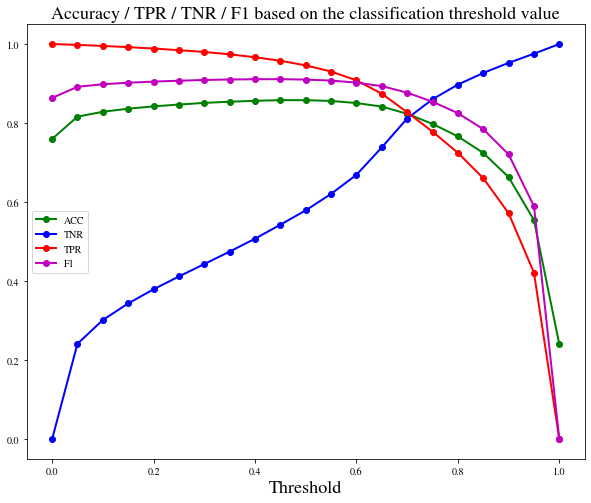

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 189964


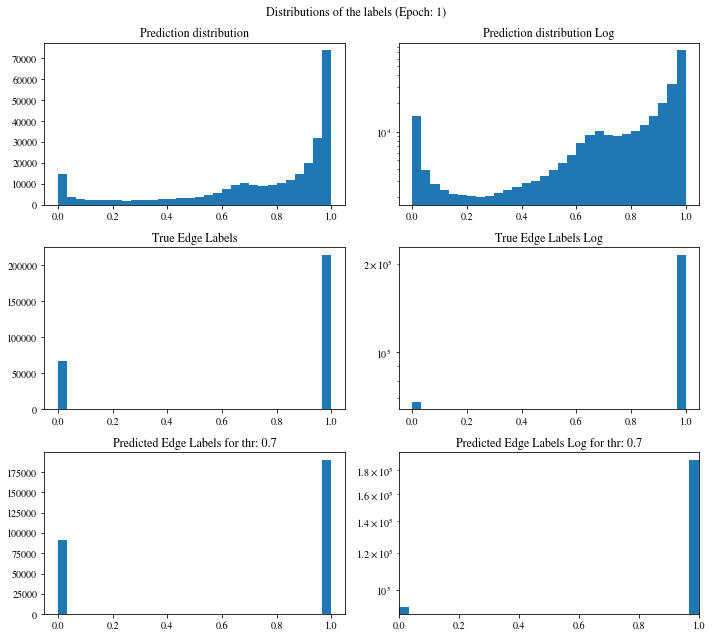

[0.85795468 0.0350404  0.79179156 ... 0.86318785 0.85495055 0.86163563]
Confusion matrix:
[[ 54948  12752]
 [ 36955 177212]]

Confusion matrix weighted:
[[0.40581979 0.09418021]
 [0.08627613 0.41372387]]

TN: 54948 	 FN: 36955 	 TP: 177212 	 FP: 12752
Confusion matrix scaled:
[[0.19494301 0.0452412 ]
 [0.13110793 0.62870787]]

Accuracy: 0.8237
Precision: 0.9329
Negative predictive value: 0.5979
Recall: Correctly classifying 82.7448 % of positive edges
True negative rate: Correctly classifying 81.1640 % of all negative edges
F1 score: 0.8770
[0.82467619 0.81457088] [0.81163959 0.82744774] [0.81810596 0.82095882]
Balanced accuracy: 0.8195
Precision weighted: [0.82467619 0.81457088]
Recall weighted: [0.81163959 0.82744774]
F1 score weighted: [0.81810596 0.82095882]
positive_likelihood_ratio: 4.392896169705955, negative_likelihood_ratio: 0.2125971471920663


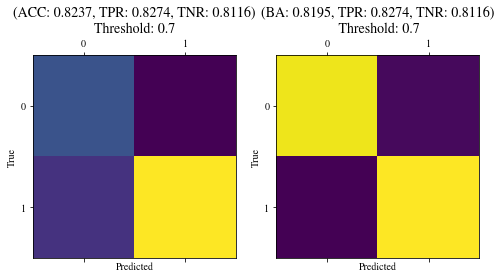

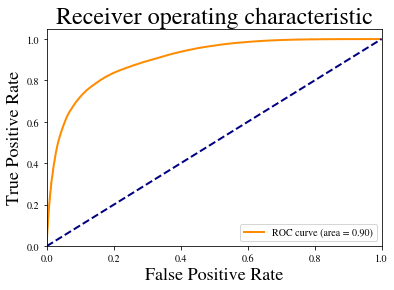

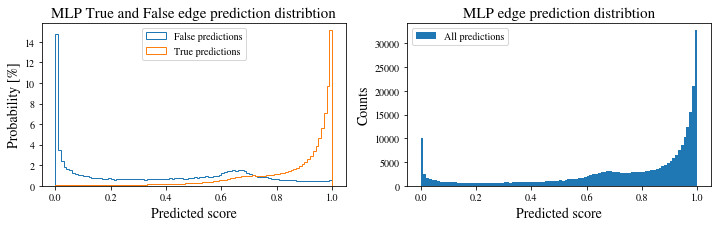

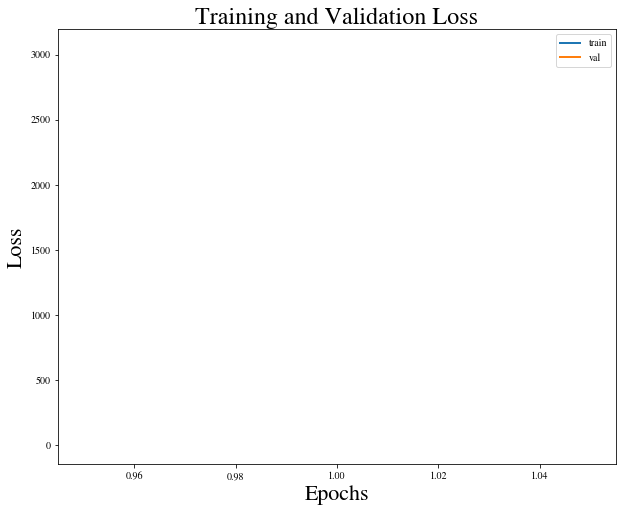

Training epoch 2: 100%|██████████| 12079/12079 [06:38<00:00, 30.30it/s]


Epoch: 2, train loss: 2936.8669
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_2_loss_2936.8669.pt
Epoch: 2, val loss: 0.2879


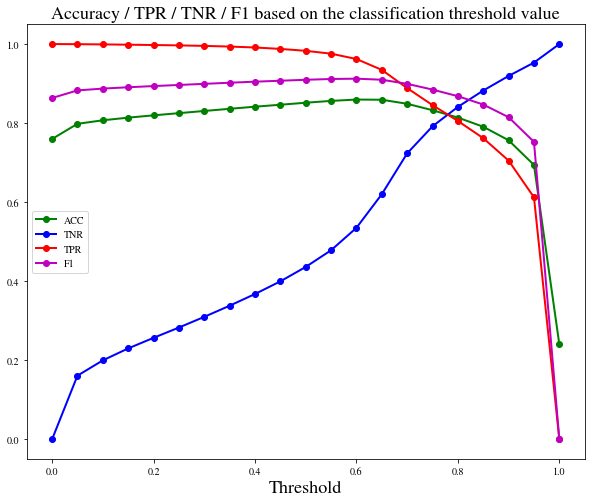

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 189149


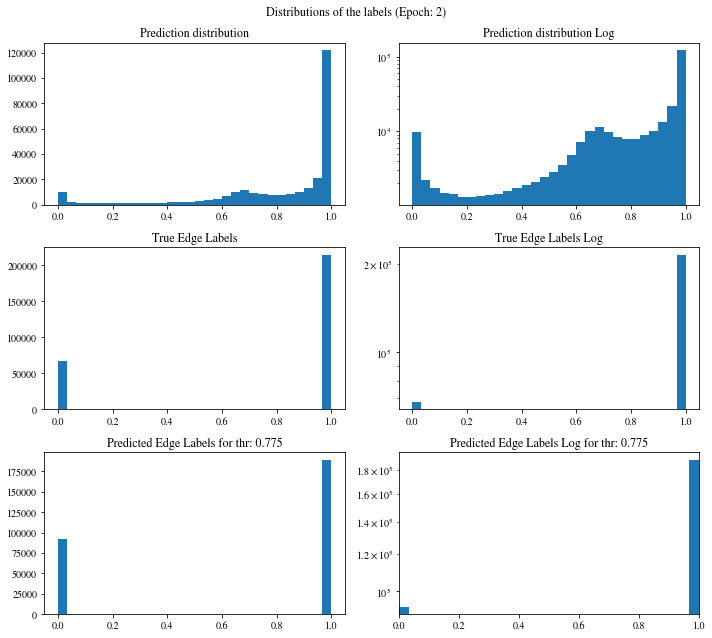

[0.9972083  0.99514127 0.99442947 ... 0.96597266 0.02843162 0.05646696]
Confusion matrix:
[[ 55374  12326]
 [ 37344 176823]]

Confusion matrix weighted:
[[0.40896603 0.09103397]
 [0.0871843  0.4128157 ]]

TN: 55374 	 FN: 37344 	 TP: 176823 	 FP: 12326
Confusion matrix scaled:
[[0.19645436 0.04372984]
 [0.13248802 0.62732778]]

Accuracy: 0.8238
Precision: 0.9348
Negative predictive value: 0.5972
Recall: Correctly classifying 82.5631 % of positive edges
True negative rate: Correctly classifying 81.7932 % of all negative edges
F1 score: 0.8768
[0.82427846 0.81932315] [0.81793205 0.8256314 ] [0.82109299 0.82246518]
Balanced accuracy: 0.8218
Precision weighted: [0.82427846 0.81932315]
Recall weighted: [0.81793205 0.8256314 ]
F1 score weighted: [0.82109299 0.82246518]
positive_likelihood_ratio: 4.534743287859358, negative_likelihood_ratio: 0.21318225582124373


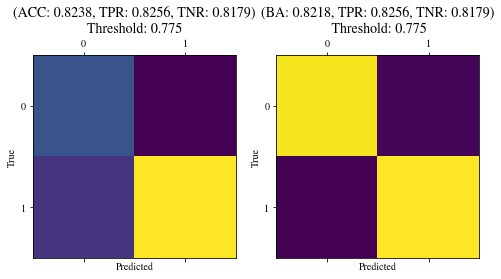

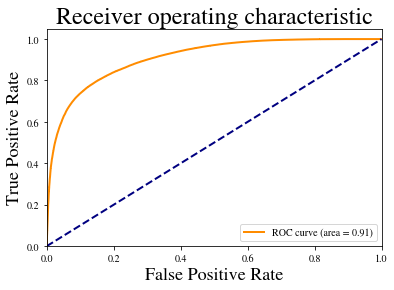

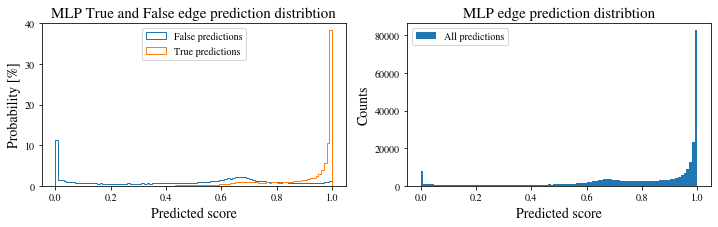

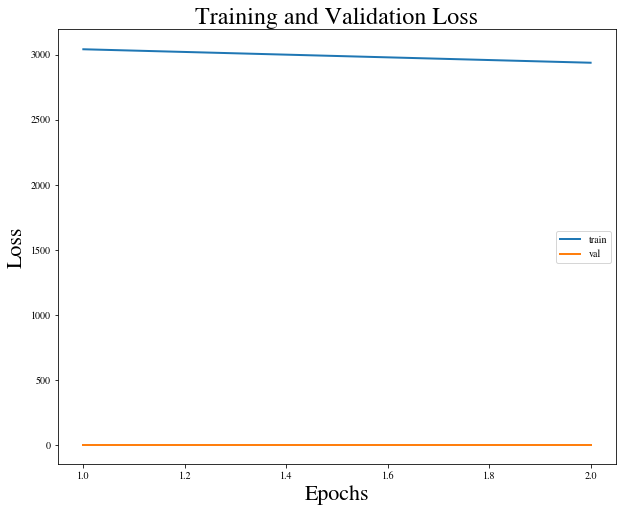

Training epoch 3: 100%|██████████| 12079/12079 [06:46<00:00, 29.73it/s]


Epoch: 3, train loss: 2887.9668
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_3_loss_2887.9668.pt
Epoch: 3, val loss: 0.2724


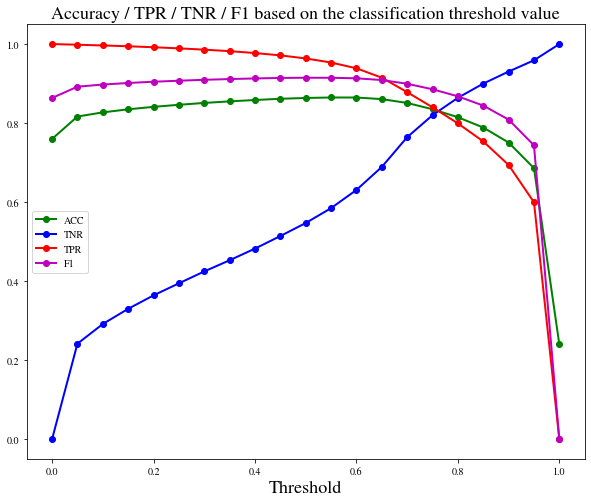

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192083


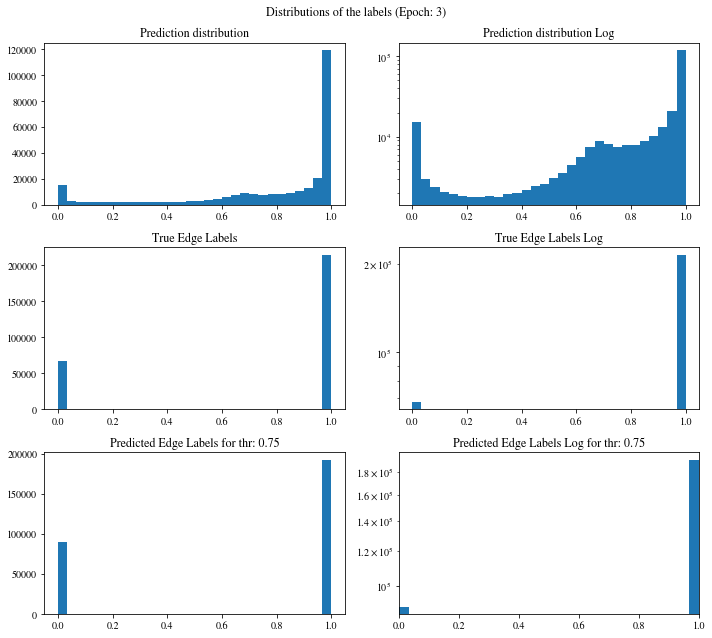

[0.09380064 0.19796965 0.81211007 ... 0.99075294 0.98547965 0.9815532 ]
Confusion matrix:
[[ 55513  12187]
 [ 34271 179896]]

Confusion matrix weighted:
[[0.40999261 0.09000739]
 [0.08000999 0.41999001]]

TN: 55513 	 FN: 34271 	 TP: 179896 	 FP: 12187
Confusion matrix scaled:
[[0.1969475  0.0432367 ]
 [0.12158571 0.63823009]]

Accuracy: 0.8352
Precision: 0.9366
Negative predictive value: 0.6183
Recall: Correctly classifying 83.9980 % of positive edges
True negative rate: Correctly classifying 81.9985 % of all negative edges
F1 score: 0.8856
[0.83671517 0.82351403] [0.81998523 0.83998002] [0.82826573 0.83166553]
Balanced accuracy: 0.8300
Precision weighted: [0.83671517 0.82351403]
Recall weighted: [0.81998523 0.83998002]
F1 score weighted: [0.82826573 0.83166553]
positive_likelihood_ratio: 4.666172729613707, negative_likelihood_ratio: 0.19514983777129236


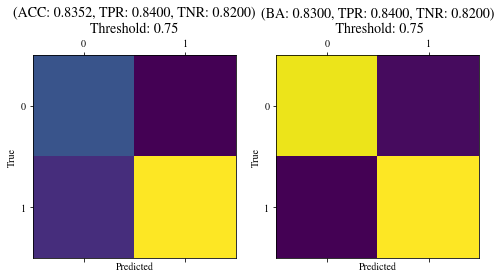

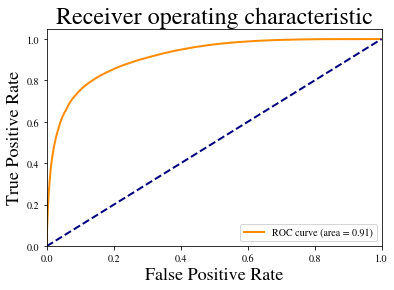

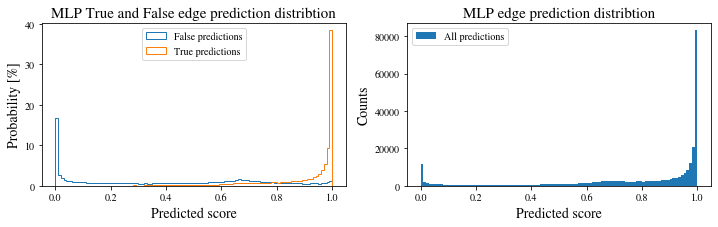

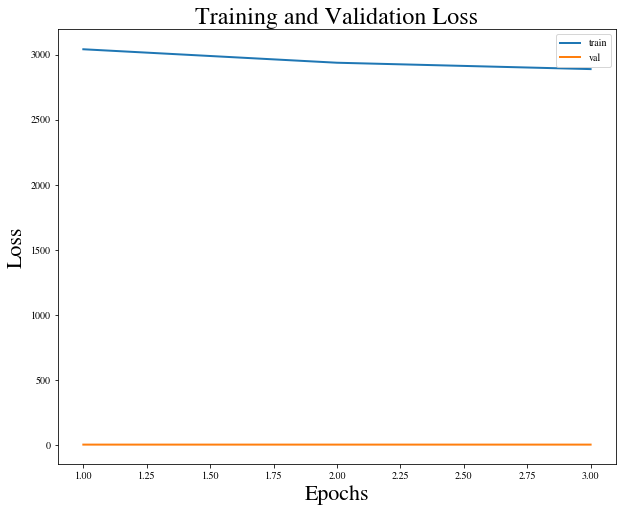

Training epoch 4: 100%|██████████| 12079/12079 [06:41<00:00, 30.11it/s]


Epoch: 4, train loss: 2821.5515
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_4_loss_2821.5515.pt
Epoch: 4, val loss: 0.2963


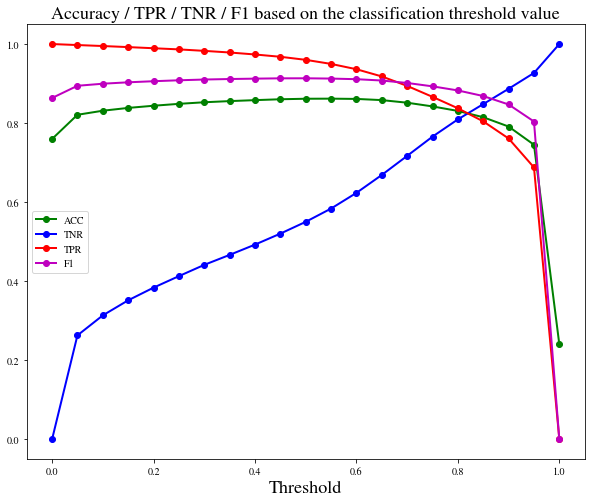

Chosen classification threshold is: 0.825
Edge labels: number of positive: 214167
Predictions: number of positive: 187646


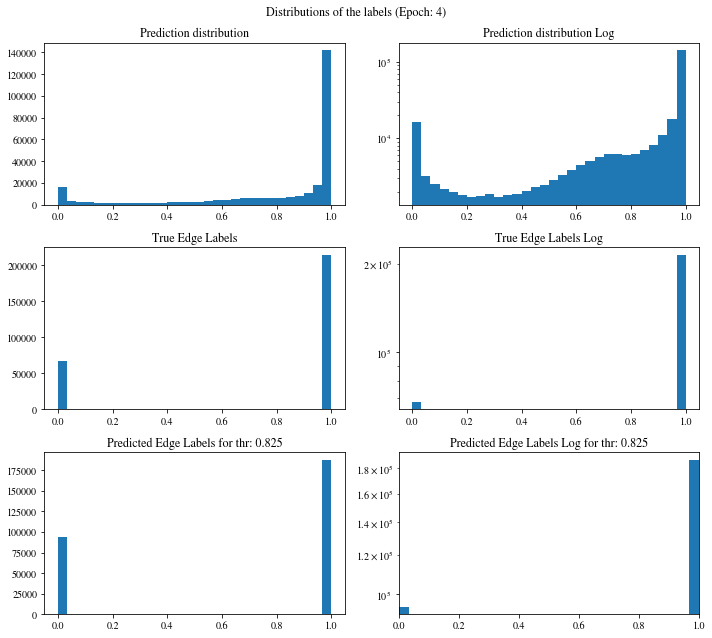

[0.99938941 0.9920581  0.97894156 ... 0.99139142 0.99462777 0.98579758]
Confusion matrix:
[[ 56088  11612]
 [ 38133 176034]]

Confusion matrix weighted:
[[0.41423929 0.08576071]
 [0.08902632 0.41097368]]

TN: 56088 	 FN: 38133 	 TP: 176034 	 FP: 11612
Confusion matrix scaled:
[[0.19898747 0.04119673]
 [0.13528721 0.62452859]]

Accuracy: 0.8235
Precision: 0.9381
Negative predictive value: 0.5953
Recall: Correctly classifying 82.1947 % of positive edges
True negative rate: Correctly classifying 82.8479 % of all negative edges
F1 score: 0.8762
[0.82310271 0.82735097] [0.82847858 0.82194736] [0.8257819  0.82464031]
Balanced accuracy: 0.8252
Precision weighted: [0.82310271 0.82735097]
Recall weighted: [0.82847858 0.82194736]
F1 score weighted: [0.8257819  0.82464031]
positive_likelihood_ratio: 4.79209750200233, negative_likelihood_ratio: 0.21491520123286512


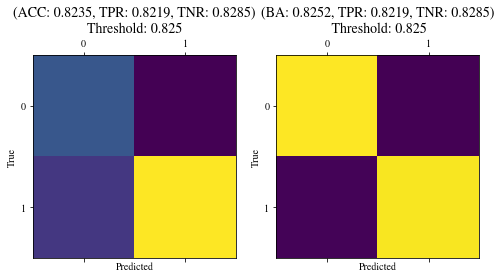

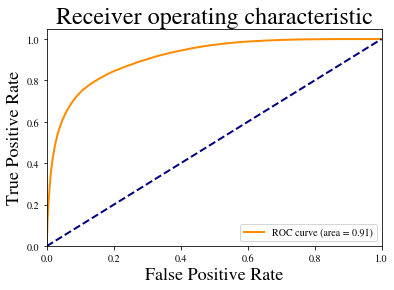

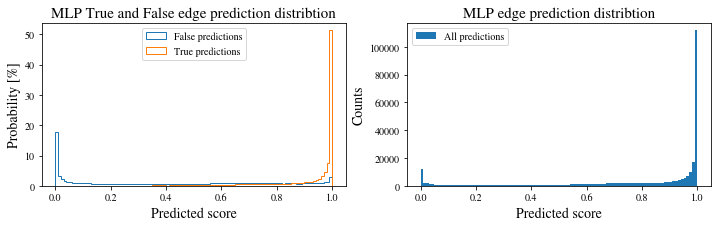

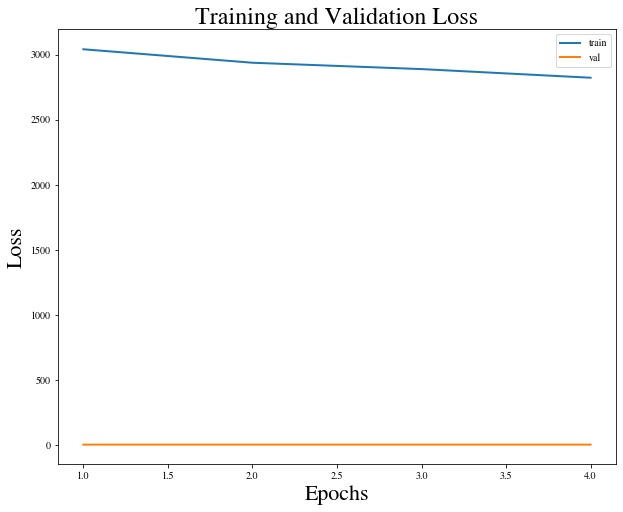

Training epoch 5: 100%|██████████| 12079/12079 [06:37<00:00, 30.39it/s]


Epoch: 5, train loss: 2789.1638
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_5_loss_2789.1638.pt
Epoch: 5, val loss: 0.2652


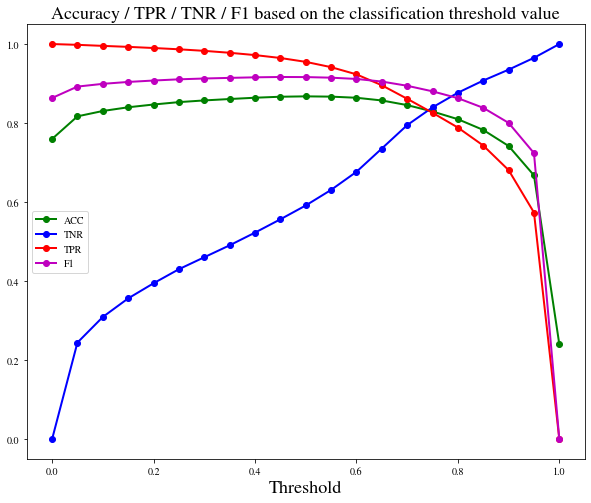

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 187778


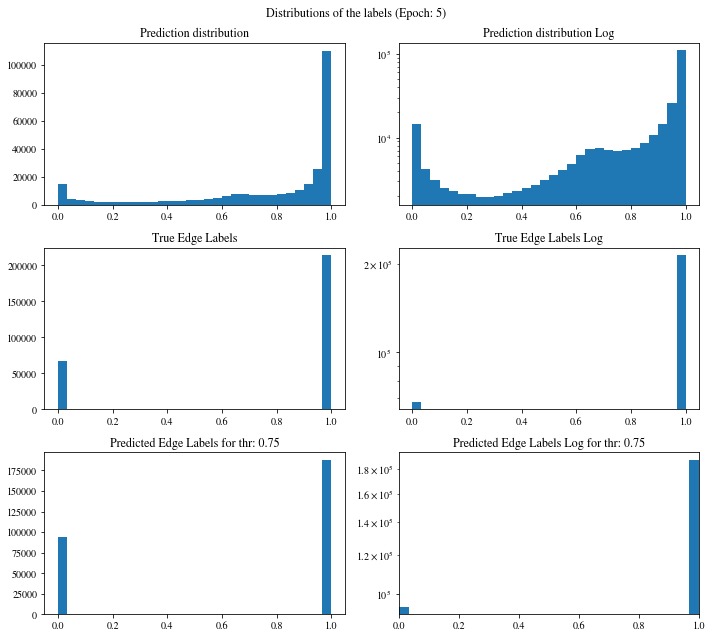

[0.99947745 0.99908352 0.99493092 ... 0.99166203 0.98249429 0.48198816]
Confusion matrix:
[[ 56859  10841]
 [ 37230 176937]]

Confusion matrix weighted:
[[0.41993353 0.08006647]
 [0.08691815 0.41308185]]

TN: 56859 	 FN: 37230 	 TP: 176937 	 FP: 10841
Confusion matrix scaled:
[[0.2017228  0.0384614 ]
 [0.13208357 0.62773223]]

Accuracy: 0.8295
Precision: 0.9423
Negative predictive value: 0.6043
Recall: Correctly classifying 82.6164 % of positive edges
True negative rate: Correctly classifying 83.9867 % of all negative edges
F1 score: 0.8804
[0.82851364 0.83764221] [0.83986706 0.82616369] [0.83415172 0.83186336]
Balanced accuracy: 0.8330
Precision weighted: [0.82851364 0.83764221]
Recall weighted: [0.83986706 0.82616369]
F1 score weighted: [0.83415172 0.83186336]
positive_likelihood_ratio: 5.15923642932388, negative_likelihood_ratio: 0.20698073954342872


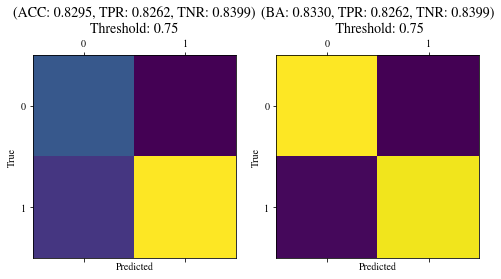

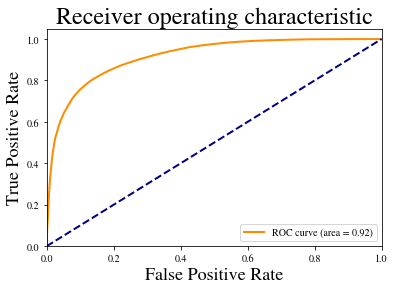

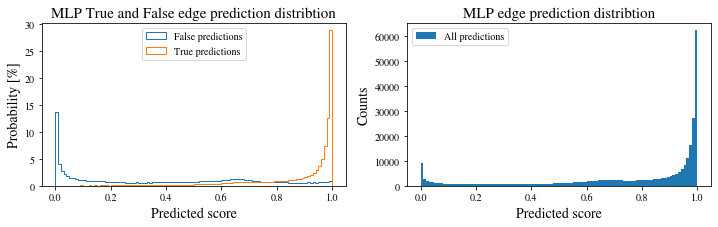

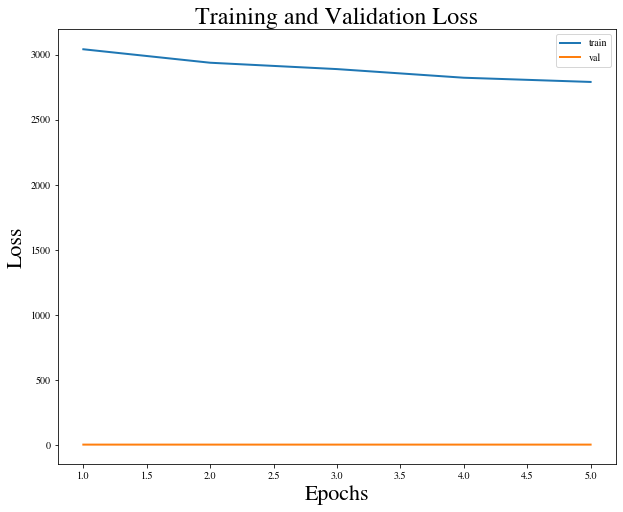

Training epoch 6: 100%|██████████| 12079/12079 [06:29<00:00, 30.98it/s]


Epoch: 6, train loss: 2760.8896
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_6_loss_2760.8896.pt


Training epoch 8: 100%|██████████| 12079/12079 [06:35<00:00, 30.51it/s]


Epoch: 8, train loss: 2713.2876
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_8_loss_2713.2876.pt
Epoch: 8, val loss: 0.2577


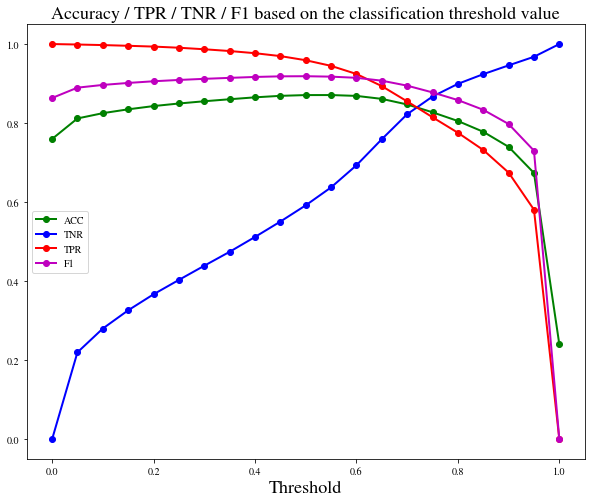

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 189158


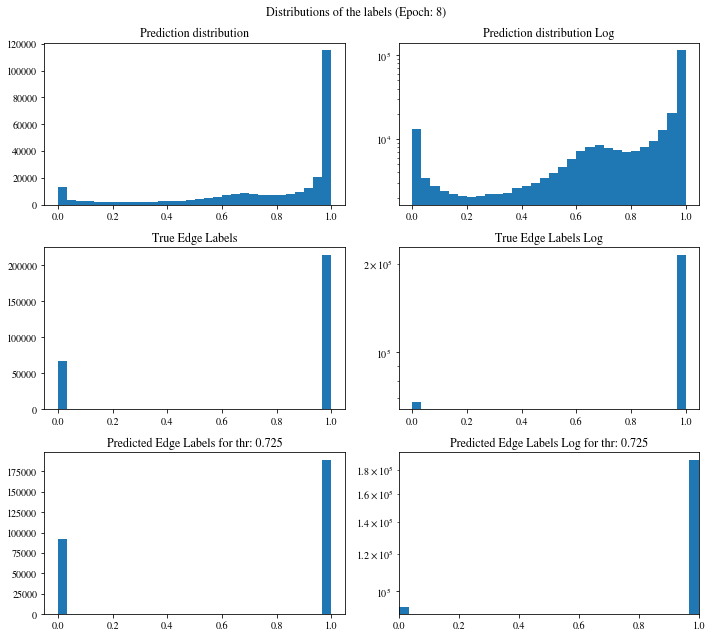

[0.99738616 0.98858285 0.99450535 ... 0.63205659 0.7436747  0.67784464]
Confusion matrix:
[[ 57389  10311]
 [ 35320 178847]]

Confusion matrix weighted:
[[0.42384786 0.07615214]
 [0.08245902 0.41754098]]

TN: 57389 	 FN: 35320 	 TP: 178847 	 FP: 10311
Confusion matrix scaled:
[[0.20360312 0.03658108]
 [0.12530733 0.63450847]]

Accuracy: 0.8381
Precision: 0.9455
Negative predictive value: 0.6190
Recall: Correctly classifying 83.5082 % of positive edges
True negative rate: Correctly classifying 84.7696 % of all negative edges
F1 score: 0.8869
[0.83713629 0.84575005] [0.84769572 0.83508197] [0.84238291 0.84038215]
Balanced accuracy: 0.8414
Precision weighted: [0.83713629 0.84575005]
Recall weighted: [0.84769572 0.83508197]
F1 score weighted: [0.84238291 0.84038215]
positive_likelihood_ratio: 5.482984122196682, negative_likelihood_ratio: 0.19454861935266365


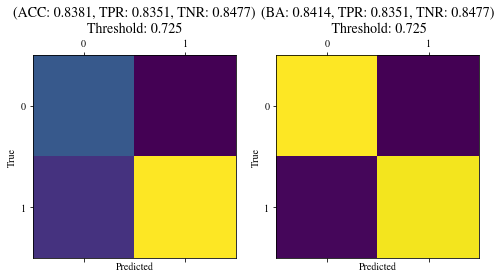

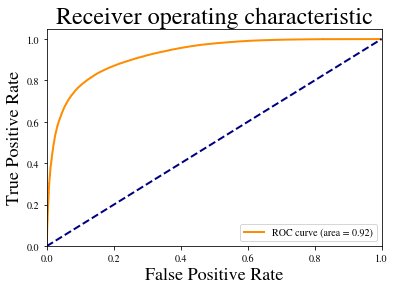

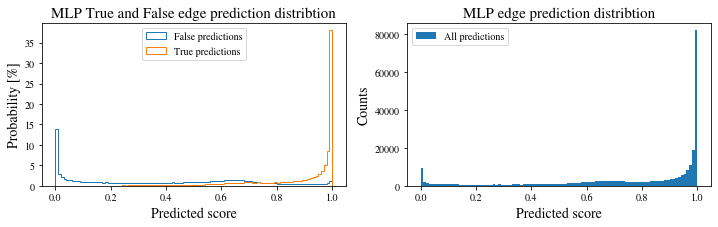

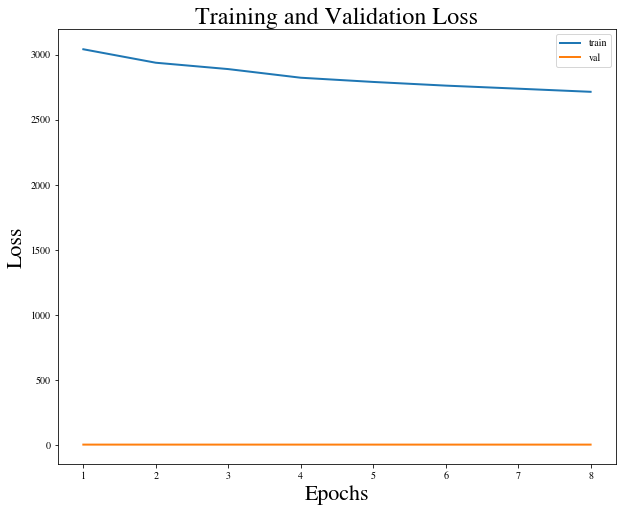

Training epoch 9:  55%|█████▌    | 6701/12079 [03:37<03:08, 28.60it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 11: 100%|██████████| 12079/12079 [06:32<00:00, 30.75it/s]


Epoch: 11, train loss: 2652.7659
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_11_loss_2652.7659.pt
Epoch: 11, val loss: 0.2498


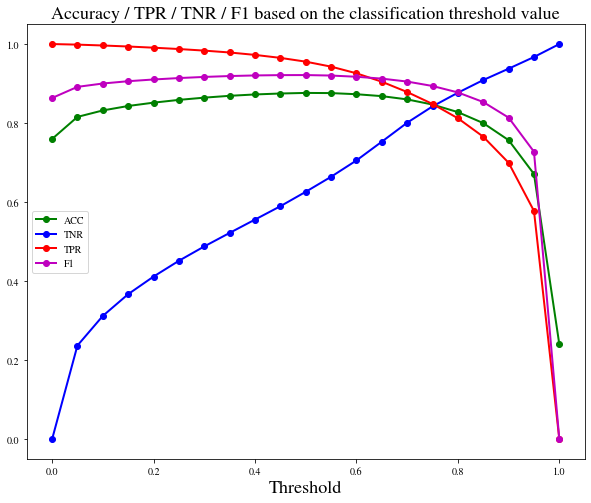

Chosen classification threshold is: 0.75
Edge labels: number of positive: 214167
Predictions: number of positive: 192390


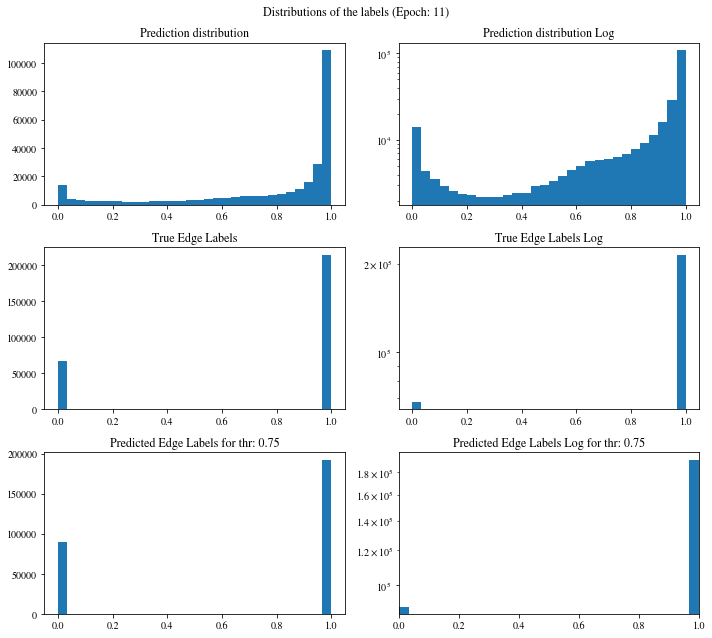

[0.99687648 0.99013454 0.99372476 ... 0.92822653 0.92141885 0.88775712]
Confusion matrix:
[[ 57024  10676]
 [ 32453 181714]]

Confusion matrix weighted:
[[0.42115214 0.07884786]
 [0.07576564 0.42423436]]

TN: 57024 	 FN: 32453 	 TP: 181714 	 FP: 10676
Confusion matrix scaled:
[[0.20230818 0.03787602]
 [0.11513586 0.64467994]]

Accuracy: 0.8470
Precision: 0.9445
Negative predictive value: 0.6373
Recall: Correctly classifying 84.8469 % of positive edges
True negative rate: Correctly classifying 84.2304 % of all negative edges
F1 score: 0.8939
[0.84752882 0.84327043] [0.84230428 0.84846872] [0.84490848 0.84586159]
Balanced accuracy: 0.8454
Precision weighted: [0.84752882 0.84327043]
Recall weighted: [0.84230428 0.84846872]
F1 score weighted: [0.84490848 0.84586159]
positive_likelihood_ratio: 5.380417031789952, negative_likelihood_ratio: 0.17990087978062705


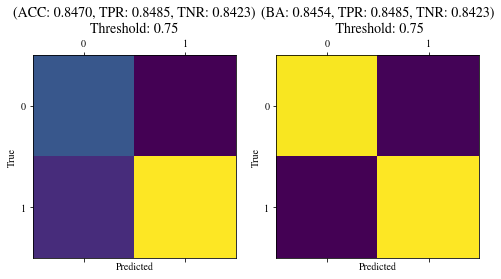

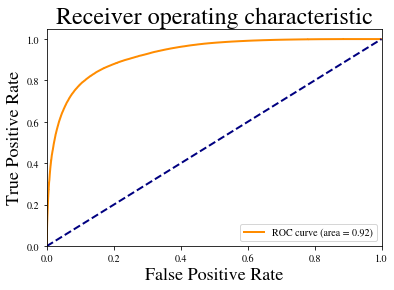

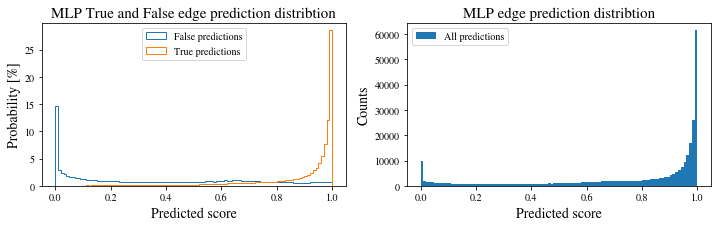

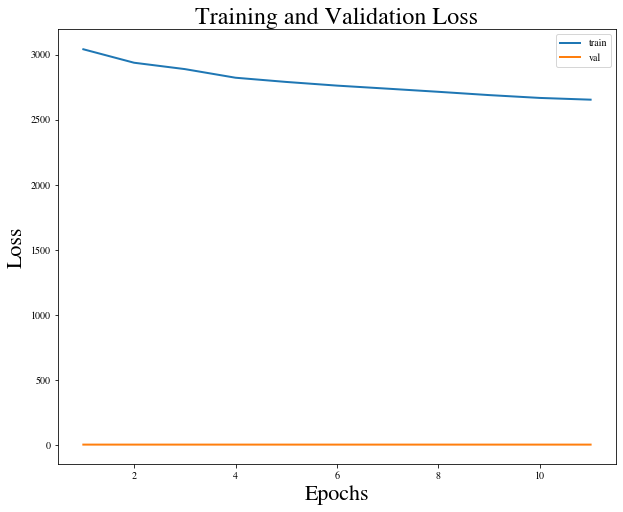

Training epoch 12:  17%|█▋        | 2063/12079 [01:06<05:29, 30.39it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 13: 100%|██████████| 12079/12079 [06:36<00:00, 30.47it/s]


Epoch: 13, train loss: 2621.3826
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_13_loss_2621.3826.pt
Epoch: 13, val loss: 0.2547


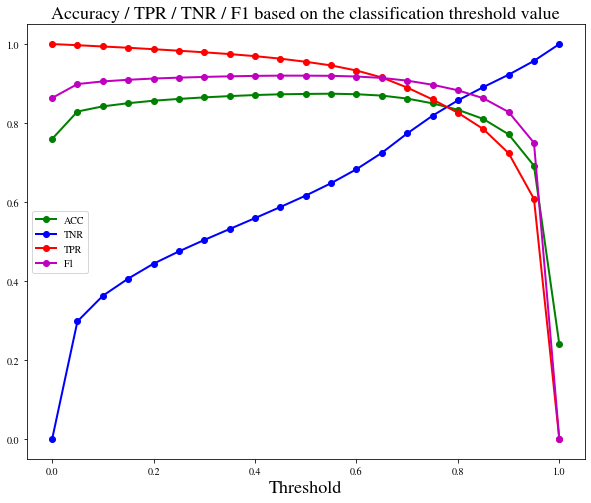

Chosen classification threshold is: 0.775
Edge labels: number of positive: 214167
Predictions: number of positive: 191544


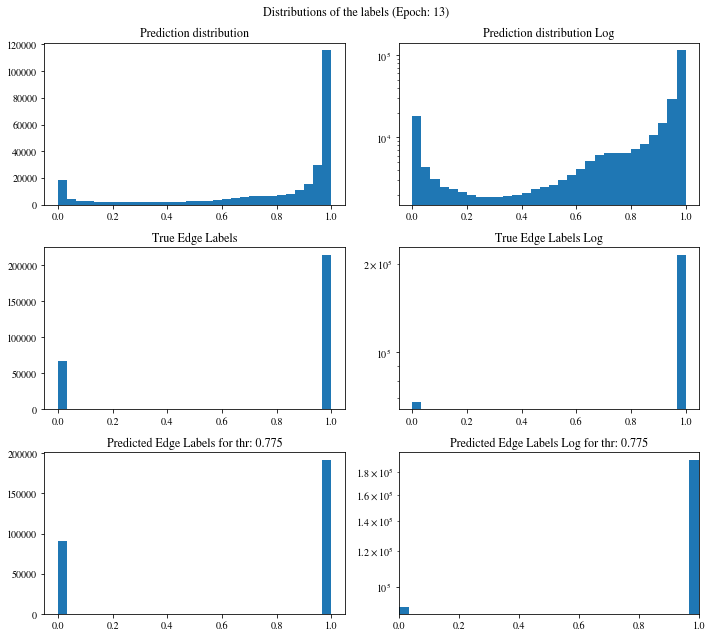

[0.99389631 0.97112525 0.99486887 ... 0.9772594  0.99263012 0.99215806]
Confusion matrix:
[[ 56835  10865]
 [ 33488 180679]]

Confusion matrix weighted:
[[0.41975628 0.08024372]
 [0.07818198 0.42181802]]

TN: 56835 	 FN: 33488 	 TP: 180679 	 FP: 10865
Confusion matrix scaled:
[[0.20163765 0.03854655]
 [0.11880781 0.64100799]]

Accuracy: 0.8426
Precision: 0.9433
Negative predictive value: 0.6292
Recall: Correctly classifying 84.3636 % of positive edges
True negative rate: Correctly classifying 83.9513 % of all negative edges
F1 score: 0.8907
[0.84298861 0.84017161] [0.83951256 0.84363604] [0.84124699 0.84190026]
Balanced accuracy: 0.8416
Precision weighted: [0.84298861 0.84017161]
Recall weighted: [0.83951256 0.84363604]
F1 score weighted: [0.84124699 0.84190026]
positive_likelihood_ratio: 5.25671053639771, negative_likelihood_ratio: 0.18625565271468067


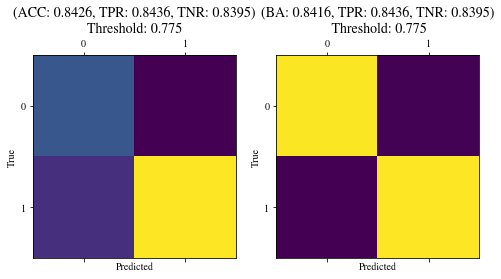

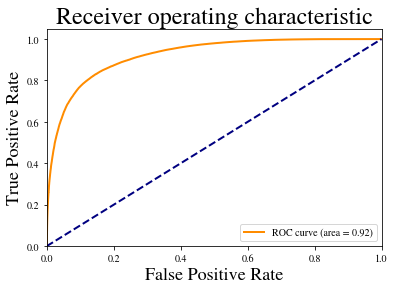

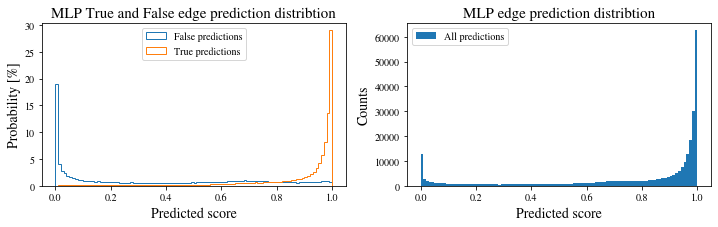

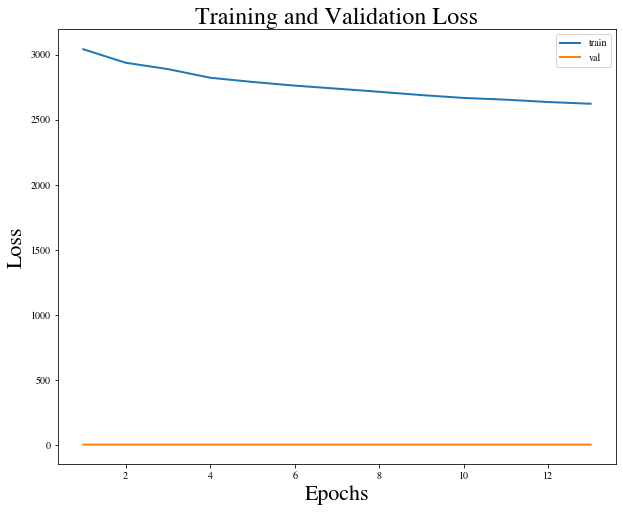

Training epoch 14:  62%|██████▏   | 7445/12079 [04:02<02:45, 28.00it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 16: 100%|██████████| 12079/12079 [06:33<00:00, 30.73it/s]


Epoch: 16, train loss: 2599.8479
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2/model_epoch_16_loss_2599.8479.pt
Epoch: 16, val loss: 0.2525


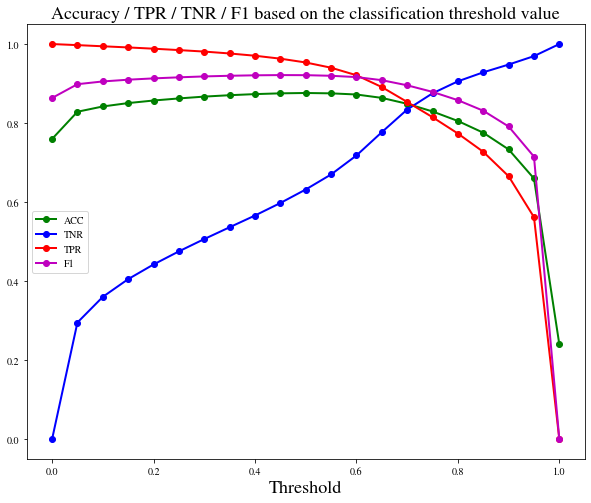

Chosen classification threshold is: 0.7
Edge labels: number of positive: 214167
Predictions: number of positive: 194013


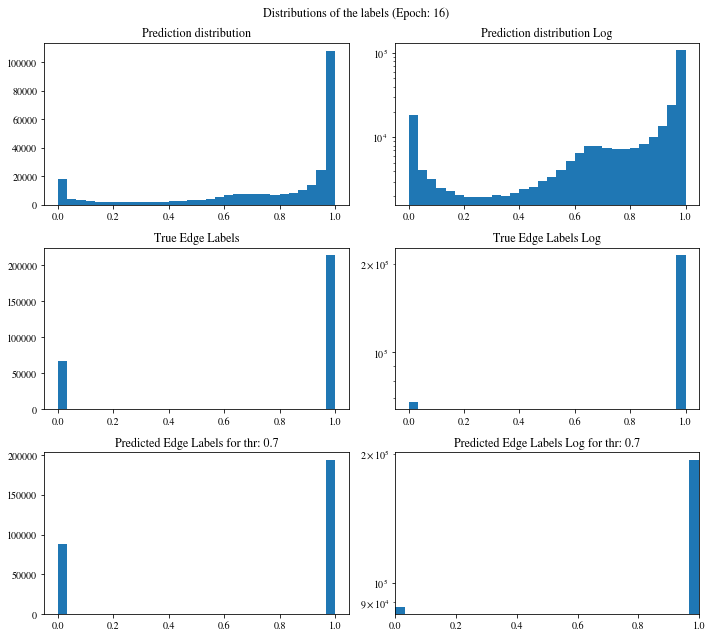

[7.48949409e-01 7.29756057e-01 6.23380840e-01 ... 8.42315316e-01
 5.05337084e-05 6.99277580e-01]
Confusion matrix:
[[ 56483  11217]
 [ 31371 182796]]

Confusion matrix weighted:
[[0.41715657 0.08284343]
 [0.07323957 0.42676043]]

TN: 56483 	 FN: 31371 	 TP: 182796 	 FP: 11217
Confusion matrix scaled:
[[0.20038884 0.03979536]
 [0.11129717 0.64851863]]

Accuracy: 0.8489
Precision: 0.9422
Negative predictive value: 0.6429
Recall: Correctly classifying 85.3521 % of positive edges
True negative rate: Correctly classifying 83.4313 % of all negative edges
F1 score: 0.8957
[0.85065222 0.83743563] [0.83431315 0.85352085] [0.84240346 0.84540174]
Balanced accuracy: 0.8439
Precision weighted: [0.85065222 0.83743563]
Recall weighted: [0.83431315 0.85352085]
F1 score weighted: [0.84240346 0.84540174]
positive_likelihood_ratio: 5.151409608836285, negative_likelihood_ratio: 0.1755685501422268


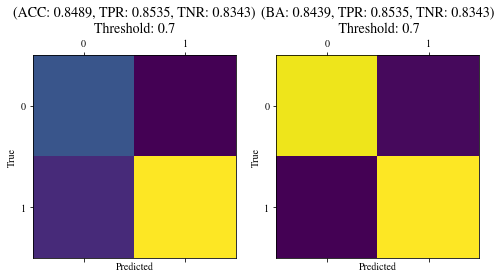

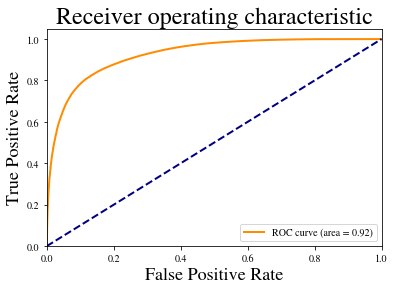

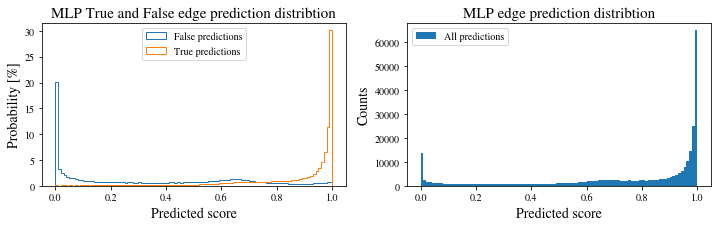

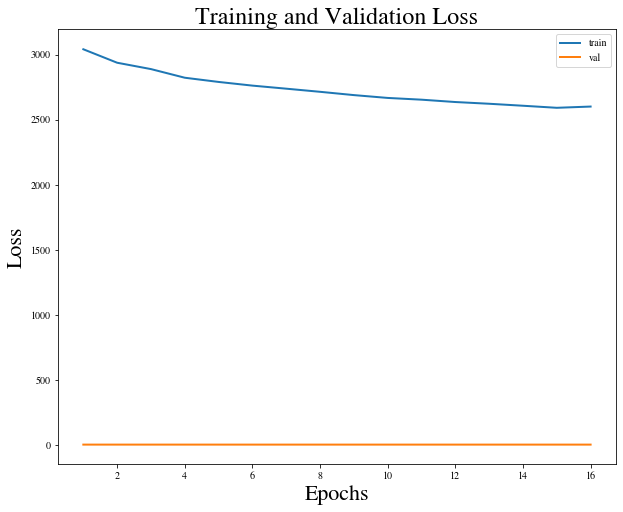

Training epoch 17:  24%|██▍       | 2912/12079 [01:36<04:11, 36.40it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training epoch 17:  86%|████████▋ | 10426/12079 [05:43<00:54, 30.46it/s]

Epoch: 17, val loss: 0.2503


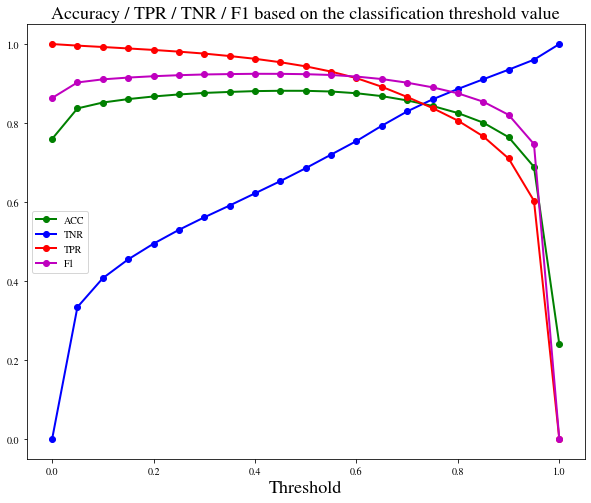

Chosen classification threshold is: 0.725
Edge labels: number of positive: 214167
Predictions: number of positive: 193025


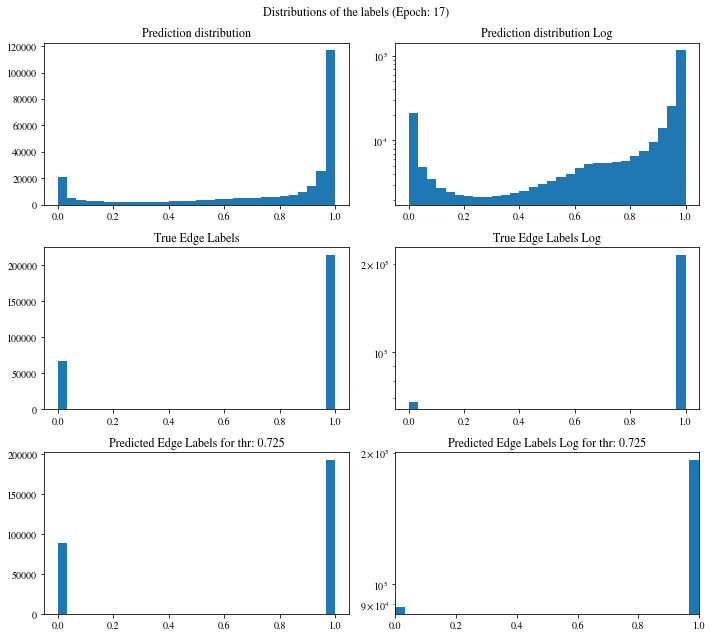

[0.16024749 0.28691313 0.9298147  ... 0.93857837 0.01139805 0.97276402]
Confusion matrix:
[[ 57224  10476]
 [ 31618 182549]]

Confusion matrix weighted:
[[0.42262925 0.07737075]
 [0.07381623 0.42618377]]

TN: 57224 	 FN: 31618 	 TP: 182549 	 FP: 10476
Confusion matrix scaled:
[[0.20301774 0.03716647]
 [0.11217347 0.64764233]]

Accuracy: 0.8507
Precision: 0.9457
Negative predictive value: 0.6441
Recall: Correctly classifying 85.2368 % of positive edges
True negative rate: Correctly classifying 84.5258 % of all negative edges
F1 score: 0.8966
[0.8513105  0.84635079] [0.84525849 0.85236754] [0.8482737  0.84934851]
Balanced accuracy: 0.8488
Precision weighted: [0.8513105  0.84635079]
Recall weighted: [0.84525849 0.85236754]
F1 score weighted: [0.8482737  0.84934851]
positive_likelihood_ratio: 5.508331690849005, negative_likelihood_ratio: 0.17465953457755184


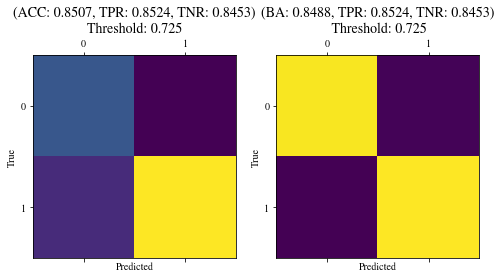

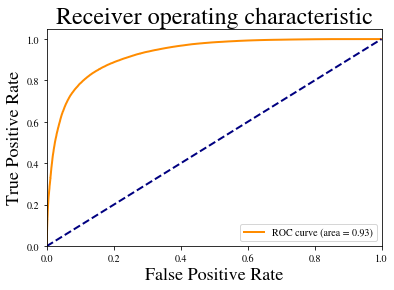

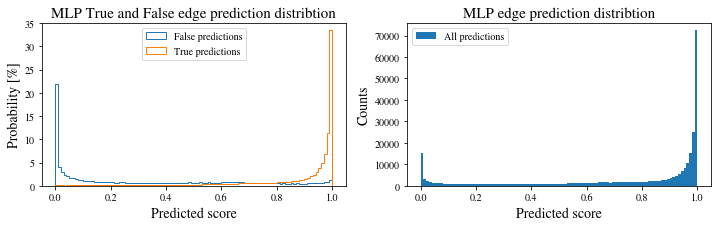

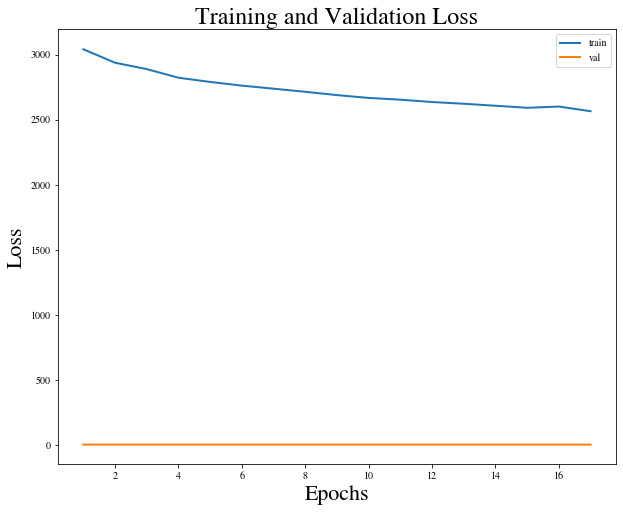

Training epoch 18:  31%|███▏      | 3778/12079 [02:03<04:05, 33.81it/s]

In [ ]:

epochs = 50
decision_th = 0.85
outputModelPath ="/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1.2"
mkdir_p(outputModelPath)
train_loss_hist = []
val_loss_hist = []

for epoch in range(epochs):

    loss = train(model, optimizer, train_dl, epoch+1, device, edge_features=True)
    train_loss_hist.append(loss)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt')
    
    # Validation
    model.eval()
    pred, lab = [], []
    val_loss, j = 0, 0
    for sample in val_dl:
        sample = sample.to(device)
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred,emb, edge_emb = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()
        val_loss += loss_obj(nn_pred, sample.edge_label.float()).item()
        j += 1
        
    val_loss = float(val_loss)/j
    print(f'Epoch: {epoch+1}, val loss: {val_loss:.4f}')
    val_loss_hist.append(val_loss)
    
    TNR, TPR, thresholds = classification_thresholds_plot(np.array(pred), np.array(lab),
                                                          threshold_step=0.05, output_folder=outputModelPath,
                                                          epoch=epoch+1)
    classification_threshold = get_best_threshold(TNR, TPR, thresholds)
    print(f"Chosen classification threshold is: {classification_threshold}")

    plot_prediction_distribution_standard_and_log(np.array(pred), np.array(lab),
                                                  epoch=epoch+1, thr = classification_threshold,
                                                 folder=outputModelPath, val=True)

    test(np.array(lab), np.array(pred), classification_threshold=classification_threshold,
                        output_folder=outputModelPath, epoch=epoch+1)
    save_pred(np.array(pred), np.array(lab), epoch=epoch, out_folder=outputModelPath)
    save_loss(train_loss_hist, val_loss_hist, outputLossFunctionPath=outputModelPath)

    scheduler.step()     

In [24]:
#old test
epochs = 50
decision_th = 0.85

outputModelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1"
mkdir_p(outputModelPath)

for epoch in range(epochs):
    loss = train_reg(model, optimizer, train_dl, epoch+1, device, edge_features=True,reg = "L1")
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, outputModelPath + "/model.pt")
        
    # Validation
    pred, lab = [], []
    for sample in val_dl:
        sample = sample.to(device)
        
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred, data = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()

    test(np.array(lab), np.array(pred), classification_threshold = decision_th)
    
    scheduler.step()

Training epoch 1:  42%|████▏     | 5038/12079 [03:07<04:22, 26.85it/s]


KeyboardInterrupt: 

In [29]:

def list_flatten(my_list):
    return [item for sublist in my_list for item in sublist]

def save_pred(pred_flat, lab_flat, epoch=0, out_folder=None):
    
    true_pred = pred_flat[lab_flat==1] 
    false_pred = pred_flat[lab_flat!=1]

    bins = 100
    fig = plt.figure(figsize=(12, 3))
    ax1 = fig.add_subplot(121)
    ax1.hist(false_pred, bins=bins, density=1, label="False predictions", histtype='step')
    ax1.hist(true_pred, bins=bins, density=1, label="True predictions", histtype='step')
    ax1.legend(loc="upper center") #loc="upper left")
    #ax1.set_yscale('log')

    ax2 = fig.add_subplot(122)
    ax2.hist(pred_flat, bins=bins, label="All predictions")
    ax2.legend()

    ax1.set_title("MLP True and False edge prediction distribtion", fontsize=15)
    ax1.set_xlabel("Predicted score", fontsize=14)
    ax1.set_ylabel('Probability [%]', fontsize=14)
    ax2.set_title("MLP edge prediction distribtion", fontsize=15)
    ax2.set_xlabel("Predicted score", fontsize=14)
    ax2.set_ylabel('Counts', fontsize=14)
    plt.show()

    if out_folder is not None:
        fig.savefig(f'{out_folder}/double-pion-0-pu-edge-pred-distributions-epoch-{epoch+1}.pdf', dpi=300, bbox_inches='tight', transparent=True)
        fig.savefig(f'{out_folder}/double-pion-0-pu-edge-pred-distributions-eppoch-{epoch+1}.png', dpi=300, bbox_inches='tight', transparent=True)


In [30]:
# loading model
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], hidden_dim=64)
modelFolder = "/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1"
checkpoint = torch.load(modelFolder + 'model.pt', map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
print(f"Model epoch: {checkpoint['epoch']}")
print(">>> Model Loaded.")
model.eval()

/cvmfs/sft.cern.ch/lcg/views/LCG_102cuda/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/torch/nn/init.py:403: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


FileNotFoundError: [Errno 2] No such file or directory: '/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L1model.pt'

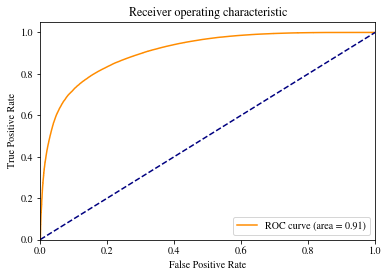

Edge labels: number of positive: 214167
Predictions: number of positive: 224840


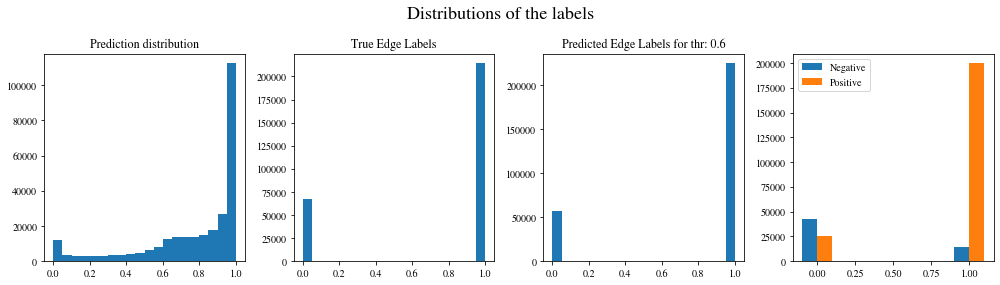

Edge labels: number of positive: 214167
Predictions: number of positive: 176972


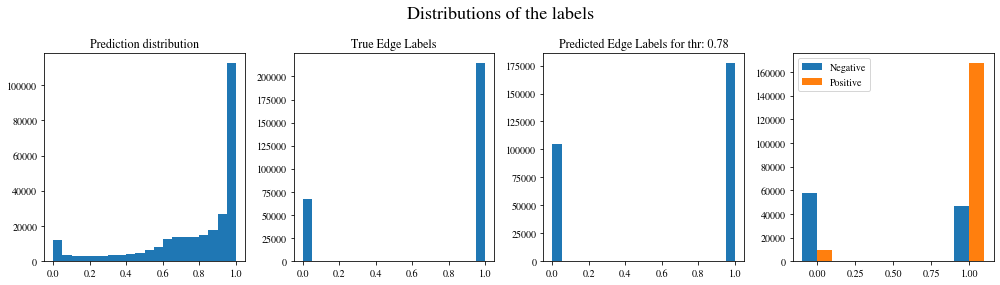

TP: 167331, TN: 58059, FP: 9641, FN: 46836
Acc: 0.7996 P: 0.9455 R: 0.7813 F1: 0.86 FB: 0.91
---------------------------
[0.99629802 0.99307418 0.99133706 ... 0.46122089 0.40398937 0.88087171]
Confusion matrix:
[[ 58059   9641]
 [ 46836 167331]]

Confusion matrix weighted:
[[0.42879616 0.07120384]
 [0.10934458 0.39065542]]

TN: 58059 	 FN: 46836 	 TP: 167331 	 FP: 9641
Confusion matrix scaled:
[[0.20598013 0.03420407]
 [0.16616347 0.59365233]]

Accuracy: 0.7996
Precision: 0.9455
Negative predictive value: 0.5535
Recall: Correctly classifying 78.1311 % of positive edges
True negative rate: Correctly classifying 85.7592 % of all negative edges
F1 score: 0.8556
[0.79681044 0.84583217] [0.85759232 0.78131085] [0.82608484 0.81229227]
Balanced accuracy: 0.8195
Precision weighted: [0.79681044 0.84583217]
Recall weighted: [0.85759232 0.78131085]
F1 score weighted: [0.82608484 0.81229227]
positive_likelihood_ratio: 5.486437536389974, negative_likelihood_ratio: 0.25500362926788717


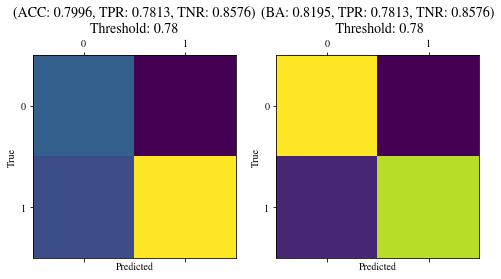

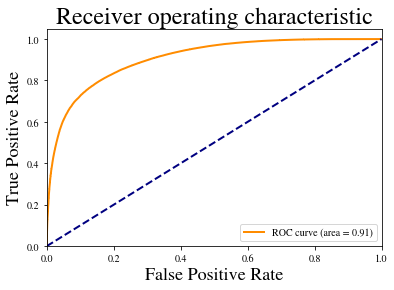

{'F1': 0.8556088756171079,
 'BA': 0.8194515826317262,
 'TPR': 0.7813108462087996,
 'TNR': 0.8575923190546528,
 'PPV': 0.9455224555296883,
 'NPV': 0.5534963534963535,
 'FPR': 0.14240768094534711,
 'FNR': 0.21868915379120032,
 'FDR': 0.05447754447031169,
 'TN': 58059,
 'FP': 9641,
 'FN': 46836,
 'TP': 167331,
 'ACC': 0.7996324507657867,
 'cf_matrix': array([[ 58059,   9641],
        [ 46836, 167331]]),
 'scores': array([0.99629802, 0.99307418, 0.99133706, ..., 0.46122089, 0.40398937,
        0.88087171]),
 'prediction': array([ True,  True,  True, ..., False, False,  True]),
 'ground_truth': array([1, 1, 1, ..., 1, 1, 1]),
 'classification_threshold': 0.78,
 'ROC_AUC': 0.9054017263919701}

In [70]:
decision_th = 0.78
model.eval()

pred, lab = [], []
for sample in val_dl:
    sample = sample.to(device)
    if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
                continue
    data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
    nn_pred, data = model(*data, device)
    pred += nn_pred.tolist()
    lab += sample.edge_label.tolist()

plot_roc(lab, pred)
plot_pred_distr(lab, pred, decision_th = 0.6)
plot_pred_distr(lab, pred, decision_th = decision_th)

pred_thr = (np.array(pred) > decision_th).astype(int)

tn, fp, fn, tp = confusion_matrix(lab, pred_thr).ravel()
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")
acc = accuracy_score(lab, pred_thr)
precision = precision_score(lab, pred_thr)
recall = recall_score(lab, pred_thr)
f1 = f1_score(lab, pred_thr)
# The F-beta score is the weighted harmonic mean of precision and recall, reaching its optimal value at 1 and its worst value at 0.
fb = fbeta_score(lab, pred_thr, beta=0.5)
print(f'Acc: {acc:.4f} P: {precision:.4f} R: {recall:.4f} F1: {f1:.2f} FB: {fb:.2f}')
print("---------------------------")

test(np.array(lab), np.array(pred), classification_threshold = decision_th)

In [25]:
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=64, weighted_aggr=True)
                               #dropout=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = torch.nn.BCELoss()
#model.apply(weight_init)

Training epoch 1: 100%|██████████| 12079/12079 [07:38<00:00, 26.37it/s]


Epoch: 1, train loss: 4511.0146
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_1_loss_4511.0146.pt
[0.75347066 0.73457408 0.79311258 ... 0.55196685 0.5759989  0.19102579]
Confusion matrix:
[[ 65370   2330]
 [136878  77289]]

Confusion matrix weighted:
[[0.48279173 0.01720827]
 [0.31955904 0.18044096]]

TN: 65370 	 FN: 136878 	 TP: 77289 	 FP: 2330
Confusion matrix scaled:
[[0.23191789 0.00826631]
 [0.48561201 0.27420379]]

Accuracy: 0.5061
Precision: 0.9707
Negative predictive value: 0.3232
Recall: Correctly classifying 36.0882 % of positive edges
True negative rate: Correctly classifying 96.5583 % of all negative edges
F1 score: 0.5262
[0.60172153 0.9129353 ] [0.96558346 0.36088193] [0.74141582 0.51728277]
Balanced accuracy: 0.6632
Precision weighted: [0.60172153 0.9129353 ]
Recall weighted: [0.96558346 0.36088193]
F1 score weighted: [0.74141582 0.51728277]
positive_likelihood_ratio: 10.485710972290667, negative

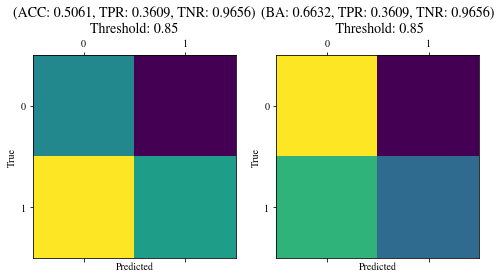

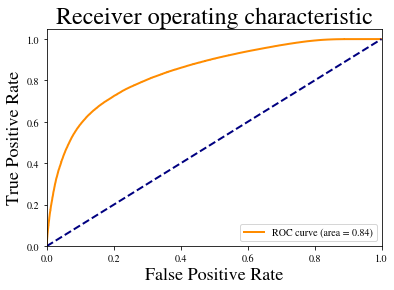

Training epoch 2: 100%|██████████| 12079/12079 [07:43<00:00, 26.08it/s]


Epoch: 2, train loss: 4032.4224
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_2_loss_4032.4224.pt
[0.79815984 0.99575424 0.97089112 ... 0.99345583 0.9872393  0.99826604]
Confusion matrix:
[[ 58546   9154]
 [ 69199 144968]]

Confusion matrix weighted:
[[0.43239291 0.06760709]
 [0.16155383 0.33844617]]

TN: 58546 	 FN: 69199 	 TP: 144968 	 FP: 9154
Confusion matrix scaled:
[[0.20770789 0.03247631]
 [0.24550231 0.51431349]]

Accuracy: 0.7220
Precision: 0.9406
Negative predictive value: 0.4583
Recall: Correctly classifying 67.6892 % of positive edges
True negative rate: Correctly classifying 86.4786 % of all negative edges
F1 score: 0.7873
[0.72799946 0.83350191] [0.86478582 0.67689233] [0.79051912 0.74707786]
Balanced accuracy: 0.7708
Precision weighted: [0.72799946 0.83350191]
Recall weighted: [0.86478582 0.67689233]
F1 score weighted: [0.79051912 0.74707786]
positive_likelihood_ratio: 5.006075033327549, negative_

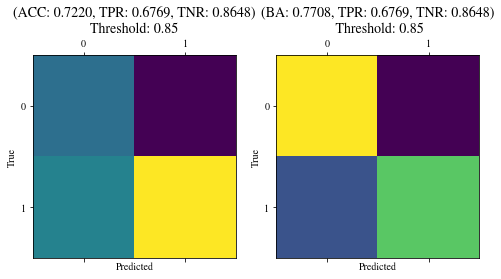

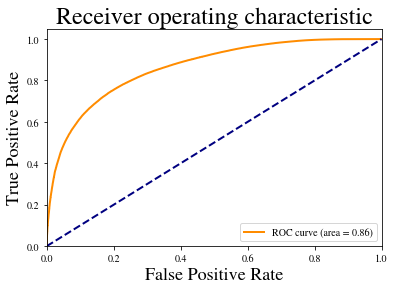

Training epoch 3: 100%|██████████| 12079/12079 [07:44<00:00, 26.00it/s]


Epoch: 3, train loss: 3883.7615
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_3_loss_3883.7615.pt
[0.89175165 0.98315018 0.80670995 ... 0.58691818 0.59748209 0.69873381]
Confusion matrix:
[[ 62945   4755]
 [ 89662 124505]]

Confusion matrix weighted:
[[0.46488183 0.03511817]
 [0.2093273  0.2906727 ]]

TN: 62945 	 FN: 89662 	 TP: 124505 	 FP: 4755
Confusion matrix scaled:
[[0.22331454 0.01686966]
 [0.31810038 0.44171542]]

Accuracy: 0.6650
Precision: 0.9632
Negative predictive value: 0.4125
Recall: Correctly classifying 58.1345 % of positive edges
True negative rate: Correctly classifying 92.9764 % of all negative edges
F1 score: 0.7251
[0.68952171 0.89220641] [0.92976366 0.5813454 ] [0.79182118 0.70398623]
Balanced accuracy: 0.7556
Precision weighted: [0.68952171 0.89220641]
Recall weighted: [0.92976366 0.5813454 ]
F1 score weighted: [0.79182118 0.70398623]
positive_likelihood_ratio: 8.276989167386043, negative_

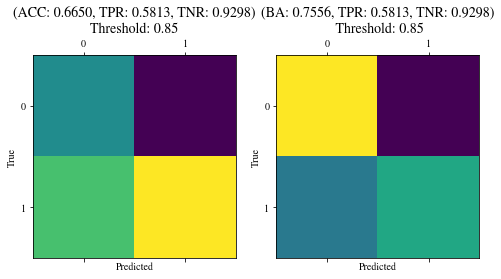

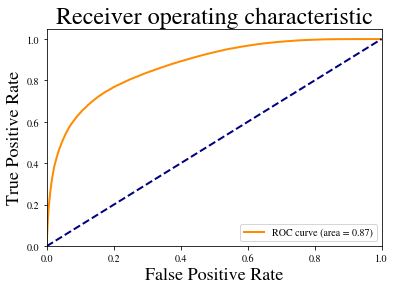

Training epoch 4: 100%|██████████| 12079/12079 [07:37<00:00, 26.37it/s]


Epoch: 4, train loss: 3817.0598
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_4_loss_3817.0598.pt
[0.91501594 0.97058469 0.97432673 ... 0.99530977 0.99865258 0.95077401]
Confusion matrix:
[[ 62322   5378]
 [ 83349 130818]]

Confusion matrix weighted:
[[0.46028065 0.03971935]
 [0.1945888  0.3054112 ]]

TN: 62322 	 FN: 83349 	 TP: 130818 	 FP: 5378
Confusion matrix scaled:
[[0.22110428 0.01907992]
 [0.29570329 0.46411251]]

Accuracy: 0.6852
Precision: 0.9605
Negative predictive value: 0.4278
Recall: Correctly classifying 61.0822 % of positive edges
True negative rate: Correctly classifying 92.0561 % of all negative edges
F1 score: 0.7468
[0.70285864 0.884915  ] [0.9205613 0.6108224] [0.79711287 0.72275508]
Balanced accuracy: 0.7657
Precision weighted: [0.70285864 0.884915  ]
Recall weighted: [0.9205613 0.6108224]
F1 score weighted: [0.79711287 0.72275508]
positive_likelihood_ratio: 7.689229487282478, negative_like

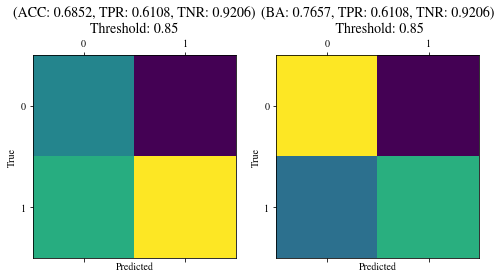

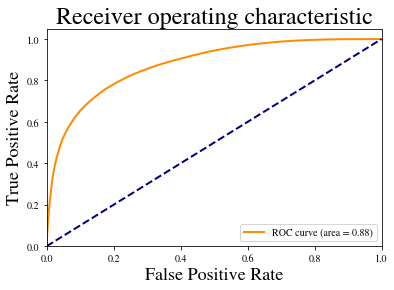

Training epoch 5: 100%|██████████| 12079/12079 [07:45<00:00, 25.97it/s]


Epoch: 5, train loss: 3762.8640
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_5_loss_3762.8640.pt
[0.80922908 0.815409   0.83675319 ... 0.68907386 0.67318112 0.63802779]
Confusion matrix:
[[ 60705   6995]
 [ 69441 144726]]

Confusion matrix weighted:
[[0.44833826 0.05166174]
 [0.16211881 0.33788119]]

TN: 60705 	 FN: 69441 	 TP: 144726 	 FP: 6995
Confusion matrix scaled:
[[0.21536753 0.02481667]
 [0.24636087 0.51345493]]

Accuracy: 0.7288
Precision: 0.9539
Negative predictive value: 0.4664
Recall: Correctly classifying 67.5762 % of positive edges
True negative rate: Correctly classifying 89.6677 % of all negative edges
F1 score: 0.7911
[0.73443044 0.86737856] [0.89667651 0.67576237] [0.80748418 0.7596737 ]
Balanced accuracy: 0.7862
Precision weighted: [0.73443044 0.86737856]
Recall weighted: [0.89667651 0.67576237]
F1 score weighted: [0.80748418 0.7596737 ]
positive_likelihood_ratio: 6.5402591291472545, negative

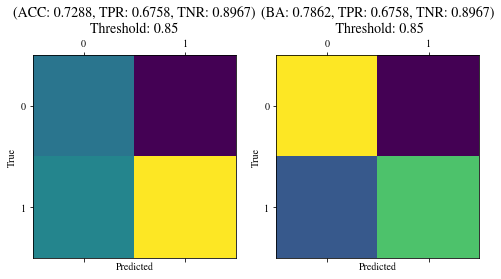

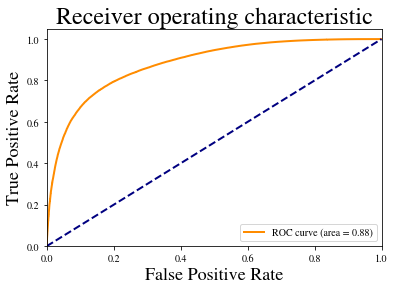

Training epoch 6: 100%|██████████| 12079/12079 [07:43<00:00, 26.04it/s]


Epoch: 6, train loss: 3721.9348
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_6_loss_3721.9348.pt
[0.99704498 0.99384248 0.99186945 ... 0.48219147 0.60594153 0.60791445]
Confusion matrix:
[[ 59790   7910]
 [ 62374 151793]]

Confusion matrix weighted:
[[0.4415805  0.0584195 ]
 [0.14562001 0.35437999]]

TN: 59790 	 FN: 62374 	 TP: 151793 	 FP: 7910
Confusion matrix scaled:
[[0.21212132 0.02806288]
 [0.22128876 0.53852704]]

Accuracy: 0.7506
Precision: 0.9505
Negative predictive value: 0.4894
Recall: Correctly classifying 70.8760 % of positive edges
True negative rate: Correctly classifying 88.3161 % of all negative edges
F1 score: 0.8120
[0.75200974 0.85847972] [0.883161   0.70875999] [0.81232578 0.77646843]
Balanced accuracy: 0.7960
Precision weighted: [0.75200974 0.85847972]
Recall weighted: [0.883161   0.70875999]
F1 score weighted: [0.81232578 0.77646843]
positive_likelihood_ratio: 6.066125294179938, negative_

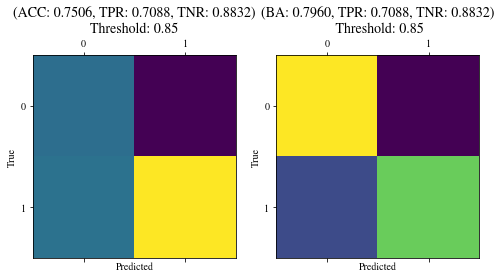

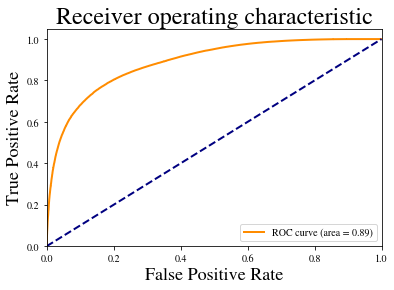

Training epoch 7: 100%|██████████| 12079/12079 [07:58<00:00, 25.23it/s]


Epoch: 7, train loss: 3685.6553
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_7_loss_3685.6553.pt
[0.96371377 0.97216177 0.97899753 ... 0.98392671 0.99160463 0.97204471]
Confusion matrix:
[[ 61797   5903]
 [ 74896 139271]]

Confusion matrix weighted:
[[0.45640325 0.04359675]
 [0.1748542  0.3251458 ]]

TN: 61797 	 FN: 74896 	 TP: 139271 	 FP: 5903
Confusion matrix scaled:
[[0.2192417  0.0209425 ]
 [0.26571397 0.49410183]]

Accuracy: 0.7133
Precision: 0.9593
Negative predictive value: 0.4521
Recall: Correctly classifying 65.0292 % of positive edges
True negative rate: Correctly classifying 91.2806 % of all negative edges
F1 score: 0.7751
[0.72300651 0.88176914] [0.9128065  0.65029159] [0.80689546 0.74854351]
Balanced accuracy: 0.7815
Precision weighted: [0.72300651 0.88176914]
Recall weighted: [0.9128065  0.65029159]
F1 score weighted: [0.80689546 0.74854351]
positive_likelihood_ratio: 7.4580282861537865, negative

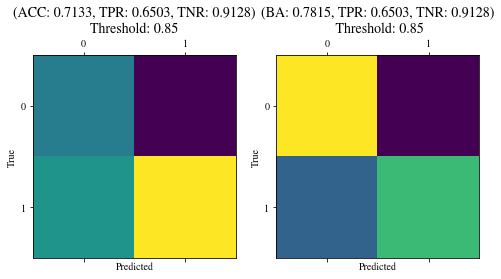

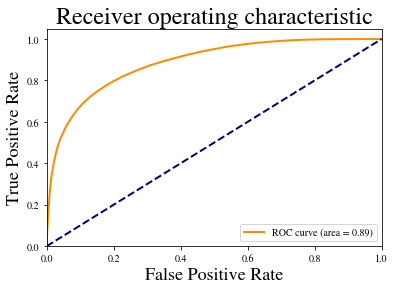

Training epoch 8: 100%|██████████| 12079/12079 [07:50<00:00, 25.67it/s]


Epoch: 8, train loss: 3679.3357
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_8_loss_3679.3357.pt
[0.99653339 0.9973942  0.99950731 ... 0.98883772 0.98296422 0.98685676]
Confusion matrix:
[[ 58825   8875]
 [ 59508 154659]]

Confusion matrix weighted:
[[0.43445347 0.06554653]
 [0.13892897 0.36107103]]

TN: 58825 	 FN: 59508 	 TP: 154659 	 FP: 8875
Confusion matrix scaled:
[[0.20869772 0.03148648]
 [0.21112085 0.54869495]]

Accuracy: 0.7574
Precision: 0.9457
Negative predictive value: 0.4971
Recall: Correctly classifying 72.2142 % of positive edges
True negative rate: Correctly classifying 86.8907 % of all negative edges
F1 score: 0.8189
[0.75770279 0.84635764] [0.86890694 0.72214207] [0.8095036 0.7793313]
Balanced accuracy: 0.7955
Precision weighted: [0.75770279 0.84635764]
Recall weighted: [0.86890694 0.72214207]
F1 score weighted: [0.8095036 0.7793313]
positive_likelihood_ratio: 5.508621737005681, negative_like

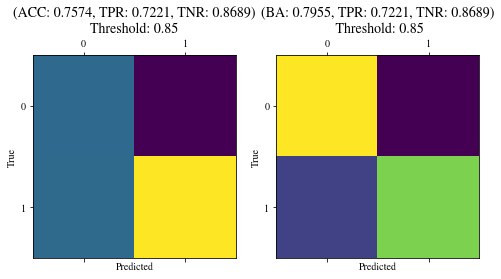

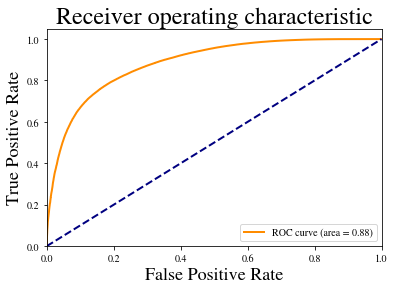

Training epoch 9: 100%|██████████| 12079/12079 [08:00<00:00, 25.13it/s]


Epoch: 9, train loss: 3673.5615
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_9_loss_3673.5615.pt
[0.51805103 0.36260334 0.83096027 ... 0.97325993 0.97147053 0.94298565]
Confusion matrix:
[[ 60631   7069]
 [ 67505 146662]]

Confusion matrix weighted:
[[0.44779173 0.05220827]
 [0.15759898 0.34240102]]

TN: 60631 	 FN: 67505 	 TP: 146662 	 FP: 7069
Confusion matrix scaled:
[[0.215105   0.0250792 ]
 [0.23949238 0.52032341]]

Accuracy: 0.7354
Precision: 0.9540
Negative predictive value: 0.4732
Recall: Correctly classifying 68.4802 % of positive edges
True negative rate: Correctly classifying 89.5583 % of all negative edges
F1 score: 0.7973
[0.73967394 0.8676963 ] [0.89558346 0.68480205] [0.8101963  0.76547611]
Balanced accuracy: 0.7902
Precision weighted: [0.73967394 0.8676963 ]
Recall weighted: [0.89558346 0.68480205]
F1 score weighted: [0.8101963  0.76547611]
positive_likelihood_ratio: 6.5583673195569006, negative

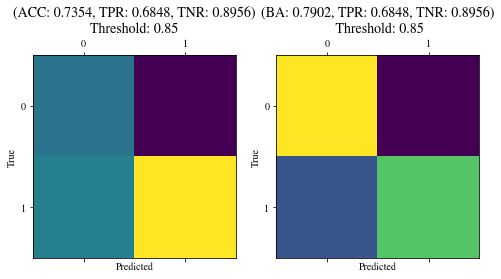

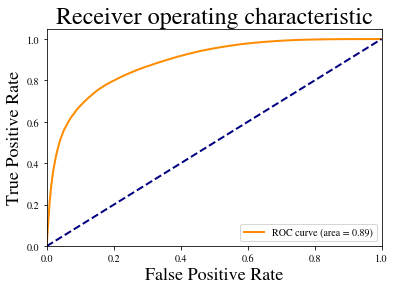

Training epoch 10: 100%|██████████| 12079/12079 [07:44<00:00, 26.01it/s]


Epoch: 10, train loss: 3651.2080
>>> Saving model to /eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2/model_epoch_10_loss_3651.2080.pt
[0.87848926 0.98114747 0.99763262 ... 0.79858702 0.71040106 0.6744743 ]
Confusion matrix:
[[ 61826   5874]
 [ 64162 150005]]

Confusion matrix weighted:
[[0.45661743 0.04338257]
 [0.14979432 0.35020568]]

TN: 61826 	 FN: 64162 	 TP: 150005 	 FP: 5874
Confusion matrix scaled:
[[0.21934458 0.02083962]
 [0.22763218 0.53218362]]

Accuracy: 0.7515
Precision: 0.9623
Negative predictive value: 0.4907
Recall: Correctly classifying 70.0411 % of positive edges
True negative rate: Correctly classifying 91.3235 % of all negative edges
F1 score: 0.8107
[0.75298249 0.88977677] [0.91323486 0.70041136] [0.82540235 0.7838189 ]
Balanced accuracy: 0.8068
Precision weighted: [0.75298249 0.88977677]
Recall weighted: [0.91323486 0.70041136]
F1 score weighted: [0.82540235 0.7838189 ]
positive_likelihood_ratio: 8.072497302536362, negativ

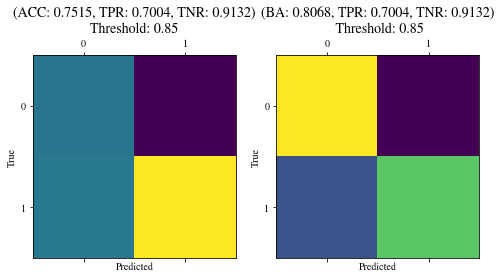

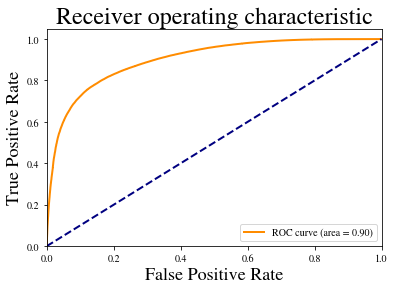

In [26]:
epochs = 10
decision_th = 0.85

outputModelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_L2"
mkdir_p(outputModelPath)

for epoch in range(epochs):
    loss = train_reg(model, optimizer, train_dl, epoch+1, device, edge_features=True,reg = "L2")
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, outputModelPath + "/model.pt")
        
    # Validation
    pred, lab = [], []
    for sample in val_dl:
        sample = sample.to(device)
        
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred, data = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()

    test(np.array(lab), np.array(pred), classification_threshold = decision_th)
    
    scheduler.step()

In [28]:
!pip install pytorch-metric-learning -q 


In [23]:
from pytorch_metric_learning.losses import NTXentLoss
model = GNN_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1], 
                                edge_feature_dim=trainDataset[0].edge_features.shape[1],
                                edge_hidden_dim=32, hidden_dim=32, weighted_aggr=True)
                               #dropout=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = StepLR(optimizer, step_size=20, gamma=0.5)

loss_obj = NTXentLoss(temperature=0.10)
#model.apply(weight_init)

In [24]:
epochs = 10
decision_th = 0.85

outputModelPath = "/eos/user/a/arouyer/SWAN_projects/model_saved/mlp_simple_double_pion_0_PU_33_features_CL"
mkdir_p(outputModelPath)

for epoch in range(epochs):
    loss = train(model, optimizer, train_dl, epoch+1, device, edge_features=True,Contrastive = True)
    print(f'Epoch: {epoch+1}, train loss: {loss:.4f}')
    
    print(f">>> Saving model to {outputModelPath + f'/model_epoch_{epoch+1}_loss_{loss:.4f}.pt'}")
    torch.save({'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, outputModelPath + "/model.pt")
        
    # Validation
    pred, lab = [], []
    for sample in val_dl:
        sample = sample.to(device)
        
        if sample.edge_index.shape[1] != sample.edge_features.shape[0]:
            continue
        data = prepare_network_input_data(sample.x, sample.edge_index, sample.edge_features, device=device)
        nn_pred, data = model(*data, device=device)
        pred += nn_pred.tolist()
        lab += sample.edge_label.tolist()

    test(np.array(lab), np.array(pred), classification_threshold = decision_th)
    
    scheduler.step()

Training epoch 1:   0%|          | 8/12079 [00:00<13:26, 14.97it/s]


RuntimeError: CUDA out of memory. Tried to allocate 46.77 GiB (GPU 0; 14.76 GiB total capacity; 11.72 GiB already allocated; 1.30 GiB free; 11.74 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

# Model Interpretation

In [ ]:
!pip install torch torchvision captum

In [ ]:
from captum.attr import Saliency, IntegratedGradients

In [ ]:
# loading model
model = MLP_TracksterLinkingNet(input_dim = trainDataset[0].x.shape[1])
modelFolder = "./model_saved/gnn_simple_double_pion_0_PU_33_features/"
checkpoint = torch.load(modelFolder + 'model.pt', map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
print(f"Model epoch: {checkpoint['epoch']}")
print(">>> Model Loaded.")
model.eval()

In [ ]:
# test it on some event
# Both ways with the mean predicition values
ev_id = 2
decision_th = 0.8

model.cpu()
t_node, t_pairs, t_scores = truth_pairs(testList, ev_id, thr=decision_th)
p_node, p_pairs, p_scores, nn_score = prediction_pairs(model, testList, ev_id, decision_th, prepare_network_input_data, 
                                                       return_net_out=True, device='cpu')

print(nn_score)
fig = plt.figure(figsize=(7, 5))
fig.suptitle('Distributions of the predictions', size=18) 

ax1 = fig.add_subplot(111)
ax1.set_title('Prediction distribution')
ax1.hist(nn_score.detach().numpy(), bins=20)

x = p_node[:,0].detach().numpy()
y = p_node[:,1].detach().numpy()
z = p_node[:,2].detach().numpy()
E = p_node[:,16].detach().numpy()

t_match = testDataset[ev_id].best_simTs_match
all_edges = testDataset[ev_id].edge_index.T.tolist()

# Network predictions
   
G = nx.Graph()
G.add_edges_from(p_pairs)
G.add_nodes_from(range(len(p_node)))

print(f"Number of connected components (number of Supertracksters): {nx.number_connected_components(G)}")
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

nn_pred_cluster_labels = np.zeros(len(p_node), dtype=np.int64)

for i, s in enumerate(S):
    for n in list(s):
        nn_pred_cluster_labels[n] = i
        
print(f"Predicted cluster labels : {nn_pred_cluster_labels}")

nn_predicted_clusters = [[] for i in range(nx.number_connected_components(G))]

for i, label in enumerate(nn_pred_cluster_labels):
    nn_predicted_clusters[label].append(i)
print(f"predicted clusters : {nn_predicted_clusters}")

truth_cluster_labels = get_truth_labels(testList, ev_id)
num_truth_clusters = int(max(truth_cluster_labels)+1)

truth_clusters = [[] for i in range(num_truth_clusters)]

for t, l in enumerate(truth_cluster_labels):
    truth_clusters[int(l)].append(t)

print(f"truth cluster labels : {truth_cluster_labels.astype(int)}")
print(f"truth clusters : {truth_clusters}")

truth_cluster_energies = []
for t_cluster in truth_clusters:
    clusterE = 0
    for t in t_cluster:
        clusterE += E[t]
    truth_cluster_energies.append(clusterE)

# Only Network
reco_sim_scores, best_sim_matches, pred_cluster_energies = scores_reco_to_sim(nn_predicted_clusters, truth_cluster_labels, truth_cluster_energies, E)

print(f"RECO-SIM scores : {reco_sim_scores}")
print(f"Best SIM matches : {best_sim_matches}")

# t-sne
model.cuda()
# Let's visualize a single event from the training dataset

event = trainDataset[ev_id]

# Run the network
predictions, truth = [], []

sample = event.clone().to(device)

inputs = prepare_network_input_data(sample.x, sample.edge_index, device=device)

link_pred, embs = model(*inputs, device=device)
embs = embs.cpu().detach().numpy()
predictions = link_pred.cpu().detach().numpy()


event_features = event.x.cpu().numpy()
components, predicted_cluster_ids = find_connected_components(event, predictions, thr=decision_th) # PU=True)
#print(components)
#print(predicted_cluster_ids)

tsne = TSNE(random_state=1, n_iter=1000, learning_rate=200.0, init="random") #, metric="cosine")
embs_original = tsne.fit_transform(event_features)

#print(event_features.shape)
#print(embs.shape)
embs_model = tsne.fit_transform(embs)

plot_tsne(event, predicted_cluster_ids, embs_original, event_features[:, 16],
          feature_type='original features', energy_factor=10)

plot_tsne(event, predicted_cluster_ids, embs_model, event_features[:, 16], 
          feature_type='model embeddings', energy_factor=15)

In [ ]:
import seaborn as sns
import pandas as pd
from matplotlib.colors import LogNorm

def model_forward(x, data):
    inp = prepare_network_input_data(x, data.edge_index)
    pred_scores, emb = model(*inp)
    return pred_scores

def explain(method, data, baseline='zero'):
    #input_mask = torch.zeros_like(data.x).requires_grad_(True).to(device)
    #print(input_mask)
    if method == 'ig':
        
        ig = IntegratedGradients(model_forward)
        if baseline=='zero':
            mask = ig.attribute(data.x,
                                additional_forward_args=(data,),
                                internal_batch_size=1)
        if baseline=='rand':
            print(torch.unsqueeze(data.x, dim=0).shape)
            mask = ig.attribute(data.x,
                                additional_forward_args=(data,),
                                baselines=torch.rand(torch.unsqueeze(data.x, dim=0).shape, device=device),
                                target=0,
                                internal_batch_size=1)
            
    elif method == 'saliency':
        saliency = Saliency(model_forward)
        mask = saliency.attribute(data.x,
                                  additional_forward_args=(data,))
    else:
        raise Exception('Unknown explanation method')

    #print(mask)
    #print(mask.shape)
    f_mask = np.abs(mask.cpu().detach().numpy())
    return f_mask

def aggregate_features(f_mask, data):
    f_mask = f_mask.sum(axis=0)
    f_sum = f_mask.sum() 
    if f_sum > 0:  # avoid division by zero
        f_mask = f_mask / f_sum
    return f_mask

def aggregate_nodes(f_mask, data):
    f_mask = f_mask.sum(axis=1)
    f_norm = np.linalg.norm(f_mask) 
    if f_norm > 0:  # avoid division by zero
        f_mask = f_mask / f_norm
    return f_mask

def visualize_features(f_mask, imp_type="Feature", title="", modelFolder=""):
    
    node_feature_names = ["x", "y", "z", "eta", "phi", "eig_x", "eig_y", "eig_z",  "EV1", "EV2", "EV3", 
                 "sigmaPCA_x", "sigmaPCA_y", "sigmaPCA_z", "num_LC", "num_hits", "raw_energy",
                 "raw_em_energy", "photon prob", "electron prob", "muon prob", "neutral_pion prob",
                 "charged_hadron prob", "neutral_hadron prob", "z_min", "z_max", "length", "node inner degree",
                 "degree centrality", "clustering coeffs", "LC_density", "trackster_density", "time"]
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 2.5)
    df = pd.DataFrame([f_mask], columns = node_feature_names)
    #m = np.nanmin(df.replace(0, np.nan).values)
    #print(m)
    #df = df.replace(0, m/100)
    #print(df)

    plt.title(f"Feature Importance {title}", fontsize=25)
    cmap = sns.diverging_palette(h_neg=10, h_pos=130, s=99,
                             l=55, sep=3, as_cmap=True)
    sns.heatmap(df, ax=ax, cmap=cmap, annot=True, norm=LogNorm(), annot_kws={"fontsize":15, 'rotation': 90})
    ax.get_yaxis().set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=17)

    if modelFolder != "":
        plt.savefig(f'{modelFolder}/Feature_Importance_{title}.pdf', dpi=300, bbox_inches='tight', transparent=True)
        plt.savefig(f'{modelFolder}/Feature_Importance_{title}.png', dpi=300, bbox_inches='tight', transparent=True)
    
    #plt.xticks(rotation=-45, ha='right')
    plt.show()
    
def visualize_nodes(node_imp, data):
    # plot event & make the color correspond to importance
    pass
    

# model.cuda()
# model.to('cuda')
data = testDataset[ev_id].to(device)
inp = prepare_network_input_data(data.x, data.edge_index)
pred_scores, emb = model(*inp, device=device)
print(f"Predictions: {pred_scores}")

for title, method in [('Integrated Gradients', 'ig'), ('Saliency', 'saliency')]:
    # Integrated gradients with respect to each input feature. attributions will
    # always be the same size as the provided inputs, with each value providing the attribution
    # of the corresponding input index. If a single tensor is provided as inputs, a single tensor is returned. 
    # If a tuple is provided for inputs, a tuple of corresponding sized tensors is returned.
    f_mask = explain(method, data)
    features_imp = aggregate_features(f_mask, data)
    node_imp = aggregate_nodes(f_mask, data)
    visualize_features(features_imp, "Feature", title, modelFolder)
    #visualize_features(node_imp, "Node", title)
    
# f_mask = explain('ig', data, "rand")
# features_imp = aggregate_features(f_mask, data)
# node_imp = aggregate_nodes(f_mask, data)
# visualize_features(features_imp, "Feature", 'Integrated Gradients')

# Experiments: faster Edge Conv with Attention

In [67]:
import torch

X = torch.tensor([[0, 0 , 1], [0, 1, 2], [3, 2, 0], [5, 3, 4]], dtype=float)
edge_index = torch.tensor([[0, 1, 1], [1, 2, 3]])
alpha = torch.tensor([0.5, 0.3, 0.7], dtype=float)

def NN(EDGE_EMB):
    B, N2 = EDGE_EMB.shape
    return EDGE_EMB[:, int(N2/2):]

N, F = X.shape
E = edge_index.shape[1]
print(N, F, E) # expect 4, 3, 3

4 3 3


In [57]:
ONES = torch.eye(N, N)

print(edge_index)

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = 1
    S[i, s] = 1

SRC = torch.cat((ONES, S, D), dim=0)
DST = torch.cat((ONES, D, S), dim=0)

print(f"SRC:\n{SRC}")
print(f"DST:\n{DST}")

EDGE_EMB = torch.cat((torch.matmul(SRC, X), torch.matmul(DST-SRC, X)), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")
X_new = X + torch.matmul(SRC.T, NN(EDGE_EMB))
print(f"X:\n{X}")

print(f"X new:\n{X_new}")


tensor([[0, 1, 1],
        [1, 2, 3]])
SRC:
tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.]], dtype=torch.float64)
DST:
tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.]], dtype=torch.float64)
EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.

In [52]:
#%debug
# Input Prep Block: ------------------------------------------------
ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = alpha[i]
    S[i, s] = alpha[i]

SRC = torch.cat((ONES, S, D), dim=0)
# -----------------------------------------------------

# Edge Conv Block -------------------------------------
EDGE_EMB_p1 = X[ind_p1, :]
EDGE_EMB_p2 = X[ind_p2, :] - EDGE_EMB_p1

EDGE_EMB = torch.cat((EDGE_EMB_p1, EDGE_EMB_p2), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")

X_new = X + torch.matmul(SRC.T, NN(EDGE_EMB))
print(f"X:\n{X}")
print(f"X new:\n{X_new}")

EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.,  4., -5., -2., -2.]], dtype=torch.float64)
X:
tensor([[0., 0., 1.],
        [0., 1., 2.],
        [3., 2., 0.],
        [5., 3., 4.]], dtype=torch.float64)
X new:
tensor([[0.0000, 0.5000, 1.5000],
        [4.4000, 2.2000, 2.3000],
        [2.1000, 1.7000, 0.6000],
        [1.5000, 1.6000, 2.6000]], dtype=torch.float64)


/tmp/ipykernel_4979/3418449121.py:3: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
/tmp/ipykernel_4979/3418449121.py:4: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))


In [58]:
print(SRC)
print(EDGE_EMB[: , 3:])

tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.]], dtype=torch.float64)
tensor([[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  1.,  1.],
        [ 3.,  1., -2.],
        [ 5.,  2.,  2.],
        [ 0., -1., -1.],
        [-3., -1.,  2.],
        [-5., -2., -2.]], dtype=torch.float64)


In [68]:
#%debug
# Input Prep Block: ------------------------------------------------
ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = 1
    S[i, s] = 1

SRC = torch.cat((ONES, S, D), dim=0)
# -----------------------------------------------------

# Edge Conv Block -------------------------------------
EDGE_EMB_p1 = X[ind_p1, :]
EDGE_EMB_p2 = X[ind_p2, :] - EDGE_EMB_p1

print(SRC.T.shape)
alpha_matrix = torch.diag(torch.cat([torch.ones(N, dtype=float), alpha, alpha]))
print(alpha_matrix.shape)


EDGE_EMB = torch.cat((EDGE_EMB_p1, EDGE_EMB_p2), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")

X_new = X + torch.matmul(torch.matmul(SRC.T, alpha_matrix), NN(EDGE_EMB))
print(f"X:\n{X}")
print(f"X new:\n{X_new}")

torch.Size([4, 10])
torch.Size([10, 10])
EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.,  4., -5., -2., -2.]], dtype=torch.float64)
X:
tensor([[0., 0., 1.],
        [0., 1., 2.],
        [3., 2., 0.],
        [5., 3., 4.]], dtype=torch.float64)
X new:
tensor([[0.0000, 0.5000, 1.5000],
        [4.4000, 2.2000, 2.3000],
        [2.1000, 1.7000, 0.6000],
        [1.5000, 1.6000, 2.6000]], dtype=torch.float64)


/tmp/ipykernel_4979/1116856857.py:3: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
/tmp/ipykernel_4979/1116856857.py:4: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))


In [97]:
#%debug
# Input Prep Block: ------------------------------------------------
ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = 1
    S[i, s] = 1

SRC = torch.cat((ONES, S, D), dim=0)
# -----------------------------------------------------

# Edge Conv Block -------------------------------------
EDGE_EMB_p1 = X[ind_p1, :]
EDGE_EMB_p2 = X[ind_p2, :] - EDGE_EMB_p1

alpha_vec = torch.cat([torch.ones(N, dtype=float), alpha, alpha])

EDGE_EMB = torch.cat((EDGE_EMB_p1, EDGE_EMB_p2), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")


print(f"Here {(alpha_vec * NN(EDGE_EMB).T).T}")

X_new = X + torch.matmul(SRC.T, (alpha_vec * NN(EDGE_EMB).T).T)
print(f"X:\n{X}")
print(f"X new:\n{X_new}")

EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.,  4., -5., -2., -2.]], dtype=torch.float64)
Here tensor([[ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.5000,  0.5000],
        [ 0.9000,  0.3000, -0.6000],
        [ 3.5000,  1.4000,  1.4000],
        [ 0.0000, -0.5000, -0.5000],
        [-0.9000, -0.3000,  0.6000],
        [-3.5000, -1.4000, -1.4000]], dtype=torch.float64)
X:
tensor([[0., 0., 1.],
        [0., 1., 2.],
        [3., 2., 0.],
        [5., 3., 4.]], dtype=torch.float64)
X new:
tensor([[0.0000, 0.5000, 1.5000],
        [4.4000, 

/tmp/ipykernel_4979/3457034088.py:3: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
/tmp/ipykernel_4979/3457034088.py:4: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))


In [102]:
#%debug
# Input Prep Block: ------------------------------------------------
ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = 1
    S[i, s] = 1

SRC = torch.cat((ONES, S, D), dim=0)
# -----------------------------------------------------

# Edge Conv Block -------------------------------------
EDGE_EMB_p1 = X[ind_p1, :]
EDGE_EMB_p2 = X[ind_p2, :] - EDGE_EMB_p1

alpha_vec = torch.cat([torch.ones(N, dtype=float), alpha, alpha])

EDGE_EMB = torch.cat((EDGE_EMB_p1, EDGE_EMB_p2), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")


#print(alpha_vec * NN(EDGE_EMB).T)

#print(torch.mul(alpha_vec, NN(EDGE_EMB).T).T)

X_new = X + torch.matmul(SRC.T, torch.mul(alpha_vec, NN(EDGE_EMB).T).T)
print(f"X:\n{X}")
print(f"X new:\n{X_new}")

EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.,  4., -5., -2., -2.]], dtype=torch.float64)
X:
tensor([[0., 0., 1.],
        [0., 1., 2.],
        [3., 2., 0.],
        [5., 3., 4.]], dtype=torch.float64)
X new:
tensor([[0.0000, 0.5000, 1.5000],
        [4.4000, 2.2000, 2.3000],
        [2.1000, 1.7000, 0.6000],
        [1.5000, 1.6000, 2.6000]], dtype=torch.float64)


/tmp/ipykernel_4979/3495689323.py:3: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
/tmp/ipykernel_4979/3495689323.py:4: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))


In [133]:
import numpy as np
#%debug
# Input Prep Block: ------------------------------------------------
ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))

S = torch.zeros(E, N, dtype=float)
D = torch.zeros(E, N, dtype=float)

for i, (s, d) in enumerate(edge_index.T):
    D[i, d] = 1
    S[i, s] = 1

SRC = torch.cat((ONES, S, D), dim=0)


src_idx = [torch.where(ind_p1 == i)[0].tolist() for i in torch.unique(ind_p1)]
src_idx_flat = [item for sublist in src_idx for item in sublist]
print(src_idx)
# -----------------------------------------------------

# Edge Conv Block -------------------------------------
EDGE_EMB_p1 = X[ind_p1, :]
EDGE_EMB_p2 = X[ind_p2, :] - EDGE_EMB_p1

alpha_vec = torch.cat([torch.ones(N, dtype=float), alpha, alpha])

EDGE_EMB = torch.cat((EDGE_EMB_p1, EDGE_EMB_p2), dim=1)
print(f"EDGE_EMB:\n{EDGE_EMB}")


#print(alpha_vec * NN(EDGE_EMB).T)

#print(torch.mul(alpha_vec, NN(EDGE_EMB).T).T)
X_NN = torch.mul(alpha_vec, NN(EDGE_EMB).T).T

print(X_NN)
#print(src_idx_flat)
X_NN_AGGR = torch.sum(X_NN, dim=(0,src_idx)) 
#X_NN_AGGR_2 = X_NN_AGGR.reshape(len(src_idx), -1, X_NN.shape[1])
print(X_NN_AGGR)

#X_new = X + X_NN_AGGR
#print(f"X:\n{X}")
#print(f"X new:\n{X_new}")

[[0, 4], [1, 5, 6, 7], [2, 8], [3, 9]]
EDGE_EMB:
tensor([[ 0.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  0.,  0.,  0.],
        [ 3.,  2.,  0.,  0.,  0.,  0.],
        [ 5.,  3.,  4.,  0.,  0.,  0.],
        [ 0.,  0.,  1.,  0.,  1.,  1.],
        [ 0.,  1.,  2.,  3.,  1., -2.],
        [ 0.,  1.,  2.,  5.,  2.,  2.],
        [ 0.,  1.,  2.,  0., -1., -1.],
        [ 3.,  2.,  0., -3., -1.,  2.],
        [ 5.,  3.,  4., -5., -2., -2.]], dtype=torch.float64)
tensor([[ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.5000,  0.5000],
        [ 0.9000,  0.3000, -0.6000],
        [ 3.5000,  1.4000,  1.4000],
        [ 0.0000, -0.5000, -0.5000],
        [-0.9000, -0.3000,  0.6000],
        [-3.5000, -1.4000, -1.4000]], dtype=torch.float64)


/tmp/ipykernel_4979/4107786669.py:4: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p1 = torch.cat((torch.range(0, N-1, dtype=int), src, dst))
/tmp/ipykernel_4979/4107786669.py:5: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  ind_p2 = torch.cat((torch.range(0, N-1, dtype=int), dst, src))


TypeError: sum(): argument 'dim' must be tuple of ints, but found element of type list at pos 2